# Logistic Regression with a Neural Network mindset

Welcome to your first (required) programming assignment! You will build a logistic regression classifier to recognize  cats. This assignment will step you through how to do this with a Neural Network mindset, and so will also hone your intuitions about deep learning.

**Instructions:**
- Do not use loops (for/while) in your code, unless the instructions explicitly ask you to do so.

**You will learn to:**
- Build the general architecture of a learning algorithm, including:
    - Initializing parameters
    - Calculating the cost function and its gradient
    - Using an optimization algorithm (gradient descent) 
- Gather all three functions above into a main model function, in the right order.

## <font color='darkblue'>Updates</font>
This notebook has been updated over the past few months.  The prior version was named "v5", and the current versionis now named '6a'

#### If you were working on a previous version:
* You can find your prior work by looking in the file directory for the older files (named by version name).
* To view the file directory, click on the "Coursera" icon in the top left corner of this notebook.
* Please copy your work from the older versions to the new version, in order to submit your work for grading.

#### List of Updates
* Forward propagation formula, indexing now starts at 1 instead of 0.
* Optimization function comment now says "print cost every 100 training iterations" instead of "examples".
* Fixed grammar in the comments.
* Y_prediction_test variable name is used consistently.
* Plot's axis label now says "iterations (hundred)" instead of "iterations".
* When testing the model, the test image is normalized by dividing by 255.

## 1 - Packages ##

First, let's run the cell below to import all the packages that you will need during this assignment. 
- [numpy](www.numpy.org) is the fundamental package for scientific computing with Python.
- [h5py](http://www.h5py.org) is a common package to interact with a dataset that is stored on an H5 file.
- [matplotlib](http://matplotlib.org) is a famous library to plot graphs in Python.
- [PIL](http://www.pythonware.com/products/pil/) and [scipy](https://www.scipy.org/) are used here to test your model with your own picture at the end.

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import scipy
from PIL import Image
from scipy import ndimage
from lr_utils import load_dataset

%matplotlib inline

## 2 - Overview of the Problem set ##

**Problem Statement**: You are given a dataset ("data.h5") containing:
    - a training set of m_train images labeled as cat (y=1) or non-cat (y=0)
    - a test set of m_test images labeled as cat or non-cat
    - each image is of shape (num_px, num_px, 3) where 3 is for the 3 channels (RGB). Thus, each image is square (height = num_px) and (width = num_px).

You will build a simple image-recognition algorithm that can correctly classify pictures as cat or non-cat.

Let's get more familiar with the dataset. Load the data by running the following code.

In [4]:
# Loading the data (cat/non-cat)
train_set_x_orig, train_set_y, test_set_x_orig, test_set_y, classes = load_dataset()

We added "_orig" at the end of image datasets (train and test) because we are going to preprocess them. After preprocessing, we will end up with train_set_x and test_set_x (the labels train_set_y and test_set_y don't need any preprocessing).

Each line of your train_set_x_orig and test_set_x_orig is an array representing an image. You can visualize an example by running the following code. Feel free also to change the `index` value and re-run to see other images. 

y = [1], it's a 'cat' picture.


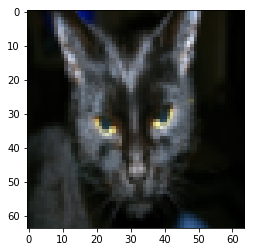

In [5]:
# Example of a picture
index = 25
plt.imshow(train_set_x_orig[index])
print ("y = " + str(train_set_y[:, index]) + ", it's a '" + classes[np.squeeze(train_set_y[:, index])].decode("utf-8") +  "' picture.")

Many software bugs in deep learning come from having matrix/vector dimensions that don't fit. If you can keep your matrix/vector dimensions straight you will go a long way toward eliminating many bugs. 

**Exercise:** Find the values for:
    - m_train (number of training examples)
    - m_test (number of test examples)
    - num_px (= height = width of a training image)
Remember that `train_set_x_orig` is a numpy-array of shape (m_train, num_px, num_px, 3). For instance, you can access `m_train` by writing `train_set_x_orig.shape[0]`.

In [6]:
### START CODE HERE ### (≈ 3 lines of code)
m_train = train_set_x_orig.shape[0]
m_test = test_set_x_orig.shape[0]
num_px = train_set_x_orig.shape[1]
### END CODE HERE ###

print ("Number of training examples: m_train = " + str(m_train))
print ("Number of testing examples: m_test = " + str(m_test))
print ("Height/Width of each image: num_px = " + str(num_px))
print ("Each image is of size: (" + str(num_px) + ", " + str(num_px) + ", 3)")
print ("train_set_x shape: " + str(train_set_x_orig.shape))
print ("train_set_y shape: " + str(train_set_y.shape))
print ("test_set_x shape: " + str(test_set_x_orig.shape))
print ("test_set_y shape: " + str(test_set_y.shape))

Number of training examples: m_train = 209
Number of testing examples: m_test = 50
Height/Width of each image: num_px = 64
Each image is of size: (64, 64, 3)
train_set_x shape: (209, 64, 64, 3)
train_set_y shape: (1, 209)
test_set_x shape: (50, 64, 64, 3)
test_set_y shape: (1, 50)


**Expected Output for m_train, m_test and num_px**: 
<table style="width:15%">
  <tr>
    <td>**m_train**</td>
    <td> 209 </td> 
  </tr>
  
  <tr>
    <td>**m_test**</td>
    <td> 50 </td> 
  </tr>
  
  <tr>
    <td>**num_px**</td>
    <td> 64 </td> 
  </tr>
  
</table>


For convenience, you should now reshape images of shape (num_px, num_px, 3) in a numpy-array of shape (num_px $*$ num_px $*$ 3, 1). After this, our training (and test) dataset is a numpy-array where each column represents a flattened image. There should be m_train (respectively m_test) columns.

**Exercise:** Reshape the training and test data sets so that images of size (num_px, num_px, 3) are flattened into single vectors of shape (num\_px $*$ num\_px $*$ 3, 1).

A trick when you want to flatten a matrix X of shape (a,b,c,d) to a matrix X_flatten of shape (b$*$c$*$d, a) is to use: 
```python
X_flatten = X.reshape(X.shape[0], -1).T      # X.T is the transpose of X
```

In [7]:
# Reshape the training and test examples

### START CODE HERE ### (≈ 2 lines of code)
train_set_x_flatten = train_set_x_orig.reshape(train_set_x_orig.shape[0], -1).T
test_set_x_flatten = test_set_x_orig.reshape(test_set_x_orig.shape[0], -1).T
### END CODE HERE ###

print ("train_set_x_flatten shape: " + str(train_set_x_flatten.shape))
print ("train_set_y shape: " + str(train_set_y.shape))
print ("test_set_x_flatten shape: " + str(test_set_x_flatten.shape))
print ("test_set_y shape: " + str(test_set_y.shape))
print ("sanity check after reshaping: " + str(train_set_x_flatten[0:5,0]))

train_set_x_flatten shape: (12288, 209)
train_set_y shape: (1, 209)
test_set_x_flatten shape: (12288, 50)
test_set_y shape: (1, 50)
sanity check after reshaping: [17 31 56 22 33]


**Expected Output**: 

<table style="width:35%">
  <tr>
    <td>**train_set_x_flatten shape**</td>
    <td> (12288, 209)</td> 
  </tr>
  <tr>
    <td>**train_set_y shape**</td>
    <td>(1, 209)</td> 
  </tr>
  <tr>
    <td>**test_set_x_flatten shape**</td>
    <td>(12288, 50)</td> 
  </tr>
  <tr>
    <td>**test_set_y shape**</td>
    <td>(1, 50)</td> 
  </tr>
  <tr>
  <td>**sanity check after reshaping**</td>
  <td>[17 31 56 22 33]</td> 
  </tr>
</table>

To represent color images, the red, green and blue channels (RGB) must be specified for each pixel, and so the pixel value is actually a vector of three numbers ranging from 0 to 255.

One common preprocessing step in machine learning is to center and standardize your dataset, meaning that you substract the mean of the whole numpy array from each example, and then divide each example by the standard deviation of the whole numpy array. But for picture datasets, it is simpler and more convenient and works almost as well to just divide every row of the dataset by 255 (the maximum value of a pixel channel).

<!-- During the training of your model, you're going to multiply weights and add biases to some initial inputs in order to observe neuron activations. Then you backpropogate with the gradients to train the model. But, it is extremely important for each feature to have a similar range such that our gradients don't explode. You will see that more in detail later in the lectures. !--> 

Let's standardize our dataset.

In [8]:
train_set_x = train_set_x_flatten/255.
test_set_x = test_set_x_flatten/255.

<font color='blue'>
**What you need to remember:**

Common steps for pre-processing a new dataset are:
- Figure out the dimensions and shapes of the problem (m_train, m_test, num_px, ...)
- Reshape the datasets such that each example is now a vector of size (num_px \* num_px \* 3, 1)
- "Standardize" the data

## 3 - General Architecture of the learning algorithm ##

It's time to design a simple algorithm to distinguish cat images from non-cat images.

You will build a Logistic Regression, using a Neural Network mindset. The following Figure explains why **Logistic Regression is actually a very simple Neural Network!**

<img src="images/LogReg_kiank.png" style="width:650px;height:400px;">

**Mathematical expression of the algorithm**:

For one example $x^{(i)}$:
$$z^{(i)} = w^T x^{(i)} + b \tag{1}$$
$$\hat{y}^{(i)} = a^{(i)} = sigmoid(z^{(i)})\tag{2}$$ 
$$ \mathcal{L}(a^{(i)}, y^{(i)}) =  - y^{(i)}  \log(a^{(i)}) - (1-y^{(i)} )  \log(1-a^{(i)})\tag{3}$$

The cost is then computed by summing over all training examples:
$$ J = \frac{1}{m} \sum_{i=1}^m \mathcal{L}(a^{(i)}, y^{(i)})\tag{6}$$

**Key steps**:
In this exercise, you will carry out the following steps: 
    - Initialize the parameters of the model
    - Learn the parameters for the model by minimizing the cost  
    - Use the learned parameters to make predictions (on the test set)
    - Analyse the results and conclude

## 4 - Building the parts of our algorithm ## 

The main steps for building a Neural Network are:
1. Define the model structure (such as number of input features) 
2. Initialize the model's parameters
3. Loop:
    - Calculate current loss (forward propagation)
    - Calculate current gradient (backward propagation)
    - Update parameters (gradient descent)

You often build 1-3 separately and integrate them into one function we call `model()`.

### 4.1 - Helper functions

**Exercise**: Using your code from "Python Basics", implement `sigmoid()`. As you've seen in the figure above, you need to compute $sigmoid( w^T x + b) = \frac{1}{1 + e^{-(w^T x + b)}}$ to make predictions. Use np.exp().

In [9]:
# GRADED FUNCTION: sigmoid

def sigmoid(z):
    """
    Compute the sigmoid of z

    Arguments:
    z -- A scalar or numpy array of any size.

    Return:
    s -- sigmoid(z)
    """

    ### START CODE HERE ### (≈ 1 line of code)
    s = 1 / (1 + np.exp(-z))
    ### END CODE HERE ###
    
    return s

In [10]:
print ("sigmoid([0, 2]) = " + str(sigmoid(np.array([0,2]))))

sigmoid([0, 2]) = [ 0.5         0.88079708]


**Expected Output**: 

<table>
  <tr>
    <td>**sigmoid([0, 2])**</td>
    <td> [ 0.5         0.88079708]</td> 
  </tr>
</table>

### 4.2 - Initializing parameters

**Exercise:** Implement parameter initialization in the cell below. You have to initialize w as a vector of zeros. If you don't know what numpy function to use, look up np.zeros() in the Numpy library's documentation.

In [11]:
# GRADED FUNCTION: initialize_with_zeros

def initialize_with_zeros(dim):
    """
    This function creates a vector of zeros of shape (dim, 1) for w and initializes b to 0.
    
    Argument:
    dim -- size of the w vector we want (or number of parameters in this case)
    
    Returns:
    w -- initialized vector of shape (dim, 1)
    b -- initialized scalar (corresponds to the bias)
    """
    
    ### START CODE HERE ### (≈ 1 line of code)
    w = np.zeros((dim,1))
    b = 0
    ### END CODE HERE ###

    assert(w.shape == (dim, 1))
    assert(isinstance(b, float) or isinstance(b, int))
    
    return w, b

In [12]:
dim = 2
w, b = initialize_with_zeros(dim)
print ("w = " + str(w))
print ("b = " + str(b))

w = [[ 0.]
 [ 0.]]
b = 0


**Expected Output**: 


<table style="width:15%">
    <tr>
        <td>  ** w **  </td>
        <td> [[ 0.]
 [ 0.]] </td>
    </tr>
    <tr>
        <td>  ** b **  </td>
        <td> 0 </td>
    </tr>
</table>

For image inputs, w will be of shape (num_px $\times$ num_px $\times$ 3, 1).

### 4.3 - Forward and Backward propagation

Now that your parameters are initialized, you can do the "forward" and "backward" propagation steps for learning the parameters.

**Exercise:** Implement a function `propagate()` that computes the cost function and its gradient.

**Hints**:

Forward Propagation:
- You get X
- You compute $A = \sigma(w^T X + b) = (a^{(1)}, a^{(2)}, ..., a^{(m-1)}, a^{(m)})$
- You calculate the cost function: $J = -\frac{1}{m}\sum_{i=1}^{m}y^{(i)}\log(a^{(i)})+(1-y^{(i)})\log(1-a^{(i)})$

Here are the two formulas you will be using: 

$$ \frac{\partial J}{\partial w} = \frac{1}{m}X(A-Y)^T\tag{7}$$
$$ \frac{\partial J}{\partial b} = \frac{1}{m} \sum_{i=1}^m (a^{(i)}-y^{(i)})\tag{8}$$

In [35]:
# GRADED FUNCTION: propagate

def propagate(w, b, X, Y):
    """
    Implement the cost function and its gradient for the propagation explained above

    Arguments:
    w -- weights, a numpy array of size (num_px * num_px * 3, 1)
    b -- bias, a scalar
    X -- data of size (num_px * num_px * 3, number of examples)
    Y -- true "label" vector (containing 0 if non-cat, 1 if cat) of size (1, number of examples)

    Return:
    cost -- negative log-likelihood cost for logistic regression
    dw -- gradient of the loss with respect to w, thus same shape as w
    db -- gradient of the loss with respect to b, thus same shape as b
    
    Tips:
    - Write your code step by step for the propagation. np.log(), np.dot()
    """
    
    m = X.shape[1]
    
    # FORWARD PROPAGATION (FROM X TO COST)
    ### START CODE HERE ### (≈ 2 lines of code)
    A = sigmoid(np.dot(w.T,X) + b)                      # compute activation 
    cost = -(1/m) * np.sum(Y * np.log(A) + (1-Y) * np.log(1-A))        # compute cost
    ### END CODE HERE ###
    
    # BACKWARD PROPAGATION (TO FIND GRAD)
    ### START CODE HERE ### (≈ 2 lines of code)
    dw = (1 / m) * np.dot(X, (A - Y).T)
    db = (1 / m) * np.sum(A - Y)
    ### END CODE HERE ###

    assert(dw.shape == w.shape)
    assert(db.dtype == float)
    cost = np.squeeze(cost)
    assert(cost.shape == ())
    
    grads = {"dw": dw,
             "db": db}

    return grads, cost

In [36]:
w, b, X, Y = np.array([[1.],[2.]]), 2., np.array([[1.,2.,-1.],[3.,4.,-3.2]]), np.array([[1,0,1]])
grads, cost = propagate(w, b, X, Y)
print ("dw = " + str(grads["dw"]))
print ("db = " + str(grads["db"]))
print ("cost = " + str(cost))

dw = [[ 0.99845601]
 [ 2.39507239]]
db = 0.00145557813678
cost = 5.80154531939


**Expected Output**:

<table style="width:50%">
    <tr>
        <td>  ** dw **  </td>
      <td> [[ 0.99845601]
     [ 2.39507239]]</td>
    </tr>
    <tr>
        <td>  ** db **  </td>
        <td> 0.00145557813678 </td>
    </tr>
    <tr>
        <td>  ** cost **  </td>
        <td> 5.801545319394553 </td>
    </tr>

</table>

### 4.4 - Optimization
- You have initialized your parameters.
- You are also able to compute a cost function and its gradient.
- Now, you want to update the parameters using gradient descent.

**Exercise:** Write down the optimization function. The goal is to learn $w$ and $b$ by minimizing the cost function $J$. For a parameter $\theta$, the update rule is $ \theta = \theta - \alpha \text{ } d\theta$, where $\alpha$ is the learning rate.

In [37]:
# GRADED FUNCTION: optimize

def optimize(w, b, X, Y, num_iterations, learning_rate, print_cost = False):
    """
    This function optimizes w and b by running a gradient descent algorithm
    
    Arguments:
    w -- weights, a numpy array of size (num_px * num_px * 3, 1)
    b -- bias, a scalar
    X -- data of shape (num_px * num_px * 3, number of examples)
    Y -- true "label" vector (containing 0 if non-cat, 1 if cat), of shape (1, number of examples)
    num_iterations -- number of iterations of the optimization loop
    learning_rate -- learning rate of the gradient descent update rule
    print_cost -- True to print the loss every 100 steps
    
    Returns:
    params -- dictionary containing the weights w and bias b
    grads -- dictionary containing the gradients of the weights and bias with respect to the cost function
    costs -- list of all the costs computed during the optimization, this will be used to plot the learning curve.
    
    Tips:
    You basically need to write down two steps and iterate through them:
        1) Calculate the cost and the gradient for the current parameters. Use propagate().
        2) Update the parameters using gradient descent rule for w and b.
    """
    
    costs = []
    
    for i in range(num_iterations):
        
        
        # Cost and gradient calculation (≈ 1-4 lines of code)
        ### START CODE HERE ### 
        grads, cost = propagate(w,b,X,Y)        
        ### END CODE HERE ###
        
        # Retrieve derivatives from grads
        dw = grads["dw"]
        db = grads["db"]
        
        # update rule (≈ 2 lines of code)
        ### START CODE HERE ###
        w = w - learning_rate * dw
        b = b - learning_rate * db
        ### END CODE HERE ###
        
        # Record the costs
        if i % 100 == 0:
            costs.append(cost)
        
        # Print the cost every 100 training iterations
        if print_cost and i % 100 == 0:
            print ("Cost after iteration %i: %f" %(i, cost))
    
    params = {"w": w,
              "b": b}
    
    grads = {"dw": dw,
             "db": db}
    
    return params, grads, costs

In [38]:
params, grads, costs = optimize(w, b, X, Y, num_iterations= 100, learning_rate = 0.009, print_cost = False)
print ("w = " + str(params["w"]))
print ("b = " + str(params["b"]))
print ("dw = " + str(grads["dw"]))
print ("db = " + str(grads["db"]))

w = [[ 0.19033591]
 [ 0.12259159]]
b = 1.92535983008
dw = [[ 0.67752042]
 [ 1.41625495]]
db = 0.219194504541


**Expected Output**: 

<table style="width:40%">
    <tr>
       <td> **w** </td>
       <td>[[ 0.19033591]
 [ 0.12259159]] </td>
    </tr>
    
    <tr>
       <td> **b** </td>
       <td> 1.92535983008 </td>
    </tr>
    <tr>
       <td> **dw** </td>
       <td> [[ 0.67752042]
 [ 1.41625495]] </td>
    </tr>
    <tr>
       <td> **db** </td>
       <td> 0.219194504541 </td>
    </tr>

</table>

**Exercise:** The previous function will output the learned w and b. We are able to use w and b to predict the labels for a dataset X. Implement the `predict()` function. There are two steps to computing predictions:

1. Calculate $\hat{Y} = A = \sigma(w^T X + b)$

2. Convert the entries of a into 0 (if activation <= 0.5) or 1 (if activation > 0.5), stores the predictions in a vector `Y_prediction`. If you wish, you can use an `if`/`else` statement in a `for` loop (though there is also a way to vectorize this). 

In [17]:
# GRADED FUNCTION: predict
def predict(w, b, X):
    '''
    Predict whether the label is 0 or 1 using learned logistic regression parameters (w, b)
    
    Arguments:
    w -- weights, a numpy array of size (num_px * num_px * 3, 1)
    b -- bias, a scalar
    X -- data of size (num_px * num_px * 3, number of examples)
    
    Returns:
    Y_prediction -- a numpy array (vector) containing all predictions (0/1) for the examples in X
    '''
    
    m = X.shape[1]
    Y_prediction = np.zeros((1,m))
    w = w.reshape(X.shape[0], 1)
    
    # Compute vector "A" predicting the probabilities of a cat being present in the picture
    ### START CODE HERE ### (≈ 1 line of code)
    A = sigmoid(np.dot(w.T,X)+b)
    ### END CODE HERE ###
    
    for i in range(A.shape[1]):
        
        # Convert probabilities A[0,i] to actual predictions p[0,i]
        ### START CODE HERE ### (≈ 4 lines of code)
        Y_prediction[0, i] = 1 if A[0, i] > 0.5 else 0
        ### END CODE HERE ###
    
    assert(Y_prediction.shape == (1, m))
    
    return Y_prediction

In [18]:
w = np.array([[0.1124579],[0.23106775]])
b = -0.3
X = np.array([[1.,-1.1,-3.2],[1.2,2.,0.1]])
print ("predictions = " + str(predict(w, b, X)))

predictions = [[ 1.  1.  0.]]


**Expected Output**: 

<table style="width:30%">
    <tr>
         <td>
             **predictions**
         </td>
          <td>
            [[ 1.  1.  0.]]
         </td>  
   </tr>

</table>


<font color='blue'>
**What to remember:**
You've implemented several functions that:
- Initialize (w,b)
- Optimize the loss iteratively to learn parameters (w,b):
    - computing the cost and its gradient 
    - updating the parameters using gradient descent
- Use the learned (w,b) to predict the labels for a given set of examples

## 5 - Merge all functions into a model ##

You will now see how the overall model is structured by putting together all the building blocks (functions implemented in the previous parts) together, in the right order.

**Exercise:** Implement the model function. Use the following notation:
    - Y_prediction_test for your predictions on the test set
    - Y_prediction_train for your predictions on the train set
    - w, costs, grads for the outputs of optimize()

In [19]:
# GRADED FUNCTION: model
def model(X_train, Y_train, X_test, Y_test, num_iterations = 2000, learning_rate = 0.5, print_cost = False):
    """
    Builds the logistic regression model by calling the function you've implemented previously
    
    Arguments:
    X_train -- training set represented by a numpy array of shape (num_px * num_px * 3, m_train)
    Y_train -- training labels represented by a numpy array (vector) of shape (1, m_train)
    X_test -- test set represented by a numpy array of shape (num_px * num_px * 3, m_test)
    Y_test -- test labels represented by a numpy array (vector) of shape (1, m_test)
    num_iterations -- hyperparameter representing the number of iterations to optimize the parameters
    learning_rate -- hyperparameter representing the learning rate used in the update rule of optimize()
    print_cost -- Set to true to print the cost every 100 iterations
    
    Returns:
    d -- dictionary containing information about the model.
    """
    
    ### START CODE HERE ###
    
    # initialize parameters with zeros (≈ 1 line of code)
    w, b = initialize_with_zeros(X_train.shape[0])

    # Gradient descent (≈ 1 line of code)
    parameters, grads, costs = optimize(w,b,X_train, Y_train, num_iterations,learning_rate,print_cost)
    
    # Retrieve parameters w and b from dictionary "parameters"
    w = parameters["w"]
    b = parameters["b"]
    
    # Predict test/train set examples (≈ 2 lines of code)
    Y_prediction_test = predict(w, b, X_test)
    Y_prediction_train = predict(w, b, X_train)    
    ### END CODE HERE ###
    
    # Print train/test Errors
    print("train accuracy: {} %".format(100 - np.mean(np.abs(Y_prediction_train - Y_train)) * 100))
    print("test accuracy: {} %".format(100 - np.mean(np.abs(Y_prediction_test - Y_test)) * 100))

    
    d = {"costs": costs,
         "Y_prediction_test": Y_prediction_test, 
         "Y_prediction_train" : Y_prediction_train, 
         "w" : w, 
         "b" : b,
         "learning_rate" : learning_rate,
         "num_iterations": num_iterations}
    
    return d

Run the following cell to train your model.

In [20]:
d = model(train_set_x, train_set_y, test_set_x, test_set_y, num_iterations = 2000, learning_rate = 0.005, print_cost = True)

[[ 0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0

[[ 0.57652568  0.61392146  0.6588243   0.49555502  0.53729787  0.5541146
   0.54470278  0.58367141  0.59456033  0.57521474  0.65279993  0.60596237
   0.58963787  0.6342729   0.61479617  0.66387685  0.62290615  0.63565372
   0.62493446  0.57532261  0.59813168  0.54286005  0.67349441  0.67435801
   0.64452235  0.54091049  0.5782681   0.61242678  0.55229481  0.57034336
   0.52542409  0.66817592  0.6377985   0.64372135  0.53614904  0.59833375
   0.57915793  0.66916414  0.52852214  0.61638847  0.5731261   0.50988269
   0.6326743   0.62467728  0.58379751  0.56348345  0.61589062  0.60724462
   0.50747355  0.60231683  0.6729743   0.62696882  0.61216346  0.67872589
   0.58154488  0.64027333  0.6177354   0.70134117  0.53679052  0.59088781
   0.61032707  0.60189217  0.61103299  0.57667194  0.6917043   0.5696443
   0.67746165  0.59275667  0.6355449   0.62903691  0.63643274  0.6092042
   0.5304389   0.60963619  0.62682391  0.64137665  0.53725191  0.57104383
   0.55128319  0.52072065  0.54986611  0.

   0.03330577  0.34414436  0.08031544  0.35558265  0.2029285 ]]
[[ 0.57985098  0.60638972  0.67289291  0.43500759  0.51054817  0.5463064
   0.52136518  0.58767441  0.58399857  0.56132644  0.660358    0.59897351
   0.59024003  0.62667135  0.59986343  0.66492734  0.60056132  0.60204072
   0.62035898  0.5906165   0.5772015   0.51510407  0.67033434  0.68132545
   0.65183634  0.53960707  0.55266673  0.60994457  0.52760118  0.54316878
   0.49994504  0.68954716  0.65230911  0.65313756  0.49604333  0.61072835
   0.56007341  0.66907219  0.53235824  0.62740747  0.5433677   0.48109601
   0.63929474  0.61299053  0.5579292   0.55799779  0.61338952  0.61895058
   0.44539801  0.60174424  0.68020269  0.6293757   0.60036034  0.69163684
   0.57795277  0.6223832   0.63466758  0.71627726  0.52455928  0.60439776
   0.63242678  0.59877602  0.58827354  0.56045868  0.69963157  0.563615
   0.69742891  0.58073255  0.63828573  0.61919214  0.64168939  0.62789973
   0.50812808  0.62696428  0.63442451  0.64630963  

[[ 0.19681496  0.07990151  0.0711319   0.11385827  0.15261075  0.2056169
   0.15860589  0.16711273  0.10082989  0.12384237  0.06238237  0.08615419
   0.14904827  0.04521205  0.05813461  0.04290626  0.04212084  0.02076483
   0.06881323  0.27080018  0.06573309  0.13957173  0.02733962  0.04250205
   0.06844457  0.29311241  0.08148132  0.08892429  0.12594221  0.0897295
   0.19289357  0.08572553  0.10883101  0.08062048  0.10209711  0.19245901
   0.097044    0.03473184  0.39627291  0.13482212  0.08225815  0.22074275
   0.08941826  0.05549773  0.0746494   0.19478712  0.08853516  0.16508862
   0.08433556  0.11740505  0.04251086  0.08493907  0.06674618  0.04575821
   0.15069485  0.03557289  0.15381304  0.03241452  0.24385606  0.20823046
   0.21138133  0.1065285   0.04994828  0.1098269   0.03244011  0.16925934
   0.07315122  0.09497275  0.07489585  0.05408269  0.08205859  0.18230325
   0.2004318   0.18000733  0.10207085  0.06996586  0.08604997  0.11661187
   0.10945343  0.25700492  0.05972412  0

[[ 0.20070828  0.07892195  0.07581645  0.09692358  0.14473297  0.20433178
   0.15040041  0.17416613  0.09898477  0.12096654  0.0655444   0.08670973
   0.15159592  0.04619191  0.05677519  0.04351033  0.04027264  0.01929397
   0.06888354  0.28503676  0.06275989  0.13120166  0.02789582  0.04421117
   0.07187955  0.29592487  0.0770505   0.09000537  0.12043204  0.08511252
   0.18391958  0.09144409  0.11608339  0.08397458  0.09369023  0.19970413
   0.09286405  0.03541741  0.40077889  0.14063706  0.07650684  0.208512
   0.09335328  0.05441891  0.07023275  0.19468554  0.08921985  0.17142842
   0.0721665   0.11894049  0.04450918  0.08711266  0.06598058  0.04906616
   0.1524947   0.03413203  0.16447399  0.03495861  0.23802003  0.21981551
   0.22502856  0.10829645  0.04742191  0.10694777  0.03374753  0.16867986
   0.07755669  0.09364984  0.07668926  0.05332533  0.08413215  0.19575163
   0.19188392  0.19028533  0.1052141   0.07270076  0.07577265  0.11450771
   0.10150082  0.24777942  0.05321662  0

[[ 0.59534182  0.58696802  0.71620789  0.28455961  0.44924024  0.53400586
   0.46036233  0.62214404  0.55872715  0.53071075  0.6919231   0.59590362
   0.60058636  0.63311465  0.56845402  0.66706698  0.54919947  0.52319624
   0.61244917  0.6448848   0.52482178  0.44578727  0.67458399  0.7029297
   0.68382871  0.5474448   0.49058687  0.61271164  0.47497682  0.48343585
   0.44273176  0.73472749  0.7008918   0.68029633  0.40469106  0.64379843
   0.50976698  0.67432595  0.54698175  0.66069055  0.46579334  0.4130725
   0.66884966  0.58581465  0.4914737   0.5519838   0.61247053  0.65068634
   0.29945534  0.6069461   0.70653638  0.64375326  0.58010635  0.73494071
   0.58305592  0.57530627  0.69090006  0.76001254  0.49255967  0.65517943
   0.69107503  0.60595275  0.53075116  0.52643435  0.71997077  0.55400454
   0.73665259  0.55887943  0.65070076  0.59699721  0.65600266  0.6911084
   0.45530545  0.67613485  0.65487623  0.67015928  0.36367634  0.52895728
   0.43805337  0.45527138  0.38329054  0.

[[ 0.59850818  0.58038251  0.72461399  0.25427328  0.43678614  0.53190127
   0.44593209  0.63334235  0.5516723   0.52354503  0.69899083  0.59669547
   0.60299128  0.63792533  0.56100608  0.66438311  0.53760674  0.5058036
   0.60903774  0.65838417  0.51160401  0.43023366  0.67521859  0.70550766
   0.69105297  0.55096046  0.4764368   0.61313649  0.46492796  0.47187893
   0.43151181  0.73983833  0.71178863  0.68427298  0.38678967  0.64927
   0.49650224  0.67353294  0.55080041  0.66684087  0.44753222  0.39923932
   0.67596652  0.57809276  0.47546546  0.55136956  0.61124926  0.65603342
   0.27144978  0.60744773  0.71116893  0.64649265  0.57577677  0.74369566
   0.58611216  0.56230175  0.70377905  0.76770524  0.48456917  0.66811941
   0.70229874  0.60904788  0.51639058  0.51913249  0.72144504  0.55160704
   0.74018784  0.55431535  0.65218216  0.59016505  0.65672293  0.70608973
   0.44431443  0.68567183  0.65700437  0.67539781  0.33531881  0.52457052
   0.41965315  0.44484482  0.36072635  0.6

[[ 0.60113061  0.57350783  0.73179598  0.22822079  0.42592543  0.53014673
   0.43256963  0.64459495  0.54468617  0.51683574  0.70539683  0.59794284
   0.60511697  0.64344015  0.55408035  0.66070545  0.52716667  0.49023939
   0.60524668  0.67096439  0.49899145  0.41609676  0.67561149  0.70699102
   0.69755074  0.55477531  0.46351437  0.61339957  0.45640339  0.46219608
   0.42183609  0.74272276  0.72165965  0.68708491  0.37141032  0.65343187
   0.4836048   0.67199064  0.55447599  0.67190134  0.43073393  0.38713493
   0.68261578  0.57043581  0.46057521  0.55107064  0.60970418  0.66024207
   0.24773105  0.60754586  0.7149315   0.6487977   0.57185541  0.75129692
   0.58961175  0.54960819  0.71549675  0.77400509  0.47696855  0.6803438
   0.71180232  0.61232589  0.50284629  0.51254422  0.72172183  0.54921647
   0.74165098  0.55022856  0.65303062  0.58315994  0.65639584  0.71986226
   0.43467831  0.69370559  0.65795224  0.68009382  0.30979845  0.52095185
   0.40293597  0.43537916  0.34155197  

   0.0435447   0.29593819  0.08685311  0.28860429  0.20259452]]
[[ 0.60412403  0.56282778  0.74074     0.1956763   0.41209358  0.52797427
   0.41430017  0.66121748  0.53435923  0.50745177  0.71395772  0.60047973
   0.60780404  0.65261246  0.54457953  0.653722    0.51341568  0.46985622
   0.59901033  0.68818917  0.48110146  0.39715679  0.67580649  0.70757658
   0.70611391  0.56086482  0.44612346  0.61356625  0.44592244  0.4506674
   0.40962851  0.74378745  0.73479158  0.68957066  0.35213727  0.65762144
   0.46490936  0.66853915  0.55974245  0.67782468  0.40798559  0.37160864
   0.69182506  0.55914313  0.44015219  0.5510797   0.60690067  0.66486517
   0.21857098  0.60701263  0.71930521  0.65161401  0.5665842   0.76093824
   0.59548697  0.53122313  0.73118064  0.78144009  0.46621235  0.69739479
   0.72346521  0.61739431  0.48397099  0.50373251  0.72046157  0.54557336
   0.74090769  0.54480649  0.65337694  0.57241503  0.65432792  0.73848367
   0.4223682   0.70340859  0.65758972  0.68628992

[[ 0.60554608  0.55555162  0.74572362  0.17754879  0.40422582  0.52672924
   0.40316936  0.67195884  0.52758443  0.50155279  0.71906234  0.60251365
   0.60927757  0.65911153  0.53878265  0.64828902  0.50534966  0.45795294
   0.59457298  0.69864121  0.46979821  0.38582264  0.67569956  0.70707981
   0.71113579  0.56506889  0.43567819  0.61357196  0.44017455  0.44467982
   0.40271416  0.7427737   0.74255643  0.69030801  0.3413204   0.65925897
   0.45286446  0.66561759  0.56309982  0.68086301  0.39426396  0.36268718
   0.69750706  0.55177375  0.42769384  0.55131425  0.60476927  0.66705422
   0.20254242  0.60624665  0.72155635  0.65315117  0.56339225  0.76639939
   0.59970537  0.51941707  0.74053702  0.78535232  0.45942299  0.7079487
   0.72984548  0.62077364  0.47228145  0.49842734  0.71878626  0.54307497
   0.73891564  0.54156215  0.65312263  0.56513837  0.65209666  0.74968084
   0.41536944  0.70856806  0.65638664  0.68994244  0.25654386  0.51396952
   0.36727386  0.4151103   0.30493428  

[[ 0.60655037  0.54820596  0.75007366  0.1617575   0.39725449  0.52558262
   0.39278343  0.68233522  0.52090066  0.49587646  0.72374363  0.60475603
   0.61051065  0.66578472  0.53337589  0.64235805  0.49803332  0.44718898
   0.58996757  0.7083265   0.45894931  0.37537692  0.67541707  0.70599807
   0.71567815  0.56932619  0.42602724  0.61352639  0.43522519  0.43984603
   0.39657951  0.74065319  0.74960997  0.69045718  0.33181039  0.66010888
   0.44114726  0.66228637  0.56634128  0.68330229  0.3815573   0.35470268
   0.70285352  0.54454647  0.41607253  0.55167964  0.60246564  0.6686772
   0.18869372  0.60518194  0.72338686  0.65446897  0.5604021   0.77121689
   0.60408745  0.50796559  0.74912461  0.78861008  0.45290614  0.71788941
   0.7353212   0.6240911   0.4612519   0.49348409  0.71661195  0.5405046
   0.73600231  0.53854796  0.65256166  0.55779896  0.64930762  0.76000704
   0.40918859  0.71284714  0.65456113  0.69326675  0.23878842  0.51162869
   0.35504628  0.40810532  0.29371628  0

[[ 0.60734534  0.53713644  0.75562536  0.14167593  0.38819805  0.52395636
   0.37844831  0.6971083   0.51104749  0.48768568  0.73005582  0.60841206
   0.61193565  0.67593333  0.52593122  0.63270578  0.48824005  0.43283968
   0.58282652  0.72152879  0.44345461  0.36114974  0.67468172  0.70345343
   0.72170332  0.575724    0.41284189  0.61341393  0.42901078  0.43443697
   0.38854873  0.73577855  0.75897886  0.68979189  0.31953045  0.66010996
   0.42417698  0.65664758  0.57099675  0.6860294   0.36416539  0.34418028
   0.71028726  0.53398572  0.40005796  0.55239253  0.59874007  0.67026755
   0.1712173   0.60307229  0.72549983  0.65610792  0.55621079  0.7774231
   0.61084853  0.49142241  0.76073918  0.79252203  0.44359063  0.73172267
   0.74214703  0.62886572  0.44584311  0.48660909  0.71264799  0.53649676
   0.73028768  0.53435985  0.65126057  0.54671251  0.6442582   0.77403451
   0.40122133  0.71786552  0.65087323  0.69771627  0.21526816  0.50829361
   0.3384842   0.39854291  0.27958346  

[[ 0.60744521  0.52976443  0.75879091  0.1302723   0.38293986  0.52288798
   0.36963121  0.70638767  0.50459359  0.48239044  0.73383564  0.6109904
   0.61261974  0.68269482  0.52137195  0.62586201  0.48236481  0.42427556
   0.57795457  0.72951978  0.43360016  0.35249991  0.67399226  0.70123328
   0.72525797  0.57995193  0.40479853  0.6133383   0.42551764  0.43187598
   0.38382084  0.7315991   0.76448695  0.68886936  0.31241879  0.65937228
   0.41326215  0.65252807  0.57396859  0.6873299   0.35354357  0.33797257
   0.71487628  0.52713516  0.39023387  0.55293276  0.59610353  0.67088192
   0.16134818  0.60135187  0.72656733  0.65701298  0.55356615  0.78098001
   0.61541551  0.48079008  0.76773746  0.79461034  0.43765757  0.7402738
   0.74593736  0.63187233  0.43626256  0.48231073  0.70965576  0.53371735
   0.72577976  0.53173675  0.65014702  0.53929144  0.64041099  0.78251358
   0.39664998  0.72041481  0.64789953  0.7003665   0.20139465  0.50609005
   0.32847679  0.39271217  0.27161934  0

[[ 0.60723329  0.52242499  0.7616002   0.12018383  0.37820274  0.52180377
   0.36134284  0.71519606  0.498231    0.477195    0.73730212  0.61364584
   0.6131044   0.68939325  0.51710685  0.61875278  0.47691822  0.41637931
   0.57302181  0.73691839  0.42409459  0.34443286  0.67314869  0.69865156
   0.72848655  0.58412241  0.39727433  0.61328063  0.42244171  0.43002649
   0.37949477  0.72680319  0.76945364  0.68763646  0.30600768  0.65811707
   0.40266218  0.64816416  0.57683923  0.6882838   0.343602    0.33230564
   0.71918852  0.52043564  0.38102433  0.55349512  0.59336162  0.67121542
   0.15264142  0.5993998   0.72741229  0.657791    0.55101067  0.78413658
   0.6199869   0.47045223  0.7742085   0.79636384  0.43192612  0.74832495
   0.74922584  0.63471386  0.42718667  0.47819178  0.70645659  0.53085033
   0.72083802  0.52921448  0.64887449  0.53186012  0.63624144  0.79036716
   0.39258324  0.72241745  0.6445908   0.70279091  0.18877977  0.5038444
   0.31919267  0.38725937  0.26460456  

   0.05211609  0.28783907  0.09271862  0.257547    0.21084838]]
[[ 0.60673473  0.51513603  0.76410275  0.11122126  0.37391336  0.52068543
   0.35353563  0.72353155  0.49195901  0.47207724  0.74047611  0.61635302
   0.61340053  0.69598951  0.51311338  0.61142153  0.47183017  0.40905373
   0.56804745  0.74376975  0.41491371  0.33688662  0.67215473  0.6957475
   0.73142127  0.5882176   0.39021151  0.61325323  0.41971073  0.42879747
   0.37550276  0.72147905  0.77391617  0.68614329  0.30018722  0.65639651
   0.39237309  0.64358657  0.57961194  0.68893826  0.33426739  0.32710638
   0.72323697  0.51388425  0.37237726  0.5540585   0.59052561  0.6713209
   0.14491806  0.59723091  0.72806851  0.65845708  0.54852282  0.78693735
   0.62453247  0.4603895   0.7802029   0.79783666  0.4263812   0.75590636
   0.75208618  0.6373765   0.41857645  0.47421852  0.70309815  0.52789632
   0.71554728  0.52676931  0.64746868  0.52442814  0.63179324  0.79765045
   0.38895742  0.72393746  0.64100104  0.70500838 

[[ 0.60496757  0.50076515  0.76834407  0.09606799  0.36643512  0.51829385
   0.33919891  0.73881075  0.47968384  0.46200672  0.746016    0.62183967
   0.61346823  0.70875972  0.50585991  0.5962357   0.46249237  0.39579236
   0.55803333  0.75599691  0.39743978  0.32314825  0.66972853  0.68909664
   0.73651878  0.59613043  0.37727382  0.61332487  0.41504944  0.42789371
   0.36830825  0.70953115  0.78146145  0.68253442  0.28997     0.65173229
   0.37270856  0.63388985  0.58487561  0.68950051  0.31716794  0.31787622
   0.73059102  0.50120815  0.35658485  0.5551206   0.58460569  0.6710174
   0.1318604   0.59229503  0.72891888  0.65949819  0.54368053  0.79161486
   0.63345051  0.44101688  0.79093443  0.80010659  0.41579878  0.7697739
   0.75675786  0.64213293  0.40261078  0.46660178  0.69604564  0.52173571
   0.70418515  0.52203553  0.64433727  0.50959335  0.62220269  0.8106995
   0.38281421  0.72573858  0.63315222  0.70888389  0.15718371  0.49653793
   0.29496805  0.3727838   0.24789052  0.

[[ 0.24160657  0.07091528  0.14161487  0.02444728  0.11596358  0.21742337
   0.10189966  0.33205675  0.08873131  0.10971814  0.12270531  0.12578477
   0.19289719  0.09558076  0.05802767  0.04538568  0.03764804  0.01575856
   0.07289568  0.47047683  0.04627272  0.08752097  0.04210715  0.06136506
   0.13077151  0.37258966  0.05810605  0.11780703  0.10997415  0.08236314
   0.14941943  0.11183214  0.22808496  0.1156899   0.06317746  0.2443516
   0.06284312  0.04372014  0.46137987  0.20063565  0.04734044  0.1501593
   0.16703526  0.05098467  0.04823076  0.22490812  0.10284135  0.22714464
   0.02582682  0.13986889  0.07518239  0.12431334  0.07475234  0.10348279
   0.22241611  0.026438    0.32427892  0.07227768  0.19528316  0.40420925
   0.35143567  0.15976035  0.03586236  0.10175529  0.04624114  0.17381507
   0.09322584  0.10102688  0.10089528  0.04960995  0.09674035  0.40167025
   0.15849081  0.28422801  0.12465951  0.12105699  0.02550293  0.12122882
   0.06129315  0.19388568  0.03215419  0

[[ 0.2432059   0.07067636  0.14623572  0.02306924  0.11607871  0.2186715
   0.10063199  0.34356508  0.08852254  0.10955318  0.12710636  0.12967571
   0.19545278  0.1008424   0.05881993  0.04536953  0.03809726  0.01592893
   0.07330276  0.48042448  0.04585786  0.08655094  0.04329681  0.06222413
   0.13517176  0.37824904  0.05796515  0.12036108  0.11085859  0.08410449
   0.14915863  0.11135316  0.23514214  0.11736555  0.06297312  0.24475365
   0.06173844  0.04422063  0.46504146  0.20378784  0.04671323  0.14907786
   0.17275678  0.0511627   0.04789431  0.2276166   0.10383338  0.23001231
   0.02510191  0.1408904   0.07755927  0.12718508  0.07586626  0.10757108
   0.22862561  0.02629272  0.33474699  0.07511876  0.19368503  0.41630153
   0.35727515  0.16376146  0.03578755  0.10219901  0.04708143  0.17415945
   0.09326569  0.10215728  0.10259038  0.04954857  0.0970327   0.41481808
   0.15869976  0.28789197  0.12518801  0.12478715  0.02436492  0.12199749
   0.06044587  0.19249891  0.03215597  

[[ 0.59887841  0.47311028  0.77454045  0.07381416  0.35459945  0.51268524
   0.31469406  0.76421159  0.45618936  0.44221782  0.75423932  0.63267489
   0.61176252  0.73212077  0.49379832  0.56452617  0.44591264  0.3731602
   0.53801463  0.77554931  0.36553893  0.29996249  0.66320484  0.67304662
   0.74422444  0.61064019  0.35508196  0.61410295  0.40773902  0.43064189
   0.35605191  0.68191252  0.79181702  0.67359694  0.27351527  0.63843375
   0.33686595  0.61284176  0.59435208  0.68839904  0.28787722  0.30290505
   0.74264196  0.4774017   0.32992582  0.556655    0.57193453  0.66919925
   0.11256241  0.58033556  0.72926081  0.66061141  0.53417953  0.79800115
   0.65014237  0.40485618  0.80831886  0.80272253  0.39636658  0.79303961
   0.7630792   0.64932001  0.37484737  0.45216025  0.6812208   0.50849966
   0.67962965  0.51283481  0.63717897  0.48020051  0.60097595  0.83182753
   0.37380548  0.7254617   0.61564551  0.71471444  0.12596118  0.48487981
   0.26915317  0.3568301   0.23229662  

   0.70250012  0.4153281   0.58314137  0.33515862  0.52281777]]
[[ 0.24738125  0.07020046  0.16041986  0.01969377  0.11695235  0.22224396
   0.09752508  0.37716267  0.08813654  0.10916019  0.14052012  0.14202379
   0.2028782   0.11794553  0.06157192  0.0453716   0.03961899  0.0165607
   0.07467176  0.50815828  0.04485788  0.08425543  0.04699426  0.06470992
   0.14867562  0.3948881   0.05789338  0.12860888  0.11386723  0.09015976
   0.14880685  0.10973102  0.25524753  0.1224094   0.06275901  0.24489832
   0.05884164  0.04575005  0.47563233  0.21299817  0.04520361  0.1466167
   0.19020922  0.05190229  0.04728506  0.23571925  0.10685708  0.23870059
   0.02340879  0.14368591  0.08504631  0.13607703  0.07939155  0.12012251
   0.24767221  0.02598685  0.36547185  0.08408887  0.18943414  0.45141178
   0.37389425  0.17570606  0.03582617  0.10370214  0.04977924  0.175084
   0.09350088  0.10572857  0.10784402  0.0494671   0.09782088  0.4527881
   0.16006982  0.29763779  0.12670362  0.13627576  0.

[[ 0.59369028  0.45668544  0.7772836   0.0636587   0.34855185  0.50855368
   0.30159235  0.77702611  0.44220454  0.42994932  0.75767888  0.63910917
   0.60963201  0.74505026  0.48757917  0.54426052  0.43624311  0.36070179
   0.52563379  0.78512654  0.34732832  0.28768699  0.65805971  0.66150891
   0.74772187  0.61874838  0.34305088  0.615039    0.40386043  0.43442738
   0.3492957   0.6630043   0.79561194  0.66725401  0.26499089  0.62799895
   0.31665919  0.59886381  0.59962062  0.68662513  0.2720589   0.29524066
   0.74861132  0.46342343  0.31588542  0.55704384  0.56353369  0.66770556
   0.10362244  0.57165177  0.72880335  0.66073611  0.52817121  0.80039709
   0.65958335  0.38373539  0.81701613  0.80344952  0.38519962  0.80505789
   0.76563357  0.65230094  0.35974159  0.44338634  0.67174341  0.49970172
   0.66372208  0.50707908  0.63229946  0.46211182  0.58675055  0.84237554
   0.3696889   0.72328227  0.60395223  0.71724508  0.11095204  0.47636789
   0.25580455  0.3482963   0.22494897 

[[ 0.25080213  0.07008191  0.17518045  0.01715682  0.11840588  0.22554074
   0.09526278  0.40907749  0.0880923   0.10888332  0.15418898  0.15533231
   0.21000006  0.13697599  0.06487087  0.04548697  0.04134498  0.01734683
   0.07627512  0.53302369  0.0441627   0.0826991   0.0508943   0.06711569
   0.16269206  0.41093468  0.05824916  0.13778382  0.11725192  0.09735687
   0.14892985  0.10810082  0.27369248  0.12758781  0.06299166  0.24380594
   0.05648632  0.04735439  0.48566176  0.2219943   0.04412479  0.14507729
   0.20805074  0.05292529  0.04717494  0.2436961   0.10996524  0.24773705
   0.02224964  0.14614042  0.09313481  0.14539552  0.08316663  0.13312436
   0.2671533   0.02584427  0.39515101  0.09382947  0.1858802   0.48464598
   0.38954397  0.18752178  0.03620283  0.10539919  0.0527847   0.17588613
   0.09403886  0.10953658  0.1134038   0.04953609  0.09857051  0.48845737
   0.16230001  0.30585949  0.12823991  0.14822184  0.01936782  0.12565757
   0.05717733  0.18667851  0.0331914  

[[ 0.2522929   0.07015477  0.18280701  0.01611773  0.11928557  0.22708872
   0.09438663  0.42433559  0.0881932   0.1087815   0.16109645  0.16232879
   0.21347097  0.1471876   0.06672352  0.04559838  0.0422687   0.01779121
   0.07716793  0.5445009   0.04391058  0.08214336  0.0529263   0.06830805
   0.16991478  0.41871792  0.05855847  0.14273489  0.11903966  0.10135377
   0.1491243   0.1073555   0.28229492  0.13025997  0.0632341   0.24291415
   0.05548342  0.0481961   0.49047861  0.22645977  0.04370986  0.14458032
   0.21710718  0.05353551  0.04727678  0.247613    0.11155586  0.25245111
   0.02181755  0.14726346  0.09742917  0.15021691  0.08514208  0.13980124
   0.27699387  0.02582527  0.40959444  0.0990239   0.18432645  0.50053194
   0.39711975  0.19337863  0.03650131  0.10630342  0.054416    0.17625848
   0.09445011  0.11152245  0.11631712  0.04962631  0.09895962  0.50541647
   0.16365905  0.30951175  0.12905007  0.15437058  0.01847328  0.12632595
   0.05673949  0.18575576  0.03366028 

[[ 0.25366634  0.0703148   0.1906103   0.01519971  0.12024141  0.22857483
   0.09365531  0.43911262  0.08837428  0.10870329  0.16804167  0.16954499
   0.21689429  0.15784556  0.0687126   0.0457501   0.04322737  0.01826799
   0.07812262  0.55540309  0.04371467  0.08171429  0.05501717  0.06950233
   0.17729157  0.42633796  0.05894437  0.14793514  0.12087378  0.10560511
   0.14939225  0.10668147  0.29049717  0.13300015  0.06354602  0.24184367
   0.05458453  0.04906954  0.49517063  0.23092272  0.04336381  0.1442376
   0.22625163  0.05420865  0.04747136  0.25147447  0.11317338  0.25732043
   0.0214643   0.14832871  0.1019025   0.15514658  0.08717491  0.1465987
   0.28687456  0.0258379   0.4237745   0.1044509   0.18290521  0.51592621
   0.40457397  0.19920581  0.03686696  0.10723911  0.05613887  0.17662069
   0.09496318  0.11356177  0.11932826  0.04975365  0.09936974  0.52179562
   0.16514868  0.31290674  0.12990009  0.16063875  0.01768071  0.12690803
   0.05642191  0.18500427  0.03419621  0

[[ 0.25452639  0.07046963  0.1959145   0.01464585  0.12091324  0.22953365
   0.09324059  0.4486959   0.08853906  0.1086645   0.17268912  0.17447493
   0.21915449  0.16519111  0.07011529  0.04587505  0.04388448  0.01860354
   0.0787938   0.56237358  0.0436131   0.08149221  0.05644562  0.07030259
   0.18229886  0.43132744  0.05924105  0.15154252  0.1221174   0.10857752
   0.1496078   0.10627813  0.29575038  0.13486852  0.06378866  0.24104723
   0.05403903  0.04967135  0.49823197  0.2339024   0.04316733  0.14408687
   0.23239658  0.0546916   0.0476491   0.25401625  0.11426763  0.26065985
   0.02126708  0.14901084  0.10498853  0.15849308  0.08856196  0.15119846
   0.29347583  0.02586302  0.43308246  0.10820372  0.18202619  0.52591671
   0.40948876  0.20307691  0.03714627  0.10787895  0.05734034  0.1768597
   0.09536293  0.11495112  0.12139314  0.04985925  0.09965827  0.53239658
   0.16620455  0.31504236  0.13049204  0.16488481  0.01720207  0.12725234
   0.0562716   0.18459097  0.03458822  

[[ 0.57510578  0.41444212  0.78178357  0.04432529  0.33408846  0.49451381
   0.27122186  0.80318239  0.40576973  0.39577119  0.76135882  0.65484596
   0.60021376  0.77431148  0.47389483  0.48761268  0.40940791  0.32932971
   0.49171219  0.80427662  0.3018394   0.25947191  0.6396637   0.62442374
   0.75361689  0.63761093  0.31416018  0.61910549  0.39339159  0.44923202
   0.33232193  0.60689328  0.79775853  0.64766315  0.24507388  0.59255456
   0.26784327  0.55753147  0.61202658  0.67868932  0.23456759  0.2781902
   0.76021634  0.42705887  0.28400385  0.5553273   0.53829468  0.66357234
   0.08601567  0.54338026  0.72550108  0.65887784  0.51036872  0.80212931
   0.68153057  0.32954861  0.83504881  0.80292134  0.35700898  0.83089703
   0.76936777  0.65533695  0.32390708  0.41889479  0.64481619  0.4735187
   0.61892468  0.49037291  0.61760182  0.41300228  0.54467623  0.86418666
   0.36142205  0.71131281  0.56968862  0.72052545  0.08085249  0.44807863
   0.22628888  0.32850343  0.20974184  0

[[ 0.25651972  0.07102449  0.20954628  0.01343261  0.12268621  0.23183096
   0.09243067  0.47172641  0.08910364  0.10861664  0.1843539   0.18720464
   0.22474658  0.18435798  0.0738957   0.04627616  0.04558604  0.01950415
   0.08059478  0.57884803  0.04345304  0.08113778  0.06014668  0.07232976
   0.19514581  0.44348849  0.06010976  0.1610608   0.12528278  0.11648112
   0.15026342  0.10545121  0.30817028  0.13969902  0.0645039   0.23882924
   0.0528481   0.05125215  0.50566375  0.2413883   0.04278179  0.14395431
   0.24792989  0.0560163   0.04824923  0.2602526   0.1170633   0.26935805
   0.02088872  0.15063492  0.11308588  0.16706865  0.09214214  0.16294117
   0.30999903  0.02598153  0.45584943  0.11808061  0.18004884  0.54995091
   0.42162942  0.21272257  0.03796307  0.10953047  0.0605379   0.17746167
   0.09656571  0.11853088  0.12676962  0.05019652  0.10044528  0.55780797
   0.169028    0.31999225  0.13207062  0.1757398   0.01615488  0.12797958
   0.05609157  0.1838377   0.03568172 

   0.66810627  0.42161573  0.53394329  0.30111889  0.49489162]]
[[ 0.25799135  0.07164067  0.22084708  0.01260938  0.12417523  0.23358055
   0.09198968  0.4892214   0.08971118  0.10863271  0.19371914  0.19779158
   0.22918028  0.20047016  0.07720972  0.04669394  0.04700508  0.02028913
   0.08216404  0.59114312  0.04341462  0.08103945  0.06325268  0.07399189
   0.20577799  0.45290402  0.06092595  0.16919711  0.12785864  0.1232801
   0.15089804  0.10499276  0.31742314  0.14374133  0.06517744  0.23688318
   0.05205798  0.05260418  0.5113947   0.24743528  0.04256952  0.14407438
   0.26053473  0.05719531  0.04887844  0.26511882  0.11936695  0.27669592
   0.02068674  0.15186862  0.11997834  0.17414326  0.09512473  0.17259135
   0.32321123  0.0261315   0.47355438  0.12651567  0.17867447  0.56822941
   0.43123162  0.22042714  0.0387336   0.11090219  0.06330565  0.17796152
   0.09773636  0.12150795  0.13130606  0.05054304  0.10115474  0.57704861
   0.17144172  0.32360848  0.13344376  0.18467604

[[ 0.25938935  0.0724105   0.23251119  0.01189296  0.12570592  0.235267
   0.09170983  0.50592661  0.09045672  0.10870192  0.20310203  0.20872356
   0.2335986   0.2172208   0.08079192  0.04720349  0.04847458  0.02113359
   0.08385     0.60274309  0.04345038  0.08108773  0.06650123  0.07570321
   0.21674139  0.46205254  0.06184255  0.17780381  0.13046224  0.13049405
   0.15162334  0.10472707  0.32612611  0.1479548   0.06593356  0.23484026
   0.05139884  0.05404346  0.51694908  0.25355261  0.04243265  0.14437461
   0.27330152  0.05848006  0.04963119  0.26987726  0.12173637  0.28438557
   0.02055999  0.15306192  0.12726199  0.18140725  0.09821685  0.18247565
   0.33639587  0.02632917  0.49081808  0.13544961  0.17746757  0.58569206
   0.44076865  0.22814567  0.03960491  0.11231743  0.06627137  0.17849089
   0.09909011  0.12459115  0.1360674   0.05095972  0.10194638  0.59536292
   0.17396359  0.32697073  0.13492212  0.1938431   0.01483864  0.12883463
   0.05632074  0.18336992  0.03774575  0

[[ 0.26006996  0.07285343  0.23848239  0.01156923  0.12648216  0.23609094
   0.09162494  0.51399559  0.09088127  0.10875801  0.20779746  0.21431524
   0.23580752  0.22581918  0.08268727  0.0474943   0.04922846  0.02157903
   0.08473767  0.60830635  0.0434949   0.08116268  0.06818329  0.07658107
   0.22235158  0.46653059  0.06233703  0.18228518  0.13177225  0.13425477
   0.1520186   0.1046691   0.33028862  0.15012924  0.06634119  0.2337963
   0.05111505  0.05479868  0.51966408  0.25664239  0.04239028  0.14458756
   0.27974686  0.05916237  0.05005195  0.27221716  0.12294768  0.28836512
   0.02052158  0.15364833  0.13105721  0.18511011  0.09980558  0.1875077
   0.34297316  0.02644574  0.49928798  0.14011052  0.17692275  0.59412683
   0.44552011  0.23201778  0.04007785  0.11304138  0.06783214  0.17877016
   0.09983494  0.12617447  0.13853708  0.05119509  0.10237592  0.60418579
   0.17525804  0.32856962  0.1357025   0.19851535  0.01456588  0.12900558
   0.05646806  0.18338029  0.03831967  0

[[ 0.55065464  0.37493158  0.78266464  0.03203822  0.3192733   0.47604927
   0.24542714  0.81981306  0.37070836  0.35967069  0.75672524  0.66710299
   0.58569896  0.7953399   0.46286002  0.42931102  0.37883464  0.2983103
   0.45628315  0.81636625  0.25997443  0.23573782  0.61403584  0.57850961
   0.75517608  0.65224467  0.28781123  0.62445107  0.38050321  0.46685337
   0.31579507  0.54576801  0.78937064  0.62444984  0.22714336  0.5477151
   0.22577301  0.51098869  0.62206857  0.66661342  0.20171548  0.26441829
   0.76618408  0.3910807   0.25758418  0.54873077  0.50863835  0.66016554
   0.07388913  0.50806467  0.71899853  0.65304523  0.48900366  0.79737985
   0.69804157  0.27831131  0.84716625  0.79876685  0.33050018  0.84936562
   0.76989305  0.65178306  0.29233028  0.39192903  0.61485054  0.44389531
   0.57146568  0.47107211  0.600533    0.36334068  0.49780064  0.87891779
   0.35441393  0.69129194  0.53160952  0.71865166  0.06052859  0.41247806
   0.20317037  0.31185923  0.19782665  0

[[ 0.26207789  0.07441747  0.25696436  0.01071462  0.12883757  0.23850625
   0.09156941  0.53713449  0.09236313  0.10902004  0.22189163  0.23157619
   0.2424589   0.25242526  0.08881099  0.04851901  0.05156984  0.02301406
   0.08758504  0.62415297  0.04373138  0.08157501  0.07348382  0.07932151
   0.23971508  0.47960078  0.0639608   0.19644783  0.13572873  0.14614491
   0.15333067  0.10480435  0.34210432  0.1569402   0.06767866  0.23063137
   0.05043347  0.05722118  0.52757952  0.26605697  0.04235979  0.1454601
   0.29933687  0.06137215  0.05148513  0.27908751  0.12669833  0.30085072
   0.02049395  0.15538915  0.1430896   0.19650266  0.10475206  0.20297531
   0.36262953  0.02686669  0.5240683   0.15490131  0.17550605  0.618295
   0.45973402  0.24372354  0.04164542  0.11528026  0.07284579  0.17968197
   0.10233858  0.1311021   0.14632566  0.05201379  0.10381234  0.62938402
   0.179248    0.33309262  0.13821633  0.21289891  0.01385813  0.12945529
   0.05710922  0.18368868  0.04017811  0.

[[ 0.26274598  0.07501849  0.2633174   0.01046371  0.12962814  0.23929813
   0.09161247  0.54451073  0.09292706  0.10914092  0.22659125  0.2374874
   0.24469112  0.26154148  0.09100462  0.04891376  0.05237823  0.02352723
   0.08859753  0.62918042  0.04384388  0.08177143  0.07534249  0.08027575
   0.24568552  0.48384236  0.06454817  0.20140979  0.13705545  0.15030946
   0.1538094   0.10495488  0.34584227  0.15931118  0.06816223  0.22957924
   0.05025971  0.05808528  0.53014673  0.26924908  0.04238025  0.14582492
   0.30595328  0.0621643   0.05201859  0.28133059  0.12799061  0.30519612
   0.02051117  0.15596937  0.14732554  0.20039536  0.10646411  0.20825877
   0.36915372  0.02703105  0.53212401  0.16010983  0.17510244  0.6259871
   0.46446477  0.24766611  0.04221787  0.11604975  0.07463354  0.18001464
   0.10326246  0.13280723  0.14905523  0.05232566  0.1043439   0.63737904
   0.18060724  0.33452305  0.13911407  0.21781943  0.01365505  0.12959182
   0.05738682  0.18387924  0.04084327  0

[[ 0.26375662  0.07599637  0.27303007  0.01011493  0.13081651  0.2404792
   0.09173065  0.55527967  0.09383941  0.10935608  0.23364225  0.24649767
   0.24806059  0.27542446  0.09444534  0.04955841  0.05361882  0.02433197
   0.09017803  0.63650761  0.04404389  0.08211843  0.07822452  0.08175076
   0.25481727  0.49010339  0.06547227  0.20908016  0.13905269  0.15674369
   0.15456592  0.10528189  0.35128496  0.16296718  0.06892297  0.22801643
   0.05004644  0.05943927  0.53393609  0.27409334  0.04243851  0.14643827
   0.31596071  0.06340634  0.05287025  0.28465439  0.12997201  0.31188672
   0.02055944  0.1568458   0.15390076  0.20632467  0.10909514  0.21630801
   0.37891229  0.02730065  0.54402176  0.1681927   0.17455786  0.63719978
   0.47155961  0.25362939  0.04312411  0.11722695  0.07743139  0.18054464
   0.1047321   0.13542742  0.15328207  0.05283173  0.10519427  0.64901233
   0.18266818  0.33660969  0.14051923  0.2253226   0.01337769  0.12979158
   0.05786117  0.18424331  0.04188434  

[[ 0.26443988  0.07670003  0.27962833  0.00989926  0.13160976  0.24126444
   0.09184375  0.56227062  0.09449243  0.10952313  0.2383445   0.25259851
   0.25032392  0.28480916  0.09684281  0.05002444  0.05446552  0.0248929
   0.09127404  0.64125942  0.04419809  0.08238372  0.08021221  0.08276562
   0.26102448  0.49421274  0.06611715  0.21434591  0.14038913  0.16115777
   0.15509585  0.10556843  0.3548139   0.16547322  0.06945391  0.22698961
   0.04993486  0.06038266  0.53642359  0.27736261  0.0424954   0.14689015
   0.32268829  0.06427115  0.05347223  0.28684461  0.13132326  0.31646207
   0.02060576  0.15743674  0.1584363   0.21033836  0.11089289  0.22175902
   0.38539936  0.02749605  0.55183227  0.1737653   0.17423411  0.64446473
   0.47629063  0.25764273  0.04376048  0.11802771  0.07937736  0.18092027
   0.10576799  0.13721766  0.15619164  0.05319547  0.1057981   0.65653682
   0.18405502  0.33796682  0.14149619  0.23040833  0.01320969  0.12992439
   0.05821544  0.18453673  0.04260763  

[[ 0.52697698  0.34463784  0.7805344   0.02508185  0.30530181  0.45777922
   0.22639846  0.82781     0.34294884  0.32917948  0.74600706  0.67342676
   0.5701273   0.80621074  0.45445233  0.38184997  0.3501314   0.27217446
   0.42576707  0.82234366  0.22799906  0.21837002  0.58720939  0.53458993
   0.75324934  0.66103601  0.26688881  0.62841672  0.36693355  0.48051081
   0.3021235   0.49423713  0.7749642   0.60237065  0.21299522  0.50549476
   0.19567592  0.46948414  0.62855027  0.65355238  0.17723884  0.25469316
   0.76710325  0.36116192  0.23821504  0.53913221  0.48078321  0.65786406
   0.06621523  0.47431795  0.71062999  0.64431833  0.46816331  0.78830103
   0.70722169  0.23874954  0.8535028   0.79193773  0.30962853  0.86005742
   0.76827973  0.64447407  0.26810829  0.3675657   0.58695906  0.41753199
   0.530294    0.45293994  0.58450421  0.32295805  0.4566687   0.88692059
   0.34784756  0.66905325  0.49764666  0.71288145  0.0485325   0.37911807
   0.18747676  0.29987398  0.18885844 

[[ 0.5231744   0.3402384   0.77996367  0.02421051  0.30301438  0.45480612
   0.22365605  0.82862762  0.33884571  0.32456836  0.74380238  0.67402719
   0.56750311  0.80733984  0.45316504  0.37481543  0.34553314  0.2681736
   0.42105062  0.82298242  0.22337473  0.21587647  0.58270328  0.52753424
   0.75268916  0.66210624  0.26375624  0.62888986  0.36462537  0.48236608
   0.30004626  0.48648985  0.77220942  0.59878215  0.21088744  0.49882574
   0.19146354  0.46302149  0.62938775  0.65132427  0.1737293   0.25332185
   0.76692556  0.35660602  0.23540833  0.53734218  0.47631633  0.6575192
   0.06517932  0.46891318  0.70908169  0.64263934  0.46474607  0.78649121
   0.70825238  0.23302086  0.8541966   0.79058202  0.30654663  0.86135586
   0.76787283  0.64305518  0.26453666  0.36372356  0.58244328  0.41343787
   0.52389871  0.45002019  0.58191045  0.31696282  0.45032624  0.88784672
   0.34672644  0.66525594  0.49233103  0.71165179  0.04700082  0.37386769
   0.18531052  0.29817448  0.18751129  0

[[ 0.51739882  0.33374897  0.77898015  0.02298232  0.29950791  0.45027004
   0.21961496  0.82967137  0.33275921  0.31769335  0.74021036  0.67473573
   0.56345364  0.80877536  0.4512127   0.3643937   0.33854799  0.26217339
   0.41395395  0.82381818  0.21657103  0.21220586  0.57575062  0.51681072
   0.75171312  0.66357967  0.25908443  0.62950806  0.36104966  0.48500086
   0.29693613  0.47496589  0.76781378  0.59329125  0.20775017  0.48876019
   0.18532687  0.45329039  0.63056977  0.64786715  0.16857724  0.251314
   0.76650204  0.34978091  0.23125765  0.53450121  0.46952276  0.65698949
   0.06368007  0.46071031  0.70661415  0.639941    0.45950844  0.78356195
   0.70961722  0.22459506  0.85510828  0.7883797   0.30197718  0.86314979
   0.76718186  0.64078879  0.25923211  0.35791058  0.57553622  0.40727979
   0.51425662  0.44556978  0.57794473  0.30807576  0.4408087   0.88910116
   0.34497488  0.6593748   0.48430686  0.7096318   0.04482956  0.36595354
   0.18215945  0.29568337  0.18548913  0

[[ 0.50956909  0.32528119  0.77742277  0.02147699  0.29468881  0.44408208
   0.21434642  0.83073866  0.32475636  0.30860453  0.73487872  0.67531543
   0.55784176  0.81021638  0.44854715  0.35073397  0.32907477  0.25416772
   0.40444031  0.82471673  0.20773496  0.20742615  0.56611268  0.5022587
   0.75015137  0.66530513  0.25289298  0.63014064  0.35606845  0.48821707
   0.29279339  0.45978204  0.76146185  0.58575489  0.20360443  0.47524333
   0.17746157  0.44024547  0.63201172  0.64303559  0.16190492  0.24871757
   0.76564295  0.34068428  0.22581252  0.53042189  0.46028741  0.6562427
   0.06177006  0.44960286  0.70303692  0.63599533  0.45230983  0.77924431
   0.71110557  0.21366222  0.85609029  0.78511007  0.29597476  0.86526902
   0.76610668  0.63751365  0.25223822  0.35006462  0.56605729  0.39903782
   0.50129178  0.43949732  0.57250437  0.29641968  0.42811227  0.89053477
   0.34249833  0.65118791  0.4735074   0.70660373  0.04214747  0.35534493
   0.17812051  0.29245852  0.18277592  0

[[ 0.2696498   0.08285478  0.32863651  0.00869469  0.13717532  0.24685406
   0.09334297  0.60750168  0.10011029  0.11128955  0.27138278  0.2973282
   0.26672819  0.35284599  0.11619189  0.0541884   0.06090843  0.02945097
   0.09998528  0.67205724  0.0457582   0.08496437  0.09586945  0.09073731
   0.30726539  0.52171106  0.07130189  0.25464551  0.14989027  0.19484123
   0.15938788  0.10918511  0.37787745  0.184716    0.07372803  0.22038813
   0.04979728  0.0680516   0.55310155  0.30128755  0.04329285  0.15097337
   0.37108286  0.071223    0.05846327  0.30171242  0.14157727  0.3510445
   0.02121131  0.16187913  0.19388879  0.2398631   0.12458631  0.26197781
   0.43042277  0.02924232  0.60394944  0.21714518  0.17279265  0.69102828
   0.50953565  0.2868828   0.04898426  0.12404412  0.09504331  0.18414816
   0.11431889  0.15084738  0.17883811  0.05639505  0.11095401  0.70453737
   0.1939775   0.34701126  0.14932188  0.26802654  0.01235284  0.13101552
   0.06153155  0.18766186  0.04836131  0

[[ 0.27048243  0.08392167  0.33604876  0.00855852  0.1379748   0.24768491
   0.09365309  0.6135009   0.10107039  0.1116371   0.27613928  0.30399927
   0.26917677  0.36283228  0.11936081  0.05492645  0.06191548  0.03020609
   0.10139347  0.67616562  0.04605326  0.08543409  0.09839553  0.09202455
   0.31428536  0.52548343  0.0721441   0.26089812  0.15127624  0.20005235
   0.16008695  0.10994464  0.38101584  0.18773309  0.07442347  0.21955792
   0.049866    0.06932326  0.55539677  0.3048757   0.04346479  0.151685
   0.37818924  0.07235722  0.05929129  0.30378717  0.14317401  0.35634585
   0.02133473  0.16257914  0.19952612  0.24429819  0.12672181  0.26804431
   0.43680859  0.02955083  0.61105217  0.22400229  0.17269948  0.69712289
   0.51431572  0.29126493  0.04984931  0.12497154  0.09761098  0.18470835
   0.1157359   0.15297079  0.18243308  0.05695586  0.11183874  0.71079336
   0.19542017  0.34827811  0.15059515  0.2737118   0.01226979  0.13121598
   0.06212509  0.18825525  0.04928861  0

[[ 0.49552584  0.31088393  0.77397725  0.01915261  0.28585196  0.43287629
   0.20539476  0.83177132  0.31099696  0.29290895  0.72400158  0.67529365
   0.5474236   0.81146231  0.44361356  0.32743984  0.31207642  0.24011284
   0.38760551  0.82573919  0.19287003  0.19931533  0.54819793  0.47612148
   0.74666307  0.66769284  0.24211093  0.63063161  0.34675775  0.49294824
   0.28552643  0.43369593  0.74898553  0.57191238  0.19641847  0.45139919
   0.16447961  0.41721415  0.63418271  0.63393108  0.15072246  0.24435167
   0.76331297  0.32472243  0.21644431  0.52247685  0.44362158  0.65474655
   0.0586249   0.42972785  0.69590787  0.62807716  0.43909034  0.7704931
   0.71282049  0.19531511  0.85718816  0.77838345  0.28568006  0.86827864
   0.76378125  0.63109208  0.24013832  0.33606183  0.54863648  0.38452511
   0.4782339   0.42845807  0.56250314  0.27653168  0.40587333  0.89243001
   0.33773679  0.63590643  0.45430479  0.70034411  0.03795589  0.33668188
   0.17141642  0.28703203  0.17792491  

[[ 0.48937663  0.30484369  0.77219936  0.01825965  0.28190621  0.42792822
   0.20164168  0.83190538  0.30517093  0.28626066  0.718711    0.67486566
   0.54271822  0.81150338  0.44135566  0.31767657  0.30463534  0.23406055
   0.38030076  0.82597601  0.18671424  0.19591634  0.54009367  0.46466759
   0.74485442  0.66847809  0.23749259  0.63056717  0.34253419  0.49459637
   0.2823942   0.42269468  0.74309957  0.56569855  0.19335315  0.44113169
   0.15918881  0.40725839  0.63498105  0.62975835  0.14610552  0.24253361
   0.76198124  0.31784536  0.21246232  0.51875431  0.43627517  0.65399987
   0.05733818  0.42105011  0.69247905  0.62426466  0.43316953  0.76624692
   0.71321413  0.18774153  0.8574217   0.77506975  0.28133542  0.86931204
   0.76260125  0.62806867  0.23497948  0.32995057  0.54080856  0.37826747
   0.46818183  0.42355239  0.55800307  0.26819722  0.39633119  0.89301628
   0.33551624  0.62898138  0.44594559  0.69726753  0.0363274   0.32866385
   0.16865533  0.28477272  0.17578565 

[[ 0.27412144  0.08871082  0.3667526   0.0080846   0.14120583  0.25115401
   0.09512734  0.63655259  0.10534142  0.11330236  0.29535294  0.33137377
   0.27932202  0.40325146  0.13319752  0.05829649  0.06621502  0.03354413
   0.10750065  0.69204362  0.04743262  0.08756756  0.10938413  0.09764008
   0.34345225  0.54026784  0.0757957   0.2871627   0.1569296   0.22190903
   0.16311293  0.11364593  0.39343038  0.20057194  0.07744182  0.21660311
   0.05035816  0.07494667  0.56441627  0.31973494  0.04430713  0.15485137
   0.4071232   0.07730236  0.06291458  0.3120283   0.14996343  0.37843856
   0.02191501  0.16561859  0.22366743  0.26264457  0.13579727  0.29322168
   0.46228294  0.03095505  0.63868423  0.25320723  0.17260088  0.72028736
   0.53355315  0.30944619  0.05364731  0.12889051  0.10885944  0.18724473
   0.1219441   0.16198199  0.19784287  0.05950179  0.11580852  0.73452205
   0.20125219  0.35341402  0.15613679  0.29732179  0.01202117  0.13219771
   0.06480938  0.19098546  0.05329164 

[[ 0.27511916  0.09004674  0.37469551  0.00798205  0.14202608  0.25206613
   0.0955548   0.64210377  0.10652283  0.11379266  0.3002192   0.33839022
   0.2819579   0.41345511  0.13696857  0.0592527   0.0673662   0.03446698
   0.10915617  0.69589265  0.04783047  0.08816591  0.11237636  0.09917466
   0.35102212  0.54389836  0.07678416  0.2940445   0.15837643  0.22762926
   0.16392943  0.11474609  0.39653006  0.20398909  0.07825947  0.21596533
   0.050536    0.07650128  0.56663772  0.32358775  0.04455829  0.15572383
   0.41448749  0.07864943  0.06390247  0.31408332  0.15177216  0.38418165
   0.02208157  0.16644842  0.23012265  0.26739306  0.13821229  0.2997601
   0.46864165  0.0313523   0.64540732  0.26096934  0.17264482  0.72579625
   0.53839689  0.31417264  0.05468791  0.12992866  0.1119392   0.18795925
   0.12364019  0.16437542  0.20197143  0.06022064  0.1169176   0.74015457
   0.20272719  0.35473182  0.15764364  0.30345466  0.01197864  0.13249651
   0.06556044  0.19175687  0.05437077  

   0.56449668  0.43010729  0.41626015  0.26267433  0.41651571]]
[[ 0.27669059  0.09216214  0.3868124   0.00783896  0.14326982  0.25347496
   0.09624104  0.65029077  0.10838574  0.11458816  0.30758038  0.34904547
   0.28599638  0.42882065  0.14287804  0.06078077  0.06915789  0.03592574
   0.11174523  0.70158952  0.04847005  0.0891137   0.11707009  0.10158712
   0.36259054  0.54930358  0.07832806  0.30460565  0.16057734  0.23640461
   0.16520156  0.11653588  0.40120135  0.20928349  0.07953684  0.21509164
   0.05084469  0.07895796  0.56995034  0.32948026  0.04496737  0.15709432
   0.42563507  0.0807611   0.06545     0.31716981  0.15457833  0.39295964
   0.02234761  0.16775422  0.24013887  0.27464681  0.14195594  0.30976505
   0.47817873  0.03198623  0.65536108  0.27297197  0.17276262  0.73386454
   0.54569246  0.32141283  0.0563233   0.13153519  0.11678051  0.18909692
   0.12630093  0.16808099  0.20838755  0.06136678  0.11867668  0.74839721
   0.20495452  0.35674768  0.16000342  0.3128380

[[ 0.46830437  0.2850613   0.76480474  0.01564438  0.26806868  0.41079785
   0.18937821  0.83107865  0.28590577  0.26440623  0.69814737  0.67150856
   0.52592145  0.80947999  0.43295612  0.28595839  0.2792043   0.21369707
   0.35545556  0.82594296  0.16702286  0.18479961  0.5110911   0.42544542
   0.73730939  0.67009782  0.22200804  0.62893917  0.32743385  0.49826532
   0.27180594  0.38669372  0.72104836  0.54358264  0.18312263  0.40682365
   0.14256091  0.37364931  0.63709291  0.61454147  0.1313837   0.23660778
   0.75599049  0.29465081  0.1991716   0.50493626  0.41084835  0.65084595
   0.05323614  0.39148256  0.67917503  0.60956969  0.41223702  0.74970777
   0.71305179  0.16365579  0.85717397  0.76186455  0.26706202  0.8717139
   0.7577884   0.61675787  0.21775056  0.30907934  0.51290044  0.35721204
   0.43379039  0.40634423  0.54188584  0.24116552  0.36444075  0.89404258
   0.32726603  0.60422912  0.41744648  0.68514599  0.03148843  0.30194068
   0.15977077  0.27742051  0.16828105  

[[ 0.27952747  0.09600281  0.4075502   0.00762703  0.1453876   0.25594609
   0.09750767  0.66359939  0.11174577  0.11608412  0.32004752  0.3671556
   0.29297426  0.45456464  0.15344366  0.06359746  0.07233492  0.03857512
   0.11636376  0.71090491  0.04965738  0.09083152  0.12549004  0.10593149
   0.38244974  0.55822146  0.08107512  0.3228463   0.16433998  0.25155704
   0.16745368  0.1199109   0.40909463  0.21858671  0.08180972  0.21387117
   0.05147358  0.08341575  0.57543014  0.33962423  0.04573997  0.15954644
   0.44448979  0.08454208  0.06821431  0.32234162  0.15952493  0.40802168
   0.0228349   0.17011166  0.25776013  0.28710773  0.14854442  0.32699718
   0.49408478  0.03315233  0.67161687  0.29396244  0.17309907  0.74682347
   0.55794003  0.3339111   0.0592623   0.13435675  0.12548861  0.19118083
   0.13106715  0.17458698  0.21971213  0.06347213  0.12188111  0.76162068
   0.20871214  0.36024059  0.16422086  0.32899231  0.01188143  0.13395567
   0.06890415  0.19519972  0.05903578  

[[ 0.28074482  0.0976559   0.41603559  0.0075509   0.14625382  0.25698275
   0.09805848  0.66881712  0.11318397  0.11674568  0.32511622  0.37452375
   0.29585938  0.46490088  0.15793604  0.06482616  0.0736792   0.03971866
   0.11832539  0.71457631  0.05017752  0.09156861  0.12908545  0.10779318
   0.39059834  0.56176273  0.08223882  0.3303667   0.16588269  0.2578048
   0.16840269  0.12140566  0.41230667  0.2224864   0.08277231  0.21347029
   0.05176627  0.08533755  0.57761133  0.34380233  0.04608254  0.16058731
   0.45212962  0.08615303  0.06938863  0.32442609  0.16160579  0.41419617
   0.02304549  0.17112454  0.26514654  0.29223009  0.15131164  0.33409595
   0.50045559  0.03366018  0.67800728  0.30271271  0.17328344  0.75184676
   0.56287269  0.33907154  0.06051814  0.13554039  0.12921354  0.19208443
   0.13309757  0.177313    0.22447562  0.06438787  0.12326498  0.76674168
   0.21023336  0.36169442  0.16601448  0.33564266  0.0118747   0.13439488
   0.0698289   0.19615047  0.06029588  

[[ 0.45300203  0.27134711  0.75809843  0.01408347  0.25776486  0.39820798
   0.18092983  0.82935637  0.27242896  0.24935103  0.68085089  0.66725909
   0.51306269  0.806011    0.42603476  0.2643928   0.2608789   0.19922151
   0.33751877  0.82518722  0.15391318  0.17711494  0.48882269  0.39708636
   0.73045969  0.67033376  0.21100543  0.62629353  0.31592016  0.4989974
   0.26419435  0.36198808  0.70326407  0.52663328  0.17588347  0.38282578
   0.1317076   0.34968188  0.63808073  0.60254789  0.12161651  0.23249898
   0.75023964  0.27807486  0.18972813  0.49393264  0.39213721  0.64782909
   0.05047954  0.37023753  0.66787082  0.59728833  0.39640173  0.73567637
   0.71156467  0.14778311  0.85603475  0.75032242  0.25719059  0.87247688
   0.75351783  0.60762089  0.20554631  0.29399492  0.49146863  0.34225541
   0.40879716  0.39341423  0.52938384  0.22286501  0.34200346  0.89393219
   0.32066197  0.58532893  0.39684964  0.67476882  0.02854088  0.28329938
   0.1537065   0.27234111  0.16259503  

[[ 0.44629675  0.26545917  0.75478479  0.0134701   0.25319769  0.39265682
   0.17732406  0.82832957  0.26662511  0.24295086  0.67264649  0.66492117
   0.50725143  0.8039775   0.42274394  0.25528466  0.25290959  0.19295494
   0.32967543  0.82467959  0.14844712  0.17382417  0.47874762  0.38472319
   0.72707704  0.67020991  0.20623202  0.62472543  0.31074749  0.49880661
   0.26086616  0.35149471  0.69501452  0.51895248  0.17274605  0.37256674
   0.12722535  0.33928904  0.63838217  0.59703038  0.11755068  0.23072779
   0.74734102  0.27086733  0.18562002  0.4888705   0.38387705  0.64628077
   0.04931568  0.36100558  0.66244782  0.59147539  0.38929689  0.72896649
   0.71057022  0.14121525  0.85529157  0.74470479  0.25297389  0.872577
   0.75143301  0.60336855  0.20025714  0.28740931  0.48174896  0.33578111
   0.39783591  0.38762469  0.52366609  0.21516465  0.33235139  0.89367659
   0.31761199  0.57682121  0.3878457   0.66979185  0.02736803  0.27534059
   0.1511155   0.27015757  0.16002976  0

[[ 0.28613767  0.10499594  0.45104692  0.00729109  0.14985709  0.26144675
   0.10052468  0.68917412  0.11951907  0.11978372  0.34596498  0.40470836
   0.30799798  0.50638856  0.17756047  0.07039487  0.07953691  0.04484296
   0.12689724  0.72900717  0.05254145  0.09481691  0.14493571  0.1160454
   0.42436765  0.57582577  0.08730046  0.3617219   0.17230815  0.28387818
   0.17249044  0.12828117  0.42560269  0.23919612  0.0869549   0.21240298
   0.05318289  0.09392474  0.58630381  0.36126271  0.04766015  0.16510462
   0.48324923  0.09322458  0.0745131   0.33290398  0.17058199  0.43972783
   0.0239807   0.17563001  0.29672331  0.31357514  0.16321968  0.36375192
   0.52601862  0.03595687  0.70296237  0.33979307  0.17431157  0.77110475
   0.58281236  0.36071223  0.0660522   0.14062976  0.14565822  0.19613486
   0.14199963  0.18899413  0.24497329  0.06852019  0.12944289  0.7863506
   0.21644252  0.36791638  0.17386058  0.3633844   0.01191519  0.13649814
   0.07390928  0.20031795  0.06575602  0

   0.51220808  0.42687085  0.36911686  0.25367061  0.38434759]]
[[ 0.28762569  0.10702481  0.46005745  0.00723644  0.15079773  0.26264932
   0.10120879  0.69414965  0.12125691  0.12064674  0.35133978  0.41242981
   0.3111926   0.51677691  0.18290598  0.0719653   0.08113371  0.04627689
   0.12923599  0.73256028  0.05320817  0.09570653  0.14929979  0.11832933
   0.43309884  0.5793237   0.08867459  0.36987331  0.17398524  0.29066742
   0.1735879   0.130238    0.42906202  0.24366796  0.08808869  0.21227625
   0.05360059  0.09631879  0.58847383  0.36582427  0.0481094   0.16632416
   0.49116482  0.09516243  0.07590807  0.33506715  0.1730021   0.44631174
   0.02423837  0.17687968  0.30513975  0.3191365   0.16642314  0.37149339
   0.53243283  0.03660324  0.70905319  0.3495866   0.17464204  0.77572398
   0.58785045  0.36638425  0.06757415  0.14199837  0.15018857  0.19726274
   0.1444345   0.1921219   0.25047825  0.06968047  0.13115928  0.79104839
   0.21802945  0.36958833  0.17600167  0.3706132

[[ 0.29077826  0.11132992  0.47836036  0.0071383   0.15273193  0.26516528
   0.10265922  0.70397851  0.12492721  0.12250257  0.36230344  0.42807051
   0.31778326  0.5375361   0.19415459  0.07533987  0.08450155  0.04934983
   0.13416624  0.73960909  0.05463833  0.09758097  0.15855436  0.123187
   0.45088827  0.58630544  0.09156144  0.38653287  0.1774313   0.30456413
   0.17587493  0.1344541   0.43616698  0.25298201  0.09046772  0.21219585
   0.05451436  0.10143337  0.59281525  0.37518974  0.049077    0.16887241
   0.50714222  0.09925854  0.07884317  0.33945422  0.17806797  0.45970298
   0.02478289  0.17953721  0.32260529  0.33053775  0.17312151  0.38737396
   0.54528744  0.03799015  0.72105622  0.36978902  0.1753905   0.7847422
   0.59798585  0.37805096  0.07079831  0.14485933  0.15979418  0.19966268
   0.14957231  0.19864109  0.26196512  0.07216618  0.13481126  0.80021317
   0.22124768  0.37308766  0.18051212  0.38542404  0.01201391  0.13847688
   0.07739264  0.20382505  0.07033329  0.

[[ 0.41857977  0.24164472  0.73853408  0.01128996  0.23409595  0.36952498
   0.16291144  0.82247045  0.24312188  0.21764864  0.63475162  0.65223713
   0.48209841  0.79232735  0.40729252  0.21959971  0.22054582  0.16757734
   0.29735557  0.82154256  0.12744393  0.16058036  0.43517261  0.33429903
   0.71053262  0.66837546  0.18675097  0.61553562  0.28868269  0.49479119
   0.24708364  0.30998439  0.65805591  0.48550994  0.15992515  0.33186108
   0.11018848  0.29706499  0.63887031  0.57248027  0.10195198  0.22347215
   0.73286307  0.24141297  0.16873909  0.46651687  0.34941364  0.63825633
   0.04471844  0.32346554  0.63681015  0.56467993  0.35893272  0.69743842
   0.7043763   0.11633775  0.85070028  0.71759374  0.23611755  0.87163108
   0.74139829  0.58415972  0.17870439  0.26041093  0.43944402  0.30948451
   0.35255887  0.36288097  0.49835523  0.18520531  0.29357568  0.89139182
   0.30406959  0.54034942  0.35078472  0.64637806  0.02312126  0.24381847
   0.14064629  0.26124977  0.14893639 

[[ 0.29594747  0.1184223   0.50640043  0.00701614  0.15576449  0.26921465
   0.10503439  0.71842101  0.13092542  0.12561021  0.37928029  0.45195598
   0.32816572  0.56850119  0.21245126  0.08101677  0.09000827  0.05451138
   0.14221322  0.75003798  0.05703018  0.10062632  0.1738166   0.13122974
   0.47829055  0.59674262  0.09624402  0.41232659  0.1828288   0.32615331
   0.17952751  0.1415515   0.44729916  0.26787951  0.09431767  0.21250119
   0.0560794   0.10996802  0.59933334  0.38982316  0.0507022   0.17296103
   0.53139063  0.10597432  0.08361699  0.34618391  0.1862388   0.48027533
   0.02567134  0.18392121  0.35032852  0.34831443  0.18391585  0.41213636
   0.56459905  0.04031575  0.73858559  0.40152095  0.1767213   0.79773011
   0.61329981  0.39633453  0.07610532  0.14946325  0.17561987  0.20361972
   0.15796264  0.20908698  0.28039109  0.07632373  0.14084587  0.81339334
   0.22617913  0.37873248  0.18785359  0.40847231  0.01216705  0.14081772
   0.08125055  0.2076417   0.07535643 

[[ 0.29778135  0.12095424  0.51585435  0.00698119  0.15680608  0.27063213
   0.10587483  0.7231491   0.13305256  0.12672803  0.38506527  0.45999904
   0.33174825  0.57872706  0.21892541  0.08307622  0.09196501  0.05638601
   0.14506762  0.75347066  0.05789168  0.10169957  0.17927675  0.13411254
   0.48757284  0.60020755  0.09789618  0.42110128  0.18468305  0.33352281
   0.1807983   0.14412081  0.45112593  0.27308024  0.09567351  0.21270925
   0.05665035  0.11304804  0.60150581  0.3948405   0.05128838  0.17439024
   0.53951257  0.10836504  0.08530558  0.34845956  0.1891091   0.48723231
   0.02598537  0.18548265  0.35993974  0.35440123  0.18770922  0.42060814
   0.57102529  0.04115637  0.74428701  0.41242522  0.1772145   0.80191349
   0.61841593  0.40261924  0.07800106  0.15107699  0.18127424  0.2050278
   0.1609368   0.21274082  0.28683935  0.07782399  0.14300132  0.81763271
   0.22784464  0.38071303  0.19044787  0.4163473   0.01222893  0.14167455
   0.08261727  0.20897516  0.07713025  

[[ 0.29966408  0.12356577  0.52533205  0.00694866  0.15785887  0.27207792
   0.10673599  0.72782788  0.13523871  0.12788235  0.39089797  0.46806185
   0.33538198  0.58887619  0.22557771  0.08521713  0.09397879  0.05833788
   0.14800292  0.75687674  0.05878284  0.10279827  0.184917    0.13709099
   0.49690187  0.60366083  0.09959021  0.42994049  0.18655913  0.34096158
   0.18209102  0.14678607  0.45499883  0.27838589  0.09706254  0.21296416
   0.05724347  0.11624277  0.60367598  0.39991428  0.05189465  0.17584892
   0.54763129  0.11082794  0.08703965  0.35074447  0.19204538  0.49422064
   0.02630725  0.1870877   0.36970852  0.36055318  0.19159313  0.42916362
   0.577433    0.04202796  0.74990738  0.42345671  0.17772821  0.80602039
   0.62352567  0.40898399  0.07995789  0.15272539  0.18710996  0.20647467
   0.16399219  0.21647308  0.29342739  0.07937869  0.14522255  0.82179105
   0.22951592  0.38273526  0.19310823  0.42429677  0.01229548  0.14256524
   0.0840214   0.21033446  0.07895152 

[[ 0.30158907  0.12625153  0.53480952  0.0069182   0.15891871  0.2735465
   0.10761448  0.73245111  0.13747849  0.12906865  0.39676316  0.4761268
   0.33905749  0.598926    0.23239696  0.08743553  0.09604493  0.06036497
   0.15101272  0.76025164  0.05970086  0.10391895  0.1907274   0.1401579
   0.50625513  0.60709797  0.10132193  0.43882447  0.18845128  0.3484546
   0.18340131  0.14954035  0.45890563  0.28378367  0.09848142  0.21325988
   0.0578563   0.11954664  0.60584159  0.40503202  0.05251874  0.17733366
   0.55572806  0.11335786  0.08881548  0.35303179  0.19503968  0.50122535
   0.02663594  0.18872969  0.37961009  0.36675564  0.19555931  0.43778015
   0.58381092  0.04292821  0.75543811  0.43458452  0.17825863  0.81004701
   0.6286187   0.41541483  0.08197231  0.15440329  0.19311561  0.20795465
   0.16712037  0.22027564  0.30014151  0.08098406  0.14750275  0.82586417
   0.23118814  0.38479097  0.19582672  0.43230147  0.01236604  0.14348516
   0.08545976  0.21171539  0.08081721  0.0

[[ 0.30354754  0.12900377  0.54425803  0.0068894   0.15998005  0.27503055
   0.10850583  0.73701066  0.13976446  0.13028081  0.40264053  0.48417225
   0.34276234  0.60884988  0.23936726  0.08972511  0.09815645  0.06246321
   0.15408777  0.76358947  0.06064176  0.10505699  0.19669259  0.14330252
   0.5156053   0.6105131   0.10308544  0.4477291   0.19035181  0.35598308
   0.18472351  0.15237369  0.46282993  0.2892563   0.0999256   0.21358852
   0.05848551  0.12295065  0.60799962  0.41017762  0.05315753  0.17884002
   0.56378018  0.11594716  0.09062769  0.35531241  0.19808101  0.50822826
   0.02697003  0.19039956  0.3896129   0.37298956  0.19959609  0.44642898
   0.59014509  0.0438536   0.7608687   0.44577056  0.17880087  0.81398831
   0.63368232  0.42189383  0.08403893  0.15610361  0.19927407  0.2094602
   0.17030946  0.22413733  0.3069632   0.0826345   0.14983243  0.82984658
   0.23285501  0.38686905  0.19859244  0.44033706  0.01243981  0.14442806
   0.08692798  0.21311266  0.08272283  

[[ 0.30552818  0.13181189  0.55364375  0.0068618   0.16103577  0.27652069
   0.1094044   0.74149634  0.14208672  0.13151094  0.40850411  0.49217207
   0.34648072  0.61861696  0.24646723  0.09207662  0.10030368  0.0646261
   0.15721543  0.76688287  0.06160024  0.1062065   0.20279077  0.14650995
   0.52491987  0.61389877  0.10487292  0.45662547  0.1922508   0.36352398
   0.18605053  0.15527256  0.46675069  0.29478141  0.10138904  0.21394005
   0.05912676  0.12644169  0.61014617  0.41533087  0.05380695  0.18036239
   0.57176068  0.11858527  0.09246906  0.35757475  0.20115492  0.51520776
   0.02730774  0.19208558  0.39967798  0.37923092  0.20368777  0.45507461
   0.59641865  0.04479923  0.76618667  0.45696884  0.17934891  0.81783789
   0.63870116  0.4283986   0.0861501   0.15781708  0.20556154  0.21098163
   0.17354354  0.22804343  0.31386849  0.08432222  0.15219898  0.83373141
   0.23450856  0.38895508  0.20139108  0.44837363  0.01251579  0.14538581
   0.08842032  0.21451977  0.08466217  

[[ 0.38032802  0.2097571   0.70944362  0.00893558  0.20746269  0.33718588
   0.14397088  0.81078737  0.21172001  0.1853765   0.57259198  0.62749466
   0.4446414   0.76825174  0.38143448  0.17511464  0.17815813  0.13445505
   0.25340397  0.81498606  0.10206436  0.14293447  0.37125332  0.26771339
   0.68123211  0.66308171  0.16055054  0.59633963  0.25694711  0.48180608
   0.2278202   0.25698063  0.59987851  0.43526761  0.14252334  0.27991996
   0.08983418  0.24131848  0.63804976  0.53418619  0.08308789  0.21339254
   0.70653576  0.20197166  0.14572887  0.43234951  0.30150997  0.62305389
   0.03877971  0.27361905  0.59309534  0.52097014  0.31511223  0.64383736
   0.69115775  0.08733704  0.84078226  0.66966178  0.21389877  0.86742588
   0.7240129   0.55368641  0.14994482  0.22405006  0.37639484  0.27425666
   0.29097423  0.3269388   0.45929099  0.14832573  0.24304309  0.88551795
   0.28324219  0.48708648  0.30033553  0.60686925  0.01839652  0.20383545
   0.12647474  0.24887103  0.13263846 

[[ 0.31240648  0.14184897  0.58539269  0.00676642  0.16454312  0.28159555
   0.11249355  0.75641909  0.15029099  0.13579567  0.42839722  0.51932582
   0.35928491  0.65102524  0.27188297  0.10057976  0.10788647  0.0725389
   0.16830171  0.77791992  0.06497932  0.11020096  0.22468872  0.15789942
   0.5566469   0.62537136  0.11115135  0.48716275  0.19868405  0.3895744
   0.19059271  0.16564196  0.48002316  0.31407502  0.10653653  0.21515133
   0.06137642  0.13903939  0.61749098  0.4330308   0.0560783   0.18570588
   0.59863774  0.12796863  0.09898663  0.36511715  0.21186782  0.53905457
   0.02848141  0.19787272  0.43464723  0.40065914  0.21810607  0.48462839
   0.61758474  0.04815864  0.78368792  0.49540545  0.18119533  0.83046668
   0.65562936  0.45093266  0.0937158   0.16372536  0.22805599  0.21623593
   0.18487787  0.24175732  0.33820594  0.09034928  0.16050592  0.84642995
   0.2400332   0.39602533  0.21114788  0.47593758  0.01277956  0.14868754
   0.09371222  0.21939659  0.09157716  0

[[ 0.31427258  0.14468661  0.5939476   0.00673676  0.16543929  0.28293661
   0.11331917  0.76039306  0.15257747  0.13695393  0.43371222  0.52667539
   0.36276816  0.65960132  0.27913294  0.10300022  0.1099887   0.07482673
   0.17140278  0.78088488  0.06590814  0.11129017  0.23090885  0.16107074
   0.5652617   0.62848993  0.11288822  0.49553296  0.20038739  0.39676424
   0.1918106   0.16855556  0.48353387  0.31940562  0.10796691  0.21541984
   0.06198723  0.14262334  0.61951346  0.43784975  0.05669476  0.18719667
   0.60585063  0.13060069  0.10080908  0.36708078  0.21480216  0.54556654
   0.02880076  0.19940448  0.44430114  0.40649143  0.22212573  0.49263207
   0.62329881  0.0490894   0.78829655  0.50587923  0.18166058  0.83379156
   0.6601862   0.45714971  0.09585842  0.16531616  0.23441653  0.2176452
   0.18799127  0.24557244  0.34502721  0.09203748  0.16278538  0.84975753
   0.24147955  0.39787175  0.21381313  0.48345166  0.01284733  0.14955457
   0.09519798  0.22073166  0.09353495  

[[ 0.36233133  0.19531959  0.69390928  0.00797933  0.19482679  0.3217539
   0.1352985   0.80448473  0.19746148  0.17106091  0.53997555  0.61396276
   0.42622008  0.75463275  0.36862504  0.15615905  0.15947811  0.12009319
   0.23340626  0.81152739  0.09135109  0.13481684  0.34094706  0.23821372
   0.6658627   0.66013458  0.14862537  0.58594943  0.2416768   0.47402557
   0.21860543  0.23372911  0.56978307  0.41063405  0.13452937  0.25671818
   0.08123426  0.21667403  0.6375537   0.51485565  0.07506814  0.20869764
   0.69233427  0.18425315  0.13521096  0.41507424  0.27917581  0.61510743
   0.03610745  0.25094468  0.5702787   0.49842722  0.29438012  0.61518438
   0.6839956   0.07557525  0.83526699  0.64378505  0.20356958  0.8648872
   0.71493791  0.53853344  0.13710433  0.20741653  0.34600985  0.25799566
   0.26288014  0.30980652  0.44018347  0.13265996  0.22052363  0.88217676
   0.2727073   0.46092055  0.27708444  0.58620495  0.01646573  0.18622543
   0.11995327  0.24295077  0.12494314  0

[[ 0.31849762  0.15144004  0.61379626  0.00665058  0.16732028  0.28587566
   0.11515147  0.76958045  0.1579375   0.1395416   0.44573234  0.543794
   0.37079828  0.67926233  0.2967009   0.10875034  0.11485583  0.08035706
   0.17869401  0.78779774  0.06802406  0.11378126  0.24576839  0.16842951
   0.58538186  0.6358308   0.11692433  0.51526222  0.20416525  0.41380339
   0.19455219  0.17539169  0.49131993  0.33187257  0.11131897  0.21573023
   0.06335078  0.15115075  0.62434106  0.44902357  0.05807544  0.19073516
   0.62253361  0.13679527  0.10509853  0.37137324  0.22154819  0.56088882
   0.02952708  0.20273142  0.46703421  0.42001118  0.23158702  0.51111395
   0.63664323  0.05122196  0.79886535  0.53027745  0.18258213  0.84144168
   0.67076708  0.47181862  0.10095403  0.16888712  0.24954057  0.22077693
   0.19513366  0.2545592   0.36128472  0.09597612  0.16799282  0.85737798
   0.24467252  0.40183254  0.21990097  0.50097041  0.01298174  0.15138887
   0.09872023  0.22382739  0.09822151  0

   0.29516843  0.39558726  0.21798732  0.22785462  0.28444004]]
[[ 0.35237644  0.18766549  0.68547948  0.00746387  0.18772752  0.31309476
   0.13051965  0.80115099  0.18981735  0.16331763  0.52122053  0.60658211
   0.41597088  0.74712147  0.36216544  0.14631311  0.14956809  0.11267254
   0.22272003  0.80981836  0.08571549  0.13037597  0.32470146  0.22254924
   0.65768021  0.65873322  0.14220152  0.58065532  0.23312933  0.47001096
   0.21345045  0.22141451  0.55238219  0.39708793  0.13022694  0.24395256
   0.07667963  0.20371822  0.63752454  0.50409441  0.07081444  0.20622314
   0.68452562  0.17483193  0.12957985  0.4051539   0.26698558  0.61112488
   0.03465601  0.23852676  0.55784965  0.48579581  0.28317255  0.59887393
   0.68033859  0.06952831  0.83237325  0.62933841  0.19775971  0.86366112
   0.71004674  0.53047623  0.13033453  0.19834212  0.32954378  0.24902783
   0.24770733  0.30054211  0.43005186  0.1244645   0.20842367  0.88047661
   0.26666845  0.44604395  0.26441032  0.5747676

[[ 0.34878241  0.18499657  0.68261367  0.00727613  0.18512341  0.30993162
   0.12878859  0.80005232  0.18712051  0.16054214  0.51435215  0.60406411
   0.41228993  0.74455646  0.36011002  0.1428898   0.14607089  0.11011587
   0.21895932  0.80930086  0.08372566  0.12878166  0.31902615  0.21702293
   0.65494579  0.65833908  0.13992224  0.57899568  0.23001623  0.468761
   0.21157546  0.21708328  0.54595866  0.39227622  0.12870804  0.23930246
   0.07506186  0.19919772  0.63761329  0.50025613  0.06930332  0.20537701
   0.68183378  0.17152057  0.12759694  0.40149294  0.26262677  0.6098941
   0.03413553  0.23404163  0.55356764  0.48127797  0.2792221   0.5930059
   0.6791894   0.06741809  0.83143972  0.62427144  0.19562028  0.86331707
   0.70838427  0.52774243  0.12797314  0.19508205  0.32374909  0.24578233
   0.24230329  0.29728635  0.42660379  0.12159147  0.20411603  0.87995298
   0.2644428   0.44057268  0.25987142  0.57075559  0.01507493  0.17326185
   0.11524926  0.23851551  0.11944492  0.0

[[ 0.3227817   0.15936379  0.63682928  0.00648604  0.16874279  0.28853427
   0.11688     0.7802837   0.16398701  0.1420023   0.45827411  0.56377527
   0.37963489  0.7016935   0.31863489  0.11533555  0.12007747  0.08697937
   0.18696405  0.79600668  0.07016087  0.11640304  0.26333599  0.17634148
   0.60903787  0.64470161  0.1213606   0.53892915  0.20779616  0.4344174
   0.19732329  0.18300773  0.49884643  0.34606533  0.11511998  0.21482517
   0.06462514  0.1610006   0.63037216  0.46164294  0.05939068  0.19495857
   0.64176066  0.1438056   0.1099877   0.37535108  0.22875296  0.5792542
   0.03027303  0.20556416  0.49385275  0.43526239  0.24245387  0.5318676
   0.65246985  0.05339289  0.81103192  0.55848045  0.18302206  0.85036256
   0.68307946  0.48926607  0.10688025  0.1723971   0.26721975  0.2237267
   0.20262329  0.26496942  0.38086236  0.1002665   0.17335697  0.86617265
   0.24775179  0.4050756   0.22623626  0.52122856  0.01304003  0.15272651
   0.10284039  0.22728713  0.10383768  0.0

[[ 0.32356807  0.16117805  0.64225915  0.00642774  0.16883881  0.28891204
   0.11715163  0.78283733  0.16530511  0.14239084  0.46075501  0.56849832
   0.38152514  0.70692709  0.3241079   0.11677364  0.12111886  0.08850959
   0.18877305  0.79800433  0.07054102  0.11691791  0.26739258  0.17792016
   0.61468363  0.64689233  0.12228928  0.54469135  0.20840199  0.43946287
   0.19783468  0.18461806  0.50012802  0.34923169  0.115957    0.21421069
   0.06481504  0.16318437  0.63191393  0.46446177  0.05959759  0.1959648
   0.64625749  0.1453276   0.11106523  0.37597155  0.23020066  0.58373119
   0.03041253  0.20588835  0.50020103  0.43866189  0.24488947  0.5364935
   0.65630412  0.05378081  0.8139136   0.56503597  0.18292578  0.8525113
   0.68598889  0.49344183  0.10821365  0.17300035  0.27124752  0.22418589
   0.20406864  0.2673405   0.38557134  0.10113805  0.17435702  0.86826967
   0.24827805  0.40539939  0.22744954  0.52592628  0.01302212  0.15277971
   0.10378517  0.22804322  0.10516226  0.

[[ 0.33820414  0.17761885  0.67553275  0.00669965  0.17720372  0.30041881
   0.12362573  0.79756059  0.17947957  0.15238007  0.4939349   0.59778142
   0.40166207  0.73823093  0.35580488  0.13331635  0.13604285  0.10311636
   0.20834055  0.80842411  0.07797813  0.12411554  0.30338392  0.20119899
   0.64845505  0.65790519  0.13337838  0.57579959  0.22069937  0.46647329
   0.20598878  0.20478461  0.52654563  0.37867519  0.12441284  0.22521152
   0.07034048  0.18655455  0.63848195  0.48940712  0.0648965   0.20317544
   0.67494464  0.16215799  0.12199623  0.39036882  0.24997844  0.60762828
   0.03260724  0.22069675  0.54250637  0.4684619   0.26813303  0.57632294
   0.67696485  0.06139768  0.82948288  0.61073578  0.18906079  0.86296247
   0.7042444   0.52087554  0.12139504  0.1854912   0.30758019  0.23613452
   0.22663733  0.28824005  0.41781236  0.1134179   0.19160296  0.87903207
   0.2576898   0.42398086  0.24662745  0.55993514  0.01398235  0.16307493
   0.11187769  0.23516607  0.11563607 

[[ 0.32464419  0.16474455  0.65363156  0.00626061  0.16846331  0.28908815
   0.11738021  0.78827345  0.16773666  0.14272089  0.46475617  0.57838354
   0.38496452  0.71783095  0.33606964  0.11940064  0.12277503  0.09151557
   0.19212075  0.80233771  0.07101252  0.11772392  0.27545042  0.18042856
   0.62664043  0.65170202  0.1239016   0.55712097  0.20904986  0.45037129
   0.19854628  0.18744007  0.50160216  0.35531145  0.11752824  0.21196693
   0.06493169  0.16726768  0.63541155  0.46992686  0.05976887  0.19806574
   0.65559133  0.14810469  0.11307909  0.37649906  0.23256111  0.59341122
   0.03060963  0.2057198   0.51342934  0.44522995  0.2495699   0.54547923
   0.66457302  0.05426188  0.82002521  0.57848134  0.1822417   0.85715064
   0.69208855  0.5022531   0.11076481  0.17369313  0.27912043  0.22455424
   0.20623978  0.27200657  0.39550269  0.10256285  0.17575393  0.87275758
   0.24889037  0.40499851  0.22925312  0.53550764  0.01290824  0.15224903
   0.10565195  0.2294599   0.10786429 

[[ 0.32474007  0.16579533  0.65736956  0.00618623  0.16808399  0.28887038
   0.11730208  0.79010112  0.16837822  0.14261198  0.46553078  0.58162211
   0.38585433  0.72140072  0.34018497  0.12007522  0.1230757   0.09239399
   0.19300807  0.80382773  0.07101958  0.11786377  0.2778653   0.18088232
   0.63062365  0.65337805  0.12427519  0.56135246  0.20898361  0.45408848
   0.19861707  0.18810632  0.50154541  0.35704376  0.11795727  0.2108095
   0.0648434   0.16836577  0.63667716  0.4715169   0.05970728  0.19874841
   0.65862125  0.14881888  0.11362217  0.37632703  0.23302791  0.5967177
   0.03063087  0.20528632  0.51772653  0.44712842  0.25090143  0.54810985
   0.66739488  0.05426831  0.82207368  0.5827659   0.18180276  0.85874067
   0.69409362  0.50516518  0.1114809   0.17366267  0.28142034  0.22440813
   0.20656007  0.27338967  0.3987729   0.10284332  0.17589432  0.87428071
   0.24887122  0.40438513  0.22950843  0.53853064  0.01283714  0.15178939
   0.10620726  0.22984702  0.10870718  0

[[ 0.32466684  0.16665023  0.66070128  0.00610836  0.16758969  0.28850688
   0.11713796  0.79175594  0.16884905  0.14238161  0.46588612  0.5844986
   0.38649602  0.72457819  0.34394998  0.12055412  0.12319099  0.09310129
   0.19366191  0.80519556  0.07093441  0.11791026  0.2798592   0.18105453
   0.6342042   0.65492889  0.12450909  0.56520683  0.20875247  0.45747321
   0.19857881  0.18853408  0.50116254  0.35841625  0.11828359  0.20952494
   0.06468693  0.16918491  0.63787499  0.472803    0.05958014  0.19935026
   0.66129812  0.14932744  0.11402892  0.37596102  0.23325108  0.59973643
   0.03062264  0.20466907  0.5215173   0.44865433  0.25195351  0.55025246
   0.66997296  0.05418006  0.82392567  0.58649946  0.18128089  0.86019863
   0.69587963  0.50776576  0.11203804  0.17347605  0.28327892  0.22411335
   0.20660037  0.27452309  0.40168211  0.10297486  0.17582166  0.87566962
   0.24871766  0.40354344  0.22952596  0.54114293  0.01275341  0.15120626
   0.10666291  0.23014202  0.10942511  

[[ 0.32895975  0.17226799  0.67330048  0.00611565  0.16957114  0.29157852
   0.11887087  0.79748592  0.17343963  0.14509444  0.47601251  0.59557542
   0.3930104   0.73639304  0.35675179  0.12582413  0.12761501  0.09804282
   0.20000308  0.80941476  0.07300155  0.12004962  0.29229746  0.18797603
   0.64719276  0.65951178  0.12795286  0.57765244  0.21212043  0.4683593
   0.20092614  0.19483679  0.50870857  0.36831915  0.12106312  0.21162276
   0.06614279  0.17677333  0.64085854  0.48130887  0.06099578  0.20202796
   0.67201037  0.15470794  0.11759262  0.37986583  0.2392462   0.60934286
   0.03124848  0.20843452  0.53729857  0.45877941  0.25974672  0.56390701
   0.67824513  0.05626982  0.83000327  0.60319847  0.18261189  0.86444797
   0.7027842   0.51817174  0.11640946  0.17695371  0.29564562  0.22736165
   0.21319981  0.28170804  0.41384512  0.10665965  0.18077203  0.87995265
   0.25131222  0.40832859  0.23515116  0.55345637  0.0129503   0.15368783
   0.10945207  0.23249237  0.11316839  

[[ 0.32387286  0.16805615  0.66755163  0.00590272  0.1659403   0.28706951
   0.11641474  0.79526591  0.16939529  0.14136886  0.46524006  0.59035984
   0.38718771  0.73110477  0.35204683  0.12102574  0.12280086  0.09422626
   0.19443269  0.80816818  0.07038735  0.11768352  0.28327515  0.18045612
   0.64168308  0.65834726  0.12457835  0.5734476   0.20757392  0.46469463
   0.19808272  0.1887251   0.49902341  0.36051569  0.11872008  0.20587594
   0.0640502   0.17019492  0.64062001  0.47489972  0.05902701  0.20055795
   0.66670287  0.14983594  0.11453784  0.37433755  0.2329181   0.60621872
   0.03049385  0.20246771  0.52913018  0.45109329  0.25354736  0.55382248
   0.67552926  0.05361652  0.82784282  0.59382382  0.17967833  0.86336223
   0.69954323  0.51312493  0.11283741  0.17244188  0.28628229  0.22283709
   0.20567811  0.27642982  0.40762267  0.10275724  0.17486466  0.87865696
   0.24783936  0.40061573  0.22870111  0.54616705  0.0124998   0.14931027
   0.10742938  0.23053852  0.11074931 

[[ 0.32336528  0.16838141  0.66982063  0.00581774  0.16515212  0.28632885
   0.11602693  0.79647077  0.16941165  0.14082877  0.46449342  0.59227673
   0.38717255  0.73326684  0.35485551  0.12098188  0.12243052  0.094467
   0.19446408  0.80921376  0.07006438  0.11748351  0.2841344   0.1798925
   0.64420346  0.6595676   0.12444108  0.57629129  0.20691279  0.46717751
   0.1977564   0.18852179  0.49779716  0.36092654  0.11877321  0.20429004
   0.06371952  0.17026467  0.64163769  0.47537979  0.0587333   0.20094653
   0.66845392  0.14979398  0.11457698  0.37346328  0.23250306  0.60846598
   0.03040787  0.20138471  0.53157656  0.4516256   0.25385113  0.55468043
   0.67746812  0.05328438  0.82918224  0.59611418  0.17894521  0.86447299
   0.70075214  0.51490416  0.11296497  0.17184994  0.28695255  0.22215767
   0.20498619  0.27689327  0.40957195  0.10249708  0.17423844  0.87969779
   0.24732943  0.39918877  0.22809666  0.54769458  0.01238514  0.14841912
   0.10761469  0.23058703  0.11112478  0.

[[ 0.32277895  0.16860242  0.67188471  0.00573208  0.16431065  0.28551849
   0.11559739  0.79758927  0.1693405   0.14023324  0.46353649  0.59400574
   0.38703087  0.73523485  0.35747298  0.12083766  0.12196931  0.09461579
   0.1943756   0.8101962   0.06969809  0.11723642  0.28477174  0.17919196
   0.64651784  0.66072365  0.12423244  0.57893362  0.20617091  0.46947841
   0.19737472  0.18819857  0.49641495  0.36114982  0.1187738   0.20265811
   0.06335756  0.17018907  0.64262005  0.47570366  0.05840999  0.20129461
   0.67002591  0.1496453   0.11454389  0.37249243  0.23196805  0.61055915
   0.03030706  0.20021912  0.53376099  0.45196345  0.25400928  0.55529123
   0.67928335  0.05290796  0.83042193  0.59812787  0.17817414  0.86551517
   0.70184892  0.51652573  0.1130083   0.17118292  0.2873902   0.22140736
   0.20415723  0.27722559  0.41133616  0.1021633   0.17350983  0.88067135
   0.2467503   0.3976558   0.22737556  0.54901221  0.01226533  0.14747516
   0.10774635  0.23058717  0.1114315  

[[ 0.32309056  0.16994436  0.67642182  0.00564974  0.16386459  0.28533752
   0.11551096  0.79983512  0.1701887   0.14019257  0.4646253   0.59790718
   0.38819822  0.73950483  0.36266274  0.12174359  0.12238237  0.09574891
   0.19555774  0.81200083  0.06974226  0.11741167  0.2879079   0.17987287
   0.65138499  0.66278414  0.12470376  0.58399603  0.20609456  0.47389731
   0.19745594  0.18914242  0.49660255  0.36334987  0.11933091  0.2015006
   0.06328775  0.17162292  0.6441945   0.47773263  0.05837144  0.20218794
   0.67370499  0.15056251  0.1152122   0.37230331  0.23263752  0.61451901
   0.03032755  0.19982423  0.53907821  0.4543125   0.25572631  0.558644
   0.68272237  0.05293934  0.8328284   0.60346698  0.17767661  0.86736398
   0.70430774  0.52024108  0.11391873  0.17121468  0.29028981  0.22131912
   0.20464136  0.27899595  0.41556381  0.10256137  0.17377141  0.88246549
   0.24667221  0.39712887  0.22778277  0.55278469  0.01218492  0.14704844
   0.10842937  0.23105014  0.11248203  0.

[[ 0.32155824  0.16951402  0.67807439  0.00551098  0.16219957  0.28357632
   0.1145573   0.80089481  0.16942969  0.13885286  0.4616145   0.599195
   0.38704667  0.74110846  0.36520223  0.12077533  0.12101216  0.09529806
   0.19452816  0.81303618  0.06886016  0.11669876  0.28721921  0.17777622
   0.65339823  0.66406426  0.1238715   0.58659063  0.20438979  0.4761291
   0.19648448  0.18774214  0.49328922  0.36231525  0.11894327  0.19858663
   0.06249775  0.17043497  0.64541446  0.47707014  0.05765247  0.20240158
   0.67479985  0.14955757  0.11464567  0.370134    0.230927    0.61661017
   0.03007085  0.19740691  0.5404774   0.453422    0.25489091  0.5577396
   0.68457755  0.05203874  0.83401725  0.60447815  0.17622068  0.86847956
   0.70515502  0.52149901  0.11337056  0.16963668  0.28926059  0.21963718
   0.20236354  0.27853155  0.41681781  0.10150496  0.1718947   0.88347385
   0.24532324  0.39395751  0.22581537  0.55323999  0.01196309  0.1451803
   0.10824547  0.23070915  0.11245104  0.06

[[ 0.31996578  0.16878917  0.67876923  0.00539117  0.16062616  0.28184847
   0.11361872  0.80148635  0.16848585  0.13752773  0.45834667  0.59964651
   0.38563497  0.74181429  0.36663782  0.11961411  0.11955679  0.09460069
   0.19324262  0.81369279  0.06797294  0.11594384  0.28585143  0.17554297
   0.65438471  0.66491503  0.12293381  0.58810373  0.20269268  0.4774056
   0.19548639  0.18614131  0.48992542  0.36079449  0.11843467  0.19594187
   0.06172621  0.16893614  0.64630953  0.47596347  0.05694627  0.20242975
   0.67511205  0.14835067  0.11392868  0.3679863   0.22907222  0.61785536
   0.02980826  0.19508181  0.54074218  0.45200749  0.25368003  0.55610591
   0.68571382  0.051138    0.83469705  0.60435902  0.17486726  0.86920327
   0.70548084  0.52197989  0.11262211  0.1680514   0.28759546  0.2179722
   0.19998363  0.27768004  0.41718497  0.10036632  0.16996616  0.88410643
   0.24397353  0.39089496  0.22375894  0.55288764  0.01175978  0.14341426
   0.10790939  0.23026193  0.11218767  0

[[ 0.31883661  0.16888164  0.6817665   0.00525051  0.15906106  0.28030277
   0.11277619  0.8031887   0.16814076  0.13641268  0.45615964  0.60208046
   0.3850605   0.74467327  0.37064426  0.11911859  0.1185516   0.09460926
   0.19278966  0.8152031   0.06725593  0.11539185  0.28637363  0.17404188
   0.65780301  0.66674328  0.12238316  0.59203041  0.20120666  0.48078279
   0.19467097  0.18530499  0.48723263  0.3606635   0.11830361  0.19318127
   0.06104682  0.16842683  0.64792031  0.47610533  0.05634183  0.2029517
   0.67732403  0.14780706  0.113661    0.36605029  0.22787512  0.62097583
   0.02959325  0.192944    0.54379929  0.45202881  0.25356666  0.55651856
   0.68851339  0.05040001  0.8365257   0.60712894  0.17346422  0.8707706
   0.70706237  0.52441421  0.11246378  0.16673722  0.28771408  0.21653174
   0.19823783  0.27789688  0.41981508  0.09962186  0.1684921   0.88558168
   0.24275583  0.38807166  0.2222474   0.55460598  0.01154844  0.14173645
   0.107977    0.23011681  0.11251096  0

[[ 0.31799851  0.16870734  0.68305392  0.0051679   0.15805425  0.27926027
   0.11220685  0.80397864  0.16775111  0.1356483   0.45444231  0.60308464
   0.38445283  0.74591399  0.37251178  0.1186164   0.11778461  0.09441527
   0.19226666  0.81593615  0.06675312  0.11497755  0.28618089  0.17288549
   0.65932382  0.66765344  0.12191797  0.59386734  0.20018826  0.48234868
   0.19408896  0.184559    0.48532548  0.36018062  0.11811447  0.19147517
   0.0605894   0.167821    0.64876457  0.47584279  0.05593139  0.20315867
   0.67821416  0.14726776  0.11335633  0.36473498  0.22692737  0.62244595
   0.02944055  0.19153335  0.54498669  0.45162375  0.2531835   0.55620983
   0.68985728  0.04988614  0.8373748   0.60811581  0.17257765  0.87153552
   0.70772886  0.5254542   0.11219277  0.16582044  0.28728314  0.21554717
   0.19694393  0.2777327   0.4209004   0.09903734  0.16742618  0.88629356
   0.24192122  0.3862025   0.2211275   0.55513432  0.01141663  0.14065085
   0.10790235  0.22993301  0.11254825 

[[ 0.31690665  0.16841909  0.68452703  0.00506566  0.15677113  0.2779178
   0.11147299  0.80490751  0.16720842  0.13466595  0.45216169  0.60421242
   0.38361057  0.74733981  0.37470835  0.11792769  0.11677698  0.09411313
   0.19153733  0.81680788  0.0661037   0.11443194  0.28579175  0.17136613
   0.66108363  0.66874764  0.12129346  0.59602048  0.1988706   0.4841757
   0.19332769  0.1835536   0.48284888  0.35945149  0.11784528  0.18933465
   0.06000304  0.16697244  0.64979468  0.4754093   0.05540546  0.20339301
   0.67920643  0.14652666  0.11292869  0.36303187  0.22567328  0.62417179
   0.02924147  0.18973211  0.54629336  0.45098486  0.25260907  0.55565892
   0.69145415  0.04922372  0.83836826  0.60916788  0.1714516   0.87244331
   0.70848529  0.52664971  0.11179949  0.16463362  0.2865927   0.21427719
   0.1952506   0.27743838  0.42213492  0.09826566  0.16603942  0.88713827
   0.24083564  0.38380846  0.21966116  0.55565397  0.01125061  0.13927283
   0.10777276  0.22967121  0.11254657  0

[[ 0.31600237  0.16830337  0.68630714  0.00496925  0.15559697  0.27672138
   0.11081705  0.80596761  0.16682131  0.13381024  0.45026573  0.60561239
   0.38299124  0.74904835  0.37721367  0.11741985  0.11593807  0.09396612
   0.19102331  0.81776497  0.06554217  0.11396744  0.28578776  0.17011449
   0.66314878  0.66993852  0.12079031  0.59843498  0.19769845  0.48623328
   0.19265912  0.18277518  0.48071123  0.35903511  0.11766944  0.18737125
   0.05948456  0.16637564  0.65087832  0.47524145  0.05494558  0.20370797
   0.68046838  0.14596626  0.11261526  0.36150164  0.22464845  0.62609397
   0.02906692  0.18812322  0.54801442  0.45065538  0.2522845   0.55553451
   0.69323271  0.04864826  0.83948677  0.61067988  0.17041047  0.87342586
   0.70941239  0.52812476  0.11154559  0.16359673  0.28628776  0.21315584
   0.19381641  0.27736422  0.42371018  0.09763224  0.16485578  0.88806659
   0.23985534  0.3816652   0.21841902  0.55651865  0.0110978   0.13803489
   0.10772605  0.2294838   0.11265081 

[[ 0.31502095  0.16808224  0.68788611  0.00487333  0.15438088  0.27545986
   0.11012553  0.8069404   0.16634838  0.13290647  0.44816233  0.60682722
   0.38224551  0.75057226  0.37951634  0.11681669  0.11502028  0.09372904
   0.19039235  0.81865764  0.06494487  0.11346024  0.28555892  0.16874152
   0.66500623  0.6710653   0.12022126  0.60064664  0.19645588  0.48810843
   0.19193939  0.18188103  0.47842025  0.35843023  0.11744314  0.18537513
   0.05894022  0.16563883  0.65192481  0.47491459  0.05446222  0.20398437
   0.68155281  0.14530372  0.11223231  0.35988012  0.22351253  0.627858
   0.02887983  0.18644492  0.54947204  0.45012958  0.25181516  0.55515962
   0.69488895  0.04803816  0.84050835  0.61191759  0.16933793  0.87434115
   0.71022639  0.52943958  0.11120968  0.16249265  0.28575498  0.21196901
   0.19225974  0.27715621  0.42509716  0.09693272  0.16358221  0.8889302
   0.23881285  0.37942153  0.21707003  0.55717218  0.01094189  0.13675395
   0.10762617  0.22924932  0.11268469  0.

   0.32955392  0.39341181  0.22100356  0.2287901   0.27868448]]
[[ 0.31374214  0.16783468  0.6901951   0.00474424  0.1527373   0.2737648
   0.10919513  0.80834216  0.16574908  0.13170865  0.44537768  0.60861195
   0.38128927  0.75279663  0.38284142  0.11604841  0.11381441  0.09345682
   0.18959751  0.81992751  0.06415369  0.11278503  0.28538516  0.16694723
   0.66769785  0.67267329  0.11947488  0.60380341  0.19478358  0.49078653
   0.19096996  0.1807275   0.47537598  0.35769815  0.11716515  0.18270039
   0.05821418  0.16470813  0.65340515  0.47455489  0.05382202  0.20440946
   0.68315729  0.14444738  0.11173784  0.35768381  0.22202687  0.63036791
   0.02862884  0.1842006   0.55165368  0.44949966  0.25125424  0.55479568
   0.69726274  0.04722896  0.84196644  0.61382005  0.16788303  0.87563184
   0.71141993  0.53138808  0.11079221  0.16101951  0.28515492  0.21038004
   0.19020067  0.27694456  0.42717717  0.09601672  0.16189811  0.89015756
   0.23739436  0.37641078  0.21528515  0.55821067

[[ 0.31301411  0.16767686  0.69147711  0.00467224  0.15180273  0.27279622
   0.1086635   0.80912563  0.16539709  0.13102872  0.4437661   0.60959581
   0.38072733  0.75403368  0.38470424  0.11560088  0.11312355  0.09328956
   0.18913132  0.82063753  0.06370359  0.11239586  0.28525519  0.1659208
   0.66919378  0.67357989  0.11904205  0.60555806  0.1938256   0.49227272
   0.19041093  0.18005959  0.47363452  0.35725185  0.11700139  0.1811972
   0.05780177  0.16416048  0.65424306  0.47432578  0.05345964  0.20465136
   0.68404094  0.14394587  0.11144508  0.35642114  0.22117294  0.63176143
   0.02848474  0.18292722  0.55285507  0.44910653  0.25091474  0.55455255
   0.69859468  0.046769    0.84277569  0.61486687  0.16705573  0.87634971
   0.71208044  0.53248022  0.1105426   0.16017772  0.28478079  0.20947239
   0.18902038  0.27680298  0.42834456  0.09549072  0.16093627  0.89084274
   0.23657631  0.37469646  0.21426153  0.55877086  0.01061396  0.13407557
   0.10744204  0.22876674  0.11280046  0

[[ 0.3121164   0.16747379  0.6930613   0.00458419  0.15064513  0.27159354
   0.10800347  0.81009535  0.16495666  0.13018978  0.44175387  0.6108073
   0.38002266  0.75556355  0.387015    0.11504337  0.11226763  0.09307821
   0.1885492   0.82151495  0.06314762  0.11191094  0.28508512  0.16465132
   0.67104068  0.6747069   0.11850195  0.60771997  0.19263423  0.49410265
   0.18971277  0.17922877  0.47147422  0.35668513  0.11679726  0.17935075
   0.05729224  0.16347502  0.65528574  0.47403185  0.05301345  0.20495746
   0.68512918  0.14331764  0.11107611  0.35484539  0.22011347  0.63347609
   0.02830546  0.18135432  0.55433726  0.44860132  0.25048647  0.55423896
   0.70024629  0.04620108  0.84377166  0.61616272  0.1660302   0.87723275
   0.71289528  0.53384042  0.11022805  0.15913381  0.28430549  0.20834625
   0.1875559   0.27661877  0.42980254  0.09483839  0.15974559  0.89168854
   0.23555315  0.37257282  0.21299096  0.55945883  0.01046846  0.13288398
   0.10734763  0.2285385   0.11283693  

[[ 0.31106575  0.16723174  0.69495382  0.00448149  0.14927688  0.27016937
   0.10722214  0.81125245  0.16443608  0.12920476  0.43936382  0.61225142
   0.37918637  0.75739199  0.38978093  0.11438683  0.11126029  0.09283018
   0.18786341  0.82255843  0.06249428  0.11133581  0.2848919   0.16316099
   0.67324168  0.67605596  0.11786202  0.61028597  0.19122133  0.49627427
   0.18888129  0.17824959  0.46892295  0.35601047  0.11655833  0.17718825
   0.05669261  0.16266511  0.65653327  0.47368344  0.05249087  0.20533466
   0.68642745  0.14257194  0.11063579  0.35296792  0.21886558  0.63550721
   0.02809293  0.17950281  0.55611207  0.44799361  0.24998114  0.55387286
   0.70221943  0.04553386  0.84495212  0.61772549  0.16481617  0.8782768
   0.71386762  0.53548085  0.10985503  0.1579008   0.28374647  0.20701447
   0.18582769  0.27639999  0.43156913  0.09407012  0.15834377  0.89269313
   0.23433109  0.37006441  0.21149096  0.56028656  0.01029767  0.13148511
   0.10723422  0.22826508  0.11287874  

[[ 0.31020652  0.16702614  0.69651431  0.00439822  0.14815119  0.2689942
   0.10657785  0.81220696  0.16400418  0.12839826  0.43738122  0.61343857
   0.3784905   0.7589008   0.3920703   0.11384473  0.1104325   0.09262354
   0.18729611  0.8234174   0.06195887  0.11085991  0.2847281   0.16193884
   0.67505352  0.6771743   0.1173321   0.61239267  0.19005386  0.49805687
   0.18819109  0.17744167  0.46682088  0.35544332  0.11636146  0.1754252
   0.05620081  0.16199326  0.65756801  0.47338849  0.05206422  0.20565498
   0.68749466  0.14195203  0.11026761  0.35140957  0.2178385   0.63717162
   0.02791737  0.1779843   0.55757512  0.44747658  0.2495597   0.55356306
   0.7038505   0.04498732  0.8459197   0.61902005  0.16381601  0.87913149
   0.71466808  0.53684586  0.10954377  0.15688547  0.28327853  0.20591666
   0.18440444  0.2762128   0.43304489  0.093438    0.15719227  0.893519
   0.23331476  0.36799998  0.21025507  0.5609674   0.01015816  0.13034116
   0.1071372   0.22803544  0.11290886  0.0

   0.32783651  0.39010262  0.21613348  0.22778578  0.27466401]]
[[ 0.30919238  0.16677303  0.69836396  0.00430095  0.14681678  0.26759635
   0.10581223  0.81333916  0.16348655  0.12744604  0.43500921  0.61484135
   0.37765445  0.76069068  0.39479569  0.11319836  0.10945142  0.09237418
   0.18661822  0.82443465  0.06132621  0.11029219  0.28452416  0.16049308
   0.6771979   0.67850826  0.11669916  0.61488085  0.18866355  0.50016216
   0.18736539  0.17647934  0.46432308  0.35475381  0.11612694  0.17335337
   0.05561933  0.16118824  0.65880322  0.47302625  0.05156202  0.20604583
   0.68875512  0.14120826  0.10982343  0.34954544  0.2166189   0.63913364
   0.02770841  0.17618896  0.55930757  0.44684061  0.24905112  0.55318108
   0.7057899   0.04434192  0.84706045  0.62055939  0.16262879  0.88013825
   0.71561525  0.53847817  0.10916856  0.15568016  0.28271083  0.20461202
   0.18271425  0.27598011  0.43481623  0.0926877   0.15582829  0.89449574
   0.23209714  0.36555072  0.20878665  0.5617700

   0.3275578   0.38957264  0.21539691  0.22762959  0.27407673]]
[[ 0.30852704  0.1666015   0.69958511  0.00423769  0.14593759  0.26667255
   0.1053068   0.81408667  0.16314269  0.12682099  0.43343431  0.61576533
   0.37709774  0.76187313  0.39660138  0.11277087  0.10880555  0.09220802
   0.18616917  0.82510524  0.06091069  0.10991622  0.28438591  0.15954293
   0.67861142  0.67939325  0.1162797   0.61651769  0.18774394  0.50154739
   0.18681708  0.17584322  0.46267416  0.35429069  0.11597215  0.17199854
   0.05523714  0.16065368  0.65962309  0.47278127  0.05123332  0.20631078
   0.68958497  0.14071353  0.10952668  0.34830727  0.21581469  0.64042198
   0.02757029  0.17500886  0.56045111  0.44640929  0.24871181  0.55292263
   0.70707304  0.04391828  0.8478096   0.62157964  0.16184551  0.88079872
   0.71623973  0.53956429  0.10891826  0.15488522  0.28233099  0.20375057
   0.18159939  0.27582144  0.4359991   0.09219311  0.1549306   0.89513882
   0.23128746  0.36393575  0.20781764  0.5622985

[[ 0.30786995  0.16642776  0.70079677  0.00417567  0.14506668  0.26575513
   0.10480534  0.81482833  0.16279976  0.12620355  0.43186456  0.61668055
   0.37654156  0.76304698  0.39839815  0.11234606  0.10816614  0.09204194
   0.18572239  0.82576983  0.06050008  0.10954229  0.28424577  0.15860354
   0.68001217  0.6802748   0.11586228  0.61813735  0.18683013  0.50291843
   0.18627057  0.17521132  0.46103795  0.3538249   0.11581858  0.1706642
   0.05485924  0.16012081  0.66044005  0.47253351  0.05090939  0.20657926
   0.69040655  0.14021972  0.10922951  0.3470728   0.21501744  0.64169489
   0.02743314  0.1738419   0.56158561  0.44597224  0.24837231  0.55266108
   0.7083483   0.04349985  0.84854982  0.62259506  0.16106872  0.88145078
   0.71685871  0.5406486   0.10866789  0.1540971   0.28195011  0.20289566
   0.18049398  0.27565995  0.43718337  0.09170291  0.15404208  0.89577552
   0.23047961  0.36233477  0.20685647  0.56282168  0.00978054  0.12723604
   0.10685259  0.22738303  0.11296946  

[[ 0.30722086  0.16625184  0.70199903  0.00411485  0.14420401  0.26484401
   0.10430787  0.81556411  0.16245775  0.12559355  0.43029996  0.61758723
   0.37598592  0.76421225  0.40018605  0.1119239   0.1075331   0.09187598
   0.18527785  0.82642847  0.06009429  0.10917041  0.28410373  0.15767471
   0.68140028  0.6811529   0.11544691  0.61974014  0.18592213  0.50427568
   0.18572592  0.17458358  0.45941418  0.35335651  0.1156662   0.16934983
   0.05448554  0.15958962  0.66125409  0.47228298  0.05059014  0.20685126
   0.69121999  0.13972686  0.108932    0.34584206  0.21422703  0.64295264
   0.02729699  0.17268781  0.56271119  0.44552962  0.24803266  0.5523964
   0.70961566  0.04308656  0.84928125  0.62360562  0.16029838  0.88209457
   0.7174723   0.54173097  0.10841749  0.15331573  0.28156826  0.2020472
   0.17939794  0.27549569  0.43836891  0.09121704  0.15316258  0.89640588
   0.22967375  0.36074756  0.20590308  0.56333948  0.00967613  0.12637494
   0.10676858  0.22719478  0.11298149  0

[[ 0.30626165  0.165984    0.70378501  0.00402584  0.14292534  0.263489
   0.10356912  0.81665677  0.1619464   0.12469215  0.42796277  0.61893164
   0.3751535   0.76594422  0.40285142  0.11129556  0.10659535  0.09162731
   0.18461524  0.82740544  0.05949448  0.10861647  0.28388709  0.15630096
   0.68345903  0.6824636   0.11482775  0.6221134   0.18457105  0.50628651
   0.18491254  0.17364962  0.45700136  0.35264928  0.11543986  0.16741465
   0.05393275  0.15879602  0.66246969  0.47190202  0.05011988  0.20726591
   0.6924251   0.13898939  0.10848529  0.34400306  0.21305403  0.64481144
   0.02709464  0.17098035  0.56438309  0.44485555  0.24752297  0.55199351
   0.71150188  0.04247612  0.85036221  0.62511234  0.15915482  0.88304507
   0.71838273  0.54335068  0.10804195  0.15215624  0.28099382  0.20078639
   0.17777128  0.27524418  0.44014934  0.09049622  0.15186004  0.89733968
   0.22846897  0.35839213  0.20448745  0.56410621  0.00952231  0.12510415
   0.10664056  0.22691107  0.11299549  0

[[ 0.30531909  0.16571152  0.7055504   0.00393941  0.14166492  0.26214777
   0.1028393   0.81773625  0.16143701  0.12380662  0.42563733  0.6202579
   0.37432243  0.76765721  0.40549722  0.11067301  0.10567155  0.09137903
   0.18395761  0.82836942  0.0589051   0.10806722  0.28366618  0.15495014
   0.68549007  0.68376659  0.11421333  0.62445049  0.18323308  0.50826835
   0.18410362  0.17272468  0.45461532  0.35193676  0.11521615  0.16552171
   0.05338907  0.15800627  0.66367872  0.47151498  0.04965971  0.20768856
   0.69361256  0.13825421  0.10803826  0.34217269  0.21189591  0.64663765
   0.02689458  0.16930063  0.56603562  0.44416976  0.24701311  0.5515836
   0.7133703   0.04187685  0.85142416  0.62660814  0.15802548  0.88397776
   0.71928151  0.54496552  0.10766663  0.15101167  0.28041761  0.19953964
   0.17616532  0.2749867   0.44193199  0.08978482  0.15057722  0.89825958
   0.22726941  0.35606657  0.20308896  0.56486109  0.00937179  0.12385773
   0.10651031  0.22662588  0.11300495  0

[[ 0.3046996   0.16552737  0.70671606  0.00388317  0.14083468  0.26126119
   0.10235772  0.8184486   0.1610985   0.12322486  0.42409362  0.62113229
   0.37376917  0.76878875  0.40725033  0.11026117  0.10506332  0.09121378
   0.18352195  0.82900498  0.05851785  0.10770368  0.28351656  0.15406208
   0.68682893  0.68463097  0.11380638  0.62598895  0.18234837  0.50957402
   0.18356691  0.17211299  0.45303919  0.35145896  0.11506844  0.16428249
   0.05303156  0.15748193  0.66448109  0.47125364  0.04935839  0.20797479
   0.69439458  0.13776542  0.10774018  0.34095732  0.21113195  0.64783746
   0.0267625   0.16819588  0.56712675  0.44370629  0.24667317  0.55130645
   0.71460605  0.04148344  0.85212179  0.6275993   0.15728039  0.8845899
   0.71987438  0.54603925  0.1074166   0.15025683  0.2800326   0.19871616
   0.17510606  0.2748118   0.44312148  0.0893157   0.14973279  0.89886525
   0.22647278  0.3545325   0.20216606  0.56535782  0.00927324  0.12303999
   0.10642234  0.22643502  0.11300888  

[[ 0.30408699  0.16534127  0.70787282  0.00382801  0.14001241  0.26038057
   0.10188008  0.81915514  0.16076084  0.1226498   0.42255523  0.62199905
   0.37321656  0.76991199  0.40899489  0.10985186  0.10446113  0.09104876
   0.18308849  0.82963494  0.05813504  0.10734224  0.28336506  0.15318386
   0.68815585  0.68549194  0.11340158  0.62751208  0.18146948  0.51086763
   0.1830323   0.1715052   0.4514745   0.35097905  0.11492188  0.16306095
   0.05267795  0.15695933  0.66528056  0.47098967  0.04906136  0.2082646
   0.69516907  0.13727772  0.10744213  0.3397459   0.21037439  0.64902344
   0.02663146  0.16710295  0.56820958  0.44323798  0.24633325  0.55102622
   0.71583391  0.04109483  0.85281132  0.62858564  0.15654149  0.88519447
   0.7204623   0.54711064  0.10716678  0.14950851  0.27964696  0.19789874
   0.17405583  0.27463436  0.44431172  0.08885062  0.14889685  0.89946491
   0.22567876  0.35301126  0.20125063  0.56584935  0.00917611  0.12223258
   0.10633352  0.22624361  0.11301101  

[[ 0.30318054  0.16505858  0.70959152  0.00374726  0.13879378  0.25907073
   0.10117099  0.82020411  0.16025591  0.1217995   0.42025768  0.62328526
   0.37238896  0.77158142  0.41159587  0.1092426   0.10356898  0.09080171
   0.18244239  0.83056955  0.05756904  0.10680404  0.28313435  0.15188464
   0.6901241   0.68677701  0.11279843  0.62976861  0.18016203  0.51278608
   0.18223439  0.17060074  0.44914854  0.35025542  0.11470413  0.16126094
   0.0521547   0.15617873  0.6664743   0.47058891  0.04862368  0.20870602
   0.69631693  0.13654828  0.10699527  0.33793625  0.20924985  0.65077703
   0.02643685  0.16548528  0.56981853  0.44252669  0.24582346  0.55060015
   0.71766093  0.04052079  0.85383071  0.63005615  0.15544462  0.88608742
   0.72133509  0.54871319  0.1067925   0.14839811  0.27906745  0.19668385
   0.17249726  0.27436358  0.44609826  0.08816049  0.14765868  0.90035327
   0.2244928   0.35075313  0.19989136  0.56657701  0.009033    0.12104042
   0.1061988   0.22595556  0.11301099 

[[ 0.30258429  0.16486782  0.71072651  0.00369471  0.13799114  0.25820481
   0.10070315  0.82089624  0.15992034  0.12124065  0.41873272  0.62413367
   0.37183812  0.77268416  0.41331934  0.10883953  0.10298155  0.09063736
   0.18201437  0.83118584  0.05719706  0.10644788  0.28297825  0.15103038
   0.69142174  0.68762948  0.11239904  0.6312546   0.17929764  0.51405082
   0.18170519  0.17000254  0.44761172  0.34977061  0.11456034  0.16008189
   0.05181056  0.15566055  0.6672665   0.47031858  0.04833702  0.20900478
   0.6970731   0.13606343  0.10669757  0.33673486  0.20850792  0.65192953
   0.02630843  0.16442105  0.57088115  0.44204682  0.2454837   0.55031232
   0.71886914  0.0401439   0.85450056  0.63103052  0.15472096  0.88667364
   0.72191102  0.54977845  0.10654334  0.14766585  0.2786805   0.19588131
   0.1714693   0.27418003  0.44728993  0.08770531  0.14684357  0.9009382
   0.22370567  0.34926329  0.19899435  0.56705574  0.00893929  0.12025801
   0.10610806  0.22576295  0.11300896  

[[ 0.30141034  0.16448098  0.71297099  0.00359258  0.13640898  0.25649022
   0.09977912  0.82226344  0.15925164  0.12014162  0.41569914  0.62580943
   0.37073875  0.77486536  0.41674132  0.10804078  0.10182396  0.09030957
   0.18116482  0.83240247  0.05646568  0.1057419   0.28266063  0.14934975
   0.69398279  0.68932427  0.11160683  0.63418363  0.17758615  0.51654735
   0.18065349  0.16881746  0.44457057  0.34879567  0.114276    0.15777241
   0.05113329  0.15462956  0.66884223  0.46977051  0.04777571  0.20961304
   0.69856421  0.1350973   0.10610295  0.33434436  0.20704231  0.65419584
   0.02605473  0.16232589  0.57298285  0.44107401  0.24480454  0.54972773
   0.72126209  0.03940381  0.85581744  0.63296504  0.15329158  0.88782489
   0.72304906  0.55190129  0.10604603  0.14622026  0.27790532  0.19429371
   0.16943969  0.27380592  0.44967444  0.08680652  0.14523773  0.90209079
   0.22214022  0.34632033  0.19722204  0.56799806  0.00875585  0.11872208
   0.10592457  0.22537651  0.11300034 

[[ 0.30083232  0.16428499  0.71408068  0.00354296  0.13562932  0.25564145
   0.09932289  0.82293859  0.15891852  0.11960122  0.41419059  0.62663705
   0.37019026  0.77594393  0.41843992  0.10764507  0.10125366  0.09014616
   0.18074327  0.83300296  0.05610614  0.10539208  0.28249914  0.14852313
   0.69524647  0.69016661  0.111214    0.63562717  0.17673903  0.51777966
   0.18013103  0.16823052  0.44306595  0.3483057   0.11413543  0.15664126
   0.05080005  0.15411677  0.66962577  0.46949284  0.04750091  0.20992255
   0.69929939  0.13461608  0.10580612  0.33315531  0.20631847  0.65531012
   0.02592945  0.16129461  0.57402217  0.4405813   0.2444652   0.54943102
   0.72244689  0.03904047  0.85646473  0.63392522  0.15258576  0.88839016
   0.72361133  0.55295877  0.10579793  0.14550684  0.27751719  0.19350852
   0.1684379   0.27361544  0.4508671   0.08636282  0.14444679  0.9026586
   0.22136204  0.34486693  0.19634662  0.56846173  0.00866608  0.11796821
   0.10583188  0.22518272  0.1129939   

   0.32311869  0.38129063  0.20495837  0.22529899  0.26621973]]
[[ 0.29955263  0.163838    0.71654752  0.0034347   0.13390249  0.25375215
   0.09831028  0.82443732  0.15817192  0.11840679  0.41081661  0.62847507
   0.36895923  0.77834174  0.42223185  0.10676356  0.09999077  0.08977973
   0.17980252  0.83433543  0.05531176  0.10461264  0.28212936  0.14669576
   0.69804962  0.69204959  0.11033815  0.63882552  0.17485387  0.52051496
   0.17896396  0.16692338  0.43971863  0.34719764  0.11382292  0.15415154
   0.05006309  0.15296965  0.67137825  0.46885952  0.04689642  0.21063199
   0.70092897  0.13353792  0.10513973  0.3304953   0.20471124  0.65777266
   0.02565142  0.15901288  0.57633318  0.43945808  0.24370236  0.54875287
   0.72508439  0.03823893  0.85789473  0.63606853  0.15101894  0.88963754
   0.72486053  0.55532825  0.10524125  0.14392414  0.27664283  0.19176246
   0.16621512  0.27317886  0.45355105  0.08537804  0.14269581  0.90391586
   0.21962259  0.34163995  0.1944027   0.5694869

[[ 0.29857647  0.16348484  0.71843805  0.00335361  0.13258519  0.25230194
   0.09753588  0.82558378  0.15759401  0.11749775  0.40821196  0.62988228
   0.36800485  0.78017926  0.42515275  0.10608632  0.09902752  0.08949597
   0.17907819  0.83535437  0.05470751  0.10401372  0.28183573  0.14530488
   0.70019221  0.69350243  0.1096646   0.64126695  0.17340749  0.52260793
   0.17806442  0.16591947  0.43715085  0.34633088  0.11358339  0.15226621
   0.04950186  0.15208387  0.67273129  0.46835893  0.0464391   0.21119625
   0.70217356  0.13270387  0.10462307  0.32844127  0.20348121  0.65964652
   0.02543883  0.15727428  0.57810499  0.43857107  0.24310982  0.54821551
   0.72710888  0.03763042  0.85898238  0.6377193   0.14982034  0.89058499
   0.72581735  0.55716151  0.10480987  0.14271439  0.27596196  0.19042382
   0.1645158   0.27283187  0.45563854  0.08462481  0.14136077  0.90487469
   0.21828099  0.33917063  0.19291506  0.57026734  0.00831949  0.11504294
   0.10545576  0.22440447  0.11295521 

[[ 0.29802588  0.16328095  0.71950752  0.00330846  0.13184241  0.25148069
   0.09709847  0.82623147  0.15726486  0.11698591  0.40673134  0.63067788
   0.36746075  0.78121862  0.42681078  0.10570258  0.09848439  0.08933434
   0.17866715  0.83592994  0.05436742  0.10367434  0.28166561  0.14452175
   0.70140207  0.69432804  0.10928272  0.6426444   0.17258872  0.52379084
   0.17755366  0.16535076  0.43569729  0.34583381  0.11344788  0.15120827
   0.04918574  0.15158026  0.67350056  0.46806983  0.04618267  0.21152357
   0.70287602  0.13222908  0.10432858  0.32727345  0.20278604  0.66070149
   0.02531877  0.15629461  0.57910759  0.43805919  0.24277156  0.54790462
   0.72825524  0.03728843  0.85959451  0.63865627  0.14914317  0.89111772
   0.72635848  0.55820522  0.10456404  0.14203131  0.27557265  0.18966638
   0.16355619  0.27263079  0.4568312   0.08419929  0.14060823  0.90541526
   0.2175189   0.33777523  0.19207439  0.57070666  0.00823586  0.11433339
   0.10536054  0.22420924  0.11294259 

[[ 0.2973448   0.16302405  0.72083345  0.00325319  0.13092399  0.25046165
   0.09655688  0.82703356  0.15685452  0.1163537   0.40488852  0.63166388
   0.36678195  0.78250701  0.42887208  0.10522621  0.09781283  0.08913283
   0.17815624  0.83664269  0.05394753  0.103253    0.28145061  0.14355454
   0.70289984  0.69535539  0.10880843  0.64434854  0.17157312  0.52525649
   0.17691856  0.16464491  0.4338942   0.34521077  0.11327984  0.14990511
   0.04879519  0.15095336  0.67445816  0.46770538  0.04586701  0.2119377
   0.70374537  0.13163749  0.10396128  0.32581975  0.20192484  0.66200441
   0.02517015  0.15508387  0.58035097  0.43741438  0.24234912  0.54751217
   0.72967753  0.03686669  0.86035028  0.63982105  0.14830454  0.89177496
   0.72702928  0.55950584  0.10425747  0.14118577  0.27508582  0.18872716
   0.16236823  0.27237664  0.45832169  0.0836723   0.13967794  0.90608359
   0.21657101  0.33604673  0.19103306  0.57124914  0.00813296  0.11345828
   0.10524092  0.22396489  0.11292528  

[[ 0.29680552  0.16281694  0.72188558  0.00320989  0.1301972   0.24965237
   0.09612771  0.82766928  0.15652713  0.1158539   0.40342067  0.63244602
   0.36624     0.78352915  0.43051217  0.10484775  0.09728137  0.08897206
   0.17774982  0.83720761  0.05361572  0.10291823  0.28127676  0.14278998
   0.70408656  0.69617354  0.10843145  0.64569797  0.1707669   0.52641883
   0.17641317  0.16408423  0.43246267  0.34471105  0.11314648  0.14887766
   0.04848638  0.15045393  0.67522108  0.46741143  0.04561832  0.21227298
   0.70443398  0.13116574  0.10366813  0.3246617   0.20124201  0.66303435
   0.0250524   0.15412617  0.58133787  0.43689468  0.24201149  0.54719518
   0.73080688  0.03653383  0.86094752  0.64074776  0.14763982  0.89229395
   0.72756151  0.56054309  0.10401282  0.14051591  0.27469624  0.18798176
   0.16142701  0.27217113  0.45951372  0.0832546   0.13894193  0.90661243
   0.21581652  0.3346764   0.19020752  0.57167783  0.00805193  0.11276747
   0.10514479  0.22376917  0.11291027 

[[ 0.29587333  0.16245121  0.72370867  0.00313601  0.12894207  0.2482487
   0.09538532  0.82876922  0.15595605  0.11499171  0.40086569  0.63380084
   0.36529399  0.78529972  0.43336334  0.10419102  0.09636351  0.08869165
   0.17704346  0.83818512  0.05304363  0.10233728  0.28096863  0.14147133
   0.70613915  0.69759737  0.10777693  0.64803037  0.16936931  0.52843177
   0.17553454  0.16311152  0.42998057  0.34383402  0.11291533  0.14711101
   0.04795355  0.14958445  0.67654944  0.46689199  0.0451911   0.21286819
   0.70562471  0.1303435   0.10315669  0.32264568  0.20005991  0.66481082
   0.02484879  0.15247308  0.58304856  0.43597726  0.24142134  0.54663407
   0.73276522  0.03596081  0.86197726  0.64235864  0.14648964  0.89318797
   0.72848372  0.56235126  0.10358601  0.13935754  0.27401432  0.18668997
   0.15979923  0.27180696  0.46159879  0.08253178  0.13767116  0.90752564
   0.21450445  0.33230459  0.18877872  0.57241682  0.00791283  0.11157794
   0.1049757   0.22342623  0.11288165  

   0.32049452  0.37653599  0.19962492  0.22402148  0.26247525]]
[[ 0.29521623  0.1621875   0.72499696  0.00308467  0.12805841  0.24725575
   0.09486172  0.82954522  0.15554958  0.11438536  0.39905147  0.63475797
   0.36462017  0.78655039  0.43538516  0.10372625  0.09571721  0.08849211
   0.17654268  0.83887487  0.05264155  0.10192609  0.28074554  0.14054422
   0.70758677  0.69860824  0.10731346  0.64967416  0.16838131  0.52985352
   0.17491148  0.16242328  0.42822537  0.34320573  0.11275193  0.14587293
   0.04757876  0.14896691  0.67749305  0.46651713  0.04489203  0.2132999
   0.7064643   0.1297588   0.10279267  0.32121395  0.19922543  0.66605998
   0.02470524  0.15130977  0.58425795  0.43531599  0.24100039  0.5462284
   0.73415011  0.03555878  0.86270103  0.64350086  0.14567813  0.89381574
   0.72913544  0.56363727  0.10328221  0.13854082  0.27352717  0.185777
   0.15865141  0.27154341  0.46308717  0.08202175  0.13677672  0.90816853
   0.21357377  0.33063062  0.18777039  0.57293604  0

[[ 0.29456619  0.16192182  0.72627384  0.00303449  0.12718532  0.24627076
   0.0943436   0.83031329  0.1551443   0.11378673  0.39724627  0.63570648
   0.36394799  0.78778949  0.43739479  0.10326504  0.09507855  0.08829321
   0.17604501  0.83955769  0.05224482  0.10151802  0.28052001  0.13962917
   0.70901922  0.69961398  0.10685333  0.65129986  0.1674018   0.53126226
   0.1742922   0.16174047  0.42648473  0.34257604  0.11258992  0.14465413
   0.04720871  0.14835233  0.67843232  0.46613916  0.04459791  0.21373708
   0.707295    0.12917631  0.10242979  0.31978917  0.19839904  0.66729309
   0.02456325  0.15016072  0.58545708  0.43464993  0.24057996  0.54581875
   0.73552348  0.03516268  0.86341523  0.64463612  0.14487487  0.89443471
   0.72978149  0.56491863  0.10297932  0.13773287  0.27304003  0.18487201
   0.15751585  0.27127707  0.46457461  0.08151685  0.13589311  0.90880372
   0.21264857  0.32897322  0.18677212  0.57344815  0.00771988  0.10992023
   0.10473243  0.22293546  0.11283592 

[[ 0.29366762  0.16154667  0.72804263  0.00296612  0.12598045  0.24490497
   0.09362732  0.83137543  0.15457891  0.11296132  0.39473418  0.63702025
   0.36300973  0.789505    0.44018791  0.10262529  0.09419701  0.08801581
   0.17535341  0.84050223  0.05169817  0.10095191  0.28020023  0.13836797
   0.71099963  0.70101348  0.10621475  0.65354605  0.16604466  0.53321319
   0.1734316   0.16079356  0.42407194  0.34169232  0.11236538  0.14297931
   0.04669846  0.14749688  0.67974007  0.46560491  0.04419423  0.21435823
   0.70844337  0.12836457  0.10192375  0.31780624  0.19725543  0.66899308
   0.02436705  0.14857555  0.58711895  0.4337097   0.23999223  0.54523866
   0.73742701  0.03461791  0.8643994   0.64621391  0.14376398  0.89528684
   0.73067665  0.56670465  0.10255687  0.13661628  0.27235812  0.18361829
   0.15594636  0.27089968  0.46665521  0.08081846  0.13467396  0.90968028
   0.21136259  0.32668029  0.18539121  0.5741533   0.00758873  0.10878801
   0.1045611   0.22259143  0.11280078 

[[ 0.29316002  0.16133068  0.72904363  0.00292801  0.12530097  0.24413133
   0.09322272  0.83197558  0.15425687  0.11249616  0.39330668  0.63776374
   0.36247508  0.79047531  0.44177338  0.10226281  0.09369975  0.08785786
   0.17496088  0.8410361   0.05139031  0.10063111  0.28001542  0.13765748
   0.71211839  0.70180872  0.10585275  0.65481431  0.16527651  0.53431713
   0.17294317  0.16025717  0.42270565  0.34118631  0.11223824  0.14203835
   0.04641089  0.14701066  0.68048358  0.46529702  0.04396769  0.21471793
   0.70909211  0.12790271  0.10163567  0.31667933  0.19660882  0.66995101
   0.02425627  0.14768181  0.58805988  0.43316852  0.23965687  0.54490381
   0.73850478  0.03431163  0.86495373  0.64710947  0.14313626  0.89576639
   0.73118342  0.56772107  0.1023163   0.13598575  0.27196854  0.18290874
   0.15506002  0.27068173  0.46784306  0.08042375  0.13398652  0.91017462
   0.21063263  0.32538421  0.18461074  0.57455013  0.00751519  0.10815114
   0.10446286  0.22239469  0.11277961 

[[ 0.29265655  0.16111357  0.73003767  0.00289058  0.12462794  0.2433626
   0.0928215   0.83257086  0.15393559  0.11203562  0.39188501  0.63850207
   0.36194154  0.79143843  0.44335118  0.10190257  0.09320712  0.08770032
   0.17457028  0.84156579  0.05108567  0.10031225  0.27982913  0.13695429
   0.71322793  0.70260074  0.10549285  0.65607165  0.16451366  0.53541334
   0.17245717  0.15972417  0.42134832  0.3406796   0.11211194  0.1411088
   0.04612619  0.14652634  0.68122437  0.46498726  0.0437441   0.21508106
   0.70973552  0.1274423   0.10134839  0.31555694  0.19596714  0.67089933
   0.02414646  0.14679669  0.58899457  0.43262458  0.23932186  0.54456654
   0.73957536  0.03400893  0.86550232  0.64800068  0.1425136   0.89624068
   0.73168679  0.56873444  0.10207637  0.13536061  0.27157905  0.1822041
   0.15418123  0.27046215  0.46903004  0.08003217  0.13330569  0.91066427
   0.20990626  0.3240983   0.18383647  0.57494256  0.00744265  0.10752149
   0.10436439  0.22219785  0.11275769  0.

[[ 0.29190894  0.16078585  0.73151583  0.00283567  0.12363036  0.24221861
   0.09222592  0.83345476  0.15345508  0.11135332  0.38976345  0.63960006
   0.36114333  0.79286976  0.44570356  0.10136636  0.09247674  0.0874648
   0.17398794  0.84235259  0.05063463  0.09983757  0.27954695  0.13591296
   0.71487516  0.70378272  0.10495692  0.65793754  0.16337928  0.53704347
   0.17173273  0.15893098  0.41932891  0.33991836  0.11192401  0.1397354
   0.04570443  0.14580344  0.68233046  0.46451922  0.04341413  0.21563218
   0.71069083  0.12675444  0.10091905  0.31388187  0.19501373  0.67230412
   0.02398353  0.14548494  0.5903851   0.43180367  0.23882004  0.5440562
   0.74116784  0.03356151  0.86631466  0.6493294   0.14158902  0.89694246
   0.73243564  0.57024875  0.10171765  0.13443291  0.27099502  0.18115629
   0.15287704  0.27012979  0.47080879  0.07945058  0.13229664  0.91139008
   0.20882342  0.32218827  0.18268654  0.57552304  0.00733568  0.10659028
   0.10421629  0.22190243  0.11272347  0.

[[ 0.29129272  0.16051093  0.73273597  0.00279101  0.12280985  0.24127351
   0.09173527  0.83418318  0.15305594  0.11079239  0.38800553  0.64050652
   0.36048011  0.79405041  0.44765084  0.10092329  0.0918758   0.08726924
   0.1735059   0.84300131  0.0502641   0.09944527  0.27930933  0.13505728
   0.71623244  0.70476218  0.10451387  0.65947434  0.16244295  0.53838919
   0.17113321  0.15827574  0.4176611   0.33928301  0.11176878  0.13860964
   0.04535773  0.1452043   0.68324756  0.46412612  0.043144    0.21609731
   0.71147812  0.12618377  0.10056272  0.31249382  0.19422746  0.6734589
   0.02384937  0.14440615  0.59153348  0.43111515  0.23840248  0.54362692
   0.74248275  0.0331946   0.86698213  0.65042928  0.14082703  0.89751861
   0.7330541   0.57150539  0.10141983  0.13366887  0.27050857  0.18029139
   0.15180289  0.26985018  0.47228937  0.07897115  0.13146678  0.9119871
   0.20792724  0.32061364  0.18173866  0.57599937  0.00724818  0.10582619
   0.10409254  0.22165612  0.11269376  0

   0.31739627  0.37104844  0.19388874  0.22257571  0.25860066]]
[[ 0.29068249  0.16023444  0.73394568  0.00274733  0.12199901  0.24033582
   0.09124969  0.83490429  0.15265798  0.11023827  0.38625678  0.64140538
   0.35981871  0.79522014  0.44958631  0.10048364  0.09128176  0.08707434
   0.17302677  0.84364381  0.04989832  0.09905591  0.27906951  0.13421241
   0.71757595  0.70573666  0.10407404  0.66099499  0.16151472  0.53972361
   0.17053748  0.15762568  0.41600677  0.33864685  0.11161477  0.13750049
   0.04501527  0.14460815  0.68416047  0.46373031  0.04287817  0.21656773
   0.71225759  0.12561542  0.10020776  0.31111292  0.19344856  0.67459955
   0.02371667  0.14334017  0.59267258  0.43042275  0.23798552  0.54319408
   0.7437867   0.03283301  0.86764117  0.65152251  0.14007267  0.89808704
   0.73366761  0.5727572   0.10112301  0.13291295  0.27002236  0.17943392
   0.15074012  0.26956821  0.47376826  0.07849639  0.13064678  0.91257713
   0.2070367   0.31905429  0.18080012  0.5764690

Cost after iteration 600: 0.279880
[[ 0.28995793  0.15990064  0.73538376  0.00269616  0.12103857  0.23922024
   0.0906736   0.83576012  0.15218196  0.10958213  0.38417037  0.6424742
   0.35902743  0.79660957  0.4518934   0.09996053  0.09057786  0.08684132
   0.17245562  0.84440677  0.04946554  0.09859252  0.27877888  0.13321255
   0.71917027  0.70689947  0.10355045  0.66279885  0.16041144  0.54131035
   0.16982759  0.15685241  0.41403916  0.33788252  0.11143153  0.1361909
   0.04460983  0.14389671  0.68525045  0.46325183  0.04256473  0.21713918
   0.71318284  0.12493649  0.09978365  0.3094653   0.19252345  0.67595007
   0.02355932  0.14207758  0.59402742  0.42958692  0.23748594  0.54267006
   0.74533712  0.03240598  0.86842112  0.65282567  0.13917736  0.89875922
   0.73439743  0.57425296  0.10076819  0.13201641  0.26943928  0.17841463
   0.14947963  0.26922685  0.47554057  0.07793276  0.12967555  0.91327608
   0.2059755   0.31720298  0.17968602  0.57702399  0.00706081  0.10418225
   0.

   0.31633368  0.3691956   0.19203659  0.22209172  0.257378  ]]
[[ 0.28924156  0.15956474  0.73680726  0.00264632  0.12009162  0.23811504
   0.09010461  0.83660575  0.15170762  0.10893538  0.38209719  0.64353253
   0.35823883  0.79798361  0.45418369  0.09944225  0.08988353  0.08660924
   0.17188855  0.84516113  0.04903932  0.09813326  0.2784852   0.13222765
   0.72074539  0.70805515  0.10303142  0.66458032  0.15931961  0.54288157
   0.16912313  0.15608648  0.41209049  0.33711728  0.11124997  0.13490405
   0.04421028  0.14318958  0.68633447  0.46276962  0.04225719  0.21771816
   0.71409732  0.12426097  0.09936158  0.30782806  0.19160861  0.67728113
   0.02340402  0.14083275  0.59536933  0.42874591  0.23698724  0.54214112
   0.74687205  0.03198631  0.86918945  0.65411939  0.13829273  0.8994208
   0.73512046  0.5757417   0.10041486  0.13113122  0.26885666  0.17740578
   0.14823509  0.2688823   0.47731012  0.07737565  0.12871804  0.91396529
   0.20492243  0.31537308  0.17858499  0.57756959

[[ 0.28876841  0.1593397   0.73774829  0.0026138   0.1194677   0.23738394
   0.08972917  0.83716392  0.15139232  0.10850932  0.38072242  0.64423237
   0.3577146   0.79889119  0.45570127  0.09909939  0.08942588  0.08645504
   0.17151275  0.84565934  0.04875875  0.09782937  0.27828776  0.13157921
   0.72178498  0.70882167  0.1026879   0.66575577  0.15859803  0.54392062
   0.1686565   0.15557992  0.41080176  0.33660669  0.11112983  0.13405848
   0.04394712  0.14272056  0.68705386  0.46244612  0.04205538  0.2181083
   0.7147011   0.12381251  0.09908136  0.30674233  0.19100434  0.67815791
   0.0233016   0.14001256  0.59625687  0.42818246  0.23665527  0.54178581
   0.74788683  0.03171053  0.86969535  0.65497668  0.13770881  0.8998561
   0.73559877  0.57673028  0.10018015  0.13054732  0.26846853  0.17673893
   0.14741414  0.26865089  0.47848821  0.0770078   0.12808719  0.91441945
   0.20422491  0.31416488  0.17785814  0.57792818  0.00689635  0.10273047
   0.10357011  0.22062069  0.11255834  0

[[ 0.28760057  0.15877338  0.74007347  0.00253491  0.11793323  0.23557583
   0.08880392  0.83854015  0.15060732  0.10746162  0.37731127  0.64596248
   0.35640935  0.80113096  0.45946299  0.09825148  0.08829966  0.08607135
   0.17058101  0.84688881  0.04806955  0.09707747  0.2777885   0.12998599
   0.72434797  0.71072426  0.10183779  0.66865265  0.15681588  0.54648955
   0.16750039  0.15432753  0.40761575  0.33532898  0.1108326   0.13198642
   0.04330023  0.14155636  0.68884088  0.4616305   0.04156173  0.21909812
   0.7161906   0.12269806  0.09838492  0.30404828  0.18951296  0.68031378
   0.02304938  0.13799527  0.59845145  0.42676457  0.23582705  0.54088843
   0.75039433  0.0310348   0.87093856  0.65710189  0.13626914  0.90092472
   0.736782    0.579188    0.0995963   0.12910895  0.26749929  0.17509151
   0.14539189  0.26806656  0.4814274   0.07610044  0.12653574  0.91553661
   0.20249692  0.31118476  0.17606569  0.57880697  0.00673727  0.10131778
   0.10332015  0.2201273   0.11248837 

[[ 0.28713929  0.15854544  0.74099276  0.00250428  0.11732939  0.23486033
   0.08843908  0.8390831   0.15029461  0.10704936  0.37595711  0.64664689
   0.3558894   0.80201533  0.46095486  0.09791597  0.0878562   0.08591861
   0.17021137  0.8473743   0.04779866  0.09677981  0.27758658  0.12935963
   0.72535902  0.71147985  0.10150118  0.66979504  0.15611166  0.54750591
   0.16704211  0.15383214  0.40635548  0.33481749  0.11071491  0.13117391
   0.04304578  0.14109404  0.68955114  0.46130157  0.04136852  0.21949978
   0.71677859  0.12225497  0.09810802  0.30297879  0.18892399  0.68116202
   0.02295001  0.13720137  0.59931975  0.42619386  0.23549646  0.54052592
   0.75138569  0.03076987  0.87142742  0.65794484  0.13570119  0.90134452
   0.73725039  0.58016557  0.09936394  0.12854202  0.26711207  0.17444032
   0.14459486  0.26783059  0.48260054  0.07574231  0.12592524  0.91597632
   0.20181203  0.31000863  0.17535843  0.5791515   0.00667508  0.1007633
   0.10321999  0.21992992  0.11245949  

[[ 0.28668126  0.15831673  0.74190599  0.00247417  0.11673115  0.2341492
   0.0880772   0.83962181  0.14998265  0.10664091  0.37460884  0.64732704
   0.35537069  0.8028932   0.46243945  0.09758253  0.08741668  0.08576627
   0.16984346  0.84785627  0.04753044  0.09648389  0.27738343  0.12873938
   0.72636213  0.71223233  0.10116651  0.67092826  0.15541231  0.54851602
   0.16658621  0.15333989  0.40510319  0.33430582  0.11059789  0.13037048
   0.04279375  0.14063363  0.69025882  0.46097115  0.04117768  0.2199047
   0.71736224  0.12181342  0.09783208  0.30191394  0.18833929  0.68200239
   0.02285149  0.13641476  0.6001827   0.42562121  0.23516628  0.54016142
   0.75237046  0.03050795  0.87191159  0.65878374  0.13513769  0.90176005
   0.73771605  0.58114     0.09913227  0.12797982  0.26672513  0.17379352
   0.14380451  0.26759337  0.48377216  0.07538689  0.1253204   0.91641201
   0.20113074  0.30884145  0.17465664  0.57949209  0.00661371  0.10021475
   0.10311976  0.21973253  0.11243011  0

[[ 0.28611321  0.15802981  0.7430391   0.00243724  0.1159911   0.23326637
   0.08762894  0.84028932  0.14959373  0.10613562  0.37293179  0.64817132
   0.35472407  0.80398146  0.464285    0.09716862  0.08687274  0.08557643
   0.16938597  0.84845386  0.04719887  0.09611643  0.2771278   0.12797253
   0.727605    0.7131686   0.10075089  0.67233209  0.15454494  0.54977002
   0.16601965  0.15272898  0.40354891  0.33366604  0.11045255  0.12937872
   0.04248205  0.1400608   0.69113981  0.46055608  0.04094239  0.2204154
   0.71808577  0.12126366  0.09748852  0.30058942  0.18761434  0.68304197
   0.02272951  0.13544161  0.60125396  0.42490273  0.23475411  0.53970304
   0.75359225  0.03018471  0.87251031  0.65982672  0.1344395   0.90227356
   0.73829434  0.58235358  0.09884364  0.12728366  0.26624189  0.17299111
   0.14282587  0.26729516  0.48523447  0.07494636  0.1245722   0.91695106
   0.20028419  0.30739493  0.17378702  0.57991235  0.00653812  0.09953725
   0.10299436  0.21948579  0.11239273  

[[ 0.28521444  0.15756844  0.74483292  0.00237974  0.11482466  0.23186771
   0.08692107  0.84134395  0.14897386  0.1053391   0.37026764  0.64950878
   0.35369356  0.80570196  0.46721447  0.09651298  0.08601484  0.08527402
   0.16865946  0.84939892  0.04667674  0.09553403  0.27671492  0.12676478
   0.72956853  0.71465665  0.10009209  0.67454941  0.15317273  0.55175686
   0.16512079  0.1517616   0.40108741  0.33264207  0.11022208  0.12782015
   0.04199092  0.13915049  0.6925411   0.45988732  0.04057329  0.22124297
   0.71922982  0.12038909  0.09694203  0.29848533  0.18646789  0.68468066
   0.02253704  0.13390752  0.60295107  0.4237473   0.23409596  0.53896345
   0.75552614  0.02967694  0.87345356  0.66148255  0.13333651  0.90308187
   0.73921109  0.58428502  0.09838405  0.12618477  0.26546975  0.17172119
   0.14128122  0.2668142   0.48756887  0.07425006  0.1233929   0.91780088
   0.19894134  0.30510888  0.17241296  0.58057224  0.00641969  0.09847178
   0.10279353  0.21909101  0.11233143 

[[ 0.28465886  0.15727873  0.74594228  0.00234476  0.11410647  0.23100209
   0.08648439  0.84199488  0.14858793  0.10484857  0.36861449  0.65033651
   0.35305207  0.80676449  0.46903086  0.09610731  0.08548626  0.08508585
   0.16820877  0.8499828   0.04635555  0.09517344  0.27645453  0.12602168
   0.73078035  0.71558048  0.09968418  0.67591757  0.15232473  0.5529867
   0.16456374  0.15116323  0.3995646   0.33200199  0.1100793   0.12686326
   0.04168861  0.13858542  0.69341177  0.45946652  0.0403471   0.22176668
   0.71993654  0.11984566  0.09660249  0.29717974  0.18575964  0.6856898
   0.0224184   0.13296279  0.60400139  0.42302164  0.23368544  0.53849742
   0.75672186  0.02936535  0.87403413  0.66250943  0.13265582  0.90357894
   0.73977886  0.58548574  0.0980982   0.12550718  0.26498786  0.17093606
   0.14032885  0.2665113   0.48902442  0.07382013  0.12266677  0.91832425
   0.19810931  0.30369758  0.17156485  0.58097695  0.00634721  0.09781718
   0.10266791  0.21884429  0.11229224  0

[[ 0.28421773  0.15704624  0.74682333  0.0023173   0.11353781  0.23031427
   0.08613818  0.84251114  0.14828002  0.10446011  0.36729858  0.65099424
   0.35254032  0.80760752  0.47047597  0.09578502  0.08506753  0.08493576
   0.16785007  0.85044621  0.04610138  0.09488684  0.27624495  0.12543358
   0.73174143  0.71631613  0.09935995  0.67700251  0.15165161  0.5539641
   0.16412071  0.15068795  0.3983549   0.33148992  0.10996576  0.12610706
   0.04144929  0.1381355   0.69410547  0.45912836  0.04016856  0.22218922
   0.72049742  0.11941266  0.09633198  0.29614051  0.18519755  0.68648896
   0.02232438  0.13221466  0.60483599  0.42243924  0.23335748  0.53812255
   0.75767133  0.02911921  0.87449372  0.66332654  0.132116    0.90397219
   0.74023026  0.58644275  0.09787029  0.12497013  0.26460274  0.17031266
   0.13957408  0.26626774  0.49018689  0.07347904  0.12209181  0.91873873
   0.19744768  0.30257808  0.1708922   0.5812965   0.00629006  0.09729964
   0.10256736  0.21864693  0.11226041  

[[ 0.28356146  0.15669638  0.74813433  0.00227694  0.11269451  0.22929025
   0.08562399  0.84327817  0.14781953  0.1038839   0.36533572  0.65197355
   0.35177509  0.80886052  0.47263038  0.0953053   0.08444622  0.08471139
   0.16731506  0.85113529  0.04572469  0.09446003  0.2759285   0.1245619
   0.73316926  0.71741393  0.09887707  0.67861416  0.15065064  0.55541961
   0.16346049  0.14998068  0.39655445  0.33072186  0.10979657  0.12498794
   0.04109445  0.1374642   0.69514133  0.45861864  0.03990473  0.22282892
   0.72133137  0.11876611  0.0959281   0.29459041  0.18436185  0.68767437
   0.02218484  0.13110502  0.60607859  0.42156266  0.23286631  0.53755691
   0.75908383  0.02875513  0.87517516  0.66454492  0.13131405  0.90455487
   0.74090277  0.58787231  0.09752972  0.12417282  0.26402575  0.16938528
   0.13845365  0.2659004   0.4919272   0.07297211  0.12123915  0.91935352
   0.19646188  0.30091454  0.1698928   0.58176888  0.00620569  0.09653337
   0.10241648  0.21835092  0.11221191  

[[ 0.2831275   0.15646242  0.74900137  0.00225058  0.11213869  0.22861264
   0.08528458  0.84378468  0.14751346  0.10350401  0.36403447  0.65262164
   0.35126655  0.80968824  0.47405786  0.09498795  0.08403647  0.08456231
   0.16696039  0.8515907   0.04547656  0.09417751  0.27571618  0.12398764
   0.73411209  0.71814205  0.09855744  0.67967825  0.14998909  0.556383
   0.16302321  0.14951292  0.39536345  0.33020989  0.1096845   0.1242518
   0.04086061  0.13701904  0.6958288   0.4582772   0.03973142  0.2232593
   0.72188252  0.11833704  0.0956601   0.29356284  0.1838096   0.6884559
   0.02209278  0.13037351  0.60690087  0.42097635  0.23253937  0.53717763
   0.76001776  0.02851577  0.87562424  0.66535237  0.13078455  0.90493862
   0.7413481   0.58882139  0.09730353  0.12364671  0.26364156  0.16877212
   0.13771441  0.26565421  0.49308509  0.07263726  0.12067713  0.91975882
   0.19580909  0.29981586  0.16923286  0.5820792   0.00615034  0.0960291
   0.10231586  0.21815361  0.11217908  0.030

[[ 0.28258896  0.15616918  0.75007744  0.00221823  0.11145096  0.22777129
   0.08486408  0.84441246  0.14713191  0.10303385  0.36241614  0.65342646
   0.3506327   0.81071441  0.47583236  0.094594    0.08352923  0.08437652
   0.16651929  0.85215557  0.04516971  0.09382663  0.27544929  0.1232774
   0.73528058  0.71904798  0.09816047  0.68099692  0.14916857  0.55757958
   0.16247982  0.14893238  0.39388505  0.32957006  0.10954521  0.12334257
   0.04057133  0.13646526  0.69668466  0.45784863  0.03951765  0.22380164
   0.72256613  0.11780291  0.09532653  0.29228492  0.18312471  0.68942317
   0.02197879  0.12946827  0.60792194  0.42024137  0.23213128  0.53670114
   0.76117655  0.02822029  0.87617984  0.6663563   0.13012836  0.90541312
   0.74190144  0.59000327  0.09702176  0.12299511  0.26316189  0.16801135
   0.13679894  0.26534505  0.49452978  0.07222213  0.11998171  0.9202604
   0.19499805  0.29845402  0.16841495  0.58246201  0.00608213  0.09540602
   0.10219005  0.21790702  0.11213752  0

[[ 0.2821612   0.15593399  0.75093217  0.00219281  0.11090636  0.22710269
   0.08453063  0.84491044  0.14682749  0.10266143  0.36112806  0.65406615
   0.35012707  0.81152863  0.47724413  0.09428102  0.08312733  0.08422833
   0.16616817  0.85260401  0.04492683  0.09354771  0.27523461  0.1227152
   0.73620743  0.71976938  0.09784491  0.68204282  0.14851725  0.5585308
   0.16204765  0.14847126  0.39271055  0.32905833  0.10943441  0.12262378
   0.04034227  0.13602436  0.69736657  0.45750437  0.03934886  0.22423899
   0.72310883  0.11737738  0.09506081  0.29126782  0.18258108  0.69018938
   0.02188844  0.12875129  0.60873343  0.41965179  0.23180526  0.53631806
   0.76209675  0.02798684  0.8766198   0.66715517  0.12960792  0.90578863
   0.74234151  0.5909452   0.09679712  0.1224786   0.2627786   0.16740723
   0.13607336  0.2650966   0.49568336  0.07189274  0.11943099  0.92065768
   0.19435315  0.29737364  0.16776618  0.58276421  0.00602833  0.09491329
   0.10208939  0.21770977  0.11210385  0

[[ 0.28163027  0.1556393   0.75199305  0.00216162  0.11023247  0.22627247
   0.08411749  0.84552768  0.14644801  0.10220045  0.35952615  0.65486062
   0.34949688  0.8125381   0.4789991   0.0938925   0.08262975  0.08404366
   0.16573147  0.85316028  0.04462645  0.09320127  0.27496483  0.12201981
   0.7373562   0.72066695  0.09745298  0.68333906  0.14770941  0.55971239
   0.16151062  0.14789898  0.39125257  0.32841888  0.10929667  0.12173586
   0.04005888  0.1354759   0.69821553  0.45707233  0.03914064  0.22478999
   0.72378205  0.11684768  0.09473009  0.29000298  0.18190684  0.69113782
   0.02177657  0.12786395  0.60974117  0.41891287  0.23139831  0.53583689
   0.76323852  0.02769864  0.87716418  0.66814846  0.12896293  0.90625301
   0.74288838  0.59211816  0.09651728  0.12183885  0.26230008  0.16665764
   0.13517476  0.2647847   0.49712253  0.07148436  0.11874951  0.92114937
   0.19355192  0.29603442  0.16696208  0.58313696  0.00596203  0.09430439
   0.10196355  0.21746325  0.11206125 

[[ 0.28099858  0.15528468  0.75325516  0.002125    0.10943375  0.22528423
   0.083627    0.84626081  0.14599414  0.10165384  0.35761588  0.65580657
   0.34874334  0.8137374   0.48109085  0.0934302   0.08203959  0.08382286
   0.1652106   0.85382164  0.04427062  0.09278875  0.27463904  0.12119596
   0.73872055  0.72173795  0.0969863   0.68487847  0.14674917  0.56111959
   0.16087079  0.14721822  0.38951773  0.32765191  0.10913249  0.12068552
   0.03972303  0.13482163  0.69922926  0.45655143  0.03889471  0.22545748
   0.72458252  0.1162153   0.09433534  0.28849477  0.18110541  0.69226251
   0.02164383  0.12681198  0.61094089  0.41802344  0.23091082  0.53525617
   0.76459637  0.02735799  0.87780944  0.6693327   0.12819699  0.90680305
   0.74354003  0.59351916  0.09618288  0.12107967  0.26172673  0.16576618
   0.13410859  0.26440848  0.49884536  0.07099915  0.11794172  0.92173231
   0.19259759  0.29444365  0.1660071   0.583577    0.00588383  0.09358384
   0.10181253  0.21716751  0.11200942 

[[ 0.28058068  0.15504769  0.75409003  0.00210107  0.10890721  0.22463022
   0.08330317  0.84674504  0.14569248  0.10129335  0.35634963  0.65643279
   0.34824261  0.81452971  0.48247679  0.09312437  0.08165029  0.08367614
   0.16486525  0.85425887  0.04403616  0.09251566  0.27442062  0.12065306
   0.73962165  0.72244829  0.09667738  0.68589515  0.14611451  0.56205135
   0.16044702  0.14676797  0.38837001  0.32714086  0.10902368  0.11999431
   0.03950165  0.1343878   0.69990207  0.4562027   0.0387331   0.22590626
   0.72511176  0.11579568  0.09407344  0.28749509  0.18057571  0.69300431
   0.02155625  0.12611833  0.61173497  0.4174289   0.23058634  0.53486706
   0.76549422  0.02713398  0.87823485  0.67011756  0.12769118  0.90716545
   0.74397172  0.5944492   0.09596081  0.12057864  0.26134504  0.16517671
   0.13340508  0.26415654  0.49999133  0.07067858  0.11740916  0.9221167
   0.19196569  0.29339289  0.16537639  0.58386602  0.0058325   0.0931095
   0.10171186  0.2169704   0.11197444  0

   0.30837685  0.35573517  0.17958225  0.21858836  0.24942925]]
[[ 0.27975242  0.15457244  0.7557443   0.00205432  0.1078681   0.2233336
   0.08266295  0.84770285  0.14509137  0.10058155  0.35383451  0.65767481
   0.3472451   0.8160972   0.48522826  0.09251831  0.08088144  0.08338388
   0.16417906  0.85512467  0.04357372  0.09197402  0.27398095  0.11958215
   0.74140388  0.72386021  0.09606471  0.68790591  0.14485827  0.56389986
   0.15960609  0.14587599  0.38609551  0.32611948  0.10880757  0.118633
   0.03906482  0.13352576  0.70124047  0.45550186  0.03841538  0.22681283
   0.72615989  0.1149612   0.09355272  0.28550962  0.17952712  0.69446911
   0.02138322  0.1247491   0.6133096   0.41623622  0.22993861  0.53408424
   0.76727245  0.02669326  0.87907447  0.67167626  0.12669095  0.9078802
   0.74482867  0.59629978  0.09551871  0.1195886   0.26058301  0.16400921
   0.13201524  0.26365001  0.50227691  0.07004428  0.11635809  0.92287552
   0.19071216  0.29131442  0.16412904  0.58443376  0

[[ 0.27913768  0.15421496  0.75697168  0.00202022  0.1071008   0.22237096
   0.08218921  0.84841203  0.14464246  0.10005559  0.35196334  0.6585974
   0.34650043  0.81725804  0.48727413  0.09206862  0.08031318  0.08316568
   0.1636683   0.85576658  0.04323246  0.09157172  0.27364878  0.11879175
   0.74272335  0.72491154  0.09560971  0.68939456  0.14392737  0.56527338
   0.15898114  0.14521439  0.38440773  0.32535416  0.10864678  0.11763008
   0.03874229  0.13288414  0.70223802  0.45497333  0.03818177  0.22750057
   0.72693712  0.11433948  0.09316487  0.28403266  0.17874999  0.69555163
   0.02125528  0.12373769  0.61447892  0.41533871  0.22945388  0.5334932
   0.76859101  0.02636896  0.87969461  0.67283573  0.12595058  0.90840766
   0.74546588  0.59767941  0.09518892  0.11885642  0.2600127   0.16314346
   0.13098767  0.26326789  0.50398541  0.06957447  0.11558187  0.92343606
   0.18978094  0.28977546  0.16320563  0.58485068  0.00565777  0.09148618
   0.10135957  0.21628083  0.11184943  0

[[ 0.27873086  0.15397617  0.75778369  0.00199793  0.1065949   0.22173383
   0.08187638  0.84888053  0.14434411  0.09970863  0.3507231   0.65920828
   0.34600562  0.81802498  0.48862966  0.09177111  0.07993826  0.0830207
   0.16332962  0.85619104  0.04300755  0.09130535  0.27342622  0.11827078
   0.74359494  0.72560882  0.09530848  0.69037792  0.1433121   0.56618305
   0.15856721  0.1447768   0.38329106  0.32484433  0.10854019  0.11696986
   0.03852965  0.13245872  0.70290009  0.45461964  0.03802821  0.22796276
   0.72745115  0.11392698  0.09290758  0.28305378  0.17823628  0.69626582
   0.02117085  0.12307067  0.61525301  0.41473902  0.22913124  0.53309736
   0.76946295  0.02615567  0.88010358  0.6736042   0.1254616   0.90875529
   0.74588813  0.59859521  0.09496991  0.11837315  0.25963308  0.16257093
   0.13030957  0.26301212  0.50512164  0.06926402  0.11507003  0.92380574
   0.18916435  0.28875881  0.16259571  0.58512446  0.00560921  0.09103264
   0.10125895  0.21608391  0.11181301  

[[ 0.2783264   0.15373703  0.75859075  0.00197597  0.10609343  0.22110036
   0.08156593  0.84934564  0.1440465   0.09936457  0.3494886   0.65981587
   0.34551214  0.81878642  0.48997851  0.09147542  0.07956642  0.08287609
   0.16299238  0.85661276  0.04278468  0.09104045  0.27320278  0.11775451
   0.74446017  0.72630325  0.09500893  0.69135411  0.14270103  0.56708799
   0.15815544  0.14434197  0.38218112  0.32433483  0.10843405  0.11631625
   0.03831889  0.13203515  0.70355982  0.4542649   0.03787636  0.22842787
   0.72796194  0.11351606  0.09265131  0.2820795   0.17772602  0.6969741
   0.0210871   0.12240938  0.61602278  0.41413829  0.228809    0.5327001
   0.77032925  0.02594468  0.88050903  0.6743691   0.12497625  0.90909977
   0.74630837  0.59950786  0.09475158  0.11789371  0.25925395  0.16200207
   0.12963696  0.26275556  0.50625562  0.06895575  0.11456265  0.92417227
   0.18855112  0.28774954  0.16199029  0.58539492  0.00556125  0.09058355
   0.10115836  0.21588705  0.11177629  0

[[ 0.27792426  0.15349756  0.75939292  0.00195436  0.10559636  0.22047052
   0.08125781  0.84980739  0.14374962  0.09902336  0.34825983  0.66042022
   0.34501998  0.81954241  0.49132072  0.09118154  0.07919763  0.08273186
   0.16265658  0.85703177  0.04256383  0.09077699  0.27297848  0.11724288
   0.74531911  0.72699481  0.09471104  0.69232322  0.14209415  0.56798826
   0.15774581  0.14390987  0.38107787  0.32382568  0.10832838  0.11566913
   0.03810998  0.13161344  0.7042172   0.45390912  0.03772619  0.22889591
   0.72846952  0.11310672  0.09239607  0.28110982  0.17721917  0.69767658
   0.02100402  0.12175376  0.61678828  0.41353657  0.22848718  0.53230143
   0.77118996  0.02573594  0.88091102  0.67513044  0.12449449  0.90944114
   0.74672663  0.60041735  0.09453393  0.11741806  0.2588753   0.16143686
   0.12896979  0.26249821  0.50738733  0.06864965  0.11405967  0.92453567
   0.18794124  0.28674757  0.16138931  0.58566212  0.00551386  0.09013883
   0.10105779  0.21569023  0.11173926 

[[ 0.27752442  0.15325777  0.76019025  0.00193308  0.10510362  0.21984427
   0.08095202  0.85026584  0.14345348  0.09868498  0.34703678  0.66102135
   0.34452914  0.820293    0.49265632  0.09088944  0.07883187  0.082588
   0.1623222   0.85744811  0.04234498  0.09051496  0.27275333  0.11673583
   0.74617182  0.72768354  0.09441479  0.69328534  0.14149142  0.56888391
   0.1573383   0.1434805   0.37998125  0.32331689  0.10822315  0.11502841
   0.03790291  0.13119358  0.70487226  0.45355234  0.03757768  0.22936684
   0.72897395  0.11269896  0.09214185  0.28014472  0.17671571  0.69837332
   0.0209216   0.12110372  0.61754955  0.41293388  0.22816576  0.5319014
   0.77204513  0.02552945  0.8813096   0.67588825  0.1240163   0.90977946
   0.74714293  0.6013237   0.09431695  0.11694615  0.25849715  0.16087526
   0.128308    0.26224011  0.50851674  0.06834569  0.11356104  0.92489598
   0.18733468  0.28575284  0.16079273  0.58592607  0.00546704  0.08969843
   0.10095724  0.21549347  0.11170195  0.

[[ 0.27683011  0.15283742  0.76157406  0.00189661  0.1042516   0.21875689
   0.08042237  0.85106025  0.142937    0.0980995   0.34491015  0.66206571
   0.34367335  0.82159367  0.49497782  0.09038254  0.07819892  0.08233714
   0.16174041  0.85817035  0.04196671  0.0900598   0.27235735  0.11585934
   0.74764929  0.72888201  0.09390029  0.69495246  0.14044653  0.57044037
   0.15663026  0.14273557  0.37807795  0.32242744  0.10804005  0.11392228
   0.03754486  0.13046325  0.70601303  0.45292558  0.03732169  0.23019789
   0.72984923  0.11198919  0.09169942  0.27846679  0.17584268  0.69957906
   0.02077894  0.11997942  0.61887174  0.41187699  0.22760426  0.5311981
   0.7735285   0.02517336  0.88199904  0.67720598  0.12318792  0.9103643
   0.74786683  0.60290223  0.09393885  0.1161292   0.2578366   0.15990104
   0.12716266  0.26178665  0.51048757  0.06781885  0.11269874  0.92551922
   0.18628116  0.28402926  0.15975918  0.58638025  0.00538647  0.08893796
   0.10078137  0.21514927  0.11163596  0

[[ 0.2764364   0.15259684  0.76235832  0.0018762   0.10377053  0.21814037
   0.08012282  0.85150977  0.14264288  0.09776869  0.34370275  0.66265821
   0.34318615  0.82232964  0.4962954   0.09009531  0.07784126  0.08219431
   0.16140987  0.85857949  0.04175321  0.08980164  0.27212998  0.11536458
   0.74848523  0.72956299  0.09360852  0.69589577  0.13985504  0.57132363
   0.15622854  0.14231356  0.37699927  0.32191975  0.107936    0.11329868
   0.03734271  0.13004844  0.70666173  0.4525661   0.0371776   0.2306767
   0.73034521  0.11158577  0.09144801  0.27751425  0.17534834  0.70026044
   0.0206983   0.11934443  0.61962161  0.41127186  0.22728396  0.53079441
   0.77436867  0.02497285  0.88238847  0.67795419  0.12271933  0.91069443
   0.7482779   0.60379993  0.09372372  0.11566739  0.25745985  0.15934919
   0.12651539  0.26152655  0.51161049  0.06752066  0.1122118   0.92587124
   0.18568366  0.28305406  0.15917449  0.58663542  0.00534118  0.08850914
   0.10068092  0.21495266  0.11159787  

[[ 0.27604486  0.15235601  0.7631379   0.0018561   0.10329361  0.21752733
   0.07982549  0.85195612  0.1423495   0.09744058  0.34250102  0.66324764
   0.34270027  0.82306038  0.4976065   0.08980981  0.07748649  0.08205183
   0.16108071  0.85898606  0.04154161  0.08954486  0.27190182  0.11487419
   0.74931518  0.73024117  0.09331834  0.69683238  0.13926759  0.57220248
   0.1558289   0.1418942   0.37592702  0.32141249  0.10783237  0.11268113
   0.0371423   0.12963546  0.70730815  0.45220568  0.03703506  0.23115835
   0.73083819  0.11118394  0.09119761  0.27656625  0.17485725  0.70093639
   0.0206183   0.11871479  0.62036741  0.41066591  0.22696406  0.53038944
   0.77520347  0.02477446  0.88277467  0.67869895  0.12225417  0.91102168
   0.74868712  0.6046945   0.09350926  0.11520918  0.25708362  0.15880084
   0.12587332  0.26126575  0.51273102  0.06722453  0.11172902  0.9262203
   0.18508942  0.28208584  0.15859403  0.58688745  0.00529643  0.08808442
   0.1005805   0.21475611  0.1115595   

[[ 0.27555844  0.15205463  0.76410588  0.00183139  0.10270322  0.21676587
   0.07945691  0.85250963  0.14198381  0.09703416  0.34100678  0.66398016
   0.34209478  0.82396654  0.49923629  0.08945538  0.07704702  0.08187425
   0.16067116  0.85949073  0.04127974  0.08922581  0.27161555  0.11426725
   0.75034431  0.73108498  0.09295784  0.69799386  0.13853888  0.57329494
   0.15533226  0.14137368  0.37459566  0.32077905  0.10770341  0.11191757
   0.03689422  0.1291218   0.70811297  0.45175385  0.03685906  0.23176438
   0.73145027  0.11068386  0.09088605  0.27538763  0.17424792  0.70177378
   0.02051918  0.11793517  0.621294    0.40990736  0.22656477  0.52988146
   0.77623949  0.02452942  0.88325293  0.67962508  0.12167747  0.91142672
   0.74919608  0.60580831  0.09324212  0.1146414   0.25661407  0.15812027
   0.12507793  0.2609388   0.51412825  0.06685723  0.11113132  0.92665254
   0.18435119  0.28088526  0.15787436  0.58719812  0.00524124  0.08755919
   0.10045504  0.21451051  0.11151116 

[[ 0.27488295  0.15163212  0.76544908  0.00179758  0.10188728  0.21570878
   0.07894657  0.85327643  0.14147378  0.09647201  0.33892962  0.66499787
   0.34125057  0.82522173  0.50150116  0.08896366  0.07643913  0.08162659
   0.16010133  0.86019073  0.04091795  0.08878268  0.27121281  0.11342865
   0.7517698   0.73225907  0.09245727  0.69960284  0.13752907  0.57481315
   0.15464234  0.14065177  0.37274828  0.31989347  0.10752389  0.11086392
   0.03655137  0.12840745  0.70923379  0.45111892  0.03661659  0.23262014
   0.73229958  0.10998788  0.09045253  0.27374942  0.17340319  0.70293233
   0.02038202  0.11685737  0.62258081  0.40884346  0.22600682  0.52916707
   0.77767609  0.02419176  0.88391426  0.68091275  0.12087888  0.91198645
   0.74990392  0.60735944  0.09286986  0.11385572  0.2559581   0.15717644
   0.12397766  0.26047936  0.51607791  0.06634828  0.11030513  0.92725014
   0.18332612  0.27922232  0.15687767  0.58762498  0.00516533  0.08683429
   0.1002795   0.21416683  0.1114428  

[[ 0.27440432  0.15132995  0.76640007  0.00177396  0.1013119   0.21496002
   0.07858604  0.85381844  0.14111086  0.09607527  0.33745643  0.6657193
   0.34065003  0.82610883  0.50310698  0.08861561  0.07601009  0.08145036
   0.1596968   0.86068614  0.04066293  0.08846867  0.27092379  0.11283744
   0.75277724  0.73309254  0.09210263  0.70074011  0.1368151   0.5758897
   0.15415335  0.14014093  0.37144039  0.31926184  0.10739639  0.11012204
   0.03630961  0.12790058  0.71003016  0.45066375  0.03644616  0.2332366
   0.73290091  0.1094937   0.09014476  0.27258772  0.17280568  0.70375019
   0.02028519  0.11609711  0.62349261  0.40808223  0.22560904  0.52865454
   0.77869248  0.02395435  0.88438088  0.68182621  0.12031463  0.91238112
   0.75040623  0.60846155  0.09260521  0.11330099  0.25549056  0.15650861
   0.12320111  0.26015     0.51746585  0.06598846  0.10972245  0.92767171
   0.18259991  0.27804711  0.1561734   0.5879242   0.00511206  0.0863238
   0.1001542   0.21392146  0.11139347  0.0

[[ 0.27402368  0.15108802  0.76715587  0.00175537  0.10085599  0.21436475
   0.07829997  0.85424867  0.14082135  0.09576072  0.33628415  0.66629319
   0.34017109  0.82681289  0.50438452  0.08833906  0.07566992  0.08130978
   0.15937466  0.86107976  0.04046091  0.08821894  0.27069178  0.11236907
   0.75357683  0.73375625  0.09182064  0.70164283  0.13624828  0.57674628
   0.15376442  0.13973512  0.37040101  0.31875711  0.1072948   0.10953485
   0.03611805  0.12749712  0.71066475  0.45029865  0.03631143  0.23373286
   0.73337884  0.10910013  0.08989969  0.2716634   0.17233115  0.70439878
   0.02020839  0.11549458  0.6242177   0.40747251  0.22529127  0.52824322
   0.77949981  0.02376666  0.88475079  0.68255322  0.11986688  0.91269383
   0.75080614  0.60933974  0.09239422  0.11286103  0.25511715  0.15597809
   0.12258541  0.25988582  0.51857335  0.0657028   0.1092607   0.92800584
   0.18202251  0.27711439  0.15561452  0.5881602   0.00507001  0.0859197
   0.10005402  0.21372524  0.11135373  

   0.30227394  0.34583424  0.17129528  0.21597693  0.24432381]]
[[ 0.27355067  0.15078537  0.76809443  0.00173253  0.10029154  0.2136253
   0.0779453   0.85478229  0.1404605   0.09537101  0.33482662  0.66700656
   0.33957427  0.82768603  0.50597259  0.08799572  0.07524846  0.08113455
   0.15897381  0.86156844  0.04021085  0.08790861  0.27040081  0.11178927
   0.75456844  0.73458206  0.09147029  0.70276248  0.13554513  0.57781127
   0.15328106  0.13923139  0.36911035  0.31812694  0.10716833  0.10880862
   0.03588088  0.12699531  0.71145486  0.4498411   0.03614501  0.23435701
   0.73397238  0.10861036  0.08959476  0.27051428  0.17174228  0.7052025
   0.02011322  0.11474841  0.62511869  0.40670951  0.22489463  0.52772746
   0.7805018   0.0235348   0.88520899  0.68345733  0.11931172  0.91308099
   0.75130365  0.61043311  0.09213142  0.1123158   0.25465117  0.1553196
   0.12182262  0.25955476  0.51995415  0.06534844  0.10868894  0.92841966
   0.18130519  0.27595772  0.1549215   0.58845102  

[[ 0.27308071  0.15048248  0.76902621  0.00171009  0.09973302  0.21289094
   0.07759382  0.85531134  0.14010081  0.09498512  0.33337773  0.66771553
   0.3389795   0.82855154  0.5075509   0.08765495  0.07483113  0.08095987
   0.15857497  0.86205344  0.0399635   0.08760031  0.2701088   0.11121568
   0.75555143  0.73540365  0.0911223   0.70387255  0.13484792  0.57886995
   0.15280081  0.13873156  0.36782912  0.31749762  0.10704242  0.10809088
   0.03564621  0.1264963   0.71224153  0.44938226  0.03598076  0.2349854
   0.73456171  0.10812305  0.0892914   0.26937213  0.17115813  0.70599856
   0.02001896  0.11400991  0.62601378  0.40594561  0.22449862  0.52720995
   0.7814959   0.02330594  0.88566262  0.68435629  0.11876151  0.9134641
   0.75179855  0.61152165  0.09186963  0.11177575  0.25418607  0.15466621
   0.12106735  0.2592228   0.52133092  0.06499707  0.10812312  0.92882925
   0.18059276  0.27481118  0.15423463  0.58873726  0.004967    0.08492581
   0.09980377  0.21323498  0.11125328  0

[[ 0.27261375  0.15017939  0.76995128  0.00168807  0.09918037  0.21216162
   0.07724549  0.85583589  0.13974226  0.09460299  0.33193747  0.66842017
   0.33838679  0.82940949  0.50911949  0.08731673  0.07441788  0.08078573
   0.15817813  0.86253483  0.0397188   0.08729399  0.26981577  0.11064819
   0.75652589  0.73622104  0.09077664  0.70497315  0.13415658  0.57992242
   0.15232363  0.1382356   0.36655724  0.31686918  0.10691705  0.10738147
   0.035414    0.12600006  0.71302477  0.44892218  0.03581863  0.23561799
   0.73514689  0.10763817  0.0889896   0.26823692  0.17057863  0.70678708
   0.01992559  0.11327898  0.62690304  0.40518088  0.22410325  0.52669075
   0.7824822   0.02308003  0.88611175  0.68525017  0.1182162   0.91384321
   0.75229089  0.61260536  0.09160887  0.11124081  0.25372185  0.15401789
   0.1203195   0.25888997  0.52270362  0.06464864  0.10756316  0.92923469
   0.17988518  0.27367464  0.15355382  0.58901896  0.0049166   0.08443744
   0.09967877  0.21299001  0.11120248 

[[ 0.27224231  0.14993678  0.77068655  0.00167073  0.0987424   0.21158176
   0.07696907  0.85625232  0.13945626  0.09429996  0.33079143  0.6689808
   0.3379141   0.83009048  0.51036742  0.08704799  0.07409016  0.08064681
   0.15786207  0.86291738  0.03952492  0.08705036  0.26958063  0.11019854
   0.75729939  0.73687194  0.09050177  0.70584691  0.1336077   0.58075999
   0.15194408  0.13784158  0.36554638  0.31636708  0.10681713  0.10681985
   0.03522998  0.12560507  0.71364891  0.44855323  0.03569044  0.23612706
   0.73561208  0.10725203  0.08874929  0.26733372  0.17011836  0.70741255
   0.01985153  0.11269961  0.62761029  0.40456852  0.2237874   0.52627419
   0.78326568  0.0229014   0.88646788  0.68596162  0.11778344  0.91414366
   0.75268294  0.61346886  0.09140099  0.11081649  0.25335112  0.15350283
   0.1197265   0.2586231   0.52379883  0.06437199  0.10711935  0.92955608
   0.17932259  0.27277253  0.15301349  0.58924108  0.00487681  0.08405077
   0.09957884  0.21279412  0.11116157  

[[ 0.27187273  0.14969407  0.77141761  0.00165364  0.0983081   0.21100506
   0.07669461  0.85666593  0.139171    0.09399927  0.32965086  0.66953873
   0.33744272  0.83076673  0.5116092   0.08678084  0.07376498  0.08050824
   0.15754727  0.86329766  0.03933271  0.08680798  0.26934488  0.10975268
   0.75806757  0.73752019  0.09022837  0.70671477  0.13306251  0.58159367
   0.15156647  0.13744999  0.3645414   0.31586557  0.10671754  0.10626339
   0.03504749  0.12521185  0.71427088  0.44818351  0.03556356  0.23663878
   0.7360747   0.10686744  0.08850997  0.26643492  0.16966099  0.70803334
   0.01977802  0.11212497  0.62831389  0.4039557   0.22347195  0.52585659
   0.78404425  0.02272461  0.88682121  0.68666987  0.11735374  0.91444164
   0.7530734   0.61432929  0.09119376  0.11039537  0.25298096  0.15299094
   0.11913814  0.2583557   0.5248914   0.06409718  0.10667919  0.92987488
   0.17876306  0.27187669  0.15247696  0.58946035  0.00483747  0.08366763
   0.09947896  0.2125983   0.11112042 

[[ 0.27150499  0.14945127  0.77214451  0.0016368   0.0978774   0.2104315
   0.0764221   0.85707676  0.13888647  0.09370089  0.32851575  0.67009399
   0.33697265  0.83143829  0.51284487  0.0865153   0.07344232  0.08037
   0.15723371  0.86367571  0.03914212  0.08656684  0.26910853  0.10931059
   0.75883047  0.73816578  0.08995642  0.70757679  0.13252098  0.58242353
   0.15119078  0.1370608   0.36354223  0.31536466  0.10661827  0.10571204
   0.03486653  0.12482038  0.71489069  0.44781304  0.03543798  0.23715314
   0.73653478  0.10648441  0.08827164  0.26554052  0.16920652  0.70864951
   0.01970506  0.11155499  0.62901387  0.40334244  0.2231569   0.52543797
   0.78481796  0.02254964  0.88717178  0.68737491  0.11692708  0.91473718
   0.75346229  0.61518665  0.09098717  0.1099774   0.25261139  0.1524822
   0.11855438  0.25808779  0.52598131  0.0638242   0.10624265  0.93019111
   0.17820657  0.27098706  0.15194419  0.5896768   0.00479858  0.08328798
   0.09937913  0.21240255  0.11107903  0.02

[[ 0.27104786  0.14914766  0.77304733  0.00161608  0.09734405  0.20971892
   0.07608416  0.85758642  0.13853186  0.09333112  0.32710449  0.67078434
   0.3363869   0.8322712   0.51438092  0.0861856   0.07304247  0.08019769
   0.15684348  0.86414517  0.03890616  0.08626714  0.26881226  0.10876317
   0.75977676  0.73896907  0.08961851  0.7086462   0.13184917  0.58345551
   0.15072386  0.13657768  0.36230137  0.31473938  0.10649463  0.1050299
   0.03464243  0.12433351  0.71566243  0.44734892  0.0352828   0.23779975
   0.73710634  0.10600781  0.08797512  0.26442866  0.16864244  0.70941332
   0.01961463  0.110849    0.62988381  0.40257529  0.22276366  0.52491328
   0.78577833  0.02233343  0.88760618  0.68825176  0.11639797  0.91510321
   0.75394622  0.61625404  0.09072984  0.10945934  0.25215024  0.15185066
   0.11783108  0.2577522   0.52733992  0.06348552  0.10570197  0.93058285
   0.17751522  0.26988365  0.15128346  0.58994343  0.00475058  0.08281825
   0.09925443  0.21215796  0.11102698  

[[ 0.27059352  0.14884394  0.77394377  0.00159573  0.09681619  0.20901115
   0.07574919  0.85809184  0.1381784   0.09296487  0.32570168  0.67147063
   0.33580319  0.83309693  0.51590753  0.08585834  0.07264645  0.08002591
   0.15645516  0.86461123  0.03867269  0.08596934  0.26851509  0.10822147
   0.76071499  0.73976826  0.08928283  0.70970671  0.13118298  0.58448165
   0.1502599   0.13609826  0.36106944  0.31411509  0.10637147  0.10435549
   0.03442064  0.12384938  0.71643084  0.44688368  0.03512957  0.23845042
   0.73767404  0.10553363  0.08768013  0.26332362  0.16808278  0.71017013
   0.01952504  0.11015013  0.63074822  0.40180755  0.22237105  0.52438707
   0.78673124  0.02211998  0.8880364   0.68912369  0.11587349  0.91546554
   0.75442777  0.61731666  0.09047351  0.10894609  0.25169002  0.15122394
   0.1171148   0.25741586  0.52869431  0.06314963  0.10516679  0.93097067
   0.17682856  0.26878973  0.15062847  0.59020574  0.00470327  0.0823538
   0.09912983  0.2119135   0.11097456  

   0.29862208  0.3400586   0.16672526  0.21442366  0.24154398]]
[[ 0.27014192  0.14854015  0.7748339   0.00157574  0.09629376  0.20830814
   0.07541715  0.85859306  0.13782609  0.09260208  0.32430728  0.67215289
   0.33522151  0.83391555  0.51742476  0.08553352  0.07225419  0.07985465
   0.15606872  0.86507392  0.03844167  0.08567342  0.26821706  0.10768539
   0.76164527  0.74056337  0.08894936  0.71075845  0.13052235  0.58550202
   0.14979888  0.13562249  0.35984635  0.3134918   0.10624877  0.10368867
   0.03420112  0.12336796  0.71719592  0.44641734  0.03497827  0.23910512
   0.73823794  0.10506186  0.08738668  0.26222535  0.16752748  0.71092004
   0.01943627  0.10945827  0.63160715  0.40103928  0.22197907  0.52385937
   0.78767677  0.02190924  0.88846251  0.68999074  0.1153536   0.91582422
   0.75490698  0.61837453  0.09021817  0.1084376   0.25123073  0.15060199
   0.11640547  0.25707878  0.53004444  0.06281649  0.10463703  0.93135465
   0.17614655  0.26770519  0.14997915  0.5904637

[[ 0.26960355  0.14817552  0.77589384  0.0015522   0.09567389  0.20747074
   0.0750225   0.85918907  0.13740484  0.09217123  0.32264505  0.67296638
   0.33452617  0.83488863  0.51923316  0.0851469   0.07178839  0.07964982
   0.15560746  0.86562479  0.03816762  0.08532077  0.26785831  0.1070494
   0.76275124  0.74151217  0.08855208  0.71200912  0.12973686  0.58671894
   0.14924951  0.13505636  0.35839017  0.31274522  0.10610213  0.10289833
   0.03394066  0.12279382  0.71810968  0.44585632  0.03479919  0.23989601
   0.7389097   0.10449892  0.08703656  0.26091633  0.16686681  0.71181101
   0.01933082  0.10863717  0.63263073  0.40011672  0.22150952  0.52322421
   0.78880177  0.02165986  0.88896849  0.69102481  0.11473568  0.91624992
   0.75547898  0.61963771  0.08991308  0.1078336   0.25068082  0.14986187
   0.11556331  0.25667337  0.53165895  0.06242033  0.10400835  0.93181043
   0.17533425  0.26641595  0.14920736  0.59076781  0.0046015   0.08135019
   0.09885604  0.21137609  0.11085799  

[[ 0.26924677  0.14793241  0.77659553  0.00153679  0.09526486  0.2069162
   0.07476168  0.85958315  0.13712494  0.09188669  0.32154355  0.67350558
   0.33406424  0.8355318   0.52043135  0.08489107  0.07148078  0.07951369
   0.15530143  0.86598942  0.03798682  0.08508713  0.26761849  0.10662977
   0.76348236  0.74214148  0.08828896  0.71283607  0.12921755  0.58752573
   0.14888556  0.1346818   0.3574263   0.31224833  0.10600473  0.10237731
   0.03376879  0.12241322  0.71871623  0.44548147  0.03468129  0.24042644
   0.73935459  0.10412555  0.08680436  0.26004902  0.16642976  0.71239965
   0.01926117  0.10809522  0.63330885  0.39950135  0.22119698  0.52279964
   0.789546    0.02149571  0.88930263  0.69171035  0.11432731  0.91653091
   0.7558585   0.62047604  0.08971048  0.10743463  0.25031497  0.1493722
   0.11500728  0.25640255  0.53273183  0.06215837  0.10359343  0.93211129
   0.17479638  0.26556378  0.14869725  0.59096716  0.00456526  0.08099131
   0.09875659  0.21118082  0.11081518  0

[[ 0.26880313  0.1476285   0.77746716  0.00151782  0.09475824  0.20622717
   0.07443818  0.86007212  0.1367761   0.09153398  0.32017414  0.67417611
   0.33348863  0.83632958  0.52192083  0.0845734   0.07109953  0.07934398
   0.15492053  0.86644231  0.03776293  0.08479673  0.26731801  0.10611006
   0.76438936  0.74292452  0.08796199  0.71386219  0.12857328  0.58852923
   0.14843321  0.13421679  0.35622917  0.31162817  0.10588335  0.10173251
   0.03355592  0.12193987  0.71947149  0.445012    0.03453554  0.241093
   0.73990746  0.103661    0.08651547  0.2589709   0.16588724  0.71312956
   0.0191748   0.10742385  0.63415174  0.39873178  0.22080688  0.52226768
   0.79046985  0.02129284  0.88971678  0.69256299  0.1138208   0.91687903
   0.75633088  0.62151972  0.08945811  0.10694003  0.24985851  0.14876426
   0.11431826  0.25606344  0.53406902  0.06183331  0.10307946  0.93248404
   0.17412813  0.2645067   0.14806454  0.59121262  0.00452054  0.08054715
   0.09863238  0.21093684  0.11076136  0

[[ 0.26836207  0.1473246   0.77833276  0.00149918  0.09425674  0.20554271
   0.07411745  0.86055712  0.13642841  0.09118454  0.31881298  0.67484284
   0.33291504  0.83712057  0.52340118  0.08425807  0.07072184  0.07917479
   0.15454145  0.86689201  0.03754134  0.08450812  0.26701676  0.10559565
   0.7652888   0.74370358  0.08763714  0.71487999  0.12793434  0.58952724
   0.1479837   0.13375531  0.35504051  0.31100911  0.1057624   0.10109482
   0.03334519  0.12146919  0.7202235   0.44454154  0.03439158  0.24176345
   0.74045675  0.10319884  0.08622809  0.25789942  0.16534887  0.71385302
   0.01908922  0.10675912  0.63498941  0.39796189  0.22041741  0.52173438
   0.79138662  0.02109251  0.89012707  0.6934109   0.11331866  0.91722374
   0.75680107  0.6225587   0.08920672  0.10644993  0.24940301  0.1481609
   0.11363584  0.2557237   0.53540185  0.06151088  0.10257059  0.93285316
   0.1734644   0.26345856  0.14743723  0.59145398  0.00447643  0.08010787
   0.09850827  0.21069299  0.1107072   

[[ 0.26792354  0.14702072  0.7791924   0.00148085  0.0937603   0.20486276
   0.07379946  0.86103819  0.13608188  0.09083832  0.31746003  0.6755058
   0.33234346  0.83790484  0.52487247  0.08394505  0.07034767  0.0790061
   0.15416416  0.86733857  0.03732203  0.08422129  0.26671477  0.10508645
   0.76618077  0.74447869  0.08731439  0.71588959  0.1273007   0.59051983
   0.14753701  0.1332973   0.35386026  0.31039114  0.10564185  0.10046411
   0.03313659  0.12100116  0.7209723   0.44407012  0.03424936  0.24243775
   0.74100254  0.10273906  0.08594221  0.25683457  0.16481462  0.71457012
   0.0190044   0.10610094  0.6358219   0.39719172  0.22002856  0.52119977
   0.79229639  0.02089469  0.89053356  0.69425412  0.11282082  0.9175651
   0.75726908  0.62359299  0.08895631  0.10596429  0.24894847  0.14756206
   0.11295995  0.25538335  0.53673027  0.06119105  0.10206677  0.9332187
   0.17280514  0.26241924  0.14681525  0.59169129  0.00443292  0.07967338
   0.09838426  0.21044926  0.1106527   0.0

[[ 0.2674875   0.14671689  0.78004613  0.00146284  0.09326883  0.20418728
   0.07348416  0.86151539  0.13573651  0.09049527  0.31611524  0.67616506
   0.33177388  0.83868247  0.52633475  0.08363433  0.06997697  0.07883792
   0.15378864  0.86778202  0.03710496  0.08393622  0.26641207  0.1045824
   0.76706535  0.74524986  0.08699373  0.71689109  0.12667229  0.59150708
   0.14709311  0.13284274  0.35268831  0.30977429  0.10552169  0.09984028
   0.03293008  0.12053578  0.7217179   0.44359775  0.03410887  0.24311589
   0.74154488  0.10228166  0.08565782  0.2557763   0.16428443  0.71528098
   0.01892034  0.10544922  0.63664929  0.39642132  0.21964034  0.52066388
   0.79319922  0.02069933  0.89093631  0.69509268  0.11232723  0.91790316
   0.75773496  0.6246226   0.08870687  0.10548303  0.2484949   0.14696769
   0.11229051  0.25504241  0.53805428  0.06087379  0.10156791  0.9335807
   0.17215033  0.26138866  0.14619854  0.59192458  0.00439002  0.07924361
   0.09826035  0.21020567  0.11059787  0

   0.29523768  0.33479545  0.16270535  0.21298333  0.23910994]]
[[ 0.26714044  0.14647386  0.78072492  0.00144865  0.0928792   0.20365009
   0.07323385  0.86189439  0.13546104  0.09022307  0.31504526  0.67668982
   0.33131966  0.83929984  0.52749813  0.0833874   0.06968287  0.07870374
   0.15348949  0.86813458  0.03693289  0.08370941  0.2661694   0.1041828
   0.76776776  0.74586398  0.08673869  0.71768654  0.12617329  0.59229307
   0.14673999  0.13248154  0.35175667  0.30928163  0.10542584  0.09934608
   0.03276636  0.12016536  0.72231209  0.4432192   0.0339977   0.24366113
   0.74197629  0.10191745  0.08543138  0.2549344   0.16386316  0.71584523
   0.01885363  0.10493245  0.63730756  0.39580486  0.21933022  0.52023426
   0.79391654  0.02054479  0.89125585  0.69576021  0.11193538  0.91817127
   0.75810614  0.62544295  0.08850801  0.10510115  0.24813275  0.14649539
   0.11175954  0.25476926  0.53911029  0.06062181  0.10117236  0.93386778
   0.17162966  0.26057041  0.14570892  0.59210836

[[ 0.26679492  0.14623088  0.7814      0.00143466  0.09249267  0.2031157
   0.07298522  0.86227097  0.13518631  0.08995286  0.31398046  0.67721227
   0.33086671  0.83991305  0.52865581  0.0831419   0.06939094  0.07856987
   0.15319146  0.86848519  0.03676223  0.08348372  0.2659263   0.10378642
   0.76846555  0.74647561  0.08648495  0.71847692  0.12567759  0.59307572
   0.14638862  0.13212251  0.35083026  0.3087897   0.10533022  0.09885616
   0.03260394  0.11979661  0.72290425  0.44284007  0.03388759  0.24420878
   0.74240556  0.10155475  0.08520589  0.25409668  0.16344445  0.71640559
   0.0187874   0.10441971  0.63796263  0.39518831  0.2190205   0.51980387
   0.7946295   0.02039178  0.89157306  0.6964248   0.1115462   0.91843734
   0.758476    0.62626032  0.08830977  0.10472202  0.24777122  0.14602591
   0.11123262  0.25449575  0.54016344  0.06037144  0.10077991  0.93415266
   0.17111178  0.25975762  0.1452226   0.59228962  0.00432258  0.0785656
   0.09806232  0.20981619  0.11050944  0

[[ 0.26619395  0.14580582  0.78257258  0.00141061  0.09182362  0.20218722
   0.07255413  0.86292422  0.13470731  0.08948467  0.31212945  0.67812104
   0.3300771   0.84097624  0.53066816  0.08271574  0.06888522  0.07833637
   0.15267257  0.86909415  0.03646687  0.08309138  0.26549987  0.10310034
   0.76967569  0.74754001  0.08604404  0.71984809  0.12481794  0.59443738
   0.14577793  0.13149937  0.34922148  0.30793063  0.10516346  0.09800891
   0.03232281  0.11915532  0.72393568  0.44217525  0.03369742  0.24517292
   0.74315167  0.10092366  0.08481355  0.25264065  0.16271775  0.71737703
   0.0186726   0.10353202  0.63910137  0.39410917  0.21847945  0.51904885
   0.79586681  0.02012765  0.89212266  0.69758082  0.11087146  0.91889809
   0.75912009  0.62768359  0.08796433  0.10406505  0.24714006  0.145211
   0.11032009  0.2540163   0.54199954  0.05993712  0.10010048  0.93464596
   0.17021219  0.25834825  0.14437939  0.59260083  0.00426477  0.07798187
   0.09788927  0.20947568  0.11043138  0

[[ 0.26568248  0.14544165  0.78356882  0.00139045  0.09125751  0.20139808
   0.07218862  0.86347841  0.13429854  0.08908803  0.31055535  0.67889449
   0.32940337  0.84187762  0.53237936  0.0823539   0.06845687  0.07813699
   0.15223048  0.86961152  0.03621702  0.08275772  0.26513339  0.10251984
   0.77070198  0.74844635  0.08566924  0.72101139  0.12408895  0.59559656
   0.14525869  0.13097041  0.34785498  0.30719613  0.10502106  0.09729275
   0.03208492  0.11860968  0.72481489  0.44160409  0.03353691  0.24600509
   0.74378613  0.10038639  0.08447954  0.2514027   0.16210091  0.71820053
   0.01857532  0.1027807   0.6400698   0.39318412  0.21801667  0.51839989
   0.79691698  0.01990487  0.89258826  0.69856467  0.11029943  0.9192882
   0.75966902  0.62889634  0.08766973  0.10350843  0.24660061  0.14451922
   0.1095475   0.25360456  0.54356631  0.05956867  0.09952545  0.93506357
   0.16944782  0.25715321  0.14366447  0.59286157  0.00421608  0.07748843
   0.0977411   0.20918402  0.11036396  

[[ 0.26525879  0.14513832  0.78439289  0.00137396  0.09079084  0.20074512
   0.07188681  0.86393624  0.13395917  0.08876074  0.30925234  0.67953521
   0.32884411  0.84262188  0.53379579  0.08205478  0.06810347  0.07797138
   0.15186392  0.87003946  0.03601109  0.08248151  0.26482732  0.10204135
   0.7715496   0.74919744  0.08535909  0.72197248  0.12348693  0.59655701
   0.14482894  0.1305332   0.3467249   0.30658536  0.10490277  0.09670292
   0.03188883  0.11815781  0.72554415  0.44112721  0.03340488  0.24670259
   0.74431133  0.09994124  0.0842028   0.25037812  0.16159109  0.71888045
   0.01849503  0.10216125  0.64087151  0.39241323  0.21763171  0.51785787
   0.79778488  0.01972172  0.89297245  0.69937962  0.10982713  0.91960994
   0.76012429  0.62990192  0.08742528  0.10304911  0.24615216  0.1439474
   0.10891035  0.25326092  0.54486697  0.05926429  0.09905134  0.93540795
   0.16881554  0.25616638  0.14307415  0.59307469  0.00417611  0.07708203
   0.09761775  0.20894113  0.11030742  

[[ 0.26492147  0.14489577  0.78504817  0.00136096  0.0904208   0.20022578
   0.07164715  0.86429993  0.1336885   0.088501    0.30821562  0.68004531
   0.3283981   0.84321282  0.53492272  0.08181704  0.06782305  0.07783925
   0.15157189  0.87037974  0.03584783  0.08226172  0.26458205  0.10166193
   0.77222275  0.74979558  0.08511238  0.72273597  0.12300885  0.59732179
   0.14448704  0.13018576  0.34582647  0.30609762  0.10480837  0.09623553
   0.03173334  0.11779815  0.72612534  0.44074514  0.03330037  0.24726321
   0.74472922  0.0995868   0.08398245  0.24956304  0.16118596  0.7194203
   0.01843129  0.10166998  0.64150945  0.39179655  0.2173242   0.51742347
   0.79847452  0.01957681  0.89327735  0.70002839  0.10945213  0.91986519
   0.7604871   0.6307031   0.08723039  0.10268456  0.24579412  0.14349296
   0.10840493  0.25298568  0.54590422  0.05902251  0.09867534  0.93568112
   0.16831275  0.25538277  0.14260542  0.59324247  0.00414452  0.07675999
   0.09751915  0.20874692  0.11026195  

[[ 0.26450184  0.14459272  0.78586234  0.00134495  0.08996231  0.19958035
   0.0713498   0.86475135  0.1333512   0.0881789   0.30692679  0.6806799
   0.32784236  0.84394597  0.53632367  0.0815218   0.06747537  0.07767451
   0.15120833  0.87080254  0.03564558  0.08198846  0.26427497  0.10119184
   0.7730581   0.75053985  0.08480574  0.7236837   0.12241564  0.59827334
   0.14406203  0.12975436  0.34471038  0.30548905  0.10469066  0.09565683
   0.03154069  0.11735087  0.72684906  0.44026685  0.03317109  0.24796721
   0.74524879  0.09914585  0.08370832  0.2485499   0.16068291  0.72009009
   0.01835224  0.10106118  0.64230261  0.39102577  0.21694038  0.51687952
   0.79933076  0.01939766  0.89365545  0.7008354   0.1089869   0.92018159
   0.76093887  0.63170046  0.08698763  0.10223248  0.24534748  0.14292867
   0.10777848  0.25264124  0.54719667  0.05872242  0.09820939  0.93601969
   0.16768804  0.25441047  0.14202385  0.59344885  0.0041055   0.07636123
   0.09739599  0.20850428  0.11020484  

[[ 0.26408441  0.14428986  0.7866711   0.0013292   0.08950828  0.19893904
   0.07105487  0.86519927  0.13301506  0.08785963  0.30564579  0.68131113
   0.32728857  0.84467304  0.53771609  0.08122869  0.0671308   0.07751025
   0.15084643  0.87122253  0.03544532  0.08171682  0.26396734  0.10072633
   0.77388674  0.75128038  0.08450103  0.72462413  0.12182726  0.59922001
   0.14363964  0.12932612  0.34360196  0.30488172  0.10457325  0.09508418
   0.03134991  0.11690613  0.72756973  0.4397878   0.0330433   0.24867478
   0.74576531  0.09870721  0.08343561  0.24754307  0.16018356  0.72075437
   0.01827387  0.1004582   0.64309109  0.3902551   0.21655718  0.51633453
   0.80018062  0.01922068  0.89403023  0.70163803  0.10852553  0.92049509
   0.76138875  0.63269328  0.08674581  0.10178436  0.24490184  0.14236849
   0.10715789  0.25229637  0.54848454  0.05842467  0.09774788  0.9363551
   0.16706749  0.25344612  0.14144707  0.59365154  0.00406699  0.07596664
   0.09727295  0.20826178  0.1101474   

[[ 0.26358636  0.14392667  0.78763454  0.00131064  0.08896923  0.19817486
   0.07070413  0.86573222  0.1326132   0.08748019  0.30411885  0.68206424
   0.32662658  0.84553759  0.53937584  0.08087973  0.06672138  0.07731377
   0.15041429  0.87172286  0.03520762  0.08139296  0.26359752  0.10017368
   0.77487238  0.75216409  0.08413791  0.72574315  0.12112751  0.60034967
   0.14313617  0.12881638  0.34228186  0.30415458  0.10443276  0.09440486
   0.03112341  0.11637576  0.72843053  0.43921198  0.03289189  0.24952853
   0.74638114  0.0981839   0.08311026  0.24634315  0.15958917  0.72154435
   0.01818069  0.0997422   0.64403116  0.38933051  0.21609817  0.51567923
   0.80119211  0.01901114  0.89447567  0.70259548  0.10797691  0.92086753
   0.76192612  0.63387869  0.08645686  0.10125176  0.24436841  0.14170166
   0.10642079  0.251882    0.55002391  0.05807042  0.09719985  0.93675346
   0.16632827  0.25229925  0.14076116  0.59388997  0.00402146  0.07549854
   0.09712544  0.20797097  0.11007807 

[[ 0.26309138  0.14356379  0.78859037  0.00129244  0.0884364   0.19741647
   0.07035679  0.86626027  0.13221301  0.08710469  0.30260302  0.68281266
   0.32596737  0.84639361  0.54102352  0.08053378  0.06631632  0.07711796
   0.14998448  0.87221925  0.03497271  0.08107138  0.26322698  0.09962741
   0.77584861  0.75304247  0.0837775   0.72685197  0.12043456  0.60147248
   0.14263638  0.12831111  0.34097256  0.30342926  0.10429268  0.09373395
   0.03089953  0.115849    0.72928699  0.43863513  0.03274254  0.25038731
   0.74699272  0.0976639   0.08278694  0.24515219  0.15899999  0.72232668
   0.01808847  0.09903433  0.64496465  0.38840621  0.21564008  0.51502254
   0.8021946   0.01880463  0.89491649  0.70354674  0.10743371  0.92123592
   0.76246085  0.63505762  0.08616925  0.10072471  0.24383644  0.14104063
   0.10569191  0.25146708  0.55155664  0.05771947  0.09665803  0.9371474
   0.16559494  0.25116352  0.14008196  0.5941232   0.00397664  0.07503623
   0.09697809  0.20768038  0.11000828  

[[ 0.26268121  0.14326164  0.78938113  0.00127755  0.08799706  0.19678887
   0.0700699   0.86669661  0.13188077  0.08679475  0.30134828  0.68343281
   0.32542015  0.84710051  0.54238742  0.08024775  0.06598205  0.07695532
   0.14962806  0.87262995  0.03477905  0.08080512  0.26291768  0.09917699
   0.77665505  0.75377041  0.08347921  0.72776829  0.11986223  0.602403
   0.14222268  0.12789342  0.33988963  0.30282623  0.10417625  0.09318119
   0.03071493  0.11541277  0.72999742  0.43815367  0.03261962  0.25110676
   0.74749915  0.09723309  0.08251906  0.24416653  0.15851292  0.72297286
   0.01801232  0.09845056  0.64573758  0.38763622  0.21525902  0.51447426
   0.80302322  0.01863481  0.89528036  0.70433478  0.10698512  0.92153988
   0.76290445  0.63603512  0.08593059  0.10028966  0.24339425  0.14049415
   0.10509068  0.25112091  0.55282882  0.05742949  0.09621119  0.93747235
   0.16498828  0.25022549  0.13952102  0.59431365  0.00393983  0.07465532
   0.09685542  0.20743838  0.10994978  0

[[ 0.26202922  0.14277871  0.79063561  0.0012542   0.08730282  0.1957929
   0.06961565  0.86738789  0.13135159  0.08630437  0.29935653  0.68441845
   0.32454858  0.84821954  0.54455252  0.07979435  0.06545332  0.07669605
   0.14906108  0.87328153  0.03447309  0.08038231  0.26242189  0.09846525
   0.77793216  0.75492751  0.08300579  0.7292201   0.1189561   0.60388219
   0.14156597  0.12723142  0.33817216  0.30186409  0.10399052  0.09230851
   0.03042324  0.11471994  0.73112792  0.43738196  0.03242583  0.25226501
   0.7483035   0.09654853  0.08209336  0.24260225  0.15774092  0.72399608
   0.01789181  0.09752792  0.64696501  0.38640485  0.21465065  0.51359514
   0.80433634  0.01836732  0.89585612  0.70558688  0.10627498  0.92202058
   0.7636105   0.63758984  0.08555065  0.09960134  0.24268888  0.13962795
   0.10414024  0.25056635  0.55485464  0.05697016  0.09550491  0.93798609
   0.16402596  0.2487403   0.13863292  0.59461106  0.00388193  0.07405393
   0.09665938  0.2070515   0.10985554  

[[ 0.26114114  0.14211579  0.7923393   0.00122307  0.08636534  0.19443964
   0.06900045  0.86832485  0.13062876  0.08564095  0.29664941  0.68576072
   0.32335812  0.84973447  0.54749547  0.07917931  0.06473833  0.07634149
   0.14828798  0.87416656  0.03406007  0.0798073   0.26173845  0.09750415
   0.77966212  0.75650341  0.08236244  0.73118814  0.11772913  0.60589704
   0.14067333  0.12633362  0.33584074  0.30054661  0.1037362   0.09113157
   0.03002938  0.11377754  0.73267006  0.43631822  0.03216494  0.25387167
   0.74939778  0.09561673  0.08151383  0.24047678  0.15669385  0.72538209
   0.0177287   0.09628172  0.64863439  0.38471316  0.21381678  0.51238275
   0.80611682  0.0180078   0.89663514  0.70729112  0.10531352  0.92267051
   0.76457402  0.63970905  0.08503204  0.09867017  0.24172328  0.1384531
   0.10285609  0.24980254  0.55762065  0.05634771  0.09455086  0.93868028
   0.16271927  0.24672906  0.13743035  0.59500556  0.00380425  0.07324285
   0.0963903   0.20652017  0.10972468  

[[ 0.26082057  0.14187506  0.79295282  0.00121202  0.08602924  0.19395212
   0.06877938  0.86866174  0.13036729  0.08540276  0.29567398  0.68624515
   0.32292749  0.85027866  0.54855595  0.07895803  0.06448172  0.07621311
   0.1480087   0.87448532  0.03391204  0.0796      0.26148946  0.09715959
   0.78028386  0.75707217  0.08213064  0.73189586  0.11728831  0.60662434
   0.14035166  0.12601066  0.33500146  0.30006912  0.103644    0.09071006
   0.02988818  0.11343776  0.73322734  0.43593069  0.03207164  0.25445989
   0.74979242  0.0952806   0.08130474  0.23971112  0.15631717  0.72588022
   0.01767011  0.09583487  0.64923626  0.38409848  0.21351431  0.5119409
   0.80675718  0.01787939  0.89691486  0.70790591  0.10496813  0.92290375
   0.76492233  0.64047439  0.08484454  0.09833586  0.2413734   0.13803046
   0.10239552  0.24952445  0.55862086  0.05612395  0.09420872  0.93892929
   0.16224879  0.24600642  0.13699829  0.59514493  0.00377654  0.07295236
   0.09629258  0.20632714  0.10967673  

[[ 0.2604216   0.14157443  0.79371527  0.00119839  0.08561267  0.19334612
   0.068505    0.86908004  0.13004147  0.08510727  0.29446135  0.68684799
   0.3223909   0.85095395  0.54987438  0.07868319  0.06416345  0.07605304
   0.14766097  0.8748815   0.03372858  0.07934221  0.26117791  0.09673252
   0.7810556   0.75777992  0.0818425   0.73277464  0.11674126  0.60752948
   0.13995174  0.12560957  0.33395866  0.29947346  0.10352896  0.09018791
   0.02971319  0.11301521  0.73392133  0.43544576  0.03195616  0.25519812
   0.75028329  0.09486245  0.08104461  0.23875941  0.15584933  0.72649857
   0.01759742  0.09528097  0.64998476  0.38333053  0.2131368   0.51138787
   0.80755239  0.01772059  0.8972619   0.70867073  0.10453951  0.92319303
   0.76535621  0.64142711  0.08461099  0.09792115  0.24093697  0.13750553
   0.10182454  0.2491766   0.5598669   0.05584615  0.0937846   0.93923803
   0.16166416  0.24510955  0.13646207  0.59531613  0.00374231  0.0725925
   0.09617054  0.20608601  0.10961652  

   0.28631689  0.32129157  0.15292808  0.20915621  0.23319249]]
[[ 0.25978719  0.14109408  0.79492506  0.00117704  0.08495422  0.19238426
   0.06807044  0.8697429   0.12952255  0.08463961  0.29253648  0.68780637
   0.32153624  0.8520231   0.55196739  0.07824747  0.0636599   0.07579788
   0.14710772  0.8755102   0.03343868  0.07893277  0.26067872  0.09605747
   0.78227801  0.75890497  0.0813851   0.73416735  0.11587503  0.60896861
   0.13931683  0.12497375  0.33230459  0.29852321  0.10334536  0.08936326
   0.02943659  0.11234411  0.73502574  0.43466871  0.03177399  0.25638603
   0.75106319  0.09419806  0.08063122  0.23724902  0.15510766  0.72747813
   0.01748233  0.09440533  0.65117361  0.38210281  0.21253411  0.51050144
   0.80881275  0.01747038  0.89781121  0.70988606  0.10386084  0.92365069
   0.76604696  0.64294239  0.08423916  0.09726483  0.24024084  0.13667337
   0.10092175  0.24861953  0.56185078  0.05540604  0.09311404  0.93972625
   0.1607367   0.24368923  0.13561294  0.5955831

[[ 0.25923601  0.14067446  0.79597351  0.00115878  0.08438607  0.19155037
   0.06769462  0.87031652  0.12907089  0.08423548  0.29086755  0.68863882
   0.32079232  0.85294736  0.55378231  0.07787022  0.06322493  0.07557556
   0.14662675  0.87605516  0.0331886   0.07857755  0.26024127  0.095475
   0.78333531  0.75988204  0.08098852  0.73537271  0.11512611  0.61021879
   0.13876625  0.12442333  0.33087161  0.2976946   0.10318515  0.08865239
   0.02919795  0.11176189  0.73598611  0.43398768  0.03161716  0.25743216
   0.75174016  0.09362138  0.08027233  0.23593979  0.15446553  0.72832554
   0.01738285  0.09364967  0.65220514  0.38102966  0.21200809  0.50972429
   0.80990363  0.01725529  0.89828596  0.71094109  0.10327408  0.92404601
   0.76664794  0.64425915  0.08391568  0.09669772  0.23963391  0.13595292
   0.10014252  0.24813162  0.56357678  0.05502527  0.09253529  0.94014775
   0.1599331   0.24246106  0.13487871  0.59580991  0.0036422   0.0715342
   0.09580508  0.20536355  0.10943407  0.

[[ 0.25892266  0.14043498  0.79656844  0.00114853  0.08406471  0.19107705
   0.06748168  0.87064166  0.1288138   0.08400665  0.28992025  0.68911197
   0.32036885  0.85347086  0.55481257  0.0776563   0.06297871  0.07544891
   0.1463532   0.87636445  0.03304717  0.07837581  0.25999105  0.09514553
   0.7839344   0.7604373   0.0807634   0.73605601  0.11470189  0.61092943
   0.13845368  0.12411126  0.3300587   0.29722231  0.10309377  0.08825057
   0.02906297  0.11143127  0.7365324   0.43359808  0.03152859  0.25803273
   0.75212474  0.09329378  0.08006842  0.23519679  0.15410143  0.72880578
   0.0173265   0.09322221  0.65279098  0.38041693  0.21170807  0.50927958
   0.81052205  0.01713396  0.89855482  0.71154049  0.10294171  0.92426981
   0.76698994  0.64500779  0.08373161  0.09637662  0.23928801  0.13554443
   0.09970166  0.24785264  0.56455892  0.05480948  0.09220786  0.94038625
   0.15947719  0.24176528  0.13446277  0.59593665  0.00361614  0.07125725
   0.0957078   0.20517114  0.10938497 

[[ 0.25845481  0.14007619  0.79745519  0.00113338  0.08358709  0.19037139
   0.06716473  0.87112584  0.12842954  0.08366621  0.28850795  0.68981829
   0.31973586  0.85424985  0.55634872  0.07733767  0.0626125   0.07525947
   0.14594464  0.8768255   0.03283702  0.0780749   0.25961538  0.09465586
   0.78482619  0.76126606  0.08042776  0.7370736   0.11407059  0.61199034
   0.13798761  0.12364644  0.32884735  0.29651554  0.10295694  0.08765374
   0.02886238  0.11093815  0.73734845  0.43301309  0.03139715  0.25893734
   0.75269861  0.09280503  0.07976416  0.23408925  0.15355908  0.7295208
   0.01724264  0.09258686  0.65366486  0.37949854  0.2112588   0.50861172
   0.81144303  0.01695409  0.89895485  0.71243488  0.10244709  0.92460267
   0.76750104  0.64612559  0.08345658  0.09589895  0.23877041  0.13493597
   0.09904632  0.24743395  0.56602646  0.05448821  0.09172114  0.94074084
   0.15879776  0.24072973  0.13384373  0.59612292  0.00357754  0.07084587
   0.09556201  0.20488273  0.10931095  

[[ 0.25798951  0.13971793  0.79833524  0.00111851  0.08311471  0.18967086
   0.06685068  0.87160581  0.1280469   0.0833291   0.28710593  0.69052057
   0.31910549  0.85502141  0.55787386  0.0770217   0.06224999  0.07507066
   0.14553815  0.87728316  0.03262921  0.077776    0.25923935  0.09417156
   0.78570986  0.76208987  0.08009454  0.73808247  0.11344527  0.61304524
   0.13752483  0.12318554  0.3276455   0.29581075  0.10282038  0.08706389
   0.028664    0.11044839  0.73816048  0.43242742  0.03126736  0.25984639
   0.75326892  0.09231943  0.07946179  0.23299     0.15302124  0.73022949
   0.01715959  0.09195843  0.65453298  0.37858106  0.21081046  0.50794292
   0.8123561   0.01677672  0.89935103  0.71332368  0.10195714  0.92493218
   0.76800988  0.64723724  0.0831828   0.09542598  0.23825432  0.13433262
   0.09839804  0.247015    0.5674872   0.05416981  0.09123965  0.94109168
   0.15812361  0.2397038   0.13323045  0.59630465  0.00353952  0.07043928
   0.09541637  0.20459456  0.10923651 

[[ 0.25768072  0.13947939  0.79891825  0.00110875  0.08280266  0.18920666
   0.0666429   0.87192348  0.12779272  0.08310618  0.28617693  0.69098653
   0.31868671  0.8555317   0.55888455  0.07681251  0.06201035  0.07494515
   0.14526831  0.8775864   0.03249196  0.07757784  0.25898847  0.09385162
   0.78629453  0.76263636  0.07987372  0.73875027  0.11303168  0.6137452
   0.13721813  0.12288042  0.32684949  0.29534201  0.10272947  0.08667446
   0.02853296  0.11012373  0.73869961  0.43203662  0.03118175  0.26045487
   0.75364717  0.09199743  0.07926126  0.23226173  0.15266516  0.7306985
   0.01710465  0.09154326  0.65510854  0.37796994  0.21051207  0.50749655
   0.81296048  0.01665985  0.89961303  0.71391313  0.10163306  0.92515003
   0.76834787  0.64797494  0.08300099  0.09511326  0.23791109  0.13393319
   0.09796972  0.24673558  0.56845723  0.05395911  0.09092152  0.94132353
   0.15767708  0.23902513  0.13282477  0.5964233   0.00351449  0.07017084
   0.09531938  0.20440258  0.10918665  0

[[ 0.25729628  0.13918156  0.79964292  0.00109671  0.08241578  0.18862954
   0.06638496  0.87231802  0.12747602  0.08282956  0.28502204  0.69156652
   0.31816486  0.85616503  0.56014115  0.07655266  0.06171305  0.07478864
   0.14493228  0.87796337  0.03232183  0.07733136  0.25867467  0.09345496
   0.7870204   0.76331641  0.07959917  0.7395797   0.11251834  0.61461647
   0.13683678  0.12250141  0.3258603   0.29475735  0.102616    0.08619192
   0.02837051  0.10971998  0.73937104  0.43154772  0.03107573  0.2612182
   0.75411781  0.09159689  0.07901178  0.23135652  0.15222282  0.73128092
   0.01703646  0.09102851  0.65582447  0.37720665  0.21013967  0.50693805
   0.8137111   0.01651527  0.8999382   0.7146465   0.10123081  0.92542031
   0.76876899  0.64889326  0.0827745   0.09472522  0.237483    0.13343702
   0.09743862  0.24638618  0.56966552  0.05369749  0.09052704  0.94161107
   0.15712216  0.23818267  0.13232118  0.59656884  0.00348354  0.0698382
   0.09519823  0.20416276  0.10912406  0

[[ 0.25698996  0.13894358  0.80021939  0.00108721  0.08210879  0.18817034
   0.06618     0.87263161  0.12722346  0.08260987  0.28410317  0.69202855
   0.31774868  0.85666809  0.56114104  0.07634607  0.061477    0.07466375
   0.14466447  0.8782633   0.03218686  0.07713516  0.25842349  0.09314021
   0.78759717  0.76385803  0.07938071  0.74023903  0.11211057  0.61531056
   0.1365333   0.12220011  0.32507357  0.29429063  0.10252534  0.08580922
   0.02824162  0.10939863  0.7399062   0.4311563   0.03099171  0.26183101
   0.75449261  0.09127801  0.07881312  0.23063641  0.15187113  0.73174383
   0.01698229  0.09062005  0.6563944   0.37659653  0.20984221  0.50649082
   0.81430777  0.01640081  0.90019648  0.71523045  0.10091127  0.92563493
   0.7691048   0.64962487  0.08259393  0.09441706  0.23714129  0.13304256
   0.09701715  0.24610656  0.57062874  0.05348959  0.09021397  0.94183929
   0.1566808   0.23751336  0.13192111  0.59668305  0.00345907  0.06957438
   0.09510139  0.20397102  0.10907377 

[[ 0.25668472  0.13870587  0.80079299  0.00107783  0.08180402  0.18771334
   0.06597627  0.87294342  0.12697164  0.08239159  0.28318877  0.69248887
   0.31733365  0.85716798  0.56213618  0.07614062  0.06124252  0.07453914
   0.14439756  0.87856179  0.03205287  0.07693982  0.25817218  0.09282773
   0.78817048  0.76439751  0.07916329  0.74089466  0.11170536  0.61600208
   0.13623125  0.12190048  0.3242909   0.29382482  0.10243478  0.08542946
   0.02811367  0.10907874  0.74043961  0.43076462  0.03090837  0.26244573
   0.7548659   0.09096051  0.07861529  0.22991989  0.15152137  0.73220409
   0.01692846  0.09021452  0.65696185  0.37598689  0.20954516  0.50604323
   0.81490105  0.0162874   0.90045313  0.715812    0.10059371  0.92584815
   0.76943964  0.65035379  0.08241392  0.0941109   0.23680024  0.13265029
   0.09659867  0.24582687  0.57158892  0.05328291  0.08990311  0.94206593
   0.15624171  0.23684815  0.13152348  0.59679532  0.00343483  0.06931258
   0.09500462  0.2037794   0.1090233  

[[ 0.25630468  0.13840909  0.80150599  0.00106625  0.08142614  0.18714514
   0.06572333  0.87333069  0.12665787  0.08212069  0.28205201  0.69306186
   0.31681647  0.85778843  0.56337346  0.07588539  0.06095161  0.07438376
   0.14406518  0.87893287  0.03188678  0.07669684  0.25785788  0.09244028
   0.78888231  0.76506885  0.07889296  0.74170904  0.11120241  0.61686289
   0.13585566  0.12152827  0.32331825  0.29324382  0.10232173  0.08495885
   0.02795503  0.10868091  0.74110392  0.43027466  0.03080517  0.26321678
   0.75533042  0.09056556  0.07836915  0.22902927  0.15108685  0.73277571
   0.01686164  0.08971169  0.65766773  0.37522551  0.20917443  0.50548325
   0.81563793  0.0161471   0.90077169  0.71653555  0.10019952  0.92611271
   0.76985686  0.65126118  0.08218968  0.09373097  0.23637488  0.13216299
   0.09607975  0.24547715  0.57278489  0.05302627  0.08951761  0.94234703
   0.15569602  0.23602234  0.13102987  0.59693295  0.00340486  0.06898812
   0.09488376  0.20354003  0.10895996 

   0.28130477  0.31391481  0.14786591  0.20697312  0.23010634]]
[[ 0.25592628  0.13811273  0.80221458  0.00105485  0.08105163  0.18658033
   0.06547227  0.87371523  0.12634523  0.08185195  0.28092215  0.69363221
   0.31630108  0.85840401  0.5646034   0.07563192  0.0606631   0.07422881
   0.14373417  0.87930174  0.0317222   0.07645518  0.25754342  0.09205628
   0.78958884  0.76573687  0.07862423  0.74251774  0.11070338  0.61771973
   0.13548226  0.12115863  0.32235184  0.29266424  0.10220882  0.08449271
   0.02779782  0.10828534  0.74176552  0.42978433  0.03070302  0.26399074
   0.75579264  0.09017274  0.07812429  0.22814419  0.15065529  0.73334329
   0.01679532  0.08921333  0.6583698   0.37446492  0.20880435  0.50492274
   0.81636962  0.0160084   0.90108776  0.71725538  0.09980837  0.92637512
   0.77027262  0.65216441  0.08196629  0.0933541   0.23595058  0.13167904
   0.09556542  0.24512735  0.57397612  0.0527715   0.08913549  0.94262571
   0.15515383  0.23520281  0.13054002  0.5970675

[[ 0.25532422  0.13763945  0.80333925  0.00103695  0.08045933  0.18568356
   0.06507444  0.87432488  0.12584734  0.08142637  0.2791286   0.69453935
   0.31548013  0.85937898  0.56655621  0.07522997  0.0602064   0.07398178
   0.14320741  0.87988736  0.03146198  0.07607126  0.25703997  0.09144896
   0.79070843  0.76679887  0.07819753  0.74380005  0.10991301  0.61908253
   0.1348893   0.12057248  0.32081843  0.29173989  0.10202846  0.08375604
   0.02754923  0.10765708  0.74281848  0.42899906  0.03054172  0.26523506
   0.75652747  0.08954865  0.07773515  0.22673952  0.14997084  0.73424314
   0.01669028  0.08842516  0.65948531  0.37324966  0.20821356  0.50402486
   0.81752966  0.01578976  0.90158839  0.71839944  0.09918877  0.9267906
   0.77093482  0.65360094  0.08161065  0.09275737  0.23527387  0.13091161
   0.09475189  0.24456749  0.57587223  0.05236773  0.08853101  0.94306663
   0.15429351  0.23390444  0.12976396  0.59727687  0.00332865  0.0681588
   0.09457005  0.20291849  0.1087939   0

[[ 0.25502472  0.13740324  0.80389744  0.00102816  0.08016633  0.18523835
   0.06487728  0.87462715  0.12559947  0.08121558  0.27823835  0.69499046
   0.31507135  0.85986191  0.5675257   0.07503064  0.05998029  0.07385867
   0.14294534  0.88017809  0.03133328  0.07588054  0.25678812  0.09114853
   0.79126327  0.76732672  0.07798568  0.74443591  0.1095215   0.61976021
   0.13459488  0.12028181  0.32005759  0.29127909  0.10193841  0.08339186
   0.02742627  0.10734508  0.7433424   0.42860609  0.03046204  0.26585995
   0.75689275  0.08923863  0.07754179  0.22604243  0.14963139  0.7346893
   0.01663823  0.08803525  0.66003951  0.37264284  0.20791879  0.50357546
   0.81810481  0.01568193  0.90183639  0.71896796  0.09888181  0.92699634
   0.77126454  0.65431525  0.08143364  0.09246185  0.23493653  0.13053104
   0.09434942  0.24428751  0.57681574  0.0521676   0.08823192  0.94328484
   0.15386664  0.23326113  0.12937945  0.59737871  0.00330569  0.06790768
   0.09447367  0.20272749  0.10874242  

[[ 0.25472623  0.13716731  0.8044529   0.00101948  0.0798754   0.18479523
   0.06468129  0.87492773  0.12535232  0.08100612  0.27735241  0.69543993
   0.3146637   0.86034184  0.56849062  0.0748324   0.05975566  0.07373584
   0.14268412  0.88046745  0.03120552  0.07569064  0.2565362   0.0908502
   0.79181484  0.7678525   0.07777483  0.74506828  0.10913242  0.62043543
   0.13430182  0.11999272  0.31930062  0.29081921  0.10184844  0.08303042
   0.02730418  0.1070345   0.74386462  0.42821292  0.030383    0.26648664
   0.75725662  0.08892995  0.07734923  0.2253488   0.14929376  0.735133
   0.0165865   0.0876481   0.66059134  0.37203657  0.20762444  0.50312576
   0.81867674  0.01557508  0.90208288  0.71953415  0.09857673  0.92720077
   0.77159336  0.65502694  0.08125717  0.09216821  0.23459986  0.13015254
   0.09394977  0.24400749  0.57775621  0.05196863  0.08793489  0.94350156
   0.15344194  0.23262169  0.12899725  0.59747871  0.00328294  0.06765844
   0.09437737  0.20253661  0.10869076  0.

[[ 0.25435453  0.1368728   0.80514341  0.00100876  0.07951461  0.18424425
   0.0644379   0.87530112  0.12504438  0.08074613  0.27625103  0.6959995
   0.31415569  0.86093757  0.56969037  0.07458611  0.05947692  0.07358267
   0.1423588   0.88082724  0.0310471   0.07545441  0.25622121  0.09048025
   0.79249976  0.76850681  0.07751264  0.74585389  0.10864945  0.62127602
   0.13393738  0.11963357  0.31835981  0.29024566  0.10173609  0.08258241
   0.0271528   0.10664825  0.74451501  0.42772117  0.03028508  0.2672725
   0.75770949  0.08854598  0.07710965  0.22448662  0.14887425  0.7356842
   0.01652227  0.08716798  0.66127786  0.37127953  0.20725708  0.50256323
   0.81938718  0.01544287  0.90238887  0.72023866  0.09819798  0.92745449
   0.77200313  0.65591287  0.08103734  0.09180377  0.23417997  0.12968231
   0.09345414  0.24365742  0.57892754  0.05172154  0.08756649  0.9437704
   0.1529141   0.23182778  0.12852272  0.59760112  0.00325482  0.06734948
   0.09425708  0.20229817  0.10862592  0.0

[[ 0.25383672  0.13646128  0.80610308  0.00099402  0.0790148   0.18347827
   0.06410014  0.87581953  0.12461515  0.08038552  0.27472027  0.69677872
   0.31344741  0.86176388  0.5713582   0.0742441   0.05909047  0.07336894
   0.14190558  0.88132741  0.0308277   0.0751258   0.25578007  0.08996773
   0.79345026  0.76941746  0.07714813  0.74694478  0.10797955  0.6224465
   0.13343068  0.11913485  0.31705263  0.28944512  0.10157901  0.0819622
   0.02694312  0.10611116  0.74542115  0.42703222  0.03014962  0.26837733
   0.7583399   0.08801193  0.07677631  0.22328856  0.14829164  0.73644956
   0.01643316  0.08650288  0.66223291  0.37022121  0.20674387  0.50177497
   0.82037352  0.01526027  0.90281337  0.72121896  0.09767254  0.92780634
   0.77257448  0.65714635  0.08073099  0.09129836  0.2335939   0.12902934
   0.0927675   0.24316729  0.58055945  0.0513786   0.08705602  0.94414297
   0.15218073  0.23072624  0.12786432  0.59776774  0.00321601  0.06692173
   0.09408887  0.20196466  0.10853467  0

[[ 0.25332187  0.13605067  0.80705462  0.00097957  0.07852107  0.18271851
   0.0637658   0.87633297  0.1241881   0.08002879  0.27320246  0.69755311
   0.3127425   0.86258131  0.57301237  0.07390532  0.05870837  0.07315603
   0.14145493  0.88182352  0.03061104  0.07479963  0.2553388   0.08946143
   0.7943911   0.77032186  0.07678657  0.74802538  0.10731684  0.62360965
   0.13292802  0.11864082  0.31575694  0.28864742  0.10142214  0.08135
   0.02673603  0.10557832  0.74632217  0.42634272  0.030016    0.26948747
   0.75896617  0.08748193  0.07644537  0.2221009   0.14771443  0.73720771
   0.01634497  0.08584589  0.66318098  0.36916474  0.20623194  0.50098592
   0.82135031  0.01508054  0.90323341  0.72219232  0.09715263  0.92815435
   0.77314314  0.65837191  0.08042627  0.09079847  0.23300989  0.12838253
   0.0920892   0.24267713  0.5821821   0.0510391   0.08655163  0.94451117
   0.15145384  0.22963613  0.12721276  0.59792887  0.00317784  0.06649947
   0.09392087  0.20163152  0.10844287  0.

[[ 0.2529559   0.13575797  0.80772937  0.00096943  0.07817207  0.18217959
   0.06352905  0.87669671  0.1238844   0.07977633  0.27212617  0.69810333
   0.31224105  0.86315983  0.57418562  0.07366528  0.05843806  0.07300445
   0.14113459  0.88217542  0.03045793  0.07456814  0.25502354  0.08910354
   0.79505729  0.77096406  0.0765301   0.74879103  0.10684784  0.62443603
   0.13257143  0.11829079  0.31483839  0.28807938  0.10131022  0.08091754
   0.02658966  0.10520031  0.74696264  0.42584991  0.02992168  0.27028363
   0.759411    0.08710583  0.07621044  0.22125888  0.14730539  0.73774489
   0.01628253  0.08538151  0.66385393  0.36841127  0.20586706  0.50042184
   0.82204226  0.01495387  0.90353075  0.72288337  0.09678461  0.92840061
   0.77354772  0.65924249  0.08020961  0.09044474  0.23259401  0.12792425
   0.09160973  0.24232702  0.58333546  0.05079868  0.08619502  0.94477153
   0.15093855  0.22886439  0.12675149  0.59804065  0.00315097  0.06620115
   0.09380101  0.20139378  0.10837696 

[[ 0.25266419  0.13552415  0.80826625  0.00096142  0.07789504  0.1817507
   0.06334087  0.87698592  0.12364223  0.07957575  0.27126981  0.69854178
   0.31184112  0.86361945  0.5751193   0.07347442  0.05822336  0.07288348
   0.14087926  0.88245549  0.03033641  0.07438382  0.2547713   0.08881945
   0.79558679  0.77147556  0.07632599  0.74939986  0.10647522  0.6250945
   0.13228761  0.11801245  0.31410768  0.287626    0.10122076  0.08057443
   0.02647349  0.10489943  0.74747317  0.42545548  0.02984687  0.27092246
   0.75976539  0.08680642  0.07602337  0.22058902  0.1469801   0.73817207
   0.01623291  0.08501289  0.66438978  0.36780921  0.20557563  0.49997033
   0.82259239  0.01485356  0.90376703  0.7234337   0.09649218  0.92859626
   0.77387041  0.65993608  0.08003687  0.09016374  0.23226206  0.12755984
   0.09122914  0.24204695  0.58425475  0.05060758  0.0859119   0.94497826
   0.15052865  0.2282511   0.12638492  0.5981281   0.0031297   0.06596445
   0.09370519  0.20120373  0.10832404  0

[[ 0.2523734   0.13529065  0.80880056  0.0009535   0.07761992  0.18132377
   0.06315376  0.87727356  0.12340077  0.07937638  0.27041759  0.69897871
   0.31144228  0.86407627  0.57604861  0.07328457  0.05801004  0.07276278
   0.14062474  0.88273427  0.03021575  0.07420027  0.25451905  0.0885373
   0.79611323  0.77198506  0.07612281  0.75000544  0.10610488  0.62575064
   0.13200508  0.11773559  0.31338061  0.28717356  0.10113136  0.08023382
   0.02635814  0.10459991  0.74798206  0.42506091  0.02977264  0.27156296
   0.76011848  0.08650831  0.07583707  0.21992249  0.14665652  0.73859699
   0.01618359  0.08464683  0.66492342  0.3672078   0.20528462  0.49951858
   0.8231395   0.01475414  0.9040019   0.72398183  0.09620149  0.9287907
   0.77419226  0.66062713  0.07986466  0.08988446  0.23193078  0.12719738
   0.09085117  0.24176688  0.58517102  0.05041756  0.08563068  0.94518362
   0.1501208   0.22764141  0.1260205   0.59821381  0.00310863  0.06572947
   0.09360944  0.20101381  0.10827093  0

[[ 0.25208353  0.13505747  0.8093323   0.00094568  0.07734668  0.18089881
   0.06296772  0.87755965  0.12316002  0.07917823  0.26956948  0.69941412
   0.31104452  0.86453031  0.5769736   0.07309574  0.05779806  0.07264233
   0.14037104  0.88301178  0.03009595  0.0740175   0.25426679  0.08825709
   0.79663666  0.77249257  0.07592056  0.75060782  0.10573679  0.62640446
   0.13172382  0.11746021  0.31265715  0.28672205  0.10104202  0.0798957
   0.02624359  0.10430174  0.74848931  0.42466619  0.02969898  0.27220511
   0.76047027  0.08621151  0.07565153  0.21925925  0.14633462  0.73901969
   0.01613454  0.08428329  0.66545485  0.36660704  0.20499403  0.49906663
   0.82368361  0.0146556   0.90423539  0.72452775  0.09591253  0.92898395
   0.77451327  0.66131564  0.07969297  0.08960691  0.23160018  0.12683686
   0.0904758   0.24148684  0.58608428  0.05022863  0.08535136  0.94538762
   0.149715    0.22703529  0.12565822  0.59829781  0.00308776  0.06549618
   0.09351377  0.200824    0.10821765  

[[  2.51794567e-01   1.34824617e-01   8.09861502e-01   9.37938234e-04
    7.70753067e-02   1.80475790e-01   6.27827419e-02   8.77844192e-01
    1.22919973e-01   7.89812700e-02   2.68725470e-01   6.99848040e-01
    3.10647830e-01   8.64981585e-01   5.77894289e-01   7.29079241e-02
    5.75874321e-02   7.25221513e-02   1.40118145e-01   8.83288019e-01
    2.99769826e-02   7.38354849e-02   2.54014521e-01   8.79787939e-02
    7.97157094e-01   7.72998101e-01   7.57192430e-02   7.51207003e-01
    1.05370955e-01   6.27055981e-01   1.31443835e-01   1.17186285e-01
    3.11937266e-01   2.86271483e-01   1.00952732e-01   7.95600332e-02
    2.61298316e-02   1.04004922e-01   7.48994943e-01   4.24271331e-01
    2.96258753e-02   2.72848909e-01   7.60820793e-01   8.59159939e-02
    7.54667588e-02   2.18599301e-01   1.46014404e-01   7.39440168e-01
    1.60857866e-02   8.39222581e-02   6.65984102e-01   3.66006952e-01
    2.04703865e-01   4.98614463e-01   8.24224752e-01   1.45579356e-02
    9.04467514e-01  

[[  2.51434631e-01   1.34534006e-01   8.10519461e-01   9.28387287e-04
    7.67386922e-02   1.79949729e-01   6.25529867e-02   8.78197727e-01
    1.22620904e-01   7.87367381e-02   2.67676173e-01   7.00388345e-01
    3.10153481e-01   8.65541839e-01   5.79039136e-01   7.26745545e-02
    5.73260116e-02   7.23722907e-02   1.39803162e-01   8.83631557e-01
    2.98294466e-02   7.36090363e-02   2.53699191e-01   8.76335804e-02
    7.97803460e-01   7.73627240e-01   7.54688809e-02   7.51951551e-01
    1.04916781e-01   6.27867174e-01   1.31095622e-01   1.16845919e-01
    3.11042411e-01   2.85709596e-01   1.00841206e-01   7.91438655e-02
    2.59887470e-02   1.03635780e-01   7.49624704e-01   4.23777579e-01
    2.95352758e-02   2.73655938e-01   7.61257166e-01   8.55484129e-02
    7.52368566e-02   2.17778953e-01   1.45616472e-01   7.39962703e-01
    1.60252353e-02   8.34744450e-02   6.66642616e-01   3.65257791e-01
    2.04341749e-01   4.98048981e-01   8.24897032e-01   1.44370679e-02
    9.04755755e-01  

    2.26187492e-01]]
[[  2.51004539e-01   1.34185954e-01   8.11303860e-01   9.17102605e-04
    7.63385183e-02   1.79322401e-01   6.22794143e-02   8.78618854e-01
    1.22263468e-01   7.84457134e-02   2.66425348e-01   7.01033676e-01
    3.09562462e-01   8.66208561e-01   5.80404204e-01   7.23965542e-02
    5.70150148e-02   7.21929930e-02   1.39426832e-01   8.84041242e-01
    2.96540993e-02   7.33388481e-02   2.53320815e-01   8.72231776e-02
    7.98573042e-01   7.74378167e-01   7.51703226e-02   7.52838571e-01
    1.04376313e-01   6.28835933e-01   1.30680342e-01   1.16440439e-01
    3.09975843e-01   2.85037275e-01   1.00707482e-01   7.86494084e-02
    2.58210522e-02   1.03195554e-01   7.50377100e-01   4.23184827e-01
    2.94276798e-02   2.74627681e-01   7.61778237e-01   8.51099589e-02
    7.49625270e-02   2.16801222e-01   1.45142349e-01   7.40585307e-01
    1.59531467e-02   8.29421167e-02   6.67428403e-01   3.64360218e-01
    2.03908084e-01   4.97370017e-01   8.25697745e-01   1.42937817e-02

[[  2.50718908e-01   1.33954338e-01   8.11823698e-01   9.09684480e-04
    7.60739881e-02   1.78906551e-01   6.20983115e-02   8.78897739e-01
    1.22026053e-01   7.82531424e-02   2.65596481e-01   7.01462077e-01
    3.09169775e-01   8.66649694e-01   5.81308989e-01   7.22124476e-02
    5.68093060e-02   7.20737842e-02   1.39176937e-01   8.84312828e-01
    2.95382166e-02   7.31596541e-02   2.53068587e-01   8.69518821e-02
    7.99082463e-01   7.74876351e-01   7.49724113e-02   7.53426061e-01
    1.04018726e-01   6.29478964e-01   1.30405037e-01   1.16171893e-01
    3.09269155e-01   2.84590240e-01   1.00618395e-01   7.83227281e-02
    2.57102178e-02   1.02903723e-01   7.50876697e-01   4.22789518e-01
    2.93566195e-02   2.75277490e-01   7.62124076e-01   8.48192502e-02
    7.47805760e-02   2.16153424e-01   1.44828304e-01   7.40997722e-01
    1.59054308e-02   8.25902547e-02   6.67949601e-01   3.63762714e-01
    2.03619503e-01   4.96917154e-01   8.26227939e-01   1.41993066e-02
    9.05325973e-01  

[[  2.50150236e-01   1.33492120e-01   8.12856023e-01   8.95094759e-04
    7.55502536e-02   1.78080477e-01   6.17391342e-02   8.79451082e-01
    1.21553319e-01   7.78714207e-02   2.63950686e-01   7.02314559e-01
    3.08387565e-01   8.67524023e-01   5.83106047e-01   7.18471466e-02
    5.64017286e-02   7.18361380e-02   1.38679509e-01   8.84852354e-01
    2.93088529e-02   7.28034785e-02   2.52564213e-01   8.64147453e-02
    8.00092695e-01   7.75866920e-01   7.45792675e-02   7.54591901e-01
    1.03310013e-01   6.30758347e-01   1.29858104e-01   1.15639008e-01
    3.07866116e-01   2.83699005e-01   1.00440361e-01   7.76763573e-02
    2.54908255e-02   1.02323999e-01   7.51871122e-01   4.21998592e-01
    2.92160783e-02   2.76581794e-01   7.62812104e-01   8.42416352e-02
    7.44189025e-02   2.14867404e-01   1.44205042e-01   7.41816285e-01
    1.58108105e-02   8.18936862e-02   6.68985679e-01   3.62569850e-01
    2.03043616e-01   4.96010935e-01   8.27279748e-01   1.40128328e-02
    9.05776248e-01  

[[  2.49867180e-01   1.33261525e-01   8.13368546e-01   8.87920796e-04
    7.52910140e-02   1.77670226e-01   6.15610418e-02   8.79725567e-01
    1.21317996e-01   7.76822486e-02   2.63133714e-01   7.02738663e-01
    3.07998033e-01   8.67957262e-01   5.83998372e-01   7.16659380e-02
    5.61998367e-02   7.17176991e-02   1.38431967e-01   8.85120312e-01
    2.91953565e-02   7.26264868e-02   2.52312078e-01   8.61488683e-02
    8.00593555e-01   7.76359323e-01   7.43840231e-02   7.55170305e-01
    1.02958854e-01   6.31394727e-01   1.29586460e-01   1.15374647e-01
    3.07169714e-01   2.83254807e-01   1.00351410e-01   7.73566192e-02
    2.53822532e-02   1.02036093e-01   7.52365965e-01   4.21602987e-01
    2.91465845e-02   2.77236256e-01   7.63154316e-01   8.39547187e-02
    7.42391726e-02   2.14229145e-01   1.43895800e-01   7.42222478e-01
    1.57639009e-02   8.15489356e-02   6.69500590e-01   3.61974509e-01
    2.02756311e-01   4.95557594e-01   8.27801408e-01   1.39208160e-02
    9.05999453e-01  

[[  2.49444169e-01   1.32916281e-01   8.14132829e-01   8.77307724e-04
    7.49053910e-02   1.77058296e-01   6.12957488e-02   8.80134594e-01
    1.20966314e-01   7.74005719e-02   2.61915604e-01   7.03372180e-01
    3.07415688e-01   8.68602274e-01   5.85329176e-01   7.13959077e-02
    5.58993377e-02   7.15405186e-02   1.38062105e-01   8.85520019e-01
    2.90265726e-02   7.23623556e-02   2.51933958e-01   8.57533680e-02
    8.01339588e-01   7.77094352e-01   7.40927993e-02   7.56032339e-01
    1.02436066e-01   6.32345196e-01   1.29181249e-01   1.14980676e-01
    3.06131435e-01   2.82590286e-01   1.00218062e-01   7.68812558e-02
    2.52207796e-02   1.01606660e-01   7.53105286e-01   4.21009419e-01
    2.90432972e-02   2.78220796e-01   7.63665411e-01   8.35266932e-02
    7.39709510e-02   2.13277645e-01   1.43434887e-01   7.42827968e-01
    1.56940301e-02   8.10361657e-02   6.70269086e-01   3.61082887e-01
    2.02326153e-01   4.94877315e-01   8.28578650e-01   1.37842914e-02
    9.06331882e-01  

[[  2.49023025e-01   1.32571824e-01   8.14891758e-01   8.66868724e-04
    7.45236006e-02   1.76450463e-01   6.10326446e-02   8.80540419e-01
    1.20616190e-01   7.71213620e-02   2.60706245e-01   7.04002561e-01
    3.06835674e-01   8.69241532e-01   5.86650834e-01   7.11279958e-02
    5.56016114e-02   7.13639093e-02   1.37693972e-01   8.85917076e-01
    2.88595190e-02   7.20998373e-02   2.51555954e-01   8.53617942e-02
    8.02079384e-01   7.77825119e-01   7.38035294e-02   7.56887763e-01
    1.01917969e-01   6.33290783e-01   1.28778721e-01   1.14589756e-01
    3.05100670e-01   2.81927901e-01   1.00084801e-01   7.64109162e-02
    2.50609471e-02   1.01180119e-01   7.53841096e-01   4.20415678e-01
    2.89411355e-02   2.79208704e-01   7.64173873e-01   8.31014715e-02
    7.37043665e-02   2.12333158e-01   1.42977477e-01   7.43428962e-01
    1.56247440e-02   8.05285591e-02   6.71032983e-01   3.60192957e-01
    2.01896956e-01   4.94196739e-01   8.29349660e-01   1.36495411e-02
    9.06661491e-01  

[[  2.48673476e-01   1.32285384e-01   8.15520151e-01   8.58299856e-04
    7.42083291e-02   1.75947033e-01   6.08150425e-02   8.80876189e-01
    1.20325607e-01   7.68905468e-02   2.59705079e-01   7.04525510e-01
    3.06354098e-01   8.69769903e-01   5.87745291e-01   7.09063374e-02
    5.53555972e-02   7.12171694e-02   1.37388506e-01   8.86245955e-01
    2.87216118e-02   7.18822924e-02   2.51241053e-01   8.50384412e-02
    8.02691172e-01   7.78430857e-01   7.35639497e-02   7.57595628e-01
    1.01489765e-01   6.34075075e-01   1.28445311e-01   1.14266294e-01
    3.04247378e-01   2.81377545e-01   9.99738120e-02   7.60227495e-02
    2.49289903e-02   1.00826862e-01   7.54451606e-01   4.19920777e-01
    2.88568458e-02   2.80034496e-01   7.64595604e-01   8.27492494e-02
    7.34834546e-02   2.11551400e-01   1.42598948e-01   7.43926408e-01
    1.55674463e-02   8.01094467e-02   6.71666085e-01   3.59452662e-01
    2.01540028e-01   4.93629383e-01   8.29987458e-01   1.35385841e-02
    9.06934041e-01  

[[  2.48325188e-01   1.31999501e-01   8.16144897e-01   8.49847205e-04
    7.38956482e-02   1.75446394e-01   6.05989242e-02   8.81209785e-01
    1.20036100e-01   7.66614015e-02   2.58709899e-01   7.05046327e-01
    3.05874122e-01   8.70294366e-01   5.88833505e-01   7.06861207e-02
    5.51114612e-02   7.10708229e-02   1.37084223e-01   8.86573032e-01
    2.85848751e-02   7.16658472e-02   2.50926256e-01   8.47177430e-02
    8.03298727e-01   7.79033674e-01   7.33257024e-02   7.58299010e-01
    1.01064750e-01   6.34856033e-01   1.28113731e-01   1.13944905e-01
    3.03399196e-01   2.80828674e-01   9.98628768e-02   7.56379761e-02
    2.47981440e-02   1.00475586e-01   7.55059707e-01   4.19425781e-01
    2.87733121e-02   2.80862562e-01   7.65015552e-01   8.23989524e-02
    7.32636640e-02   2.10774436e-01   1.42222798e-01   7.44420822e-01
    1.55105442e-02   7.96938304e-02   6.72296055e-01   3.58713578e-01
    2.01183770e-01   4.93061852e-01   8.30621018e-01   1.34288230e-02
    9.07204684e-01  

[[  2.47839676e-01   1.31600210e-01   8.17013476e-01   8.38204853e-04
    7.34621873e-02   1.74750140e-01   6.02988208e-02   8.81673211e-01
    1.19632592e-01   7.63433672e-02   2.57326623e-01   7.05771927e-01
    3.05204827e-01   8.71022125e-01   5.90346606e-01   7.03802146e-02
    5.47727863e-02   7.08665960e-02   1.36660198e-01   8.87027945e-01
    2.83953841e-02   7.13646539e-02   2.50485735e-01   8.42731653e-02
    8.04142272e-01   7.79872743e-01   7.29943739e-02   7.59276303e-01
    1.00475026e-01   6.35943821e-01   1.27652562e-01   1.13498403e-01
    3.02220238e-01   2.80062752e-01   9.97076509e-02   7.51049136e-02
    2.46168003e-02   9.99871042e-02   7.55907026e-01   4.18732649e-01
    2.86576134e-02   2.82025617e-01   7.65600519e-01   8.19117516e-02
    7.29578279e-02   2.09694675e-01   1.41700142e-01   7.45107982e-01
    1.54315370e-02   7.91177654e-02   6.73172800e-01   3.57680923e-01
    2.00686137e-01   4.92267041e-01   8.31500955e-01   1.32771362e-02
    9.07580424e-01  

[[  2.47494353e-01   1.31315683e-01   8.17629598e-01   8.30022862e-04
    7.31555964e-02   1.74256099e-01   6.00861985e-02   8.82001683e-01
    1.19345654e-01   7.61181523e-02   2.56345639e-01   7.06287709e-01
    3.04728655e-01   8.71537370e-01   5.91420030e-01   7.01634050e-02
    5.45330731e-02   7.07211878e-02   1.36358721e-01   8.87350765e-01
    2.82614008e-02   7.11508108e-02   2.50171230e-01   8.39587098e-02
    8.04739840e-01   7.80468620e-01   7.27592800e-02   7.59969118e-01
    1.00057537e-01   6.36716877e-01   1.27325311e-01   1.13181906e-01
    3.01384129e-01   2.79517449e-01   9.95968305e-02   7.47281130e-02
    2.44885669e-02   9.96405319e-02   7.56509398e-01   4.18237473e-01
    2.85758482e-02   2.82859017e-01   7.66016266e-01   8.15660339e-02
    7.27407004e-02   2.08929078e-01   1.41329608e-01   7.45595279e-01
    1.53755656e-02   7.87103785e-02   6.73795361e-01   3.56944807e-01
    2.00331493e-01   4.91699147e-01   8.32124503e-01   1.31701805e-02
    9.07846582e-01  

[[  2.47218968e-01   1.31088473e-01   8.18119945e-01   8.23556157e-04
    7.29121146e-02   1.73862818e-01   5.99171311e-02   8.82262949e-01
    1.19116872e-01   7.59391376e-02   2.55565063e-01   7.06698847e-01
    3.04348848e-01   8.71946847e-01   5.92274389e-01   6.99909644e-02
    5.43426053e-02   7.06051411e-02   1.36118371e-01   8.87607763e-01
    2.81550244e-02   7.09805065e-02   2.49919726e-01   8.37089818e-02
    8.05214949e-01   7.80943260e-01   7.25721383e-02   7.60520254e-01
    9.97257680e-02   6.37332981e-01   1.27064791e-01   1.12930151e-01
    3.00718809e-01   2.79082278e-01   9.95082051e-02   7.44290161e-02
    2.43867493e-02   9.93646707e-02   7.56989593e-01   4.17841291e-01
    2.85109537e-02   2.83527302e-01   7.66347626e-01   8.12908218e-02
    7.25677892e-02   2.08319970e-01   1.41034839e-01   7.45983026e-01
    1.53310623e-02   7.83868923e-02   6.74291218e-01   3.56356821e-01
    2.00048263e-01   4.91244738e-01   8.32620383e-01   1.30854392e-02
    9.08058188e-01  

[[  2.46944350e-01   1.30861631e-01   8.18608041e-01   8.17158518e-04
    7.26702083e-02   1.73471259e-01   5.97489712e-02   8.82522883e-01
    1.18888770e-01   7.57611415e-02   2.54788207e-01   7.07108673e-01
    3.03970042e-01   8.72353926e-01   5.93124880e-01   6.98194120e-02
    5.41532846e-02   7.04893423e-02   1.35878758e-01   8.87863651e-01
    2.80493610e-02   7.08108820e-02   2.49668316e-01   8.34608693e-02
    8.05687462e-01   7.81416078e-01   7.23858205e-02   7.61068645e-01
    9.93959582e-02   6.37947015e-01   1.26805403e-01   1.12679669e-01
    3.00056634e-01   2.78648060e-01   9.94196055e-02   7.41319804e-02
    2.42856084e-02   9.90900440e-02   7.57468281e-01   4.17445079e-01
    2.84465135e-02   2.84196963e-01   7.66677896e-01   8.10168149e-02
    7.23955771e-02   2.07713839e-01   1.40741531e-01   7.46368936e-01
    1.52868001e-02   7.80655392e-02   6.74785141e-01   3.55769651e-01
    1.99765464e-01   4.90790255e-01   8.33113655e-01   1.30014213e-02
    9.08268633e-01  

[[  2.46670492e-01   1.30635160e-01   8.19093900e-01   8.10828986e-04
    7.24298622e-02   1.73081410e-01   5.95817109e-02   8.82781497e-01
    1.18661348e-01   7.55841548e-02   2.54015051e-01   7.07517197e-01
    3.03592233e-01   8.72758627e-01   5.93971527e-01   6.96487413e-02
    5.39651006e-02   7.03737909e-02   1.35639876e-01   8.88118438e-01
    2.79444038e-02   7.06419328e-02   2.49417005e-01   8.32143571e-02
    8.06157400e-01   7.81887081e-01   7.22003212e-02   7.61614315e-01
    9.90680921e-02   6.38558993e-01   1.26547138e-01   1.12430449e-01
    2.99397581e-01   2.78214794e-01   9.93310304e-02   7.38369855e-02
    2.41851382e-02   9.88166457e-02   7.57945468e-01   4.17048842e-01
    2.83825223e-02   2.84867983e-01   7.67007085e-01   8.07440081e-02
    7.22240608e-02   2.07110668e-01   1.40449672e-01   7.46753027e-01
    1.52427766e-02   7.77462998e-02   6.75277144e-01   3.55183303e-01
    1.99483099e-01   4.90335703e-01   8.33604339e-01   1.29181191e-02
    9.08477928e-01  

[[  2.46261114e-01   1.30296153e-01   8.19818531e-01   8.01460333e-04
    7.20722359e-02   1.72499817e-01   5.93324908e-02   8.83166965e-01
    1.18321483e-01   7.53205476e-02   2.52862209e-01   7.08127563e-01
    3.03027377e-01   8.73361262e-01   5.95234342e-01   6.93943746e-02
    5.36849346e-02   7.02009258e-02   1.35282917e-01   8.88498572e-01
    2.77882780e-02   7.03897657e-02   2.49040235e-01   8.28475561e-02
    8.06857524e-01   7.82590203e-01   7.19235956e-02   7.62427766e-01
    9.85799048e-02   6.39473129e-01   1.26161831e-01   1.12058964e-01
    2.98414805e-01   2.77566682e-01   9.91982104e-02   7.33982764e-02
    2.40356767e-02   9.84088378e-02   7.58658450e-01   4.16454451e-01
    2.82873654e-02   2.85877030e-01   7.67498865e-01   8.03370369e-02
    7.19680830e-02   2.06211424e-01   1.40014578e-01   7.47325796e-01
    1.51771844e-02   7.72713628e-02   6.76011578e-01   3.54305336e-01
    1.99060363e-01   4.89653761e-01   8.34335553e-01   1.27944910e-02
    9.08789735e-01  

[[  2.45853407e-01   1.29957990e-01   8.20538216e-01   7.92239696e-04
    7.17180369e-02   1.71922006e-01   5.90852523e-02   8.83549521e-01
    1.17983138e-01   7.50591610e-02   2.51717574e-01   7.08735053e-01
    3.02464738e-01   8.73958652e-01   5.96488641e-01   6.91419564e-02
    5.34072707e-02   7.00286132e-02   1.34927582e-01   8.88876271e-01
    2.76337047e-02   7.01390937e-02   2.48663716e-01   8.24842713e-02
    8.07551972e-01   7.83289293e-01   7.16486821e-02   7.63235219e-01
    9.80960072e-02   6.40382702e-01   1.25779011e-01   1.11690264e-01
    2.97438925e-01   2.76920714e-01   9.90654377e-02   7.29640482e-02
    2.38876896e-02   9.80037587e-02   7.59368093e-01   4.15860036e-01
    2.81931892e-02   2.86889052e-01   7.67988266e-01   7.99327372e-02
    7.17136511e-02   2.05318743e-01   1.39582683e-01   7.47894577e-01
    1.51121172e-02   7.68010759e-02   6.76741763e-01   3.53429258e-01
    1.98638604e-01   4.88971702e-01   8.35061050e-01   1.26724309e-02
    9.09099013e-01  

[[  2.45514910e-01   1.29676838e-01   8.21134211e-01   7.84666709e-04
    7.14254539e-02   1.71443358e-01   5.88807159e-02   8.83866119e-01
    1.17702339e-01   7.48430137e-02   2.50769932e-01   7.09239120e-01
    3.01997556e-01   8.74452516e-01   5.97527443e-01   6.89330811e-02
    5.31777720e-02   6.98854398e-02   1.34632702e-01   8.89189180e-01
    2.75060641e-02   6.99313322e-02   2.48350153e-01   8.21841843e-02
    8.08126390e-01   7.83868808e-01   7.14209594e-02   7.63903569e-01
    9.76960005e-02   6.41137223e-01   1.25461877e-01   1.11385118e-01
    2.96630904e-01   2.76384046e-01   9.89548267e-02   7.26055675e-02
    2.37654789e-02   9.76682622e-02   7.59956926e-01   4.15364683e-01
    2.81154456e-02   2.87734640e-01   7.68394304e-01   7.95978492e-02
    7.15027971e-02   2.04579816e-01   1.39225187e-01   7.48365559e-01
    1.50582905e-02   7.64126777e-02   6.77347038e-01   3.52700651e-01
    1.98287886e-01   4.88403245e-01   8.35661310e-01   1.25718940e-02
    9.09354837e-01  

[[  2.45110205e-01   1.29340240e-01   8.21844957e-01   7.75709613e-04
    7.10774120e-02   1.70872381e-01   5.86370459e-02   8.84243429e-01
    1.17366764e-01   7.45856217e-02   2.49640167e-01   7.09841418e-01
    3.01438945e-01   8.75040452e-01   5.98766335e-01   6.86841806e-02
    5.29046111e-02   6.97141343e-02   1.34280313e-01   8.89562486e-01
    2.73542818e-02   6.96833641e-02   2.47974134e-01   8.18272183e-02
    8.08810606e-01   7.84560579e-01   7.11493233e-02   7.64700218e-01
    9.72198399e-02   6.42038533e-01   1.25083554e-01   1.11021438e-01
    2.95667469e-01   2.75742009e-01   9.88221294e-02   7.21793868e-02
    2.36201431e-02   9.72681320e-02   7.60660502e-01   4.14770268e-01
    2.80230227e-02   2.88751984e-01   7.68879422e-01   7.91984028e-02
    7.12511694e-02   2.03699022e-01   1.38799060e-01   7.48927186e-01
    1.49941675e-02   7.59507558e-02   6.78069547e-01   3.51828092e-01
    1.97867923e-01   4.87721028e-01   8.36376490e-01   1.24526445e-02
    9.09659567e-01  

    2.21190304e-01]]
[[  2.44707106e-01   1.29004504e-01   8.22550896e-01   7.66892138e-04
    7.07326614e-02   1.70305078e-01   5.83952877e-02   8.84617925e-01
    1.17032692e-01   7.43303677e-02   2.48518416e-01   7.10440926e-01
    3.00882511e-01   8.75623317e-01   5.99996934e-01   6.84371699e-02
    5.26338614e-02   6.95433750e-02   1.33929514e-01   8.89933430e-01
    2.72039922e-02   6.94368510e-02   2.47598410e-01   8.14736309e-02
    8.09489334e-01   7.85248399e-01   7.08794508e-02   7.65491076e-01
    9.67478308e-02   6.42935388e-01   1.24707651e-01   1.10660451e-01
    2.94710717e-01   2.75102116e-01   9.86894675e-02   7.17575065e-02
    2.34762257e-02   9.68706720e-02   7.61360799e-01   4.14175878e-01
    2.79315327e-02   2.89772161e-01   7.69362246e-01   7.88015794e-02
    7.10010551e-02   2.02824632e-01   1.38376028e-01   7.49484994e-01
    1.49305495e-02   7.54933109e-02   6.78787929e-01   3.50957481e-01
    1.97448942e-01   4.87038753e-01   8.37086131e-01   1.23348941e-02

[[  2.44305590e-01   1.28669635e-01   8.23252076e-01   7.58211463e-04
    7.03911557e-02   1.69741412e-01   5.81554177e-02   8.84989642e-01
    1.16700118e-01   7.40772237e-02   2.47404611e-01   7.11037674e-01
    3.00328238e-01   8.76201171e-01   6.01219317e-01   6.81920287e-02
    5.23654915e-02   6.93731597e-02   1.33580291e-01   8.90302038e-01
    2.70551751e-02   6.91917792e-02   2.47222996e-01   8.11233752e-02
    8.10162640e-01   7.85932296e-01   7.06113251e-02   7.66276213e-01
    9.62799259e-02   6.43827826e-01   1.24334144e-01   1.10302126e-01
    2.93760575e-01   2.74464365e-01   9.85568371e-02   7.13398650e-02
    2.33337075e-02   9.64758618e-02   7.62057837e-01   4.13581529e-01
    2.78409593e-02   2.90795118e-01   7.69842803e-01   7.84073619e-02
    7.07524428e-02   2.01956589e-01   1.37956057e-01   7.50039039e-01
    1.48674299e-02   7.50402838e-02   6.79502224e-01   3.50088840e-01
    1.97030944e-01   4.86356443e-01   8.37790293e-01   1.22186193e-02
    9.10261759e-01  

[[  2.43972188e-01   1.28391244e-01   8.23832790e-01   7.51080080e-04
    7.01090133e-02   1.69274443e-01   5.79569514e-02   8.85297307e-01
    1.16424112e-01   7.38678621e-02   2.46482463e-01   7.11532878e-01
    2.99867985e-01   8.76678931e-01   6.02231748e-01   6.79891581e-02
    5.21436460e-02   6.92317276e-02   1.33290468e-01   8.90607444e-01
    2.69322711e-02   6.89886438e-02   2.46910398e-01   8.08340073e-02
    8.10719634e-01   7.86499234e-01   7.03892095e-02   7.66926173e-01
    9.58931064e-02   6.44568176e-01   1.24024702e-01   1.10005533e-01
    2.92973788e-01   2.73934543e-01   9.84463332e-02   7.09950250e-02
    2.32159976e-02   9.61488628e-02   7.62636229e-01   4.13086283e-01
    2.77661705e-02   2.91649671e-01   7.70241557e-01   7.80808257e-02
    7.05464052e-02   2.01238029e-01   1.37608392e-01   7.50497910e-01
    1.48152061e-02   7.46660938e-02   6.80094378e-01   3.49366491e-01
    1.96683366e-01   4.85787837e-01   8.38372953e-01   1.21228342e-02
    9.10509861e-01  

[[  2.43573520e-01   1.28057979e-01   8.24525366e-01   7.42643109e-04
    6.97733387e-02   1.68717351e-01   5.77204823e-02   8.85664013e-01
    1.16094269e-01   7.36185148e-02   2.45383053e-01   7.12124643e-01
    2.99317639e-01   8.77247751e-01   6.03439266e-01   6.77473928e-02
    5.18795604e-02   6.90625040e-02   1.32944105e-01   8.90971833e-01
    2.67861015e-02   6.87461793e-02   2.46535589e-01   8.04897407e-02
    8.11383166e-01   7.87176012e-01   7.01242436e-02   7.67701001e-01
    9.54326043e-02   6.45452608e-01   1.23655528e-01   1.09652008e-01
    2.92035579e-01   2.73300719e-01   9.83137513e-02   7.05849991e-02
    2.30759959e-02   9.57588578e-02   7.63327348e-01   4.12492054e-01
    2.76772370e-02   2.92677598e-01   7.70718032e-01   7.76913417e-02
    7.03005177e-02   2.00381480e-01   1.37193939e-01   7.51045202e-01
    1.47529828e-02   7.42210153e-02   6.80801287e-01   3.48501511e-01
    1.96267178e-01   4.85105512e-01   8.39067226e-01   1.20092052e-02
    9.10805439e-01  

[[  2.43242461e-01   1.27780932e-01   8.25098975e-01   7.35711089e-04
    6.94959934e-02   1.68255809e-01   5.75248182e-02   8.85967548e-01
    1.15820532e-01   7.34122794e-02   2.44472806e-01   7.12615733e-01
    2.98860638e-01   8.77718062e-01   6.04439416e-01   6.75473080e-02
    5.16612431e-02   6.89218955e-02   1.32656648e-01   8.91273756e-01
    2.66653765e-02   6.85451981e-02   2.46223516e-01   8.02053007e-02
    8.11932103e-01   7.87737057e-01   6.99047383e-02   7.68342466e-01
    9.50518894e-02   6.46186337e-01   1.23349665e-01   1.09359372e-01
    2.91258636e-01   2.72774166e-01   9.82032830e-02   7.02464231e-02
    2.29603574e-02   9.54358350e-02   7.63900836e-01   4.11996931e-01
    2.76037932e-02   2.93536223e-01   7.71113422e-01   7.73687263e-02
    7.00967353e-02   1.99672422e-01   1.36850826e-01   7.51498522e-01
    1.47014969e-02   7.38533695e-02   6.81387341e-01   3.47782239e-01
    1.95921109e-01   4.84536922e-01   8.39641727e-01   1.19155935e-02
    9.11049987e-01  

[[  2.42912449e-01   1.27504500e-01   8.25669397e-01   7.28867291e-04
    6.92207881e-02   1.67796702e-01   5.73304069e-02   8.86269235e-01
    1.15547820e-01   7.32074405e-02   2.43567909e-01   7.13104979e-01
    2.98405102e-01   8.78185041e-01   6.05434052e-01   6.73484715e-02
    5.14445025e-02   6.87816593e-02   1.32370256e-01   8.91574118e-01
    2.65456241e-02   6.83451839e-02   2.45911693e-01   7.99230598e-02
    8.12477435e-01   7.88295449e-01   6.96864049e-02   7.68980130e-01
    9.46739073e-02   6.46917088e-01   1.23045408e-01   1.09068507e-01
    2.90486103e-01   2.72249099e-01   9.80928279e-02   6.99106411e-02
    2.28456436e-02   9.51146010e-02   7.64472113e-01   4.11501879e-01
    2.75309468e-02   2.94396652e-01   7.71507308e-01   7.70478774e-02
    6.98939676e-02   1.98967632e-01   1.36509750e-01   7.51949368e-01
    1.46503404e-02   7.34886465e-02   6.81970658e-01   3.47064382e-01
    1.95575728e-01   4.83968356e-01   8.40212574e-01   1.18229494e-02
    9.11292948e-01  

[[  2.42517798e-01   1.27173597e-01   8.26349732e-01   7.20769139e-04
    6.88933319e-02   1.67248959e-01   5.70987493e-02   8.86628845e-01
    1.15221915e-01   7.29634561e-02   2.42489040e-01   7.13689662e-01
    2.97860382e-01   8.78741061e-01   6.06620399e-01   6.71115000e-02
    5.11864713e-02   6.86138659e-02   1.32027982e-01   8.91932509e-01
    2.64031897e-02   6.81064330e-02   2.45537850e-01   7.95872383e-02
    8.13127124e-01   7.88962039e-01   6.94259386e-02   7.69740363e-01
    9.42238996e-02   6.47790086e-01   1.22682402e-01   1.08721783e-01
    2.89564829e-01   2.71620976e-01   9.79602966e-02   6.95113448e-02
    2.27091934e-02   9.47314653e-02   7.65154746e-01   4.10907923e-01
    2.74443080e-02   2.95431508e-01   7.71978006e-01   7.66651767e-02
    6.96519771e-02   1.98127475e-01   1.36103121e-01   7.52487159e-01
    1.45893825e-02   7.30547923e-02   6.82667058e-01   3.46204836e-01
    1.95162181e-01   4.83286126e-01   8.40892812e-01   1.17130361e-02
    9.11582431e-01  

[[  2.42190046e-01   1.26898528e-01   8.26913232e-01   7.14114346e-04
    6.86227482e-02   1.66795138e-01   5.69070498e-02   8.86926530e-01
    1.14951447e-01   7.27616370e-02   2.41595778e-01   7.14174907e-01
    2.97408041e-01   8.79200820e-01   6.07603056e-01   6.69153712e-02
    5.09731408e-02   6.84744451e-02   1.31743909e-01   8.92229482e-01
    2.62855390e-02   6.79085204e-02   2.45226608e-01   7.93097479e-02
    8.13664648e-01   7.89514650e-01   6.92101511e-02   7.70369799e-01
    9.38518390e-02   6.48514357e-01   1.22381634e-01   1.08434755e-01
    2.88801860e-01   2.71099172e-01   9.78498643e-02   6.91815955e-02
    2.25964783e-02   9.44141264e-02   7.65721202e-01   4.10413059e-01
    2.73727465e-02   2.96295807e-01   7.72368634e-01   7.63481798e-02
    6.94514200e-02   1.97431967e-01   1.35766461e-01   7.52932667e-01
    1.45389383e-02   7.26963883e-02   6.83244433e-01   3.45490128e-01
    1.94818317e-01   4.82717653e-01   8.41455735e-01   1.16224771e-02
    9.11821961e-01  

[[  2.41863304e-01   1.26624082e-01   8.27473626e-01   7.07543220e-04
    6.83542267e-02   1.66343687e-01   5.67165630e-02   8.87222424e-01
    1.14681994e-01   7.25611671e-02   2.40707744e-01   7.14658357e-01
    2.96957139e-01   8.79657347e-01   6.08580336e-01   6.67204560e-02
    5.07613344e-02   6.83353929e-02   1.31460881e-01   8.92524936e-01
    2.61688266e-02   6.77115514e-02   2.44915641e-01   7.90343778e-02
    8.14198678e-01   7.90064657e-01   6.89955065e-02   7.70995552e-01
    9.34824294e-02   6.49235712e-01   1.22082433e-01   1.08149443e-01
    2.88043175e-01   2.70578849e-01   9.77394398e-02   6.88545377e-02
    2.24846557e-02   9.40985398e-02   7.66285485e-01   4.09918295e-01
    2.73017559e-02   2.97161819e-01   7.72757805e-01   7.60329182e-02
    6.92518576e-02   1.96740628e-01   1.35431777e-01   7.53375796e-01
    1.44888123e-02   7.23408070e-02   6.83819142e-01   3.44776866e-01
    1.94475144e-01   4.82149239e-01   8.42015107e-01   1.15328465e-02
    9.12059959e-01  

[[  2.41537560e-01   1.26350261e-01   8.28030939e-01   7.01054397e-04
    6.80877438e-02   1.65894588e-01   5.65272768e-02   8.87516544e-01
    1.14413552e-01   7.23620320e-02   2.39824902e-01   7.15140029e-01
    2.96507669e-01   8.80110675e-01   6.09552280e-01   6.65267436e-02
    5.05510361e-02   6.81967083e-02   1.31178889e-01   8.92818882e-01
    2.60530421e-02   6.75155189e-02   2.44604958e-01   7.87611042e-02
    8.14729248e-01   7.90612078e-01   6.87819960e-02   7.71617660e-01
    9.31156459e-02   6.49954171e-01   1.21784784e-01   1.07865833e-01
    2.87288737e-01   2.70060007e-01   9.76290215e-02   6.85301402e-02
    2.23737158e-02   9.37846942e-02   7.66847606e-01   4.09423639e-01
    2.72313283e-02   2.98029515e-01   7.73145533e-01   7.57193824e-02
    6.90532838e-02   1.96053428e-01   1.35099051e-01   7.53816574e-01
    1.44390009e-02   7.19880181e-02   6.84391206e-01   3.44065060e-01
    1.94132662e-01   4.81580894e-01   8.42570961e-01   1.14441325e-02
    9.12296441e-01  

[[  2.41212804e-01   1.26077069e-01   8.28585196e-01   6.94646542e-04
    6.78232763e-02   1.65447821e-01   5.63391792e-02   8.87808907e-01
    1.14146117e-01   7.21642178e-02   2.38947216e-01   7.15619936e-01
    2.96059622e-01   8.80560834e-01   6.10518930e-01   6.63342234e-02
    5.03422303e-02   6.80583901e-02   1.30897929e-01   8.93111334e-01
    2.59381753e-02   6.73204157e-02   2.44294566e-01   7.84899035e-02
    8.15256392e-01   7.91156927e-01   6.85696111e-02   7.72236158e-01
    9.27514638e-02   6.50669754e-01   1.21488677e-01   1.07583908e-01
    2.86538508e-01   2.69542643e-01   9.75186079e-02   6.82083726e-02
    2.22636489e-02   9.34725785e-02   7.67407577e-01   4.08929101e-01
    2.71614557e-02   2.98898868e-01   7.73531831e-01   7.54075626e-02
    6.88556925e-02   1.95370336e-01   1.34768266e-01   7.54255030e-01
    1.43895009e-02   7.16379914e-02   6.84960646e-01   3.43354718e-01
    1.93790874e-01   4.81012629e-01   8.43123329e-01   1.13563233e-02
    9.12531423e-01  

[[  2.40953703e-01   1.25858968e-01   8.29026417e-01   6.89577674e-04
    6.76131379e-02   1.65092074e-01   5.61895488e-02   8.88041545e-01
    1.13932893e-01   7.20069080e-02   2.38248753e-01   7.16002601e-01
    2.95702204e-01   8.80918699e-01   6.11288465e-01   6.61810588e-02
    5.01762498e-02   6.79479987e-02   1.30673899e-01   8.93344229e-01
    2.58469358e-02   6.71649977e-02   2.44046465e-01   7.82744199e-02
    8.15675661e-01   7.91590965e-01   6.84005076e-02   7.72728381e-01
    9.24619747e-02   6.51240161e-01   1.21252893e-01   1.07359570e-01
    2.85941329e-01   2.69129815e-01   9.74302796e-02   6.79528317e-02
    2.21762176e-02   9.32241238e-02   7.67854013e-01   4.08533561e-01
    2.71059520e-02   2.99595525e-01   7.73839851e-01   7.51593359e-02
    6.86983226e-02   1.94826801e-01   1.34505022e-01   7.54604140e-01
    1.43501228e-02   7.13599391e-02   6.85414323e-01   3.42787504e-01
    1.93517942e-01   4.80558081e-01   8.43562733e-01   1.12867198e-02
    9.12718340e-01  

[[  2.40695222e-01   1.25641272e-01   8.29465710e-01   6.84559128e-04
    6.74042631e-02   1.64737798e-01   5.60406656e-02   8.88273077e-01
    1.13720310e-01   7.18504276e-02   2.37553548e-01   7.16384155e-01
    2.95345687e-01   8.81274571e-01   6.12054660e-01   6.60286452e-02
    5.00112067e-02   6.78378406e-02   1.30450522e-01   8.93576181e-01
    2.57562720e-02   6.70101665e-02   2.43798558e-01   7.80602364e-02
    8.16092776e-01   7.92023375e-01   6.82321146e-02   7.73218334e-01
    9.21741225e-02   6.51808748e-01   1.21018081e-01   1.07136292e-01
    2.85346801e-01   2.68717932e-01   9.73419527e-02   6.76989396e-02
    2.20893340e-02   9.29767634e-02   7.68299085e-01   4.08138105e-01
    2.70507947e-02   3.00293209e-01   7.74146971e-01   7.49121963e-02
    6.85415746e-02   1.94285860e-01   1.34243000e-01   7.54951796e-01
    1.43109402e-02   7.10836208e-02   6.85866345e-01   3.42221237e-01
    1.93245455e-01   4.80103595e-01   8.43999942e-01   1.12176822e-02
    9.12904315e-01  

[[  2.40372984e-01   1.25369722e-01   8.30012134e-01   6.78355726e-04
    6.71449291e-02   1.64297006e-01   5.58556031e-02   8.88560951e-01
    1.13455479e-01   7.16559828e-02   2.36689093e-01   7.16859544e-01
    2.94901303e-01   8.81716630e-01   6.13007736e-01   6.58391765e-02
    4.98062092e-02   6.77004700e-02   1.30172214e-01   8.93864806e-01
    2.56437441e-02   6.68174474e-02   2.43488953e-01   7.77943177e-02
    8.16611163e-01   7.92561609e-01   6.80226158e-02   7.73827609e-01
    9.18165905e-02   6.52516937e-01   1.20725925e-01   1.06858672e-01
    2.84607340e-01   2.68204406e-01   9.72315453e-02   6.73838699e-02
    2.19814927e-02   9.26690931e-02   7.68853518e-01   4.07643911e-01
    2.69823293e-02   3.01166738e-01   7.74529617e-01   7.46047933e-02
    6.83465091e-02   1.93613310e-01   1.33917175e-01   7.55384341e-01
    1.42622341e-02   7.07406387e-02   6.86429061e-01   3.41514741e-01
    1.92905472e-01   4.79535582e-01   8.44543389e-01   1.11321725e-02
    9.13135473e-01  

[[  2.40180098e-01   1.25207096e-01   8.30338561e-01   6.74670423e-04
    6.69902587e-02   1.64033620e-01   5.57451167e-02   8.88732859e-01
    1.13297058e-01   7.15399271e-02   2.36172834e-01   7.17143954e-01
    2.94635343e-01   8.81980394e-01   6.13577108e-01   6.57260505e-02
    4.96839017e-02   6.76182218e-02   1.30005714e-01   8.94037283e-01
    2.55766514e-02   6.67022507e-02   2.43303341e-01   7.76357235e-02
    8.16920605e-01   7.92883340e-01   6.78974426e-02   7.74191498e-01
    9.16032799e-02   6.52940499e-01   1.20551351e-01   1.06692883e-01
    2.84165621e-01   2.67896997e-01   9.71653009e-02   6.71960413e-02
    2.19171914e-02   9.24853028e-02   7.69185163e-01   4.07347465e-01
    2.69415039e-02   3.01691604e-01   7.74758541e-01   7.44211593e-02
    6.82299313e-02   1.93211703e-01   1.33722582e-01   7.55642798e-01
    1.42331545e-02   7.05361270e-02   6.86765466e-01   3.41091560e-01
    1.92701815e-01   4.79194830e-01   8.44867834e-01   1.10812822e-02
    9.13273474e-01  

[[  2.39859375e-01   1.24936563e-01   8.30880244e-01   6.68588636e-04
    6.67340094e-02   1.63596444e-01   5.55618834e-02   8.89018026e-01
    1.13033818e-01   7.13475105e-02   2.35316401e-01   7.17616610e-01
    2.94193188e-01   8.82417569e-01   6.14521968e-01   6.55384255e-02
    4.94811973e-02   6.74814308e-02   1.29729017e-01   8.94323593e-01
    2.54655299e-02   6.65109759e-02   2.42994243e-01   7.73729799e-02
    8.17433711e-01   7.93417554e-01   6.76896917e-02   7.74795211e-01
    9.12497602e-02   6.53644199e-01   1.20261586e-01   1.06417861e-01
    2.83432664e-01   2.67385827e-01   9.70548930e-02   6.68849958e-02
    2.18106886e-02   9.21803311e-02   7.69736225e-01   4.06853511e-01
    2.68738795e-02   3.02567608e-01   7.75138984e-01   7.41164422e-02
    6.80364000e-02   1.92545540e-01   1.33399751e-01   7.56071794e-01
    1.41849262e-02   7.01973837e-02   6.87324112e-01   3.40387458e-01
    1.92362946e-01   4.78627006e-01   8.45405894e-01   1.09971502e-02
    9.13502330e-01  

[[  2.39539586e-01   1.24666668e-01   8.31418995e-01   6.62581287e-04
    6.64796598e-02   1.63161504e-01   5.53797787e-02   8.89301520e-01
    1.12771567e-01   7.11563444e-02   2.34464935e-01   7.18087576e-01
    2.93752415e-01   8.82851728e-01   6.15461743e-01   6.53519397e-02
    4.92799070e-02   6.73450006e-02   1.29453320e-01   8.94608472e-01
    2.53552750e-02   6.63205952e-02   2.42685470e-01   7.71121921e-02
    8.17943558e-01   7.93949275e-01   6.74830225e-02   7.75395492e-01
    9.08987180e-02   6.54345115e-01   1.19973301e-01   1.06144442e-01
    2.82703725e-01   2.66876126e-01   9.69444834e-02   6.65764286e-02
    2.17050108e-02   9.18770320e-02   7.70285193e-01   4.06359717e-01
    2.68067714e-02   3.03445124e-01   7.75518067e-01   7.38133915e-02
    6.78438199e-02   1.91883332e-01   1.33078768e-01   7.56498607e-01
    1.41369925e-02   6.98612532e-02   6.87880241e-01   3.39684862e-01
    1.92024773e-01   4.78059311e-01   8.45940625e-01   1.09138652e-02
    9.13729768e-01  

    2.16845276e-01]]
[[  2.39220721e-01   1.24397412e-01   8.31954836e-01   6.56647196e-04
    6.62271889e-02   1.62728782e-01   5.51987918e-02   8.89583359e-01
    1.12510302e-01   7.09664160e-02   2.33618401e-01   7.18556865e-01
    2.93313017e-01   8.83282900e-01   6.16396473e-01   6.51665833e-02
    4.90800165e-02   6.72089301e-02   1.29178616e-01   8.94891931e-01
    2.52458774e-02   6.61311019e-02   2.42377029e-01   7.68533388e-02
    8.18450176e-01   7.94478519e-01   6.72774269e-02   7.75992373e-01
    9.05501300e-02   6.55043266e-01   1.19686484e-01   1.05872612e-01
    2.81978770e-01   2.66367894e-01   9.68340711e-02   6.62703119e-02
    2.16001489e-02   9.15753945e-02   7.70832079e-01   4.05866091e-01
    2.67401724e-02   3.04324123e-01   7.75895802e-01   7.35119976e-02
    6.76521850e-02   1.91225049e-01   1.32759618e-01   7.56923261e-01
    1.40893502e-02   6.95277078e-02   6.88433873e-01   3.38983779e-01
    1.91687299e-01   4.77491757e-01   8.46472057e-01   1.08314166e-02

[[  2.38902771e-01   1.24128798e-01   8.32487790e-01   6.50785207e-04
    6.59765756e-02   1.62298261e-01   5.50189115e-02   8.89863557e-01
    1.12250019e-01   7.07777125e-02   2.32776763e-01   7.19024492e-01
    2.92874985e-01   8.83711113e-01   6.17326199e-01   6.49823465e-02
    4.88815113e-02   6.70732184e-02   1.28904900e-01   8.95173981e-01
    2.51373276e-02   6.59424897e-02   2.42068927e-01   7.65963987e-02
    8.18953595e-01   7.95005298e-01   6.70728968e-02   7.76585885e-01
    9.02039736e-02   6.55738670e-01   1.19401124e-01   1.05602356e-01
    2.81257762e-01   2.65861128e-01   9.67236550e-02   6.59666182e-02
    2.14960943e-02   9.12754079e-02   7.71376894e-01   4.05372642e-01
    2.66740757e-02   3.05204577e-01   7.76272202e-01   7.32122512e-02
    6.74614895e-02   1.90570662e-01   1.32442283e-01   7.57345781e-01
    1.40419963e-02   6.91967204e-02   6.88985025e-01   3.38284216e-01
    1.91350523e-01   4.76924350e-01   8.47000219e-01   1.07497940e-02
    9.14180446e-01  

[[  2.38712435e-01   1.23967938e-01   8.32806186e-01   6.47302150e-04
    6.58270907e-02   1.62040997e-01   5.49115102e-02   8.90030894e-01
    1.12094319e-01   7.06650730e-02   2.32274117e-01   7.19304275e-01
    2.92612820e-01   8.83966633e-01   6.17881647e-01   6.48723379e-02
    4.87630674e-02   6.69919631e-02   1.28741141e-01   8.95342540e-01
    2.50726009e-02   6.58297426e-02   2.41884230e-01   7.64431442e-02
    8.19254124e-01   7.95320190e-01   6.69506869e-02   7.76940389e-01
    8.99974376e-02   6.56154600e-01   1.19230602e-01   1.05440952e-01
    2.80827039e-01   2.65557771e-01   9.66574031e-02   6.57855538e-02
    2.14340454e-02   9.10962039e-02   7.71702794e-01   4.05076660e-01
    2.66346560e-02   3.05733538e-01   7.76497406e-01   7.30331903e-02
    6.73475207e-02   1.90179887e-01   1.32252746e-01   7.57598280e-01
    1.40137212e-02   6.89993446e-02   6.89314536e-01   3.37865210e-01
    1.91148793e-01   4.76583981e-01   8.47315559e-01   1.07012126e-02
    9.14314572e-01  

[[  2.38459158e-01   1.23753818e-01   8.33229118e-01   6.42697399e-04
    6.56287986e-02   1.61699194e-01   5.47689181e-02   8.90253107e-01
    1.11887266e-01   7.05155614e-02   2.31606631e-01   7.19676401e-01
    2.92264024e-01   8.84305694e-01   6.18619479e-01   6.47262777e-02
    4.86059050e-02   6.68838226e-02   1.28523345e-01   8.95566507e-01
    2.49867649e-02   6.56799005e-02   2.41638163e-01   7.62398568e-02
    8.19653067e-01   7.95738679e-01   6.67883297e-02   7.77411205e-01
    8.97233968e-02   6.56707650e-01   1.19004046e-01   1.05226613e-01
    2.80254919e-01   2.65154115e-01   9.65690644e-02   6.55454665e-02
    2.13517575e-02   9.08581798e-02   7.72136177e-01   4.04682123e-01
    2.65823712e-02   3.06439607e-01   7.76796941e-01   7.27953561e-02
    6.71960829e-02   1.89661010e-01   1.32001032e-01   7.57933772e-01
    1.39761797e-02   6.87375844e-02   6.89752512e-01   3.37307394e-01
    1.90880211e-01   4.76130247e-01   8.47734207e-01   1.06368904e-02
    9.14492642e-01  

[[  2.38269575e-01   1.23593499e-01   8.33545127e-01   6.39273021e-04
    6.54808397e-02   1.61443749e-01   5.46624285e-02   8.90419092e-01
    1.11732386e-01   7.04039299e-02   2.31108039e-01   7.19954809e-01
    2.92002994e-01   8.84558774e-01   6.19170788e-01   6.46171934e-02
    4.84886014e-02   6.68028669e-02   1.28360407e-01   8.95733901e-01
    2.49227352e-02   6.55678828e-02   2.41453760e-01   7.60881746e-02
    8.19950960e-01   7.96051526e-01   6.66670015e-02   7.77762933e-01
    8.95188656e-02   6.57121300e-01   1.18834729e-01   1.05066506e-01
    2.79827455e-01   2.64851986e-01   9.65028079e-02   6.53663924e-02
    2.12903723e-02   9.06803447e-02   7.72460354e-01   4.04386302e-01
    2.65433619e-02   3.06969744e-01   7.77021044e-01   7.26176633e-02
    6.70828935e-02   1.89273461e-01   1.31812992e-01   7.58184519e-01
    1.39481419e-02   6.85423125e-02   6.90079973e-01   3.36889676e-01
    1.90679070e-01   4.75790017e-01   8.48046848e-01   1.05889857e-02
    9.14625625e-01  

[[  2.37954311e-01   1.23326817e-01   8.34069554e-01   6.33620622e-04
    6.52356767e-02   1.61019724e-01   5.44858047e-02   8.90694459e-01
    1.11475028e-01   7.02188264e-02   2.30280883e-01   7.20417526e-01
    2.91569018e-01   8.84978277e-01   6.20085728e-01   6.44362581e-02
    4.82941690e-02   6.66682251e-02   1.28089619e-01   8.96011794e-01
    2.48166747e-02   6.53818755e-02   2.41146708e-01   7.58368496e-02
    8.20444964e-01   7.96571003e-01   6.64656205e-02   7.78346531e-01
    8.91798696e-02   6.57808561e-01   1.18553673e-01   1.04800884e-01
    2.79118087e-01   2.64349606e-01   9.63923752e-02   6.50698075e-02
    2.11886881e-02   9.03852469e-02   7.72999020e-01   4.03893426e-01
    2.64787315e-02   3.07854402e-01   7.77393509e-01   7.23228030e-02
    6.68949814e-02   1.88630591e-01   1.31501004e-01   7.58600785e-01
    1.39016354e-02   6.82188392e-02   6.90623805e-01   3.36194713e-01
    1.90344394e-01   4.75223108e-01   8.48565371e-01   1.05097799e-02
    9.14846187e-01  

[[  2.37702732e-01   1.23113938e-01   8.34487079e-01   6.29147494e-04
    6.50408265e-02   1.60682040e-01   5.43452727e-02   8.90913614e-01
    1.11269838e-01   7.00715905e-02   2.29622587e-01   7.20786539e-01
    2.91222800e-01   8.85311826e-01   6.20814186e-01   6.42922890e-02
    4.81395817e-02   6.65607670e-02   1.27873684e-01   8.96233125e-01
    2.47324114e-02   6.52336861e-02   2.40901326e-01   7.56371091e-02
    8.20837949e-01   7.96984852e-01   6.63052608e-02   7.78811073e-01
    8.89103608e-02   6.58356439e-01   1.18329845e-01   1.04589478e-01
    2.78553339e-01   2.63948751e-01   9.63040240e-02   6.48342093e-02
    2.11078980e-02   9.01503272e-02   7.73428491e-01   4.03499274e-01
    2.64273698e-02   3.08563099e-01   7.77690554e-01   7.20880744e-02
    6.67453118e-02   1.88119020e-01   1.31252674e-01   7.58932329e-01
    1.38646297e-02   6.79618278e-02   6.91057140e-01   3.35639855e-01
    1.90077159e-01   4.74769713e-01   8.48977916e-01   1.04469814e-02
    9.15021677e-01  

    2.15345836e-01]]
[[  2.37326406e-01   1.22795397e-01   8.35110034e-01   6.22517862e-04
    6.47506618e-02   1.60178053e-01   5.41357409e-02   8.91240467e-01
    1.10963212e-01   6.98521343e-02   2.28640814e-01   7.21338139e-01
    2.90705070e-01   8.85808761e-01   6.21901091e-01   6.40776229e-02
    4.79092822e-02   6.64000044e-02   1.27550933e-01   8.96563497e-01
    2.46069811e-02   6.50124223e-02   2.40533694e-01   7.53396737e-02
    8.21423763e-01   7.97602756e-01   6.60659535e-02   7.79504028e-01
    8.85088847e-02   6.59175057e-01   1.17995786e-01   1.04274173e-01
    2.77710755e-01   2.63349216e-01   9.61714879e-02   6.44835644e-02
    2.09876317e-02   8.97998663e-02   7.74070274e-01   4.02908301e-01
    2.63508910e-02   3.09627729e-01   7.78134588e-01   7.17379033e-02
    6.65219006e-02   1.87356171e-01   1.30882263e-01   7.59427226e-01
    1.38094499e-02   6.75792252e-02   6.91704280e-01   3.34809429e-01
    1.89677149e-01   4.74089849e-01   8.49592975e-01   1.03537156e-02

[[  2.37013747e-01   1.22530660e-01   8.35626130e-01   6.17065424e-04
    6.45107712e-02   1.59760373e-01   5.39622807e-02   8.91511136e-01
    1.10708746e-01   6.96705222e-02   2.27827833e-01   7.21796061e-01
    2.90275082e-01   8.86219795e-01   6.22801588e-01   6.38999046e-02
    4.77188012e-02   6.62664235e-02   1.27283023e-01   8.96837329e-01
    2.45033309e-02   6.48289642e-02   2.40227743e-01   7.50937834e-02
    8.21908614e-01   7.98115059e-01   6.58676523e-02   7.80077986e-01
    8.81768529e-02   6.59854325e-01   1.17718935e-01   1.04013056e-01
    2.77012726e-01   2.62851201e-01   9.60610320e-02   6.41938556e-02
    2.08882433e-02   8.95095627e-02   7.74602884e-01   4.02416065e-01
    2.62876684e-02   3.10516344e-01   7.78503224e-01   7.14478454e-02
    6.63367207e-02   1.86724566e-01   1.30575478e-01   7.59837446e-01
    1.37637652e-02   6.72630337e-02   6.92240959e-01   3.34119119e-01
    1.89344580e-01   4.73523515e-01   8.50102109e-01   1.02768380e-02
    9.15499931e-01  

[[  2.36701938e-01   1.22266573e-01   8.36139491e-01   6.11677595e-04
    6.42725998e-02   1.59344774e-01   5.37898551e-02   8.91780267e-01
    1.10455238e-01   6.94900506e-02   2.27019509e-01   7.22252408e-01
    2.89846409e-01   8.86628059e-01   6.23697345e-01   6.37232405e-02
    4.75296111e-02   6.61331943e-02   1.27016062e-01   8.97109830e-01
    2.44004670e-02   6.46463439e-02   2.39922171e-01   7.48496659e-02
    8.22390470e-01   7.98625000e-01   6.56703625e-02   7.80648790e-01
    8.78471000e-02   6.60530960e-01   1.17443464e-01   1.03753414e-01
    2.76318412e-01   2.62354637e-01   9.59505670e-02   6.39063890e-02
    2.07896041e-02   8.92208366e-02   7.75133496e-01   4.01924058e-01
    2.62249025e-02   3.11406225e-01   7.78870605e-01   7.11593699e-02
    6.61524402e-02   1.86096660e-01   1.30270397e-01   7.60245698e-01
    1.37183489e-02   6.69492195e-02   6.92775289e-01   3.33430373e-01
    1.89012714e-01   4.72957390e-01   8.50608169e-01   1.02007174e-02
    9.15715242e-01  

[[  2.36328880e-01   1.21950529e-01   8.36751944e-01   6.05296092e-04
    6.39890373e-02   1.58848781e-01   5.35842962e-02   8.92101215e-01
    1.10152286e-01   6.92749741e-02   2.26055621e-01   7.22797966e-01
    2.89333726e-01   8.87114354e-01   6.24766047e-01   6.35126223e-02
    4.73042691e-02   6.59737821e-02   1.26696952e-01   8.97435086e-01
    2.42780568e-02   6.44282969e-02   2.39555990e-01   7.45590381e-02
    8.22964784e-01   7.99233830e-01   6.54349396e-02   7.81329632e-01
    8.74543753e-02   6.61339470e-01   1.17114706e-01   1.03443772e-01
    2.75490093e-01   2.61760671e-01   9.58179964e-02   6.35643543e-02
    2.06722150e-02   8.88764328e-02   7.75767608e-01   4.01333960e-01
    2.61501780e-02   3.12475715e-01   7.79309822e-01   7.08152751e-02
    6.59324831e-02   1.85348018e-01   1.29906527e-01   7.60733030e-01
    1.36641997e-02   6.65757458e-02   6.93413412e-01   3.32605946e-01
    1.88615406e-01   4.72278326e-01   8.51211418e-01   1.01103589e-02
    9.15971927e-01  

[[  2.36018914e-01   1.21687878e-01   8.37259361e-01   6.00046946e-04
    6.37545829e-02   1.58437706e-01   5.34141123e-02   8.92367013e-01
    1.09900869e-01   6.90969717e-02   2.25257428e-01   7.23250893e-01
    2.88907919e-01   8.87516613e-01   6.25651504e-01   6.33382458e-02
    4.71178743e-02   6.58413231e-02   1.26432059e-01   8.97704692e-01
    2.41768939e-02   6.42474988e-02   2.39251268e-01   7.43187540e-02
    8.23440149e-01   7.99738622e-01   6.52398491e-02   7.81893599e-01
    8.71295628e-02   6.62010369e-01   1.16842235e-01   1.03187326e-01
    2.74803839e-01   2.61267289e-01   9.57075097e-02   6.32817350e-02
    2.05751965e-02   8.85911408e-02   7.76293860e-01   4.00842478e-01
    2.60883959e-02   3.13368285e-01   7.79674481e-01   7.05302486e-02
    6.57501621e-02   1.84728157e-01   1.29605141e-01   7.61137024e-01
    1.36193643e-02   6.62670756e-02   6.93942639e-01   3.31920655e-01
    1.88285090e-01   4.71712686e-01   8.51710805e-01   1.00358713e-02
    9.16184440e-01  

[[  2.35833330e-01   1.21530600e-01   8.37562530e-01   5.96927041e-04
    6.36147084e-02   1.58192036e-01   5.33124844e-02   8.92525774e-01
    1.09750473e-01   6.89907011e-02   2.24780699e-01   7.23521912e-01
    2.88653056e-01   8.87756675e-01   6.26180556e-01   6.32341128e-02
    4.70066385e-02   6.57620151e-02   1.26273570e-01   8.97865831e-01
    2.41165615e-02   6.41394135e-02   2.39068624e-01   7.41754070e-02
    8.23723972e-01   8.00040383e-01   6.51232696e-02   7.82230507e-01
    8.69357387e-02   6.62411668e-01   1.16679400e-01   1.03034147e-01
    2.74393824e-01   2.60971952e-01   9.56412127e-02   6.31132042e-02
    2.05173336e-02   8.84207078e-02   7.76608668e-01   4.00547709e-01
    2.60515371e-02   3.13904396e-01   7.79892690e-01   7.03599788e-02
    6.56411930e-02   1.84357975e-01   1.29425105e-01   7.61378507e-01
    1.35925880e-02   6.60829789e-02   6.94259074e-01   3.31510237e-01
    1.88087239e-01   4.71373414e-01   8.52008999e-01   9.99152869e-03
    9.16311346e-01  

[[  2.35524679e-01   1.21268994e-01   8.38065687e-01   5.91775857e-04
    6.33829021e-02   1.57784202e-01   5.31439019e-02   8.92789189e-01
    1.09500567e-01   6.88144607e-02   2.23989773e-01   7.23972389e-01
    2.88229311e-01   8.88154642e-01   6.27058631e-01   6.30613732e-02
    4.68222388e-02   6.56301134e-02   1.26010165e-01   8.98133363e-01
    2.40166111e-02   6.39599231e-02   2.38764536e-01   7.39378549e-02
    8.24194699e-01   8.00541472e-01   6.49297567e-02   7.82789587e-01
    8.66144572e-02   6.63078444e-01   1.16409080e-01   1.02779987e-01
    2.73713337e-01   2.60480876e-01   9.55307090e-02   6.28340381e-02
    2.04214707e-02   8.81378826e-02   7.77131780e-01   4.00056630e-01
    2.59904527e-02   3.14798842e-01   7.80255402e-01   7.00774331e-02
    6.54602804e-02   1.83743882e-01   1.29126360e-01   7.61779470e-01
    1.35481672e-02   6.57779773e-02   6.94784642e-01   3.30827473e-01
    1.87758052e-01   4.70808153e-01   8.52503612e-01   9.91820142e-03
    9.16521862e-01  

[[  2.35339878e-01   1.21112345e-01   8.38366315e-01   5.88714018e-04
    6.32446028e-02   1.57540466e-01   5.30432277e-02   8.92946530e-01
    1.09351074e-01   6.87092390e-02   2.23517379e-01   7.24241946e-01
    2.87975679e-01   8.88392149e-01   6.27583282e-01   6.29582158e-02
    4.67121906e-02   6.55511390e-02   1.25852565e-01   8.98293265e-01
    2.39570001e-02   6.38526179e-02   2.38582275e-01   7.37961330e-02
    8.24475758e-01   8.00841023e-01   6.48141181e-02   7.83123584e-01
    8.64227364e-02   6.63477280e-01   1.16247528e-01   1.02628169e-01
    2.73306758e-01   2.60186921e-01   9.54644015e-02   6.26675615e-02
    2.03642953e-02   8.79689219e-02   7.77444711e-01   3.99762107e-01
    2.59540081e-02   3.15336057e-01   7.80472450e-01   6.99086448e-02
    6.53521522e-02   1.83377141e-01   1.28947897e-01   7.62019150e-01
    1.35216376e-02   6.55960638e-02   6.95098894e-01   3.30418576e-01
    1.87560879e-01   4.70469113e-01   8.52798962e-01   9.87454821e-03
    9.16647579e-01  

[[  2.34971146e-01   1.20799755e-01   8.38964739e-01   5.82654383e-04
    6.29697516e-02   1.57055145e-01   5.28429391e-02   8.93259634e-01
    1.09053100e-01   6.84999604e-02   2.22577425e-01   7.24779431e-01
    2.87469792e-01   8.88864322e-01   6.28627681e-01   6.27529863e-02
    4.64934134e-02   6.53935643e-02   1.25538358e-01   8.98611692e-01
    2.38385787e-02   6.36388776e-02   2.38218194e-01   7.35144927e-02
    8.25034807e-01   8.01437655e-01   6.45838898e-02   7.83788342e-01
    8.60416328e-02   6.64272204e-01   1.15925852e-01   1.02326045e-01
    2.72497424e-01   2.59600561e-01   9.53317741e-02   6.23368869e-02
    2.02507077e-02   8.76326430e-02   7.78068475e-01   3.99173349e-01
    2.58815769e-02   3.16411694e-01   7.80905256e-01   6.95727223e-02
    6.51368344e-02   1.82647494e-01   1.28592722e-01   7.62496510e-01
    1.34688526e-02   6.52346603e-02   6.95724968e-01   3.29602497e-01
    1.87167296e-01   4.69791306e-01   8.53386497e-01   9.78800517e-03
    9.16897694e-01  

[[  2.34787211e-01   1.20643814e-01   8.39262544e-01   5.79656202e-04
    6.28331922e-02   1.56813554e-01   5.27433209e-02   8.93415403e-01
    1.08904617e-01   6.83958989e-02   2.22109851e-01   7.25047363e-01
    2.87217533e-01   8.89098998e-01   6.29147445e-01   6.26509106e-02
    4.63846792e-02   6.53149635e-02   1.25381748e-01   8.98770221e-01
    2.37797649e-02   6.35324400e-02   2.38036374e-01   7.33745665e-02
    8.25312807e-01   8.01734742e-01   6.44692969e-02   7.84119115e-01
    8.58522416e-02   6.64668298e-01   1.15765724e-01   1.02175735e-01
    2.72094656e-01   2.59308155e-01   9.52654541e-02   6.21726792e-02
    2.01942922e-02   8.74653205e-02   7.78379313e-01   3.98879116e-01
    2.58455879e-02   3.16950104e-01   7.81121017e-01   6.94055842e-02
    6.50296424e-02   1.82284576e-01   1.28416004e-01   7.62734199e-01
    1.34425960e-02   6.50551605e-02   6.96036797e-01   3.29195318e-01
    1.86970886e-01   4.69452541e-01   8.53678693e-01   9.74511164e-03
    9.17022096e-01  

[[  2.34542408e-01   1.20436260e-01   8.39658168e-01   5.75691011e-04
    6.26520031e-02   1.56492535e-01   5.26110377e-02   8.93622288e-01
    1.08707161e-01   6.82577445e-02   2.21488894e-01   7.25403773e-01
    2.86881894e-01   8.89410449e-01   6.29837954e-01   6.25153647e-02
    4.62403732e-02   6.52103556e-02   1.25173446e-01   8.98980887e-01
    2.37017544e-02   6.33909690e-02   2.37794180e-01   7.31889170e-02
    8.25681905e-01   8.02129592e-01   6.43170437e-02   7.84558492e-01
    8.56009140e-02   6.65195011e-01   1.15552952e-01   1.01976093e-01
    2.71559586e-01   2.58919081e-01   9.51770209e-02   6.19548963e-02
    2.01194605e-02   8.72430662e-02   7.78792685e-01   3.98486960e-01
    2.57978350e-02   3.17668585e-01   7.81408038e-01   6.91835827e-02
    6.48872013e-02   1.81802649e-01   1.28181274e-01   7.63050100e-01
    1.34077270e-02   6.48170629e-02   6.96451323e-01   3.28653305e-01
    1.86709402e-01   4.69001003e-01   8.54066671e-01   9.68830816e-03
    9.17187293e-01  

[[  2.34176146e-01   1.20125718e-01   8.40248519e-01   5.69811718e-04
    6.23821092e-02   1.56013353e-01   5.24137633e-02   8.93930900e-01
    1.08412088e-01   6.80517754e-02   2.20562732e-01   7.25936612e-01
    2.86379944e-01   8.89874541e-01   6.30868377e-01   6.23132263e-02
    4.60253441e-02   6.50538564e-02   1.24862079e-01   8.99295385e-01
    2.35856050e-02   6.31797124e-02   2.37431390e-01   7.29123936e-02
    8.26232219e-01   8.02719164e-01   6.40898079e-02   7.85214043e-01
    8.52264615e-02   6.65982071e-01   1.15235352e-01   1.01678274e-01
    2.70761140e-01   2.58337185e-01   9.50443566e-02   6.16306861e-02
    2.00080389e-02   8.69114798e-02   7.79410443e-01   3.97899065e-01
    2.57266980e-02   3.18747568e-01   7.81837164e-01   6.88523913e-02
    6.46745662e-02   1.81083939e-01   1.27831080e-01   7.63521790e-01
    1.33557205e-02   6.44625407e-02   6.97070461e-01   3.27842205e-01
    1.86318026e-01   4.68324021e-01   8.54645195e-01   9.60392545e-03
    9.17433658e-01  

[[  2.33871784e-01   1.19867657e-01   8.40737670e-01   5.64974159e-04
    6.21589116e-02   1.55616168e-01   5.22504128e-02   8.94186520e-01
    1.08167209e-01   6.78812804e-02   2.19795730e-01   7.26379028e-01
    2.85963026e-01   8.90258483e-01   6.31722204e-01   6.21458508e-02
    4.58474512e-02   6.49238178e-02   1.24603599e-01   8.99556100e-01
    2.34895996e-02   6.30045299e-02   2.37129529e-01   7.26837269e-02
    8.26687785e-01   8.03208012e-01   6.39014860e-02   7.85757142e-01
    8.49167240e-02   6.66635212e-01   1.14972103e-01   1.01431583e-01
    2.70099548e-01   2.57853840e-01   9.49337898e-02   6.13627459e-02
    1.99159368e-02   8.66367924e-02   7.79923143e-01   3.97409469e-01
    2.56678626e-02   3.19647847e-01   7.82193491e-01   6.85780485e-02
    6.44983056e-02   1.80488818e-01   1.27540980e-01   7.63912904e-01
    1.33126515e-02   6.41694869e-02   6.97583998e-01   3.27168051e-01
    1.85992658e-01   4.67760174e-01   8.55124172e-01   9.53435145e-03
    9.17637663e-01  

[[  2.33689537e-01   1.19713136e-01   8.41029944e-01   5.62098239e-04
    6.20257335e-02   1.55378782e-01   5.21528546e-02   8.94339217e-01
    1.08020724e-01   6.77794791e-02   2.19337609e-01   7.26643777e-01
    2.85713472e-01   8.90487636e-01   6.32232396e-01   6.20458900e-02
    4.57412769e-02   6.48459589e-02   1.24448941e-01   8.99711938e-01
    2.34323360e-02   6.28997953e-02   2.36948617e-01   7.25472915e-02
    8.26959815e-01   8.03500253e-01   6.37889443e-02   7.86081619e-01
    8.47318793e-02   6.67025906e-01   1.14814767e-01   1.01284215e-01
    2.69704229e-01   2.57564515e-01   9.48674438e-02   6.12029475e-02
    1.98609994e-02   8.64726890e-02   7.80229851e-01   3.97115853e-01
    2.56327535e-02   3.20188495e-01   7.82406733e-01   6.84141589e-02
    6.43929550e-02   1.80133394e-01   1.27367667e-01   7.64146726e-01
    1.32869266e-02   6.39946840e-02   6.97891074e-01   3.26764330e-01
    1.85797777e-01   4.67422002e-01   8.55410204e-01   9.49292847e-03
    9.17759504e-01  

[[  2.33325868e-01   1.19404805e-01   8.41611772e-01   5.56405461e-04
    6.17610271e-02   1.54906076e-01   5.19587465e-02   8.94643107e-01
    1.07728742e-01   6.75769812e-02   2.18426017e-01   7.27171710e-01
    2.85215699e-01   8.90943238e-01   6.33248077e-01   6.18470058e-02
    4.55301798e-02   6.46906097e-02   1.24140589e-01   9.00022290e-01
    2.33185656e-02   6.26911645e-02   2.36587257e-01   7.22761246e-02
    8.27500950e-01   8.04082343e-01   6.35648695e-02   7.86727491e-01
    8.43644164e-02   6.67804630e-01   1.14501469e-01   1.00990919e-01
    2.68917244e-01   2.56987400e-01   9.47347385e-02   6.08855019e-02
    1.97518464e-02   8.61460676e-02   7.80841227e-01   3.96528944e-01
    2.55629621e-02   3.21270846e-01   7.82831983e-01   6.80879820e-02
    6.41831615e-02   1.79426229e-01   1.27022712e-01   7.64612484e-01
    1.32357369e-02   6.36473725e-02   6.98502891e-01   3.25958625e-01
    1.85408781e-01   4.66745972e-01   8.55979246e-01   9.41079762e-03
    9.18001935e-01  

[[  2.33144443e-01   1.19250995e-01   8.41901335e-01   5.53588254e-04
    6.16294920e-02   1.54670749e-01   5.18621931e-02   8.94794305e-01
    1.07583244e-01   6.74762805e-02   2.17972533e-01   7.27434898e-01
    2.84967477e-01   8.91169697e-01   6.33753581e-01   6.17480789e-02
    4.54252524e-02   6.46131191e-02   1.23986893e-01   9.00176808e-01
    2.32620557e-02   6.25872659e-02   2.36406811e-01   7.21413859e-02
    8.27770067e-01   8.04372198e-01   6.34533337e-02   7.87048896e-01
    8.41817901e-02   6.68192666e-01   1.14345502e-01   1.00844987e-01
    2.68525566e-01   2.56699608e-01   9.46683792e-02   6.07278457e-02
    1.96976278e-02   8.59835455e-02   7.81145899e-01   3.96235653e-01
    2.55282777e-02   3.21812538e-01   7.83043994e-01   6.79256910e-02
    6.40787164e-02   1.79074478e-01   1.26851063e-01   7.64844427e-01
    1.32102710e-02   6.34748548e-02   6.98807638e-01   3.25556643e-01
    1.85214666e-01   4.66408117e-01   8.56262266e-01   9.37008634e-03
    9.18122529e-01  

[[  2.32842671e-01   1.18995173e-01   8.42381952e-01   5.48935548e-04
    6.14114667e-02   1.54280048e-01   5.17020059e-02   8.95045204e-01
    1.07341475e-01   6.73092510e-02   2.17220127e-01   7.27872400e-01
    2.84554753e-01   8.91545156e-01   6.34592652e-01   6.15839578e-02
    4.52512851e-02   6.44842398e-02   1.23731440e-01   9.00433372e-01
    2.31684231e-02   6.24147153e-02   2.36106418e-01   7.19180609e-02
    8.28216463e-01   8.04853537e-01   6.32681787e-02   7.87582321e-01
    8.38790366e-02   6.68837439e-01   1.14086560e-01   1.00602817e-01
    2.67875436e-01   2.56221086e-01   9.45577704e-02   6.04666502e-02
    1.96077887e-02   8.57138365e-02   7.81652187e-01   3.95747084e-01
    2.54707796e-02   3.22716103e-01   7.83396442e-01   6.76563808e-02
    6.39053066e-02   1.78490921e-01   1.26566200e-01   7.65229628e-01
    1.31680173e-02   6.31889954e-02   6.99313840e-01   3.24887964e-01
    1.84891708e-01   4.65845267e-01   8.56731759e-01   9.30275303e-03
    9.18322607e-01  

[[  2.32481528e-01   1.18689057e-01   8.42955434e-01   5.43421695e-04
    6.11517971e-02   1.53813681e-01   5.15109844e-02   8.95344487e-01
    1.07052549e-01   6.71101317e-02   2.16322815e-01   7.28395526e-01
    2.84061093e-01   8.91992482e-01   6.35593906e-01   6.13882524e-02
    4.50440157e-02   6.43300321e-02   1.23426058e-01   9.00739664e-01
    2.30569640e-02   6.22086609e-02   2.35746528e-01   7.16520964e-02
    8.28748650e-01   8.05428267e-01   6.30472026e-02   7.88218750e-01
    8.35183889e-02   6.69607961e-01   1.13777475e-01   1.00313934e-01
    2.67099647e-01   2.55648723e-01   9.44250237e-02   6.01557724e-02
    1.95008402e-02   8.53920901e-02   7.82257270e-01   3.95161218e-01
    2.54022862e-02   3.23801582e-01   7.83817901e-01   6.73351363e-02
    6.36983064e-02   1.77795066e-01   1.26226357e-01   7.65689627e-01
    1.31176225e-02   6.28486942e-02   6.99918483e-01   3.24087683e-01
    1.84505096e-01   4.65170254e-01   8.57291540e-01   9.22279962e-03
    9.18561209e-01  

    2.11320795e-01]]
[[  2.32241357e-01   1.18485508e-01   8.43335795e-01   5.39787237e-04
    6.09798600e-02   1.53504259e-01   5.13843593e-02   8.95542929e-01
    1.06860654e-01   6.69781757e-02   2.15727963e-01   7.28743147e-01
    2.83732955e-01   8.92288761e-01   6.36258023e-01   6.12585273e-02
    4.49067313e-02   6.42274975e-02   1.23223169e-01   9.00942905e-01
    2.29831977e-02   6.20718971e-02   2.35506957e-01   7.14760016e-02
    8.29101346e-01   8.05809687e-01   6.29006133e-02   7.88640824e-01
    8.32795528e-02   6.70119710e-01   1.13572408e-01   1.00122378e-01
    2.66585078e-01   2.55268274e-01   9.43365160e-02   5.99500539e-02
    1.94300563e-02   8.51787392e-02   7.82659175e-01   3.94770897e-01
    2.53569256e-02   3.24525941e-01   7.84097984e-01   6.71221347e-02
    6.35609637e-02   1.77333819e-01   1.26000993e-01   7.65994949e-01
    1.30842120e-02   6.26234650e-02   7.00319894e-01   3.23555459e-01
    1.84247923e-01   4.64720497e-01   8.57662556e-01   9.17000433e-03

[[  2.32001656e-01   1.18282381e-01   8.43714599e-01   5.36185484e-04
    6.08088547e-02   1.53196019e-01   5.12583073e-02   8.95740515e-01
    1.06669334e-01   6.68468461e-02   2.15135777e-01   7.29089871e-01
    2.83405589e-01   8.92583503e-01   6.36919451e-01   6.11293937e-02
    4.47701567e-02   6.41251787e-02   1.23020838e-01   9.01145389e-01
    2.29098593e-02   6.19356149e-02   2.35267672e-01   7.13008695e-02
    8.29452380e-01   8.06189729e-01   6.27546026e-02   7.89061144e-01
    8.30419826e-02   6.70629921e-01   1.13368127e-01   9.99316418e-02
    2.66072593e-01   2.54888725e-01   9.42480006e-02   5.97455504e-02
    1.93596805e-02   8.49662999e-02   7.83059898e-01   3.94380785e-01
    2.53118036e-02   3.25250851e-01   7.84377361e-01   6.69100572e-02
    6.34241440e-02   1.76874682e-01   1.25776579e-01   7.66299205e-01
    1.30509489e-02   6.23995342e-02   7.00719965e-01   3.23024272e-01
    1.83991204e-01   4.64270946e-01   8.58031850e-01   9.11761015e-03
    9.18876845e-01  

[[  2.31642975e-01   1.17978482e-01   8.44279903e-01   5.30843346e-04
    6.05540767e-02   1.52735860e-01   5.10702953e-02   8.96035300e-01
    1.06383429e-01   6.66510161e-02   2.14252464e-01   7.29608285e-01
    2.82915978e-01   8.93022759e-01   6.37906585e-01   6.09367938e-02
    4.45666139e-02   6.39721042e-02   1.22718380e-01   9.01447704e-01
    2.28006461e-02   6.17320890e-02   2.34909287e-01   7.10399589e-02
    8.29975840e-01   8.06757219e-01   6.25366644e-02   7.89688359e-01
    8.26879812e-02   6.71392370e-01   1.13063169e-01   9.96470620e-02
    2.65307741e-01   2.54321084e-01   9.41152129e-02   5.94410509e-02
    1.92548749e-02   8.46493401e-02   7.83658776e-01   3.93796015e-01
    2.52445626e-02   3.26339219e-01   7.84795111e-01   6.65936638e-02
    6.32198895e-02   1.76189907e-01   1.25441727e-01   7.66753612e-01
    1.30013283e-02   6.20660501e-02   7.01317579e-01   3.22229442e-01
    1.83606978e-01   4.63597012e-01   8.58582584e-01   9.03976268e-03
    9.19111719e-01  

[[  2.31464023e-01   1.17826889e-01   8.44561259e-01   5.28199158e-04
    6.04274593e-02   1.52506766e-01   5.09767652e-02   8.96181981e-01
    1.06240958e-01   6.65536207e-02   2.13813029e-01   7.29866744e-01
    2.82671817e-01   8.93241110e-01   6.38397914e-01   6.08409856e-02
    4.44654314e-02   6.38957482e-02   1.22567617e-01   9.01598231e-01
    2.27463939e-02   6.16307276e-02   2.34730340e-01   7.09103010e-02
    8.30236191e-01   8.07039814e-01   6.24281775e-02   7.90000509e-01
    8.25120315e-02   6.71772311e-01   1.12911345e-01   9.95054528e-02
    2.64927047e-01   2.54038020e-01   9.40488127e-02   5.92898072e-02
    1.92028103e-02   8.44916204e-02   7.83957226e-01   3.93503811e-01
    2.52111389e-02   3.26883844e-01   7.85003398e-01   6.64362384e-02
    6.31181987e-02   1.75849276e-01   1.25275090e-01   7.66979934e-01
    1.29766403e-02   6.19003842e-02   7.01615271e-01   3.21832905e-01
    1.83415249e-01   4.63260224e-01   8.58856520e-01   9.00117023e-03
    9.19228567e-01  

[[  2.31106892e-01   1.17524417e-01   8.45121394e-01   5.22963768e-04
    6.01757519e-02   1.52050531e-01   5.07906483e-02   8.96473932e-01
    1.05956976e-01   6.63598594e-02   2.12938568e-01   7.30382177e-01
    2.82184776e-01   8.93675284e-01   6.39376131e-01   6.06503445e-02
    4.42642328e-02   6.37433979e-02   1.22267017e-01   9.01898032e-01
    2.26385912e-02   6.14288026e-02   2.34372941e-01   7.06525637e-02
    8.30754155e-01   8.07602713e-01   6.22121610e-02   7.90621918e-01
    8.21622157e-02   6.72529638e-01   1.12608996e-01   9.92235842e-02
    2.64169094e-01   2.53473399e-01   9.39159995e-02   5.89893114e-02
    1.90993507e-02   8.41776918e-02   7.84552160e-01   3.92919774e-01
    2.51446799e-02   3.27973947e-01   7.85418806e-01   6.61229211e-02
    6.29156846e-02   1.75171503e-01   1.24943383e-01   7.67430831e-01
    1.29275067e-02   6.15711834e-02   7.02208439e-01   3.21041590e-01
    1.83032559e-01   4.62587015e-01   8.59401550e-01   8.92464014e-03
    9.19461097e-01  

[[  2.30810063e-01   1.17273083e-01   8.45585568e-01   5.18654190e-04
    5.99675365e-02   1.51672311e-01   5.06365039e-02   8.96715799e-01
    1.05721298e-01   6.61994310e-02   2.12214314e-01   7.30810202e-01
    2.81780208e-01   8.94034540e-01   6.40186819e-01   6.04924627e-02
    4.40977451e-02   6.36168067e-02   1.22017457e-01   9.02146599e-01
    2.25494635e-02   6.12613394e-02   2.34075616e-01   7.04393750e-02
    8.31183029e-01   8.08069477e-01   6.20331162e-02   7.91136839e-01
    8.18728071e-02   6.73158157e-01   1.12358353e-01   9.89900571e-02
    2.63540938e-01   2.53004414e-01   9.38053092e-02   5.87409072e-02
    1.90138100e-02   8.39176137e-02   7.85045945e-01   3.92433458e-01
    2.50896886e-02   3.28883210e-01   7.85763799e-01   6.58633766e-02
    6.27478015e-02   1.74610220e-01   1.24668542e-01   7.67804816e-01
    1.28868068e-02   6.12990002e-02   7.02700506e-01   3.20383955e-01
    1.82714432e-01   4.62026386e-01   8.59852871e-01   8.86152468e-03
    9.19653693e-01  

[[  2.30395679e-01   1.16922325e-01   8.46231467e-01   5.12700709e-04
    5.96783594e-02   1.51145797e-01   5.04221418e-02   8.97052258e-01
    1.05392829e-01   6.59764009e-02   2.11207115e-01   7.31407160e-01
    2.81215783e-01   8.94533638e-01   6.41314984e-01   6.02729190e-02
    4.38664410e-02   6.34401384e-02   1.21669496e-01   9.02492674e-01
    2.24257529e-02   6.10281146e-02   2.33660143e-01   7.01433135e-02
    8.31779277e-01   8.08719431e-01   6.17839209e-02   7.91853313e-01
    8.14708152e-02   6.74034158e-01   1.12009444e-01   9.86651798e-02
    2.62666771e-01   2.52350168e-01   9.36503240e-02   5.83961721e-02
    1.88950727e-02   8.35558218e-02   7.85734215e-01   3.91753209e-01
    2.50132893e-02   3.30157419e-01   7.86245002e-01   6.55023695e-02
    6.25140974e-02   1.73829767e-01   1.24286157e-01   7.68325738e-01
    1.28301965e-02   6.09211897e-02   7.03386007e-01   3.19466007e-01
    1.82270250e-01   4.61242096e-01   8.60480379e-01   8.77415635e-03
    9.19921549e-01  

[[  2.30041575e-01   1.16622705e-01   8.46781463e-01   5.07670679e-04
    5.94326255e-02   1.50697254e-01   5.02397260e-02   8.97338670e-01
    1.05112651e-01   6.57866735e-02   2.10350023e-01   7.31916742e-01
    2.80733807e-01   8.94957889e-01   6.42275728e-01   6.00861094e-02
    4.36698136e-02   6.32892263e-02   1.21372560e-01   9.02787544e-01
    2.23206953e-02   6.08293352e-02   2.33304754e-01   6.98917506e-02
    8.32286510e-01   8.09273293e-01   6.15716763e-02   7.92463376e-01
    8.11291724e-02   6.74781395e-01   1.11712212e-01   9.83886072e-02
    2.61922314e-01   2.51791547e-01   9.35174626e-02   5.81034647e-02
    1.87942335e-02   8.32478494e-02   7.86321365e-01   3.91170699e-01
    2.49483425e-02   3.31250703e-01   7.86655818e-01   6.51951062e-02
    6.23150075e-02   1.73165724e-01   1.23960597e-01   7.68769805e-01
    1.27820129e-02   6.06003311e-02   7.03970455e-01   3.18681745e-01
    1.81890633e-01   4.60570408e-01   8.61014253e-01   8.70017868e-03
    9.20149506e-01  

[[  2.29806055e-01   1.16423486e-01   8.47146280e-01   5.04354137e-04
    5.92698837e-02   1.50399625e-01   5.01187873e-02   8.97528606e-01
    1.04926563e-01   6.56609198e-02   2.09781793e-01   7.32255397e-01
    2.80413417e-01   8.95238923e-01   6.42913044e-01   5.99622661e-02
    4.35395574e-02   6.31888830e-02   1.21175273e-01   9.02983226e-01
    2.22511538e-02   6.06973895e-02   2.33068207e-01   6.97251594e-02
    8.32622718e-01   8.09640882e-01   6.14308675e-02   7.92868023e-01
    8.09028940e-02   6.75277708e-01   1.11514989e-01   9.82051871e-02
    2.61428462e-01   2.51420238e-01   9.34288800e-02   5.79097356e-02
    1.87274817e-02   8.30436212e-02   7.86711374e-01   3.90782652e-01
    2.49053168e-02   3.31980104e-01   7.86928860e-01   6.49913700e-02
    6.21829064e-02   1.72725529e-01   1.23744673e-01   7.69064612e-01
    1.27500627e-02   6.03879363e-02   7.04358498e-01   3.18160213e-01
    1.81638123e-01   4.60122908e-01   8.61368141e-01   8.65132048e-03
    9.20300648e-01  

[[  2.29394943e-01   1.16075871e-01   8.47781183e-01   4.98619918e-04
    5.89871425e-02   1.49881450e-01   4.99084250e-02   8.97859074e-01
    1.04602246e-01   6.54422441e-02   2.08793434e-01   7.32846005e-01
    2.79854506e-01   8.95727300e-01   6.44022278e-01   5.97468686e-02
    4.33131878e-02   6.30137906e-02   1.20831303e-01   9.03323954e-01
    2.21304018e-02   6.04675813e-02   2.32654983e-01   6.94357514e-02
    8.33207368e-01   8.10281004e-01   6.11857654e-02   7.93572227e-01
    8.05097340e-02   6.76142727e-01   1.11171629e-01   9.78860349e-02
    2.60568900e-01   2.50772568e-01   9.32738449e-02   5.75733915e-02
    1.86115692e-02   8.26882984e-02   7.87391160e-01   3.90104141e-01
    2.48305387e-02   3.33257564e-01   7.87405085e-01   6.46369463e-02
    6.19529251e-02   1.71959961e-01   1.23368937e-01   7.69578173e-01
    1.26944782e-02   6.00191216e-02   7.05034538e-01   3.17250054e-01
    1.81197328e-01   4.59340355e-01   8.61983578e-01   8.56669297e-03
    9.20563566e-01  

    2.08788647e-01]]
[[  2.29043613e-01   1.15778944e-01   8.48321841e-01   4.93774384e-04
    5.87468529e-02   1.49439987e-01   4.97293990e-02   8.98140408e-01
    1.04325607e-01   6.52562042e-02   2.07952342e-01   7.33350191e-01
    2.79377224e-01   8.96142467e-01   6.44966955e-01   5.95635754e-02
    4.31207394e-02   6.28642247e-02   1.20537764e-01   9.03614282e-01
    2.20278474e-02   6.02717059e-02   2.32301538e-01   6.91898173e-02
    8.33704773e-01   8.10826503e-01   6.09769980e-02   7.94171888e-01
    8.01755751e-02   6.76880619e-01   1.10879108e-01   9.76143146e-02
    2.59836830e-01   2.50219565e-01   9.31409428e-02   5.72877821e-02
    1.85131202e-02   8.23858241e-02   7.87971084e-01   3.89523148e-01
    2.47669594e-02   3.34353507e-01   7.87811675e-01   6.43352820e-02
    6.17570011e-02   1.71308556e-01   1.23049013e-01   7.70016012e-01
    1.26471634e-02   5.97058766e-02   7.05610951e-01   3.16472475e-01
    1.80820614e-01   4.58670186e-01   8.62507214e-01   8.49502920e-03

[[  2.28751571e-01   1.15532231e-01   8.48769911e-01   4.89784628e-04
    5.85480467e-02   1.49073979e-01   4.95811070e-02   8.98373509e-01
    1.04096020e-01   6.51021448e-02   2.07255678e-01   7.33768914e-01
    2.78980738e-01   8.96486038e-01   6.45749927e-01   5.94117620e-02
    4.29614693e-02   6.27399474e-02   1.20294054e-01   9.03855018e-01
    2.19430454e-02   6.01092481e-02   2.32007532e-01   6.89863561e-02
    8.34116679e-01   8.11278859e-01   6.08039484e-02   7.94668853e-01
    7.98990878e-02   6.77493040e-01   1.10636591e-01   9.73891644e-02
    2.59230052e-01   2.49760234e-01   9.30301810e-02   5.70516452e-02
    1.84317099e-02   8.21352229e-02   7.88452428e-01   3.89039407e-01
    2.47143353e-02   3.35267451e-01   7.88149378e-01   6.40853846e-02
    6.15945732e-02   1.70769070e-01   1.22783902e-01   7.70379235e-01
    1.26079639e-02   5.94468477e-02   7.06089162e-01   3.15826297e-01
    1.80507469e-01   4.58112135e-01   8.62940867e-01   8.43591722e-03
    9.20972716e-01  

[[  2.28518414e-01   1.15335334e-01   8.49126757e-01   4.86623927e-04
    5.83899317e-02   1.48782393e-01   4.94630550e-02   8.98559118e-01
    1.03912966e-01   6.49795289e-02   2.06701107e-01   7.34102960e-01
    2.78664363e-01   8.96759337e-01   6.46373538e-01   5.92909156e-02
    4.28347691e-02   6.26407611e-02   1.20099676e-01   9.04046822e-01
    2.18756316e-02   5.99797838e-02   2.31772677e-01   6.88245488e-02
    8.34444517e-01   8.11639296e-01   6.06661089e-02   7.95064638e-01
    7.96791816e-02   6.77981357e-01   1.10443390e-01   9.72098770e-02
    2.58746758e-01   2.49393753e-01   9.29415654e-02   5.68639480e-02
    1.83669901e-02   8.19356920e-02   7.88836248e-01   3.88652694e-01
    2.46724679e-02   3.35999021e-01   7.88418811e-01   6.38864356e-02
    6.14651787e-02   1.70339660e-01   1.22572780e-01   7.70668749e-01
    1.25767533e-02   5.92409266e-02   7.06470344e-01   3.15310536e-01
    1.80257465e-01   4.57665975e-01   8.63286031e-01   8.38902090e-03
    9.21120300e-01  

[[  2.28285677e-01   1.15138860e-01   8.49482180e-01   4.83490537e-04
    5.82326362e-02   1.48491885e-01   4.93455162e-02   8.98743957e-01
    1.03730458e-01   6.48574699e-02   2.06148973e-01   7.34436183e-01
    2.78348709e-01   8.97031261e-01   6.46994706e-01   5.91706028e-02
    4.27087001e-02   6.25417839e-02   1.19905820e-01   9.04237935e-01
    2.18085947e-02   5.98507632e-02   2.31538135e-01   6.86635889e-02
    8.34770868e-01   8.11998453e-01   6.05287997e-02   7.95458847e-01
    7.94604079e-02   6.78468241e-01   1.10250906e-01   9.70313245e-02
    2.58265345e-01   2.49028144e-01   9.28529445e-02   5.66773191e-02
    1.83026306e-02   8.17370006e-02   7.89218957e-01   3.88266232e-01
    2.46308046e-02   3.36730945e-01   7.88687601e-01   6.36883436e-02
    6.13362686e-02   1.69912173e-01   1.22362513e-01   7.70957324e-01
    1.25456740e-02   5.90361531e-02   7.06850302e-01   3.14795826e-01
    1.80007916e-01   4.57220068e-01   8.63629641e-01   8.34247066e-03
    9.21267252e-01  

[[  2.28111398e-01   1.14991781e-01   8.49747819e-01   4.81158236e-04
    5.81151985e-02   1.48274708e-01   4.92576967e-02   8.98882084e-01
    1.03593934e-01   6.47662888e-02   2.05736464e-01   7.34685562e-01
    2.78112438e-01   8.97234308e-01   6.47458987e-01   5.90807162e-02
    4.26145598e-02   6.24676878e-02   1.19760769e-01   9.04380818e-01
    2.17585627e-02   5.97542875e-02   2.31362434e-01   6.85434211e-02
    8.35014662e-01   8.12266983e-01   6.04261641e-02   7.95753476e-01
    7.92970659e-02   6.78832467e-01   1.10107012e-01   9.68978893e-02
    2.57905512e-01   2.48754508e-01   9.27864756e-02   5.65380433e-02
    1.82545955e-02   8.15885305e-02   7.89505262e-01   3.87976551e-01
    2.45996898e-02   3.37280113e-01   7.88888772e-01   6.35403344e-02
    6.12399025e-02   1.69592814e-01   1.22205370e-01   7.71173145e-01
    1.25224501e-02   5.88833210e-02   7.07134470e-01   3.14410484e-01
    1.79821054e-01   4.56885805e-01   8.63886336e-01   8.30778320e-03
    9.21377053e-01  

[[  2.27821453e-01   1.14747176e-01   8.50188791e-01   4.77304486e-04
    5.79204779e-02   1.47914079e-01   4.91119641e-02   8.99111345e-01
    1.03367071e-01   6.46150069e-02   2.05051964e-01   7.35100175e-01
    2.77719546e-01   8.97571025e-01   6.48229771e-01   5.89315639e-02
    4.24584375e-02   6.23444546e-02   1.19519664e-01   9.04618100e-01
    2.16756402e-02   5.95940441e-02   2.31069992e-01   6.83441847e-02
    8.35419149e-01   8.12712947e-01   6.02557608e-02   7.96242577e-01
    7.90262261e-02   6.79437734e-01   1.09868076e-01   9.66764039e-02
    2.57308111e-01   2.48299534e-01   9.26756881e-02   5.63072322e-02
    1.81749806e-02   8.13421194e-02   7.89981059e-01   3.87494068e-01
    2.45480820e-02   3.38195809e-01   7.89223262e-01   6.32947137e-02
    6.10798923e-02   1.69062926e-01   1.21944519e-01   7.71531690e-01
    1.24839057e-02   5.86300144e-02   7.07606569e-01   3.13769562e-01
    1.79510186e-01   4.56329023e-01   8.64312243e-01   8.25039579e-03
    9.21559277e-01  

[[  2.27474368e-01   1.14454520e-01   8.50715073e-01   4.72734415e-04
    5.76884625e-02   1.47483508e-01   4.89381213e-02   8.99384904e-01
    1.03095948e-01   6.44345919e-02   2.04235505e-01   7.35596039e-01
    2.77249541e-01   8.97972311e-01   6.49149767e-01   5.87536598e-02
    4.22723638e-02   6.21970032e-02   1.19231402e-01   9.04901436e-01
    2.15768921e-02   5.94026529e-02   2.30719715e-01   6.81068068e-02
    8.35901532e-01   8.13245500e-01   6.00523526e-02   7.96826313e-01
    7.87035041e-02   6.80161137e-01   1.09582808e-01   9.64121057e-02
    2.56595031e-01   2.47755352e-01   9.25427341e-02   5.60324086e-02
    1.80801679e-02   8.10481300e-02   7.90549751e-01   3.86915621e-01
    2.44865611e-02   3.39295300e-01   7.89623344e-01   6.30017101e-02
    6.08888645e-02   1.68430957e-01   1.21633224e-01   7.71960055e-01
    1.24379173e-02   5.83283583e-02   7.08170604e-01   3.13002624e-01
    1.79138084e-01   4.55661423e-01   8.64820192e-01   8.18222473e-03
    9.21776672e-01  

[[  2.27301170e-01   1.14308546e-01   8.50977041e-01   4.70471361e-04
    5.75731233e-02   1.47269111e-01   4.88516205e-02   8.99521051e-01
    1.02960840e-01   6.43448401e-02   2.03829284e-01   7.35843292e-01
    2.77015135e-01   8.98171828e-01   6.49607755e-01   5.86651457e-02
    4.21798434e-02   6.21234522e-02   1.19087704e-01   9.05042533e-01
    2.15278256e-02   5.93073238e-02   2.30544845e-01   6.79888092e-02
    8.36141504e-01   8.13510717e-01   5.99510858e-02   7.97116888e-01
    7.85430707e-02   6.80521652e-01   1.09440765e-01   9.62805590e-02
    2.56240035e-01   2.47483990e-01   9.24762536e-02   5.58958682e-02
    1.80330556e-02   8.09018282e-02   7.90833176e-01   3.86626617e-01
    2.44559659e-02   3.39845302e-01   7.89822855e-01   6.28559166e-02
    6.07937510e-02   1.68116557e-01   1.21478278e-01   7.72173471e-01
    1.24150307e-02   5.81784675e-02   7.08451612e-01   3.12620043e-01
    1.78952417e-01   4.55327846e-01   8.65072892e-01   8.14842002e-03
    9.21884852e-01  

[[  2.27013014e-01   1.14065784e-01   8.51411931e-01   4.66731749e-04
    5.73818727e-02   1.46913088e-01   4.87080708e-02   8.99747036e-01
    1.02736329e-01   6.41959231e-02   2.03155203e-01   7.36254379e-01
    2.76625337e-01   8.98502702e-01   6.50368114e-01   5.85182662e-02
    4.20264013e-02   6.20011258e-02   1.18848845e-01   9.05276856e-01
    2.14464999e-02   5.91489815e-02   2.30253793e-01   6.77931615e-02
    8.36539667e-01   8.13951185e-01   5.97829515e-02   7.97599277e-01
    7.82770449e-02   6.81120760e-01   1.09204896e-01   9.60621998e-02
    2.55650645e-01   2.47032796e-01   9.23654482e-02   5.56695799e-02
    1.79549666e-02   8.06590122e-02   7.91304189e-01   3.86145273e-01
    2.44052158e-02   3.40762335e-01   7.90154591e-01   6.26139709e-02
    6.06358183e-02   1.67594885e-01   1.21221063e-01   7.72528040e-01
    1.23770443e-02   5.79300259e-02   7.08918472e-01   3.11983724e-01
    1.78643541e-01   4.54772218e-01   8.65492184e-01   8.09249045e-03
    9.22064392e-01  

[[  2.26725488e-01   1.13823678e-01   8.51844678e-01   4.63031843e-04
    5.71918385e-02   1.46558688e-01   4.85652882e-02   8.99971868e-01
    1.02512652e-01   6.40478363e-02   2.02484794e-01   7.36664222e-01
    2.76236633e-01   8.98831524e-01   6.51124803e-01   5.83721862e-02
    4.18739002e-02   6.18791216e-02   1.18610781e-01   9.05510137e-01
    2.13657339e-02   5.89913102e-02   2.29963242e-01   6.75987717e-02
    8.36935608e-01   8.14389711e-01   5.96156172e-02   7.98079306e-01
    7.80127101e-02   6.81717692e-01   1.08970109e-01   9.58449395e-02
    2.55064074e-01   2.46582947e-01   9.22546375e-02   5.54448768e-02
    1.78774126e-02   8.04174642e-02   7.91773510e-01   3.85664345e-01
    2.43547651e-02   3.41679803e-01   7.90485356e-01   6.23733227e-02
    6.04786193e-02   1.67076107e-01   1.20965128e-01   7.72881215e-01
    1.23392540e-02   5.76832906e-02   7.09383485e-01   3.11349050e-01
    1.78335377e-01   4.54217012e-01   8.65909149e-01   8.03707033e-03
    9.22242990e-01  

[[  2.26438587e-01   1.13582229e-01   8.52275295e-01   4.59371103e-04
    5.70030087e-02   1.46205900e-01   4.84232663e-02   9.00195557e-01
    1.02289804e-01   6.39005724e-02   2.01818031e-01   7.37072829e-01
    2.75849016e-01   8.99158311e-01   6.51877849e-01   5.82268992e-02
    4.17223316e-02   6.17574389e-02   1.18373508e-01   9.05742381e-01
    2.12855222e-02   5.88343056e-02   2.29673195e-01   6.74056276e-02
    8.37329345e-01   8.14826307e-01   5.94490777e-02   7.98556995e-01
    7.77500520e-02   6.82312458e-01   1.08736395e-01   9.56287687e-02
    2.54480299e-01   2.46134436e-01   9.21438222e-02   5.52217433e-02
    1.78003886e-02   8.01771761e-02   7.92241146e-01   3.85183836e-01
    2.43046103e-02   3.42597682e-01   7.90815156e-01   6.21339642e-02
    6.03221493e-02   1.66560202e-01   1.20710460e-01   7.73233008e-01
    1.23016580e-02   5.74382454e-02   7.09846664e-01   3.10716020e-01
    1.78027924e-01   4.53662232e-01   8.66323806e-01   7.98215389e-03
    9.22420653e-01  

[[  2.26266743e-01   1.13437674e-01   8.52532651e-01   4.57193237e-04
    5.68902841e-02   1.45994996e-01   4.83384157e-02   9.00329226e-01
    1.02156492e-01   6.38126060e-02   2.01419713e-01   7.37317404e-01
    2.75616966e-01   8.99353414e-01   6.52327939e-01   5.81401050e-02
    4.16318345e-02   6.16845832e-02   1.18231522e-01   9.05881233e-01
    2.12376591e-02   5.87404212e-02   2.29499409e-01   6.72903340e-02
    8.37564538e-01   8.15087343e-01   5.93495332e-02   7.98842492e-01
    7.75932559e-02   6.82668283e-01   1.08596679e-01   9.54995855e-02
    2.54131367e-01   2.45865972e-01   9.20773310e-02   5.50886103e-02
    1.77544265e-02   8.00336046e-02   7.92520923e-01   3.84895733e-01
    2.42746580e-02   3.43148597e-01   7.91012576e-01   6.19909649e-02
    6.02286155e-02   1.66252030e-01   1.20558264e-01   7.73443426e-01
    1.22791929e-02   5.72920229e-02   7.10123696e-01   3.10336991e-01
    1.77843794e-01   4.53329571e-01   8.66571500e-01   7.94944342e-03
    9.22526807e-01  

[[  2.26095122e-01   1.13293356e-01   8.52789248e-01   4.55029165e-04
    5.67779864e-02   1.45784666e-01   4.82538353e-02   9.00462488e-01
    1.02023477e-01   6.37249316e-02   2.01022693e-01   7.37561538e-01
    2.75385305e-01   8.99547794e-01   6.52776734e-01   5.80535927e-02
    4.15416685e-02   6.16118428e-02   1.18089818e-01   9.06019717e-01
    2.11899924e-02   5.86467745e-02   2.29325805e-01   6.71754819e-02
    8.37798949e-01   8.15347690e-01   5.92502717e-02   7.99127157e-01
    7.74370550e-02   6.83023335e-01   1.08457344e-01   9.53707893e-02
    2.53783429e-01   2.45597987e-01   9.20108386e-02   5.49560335e-02
    1.77086522e-02   7.98904819e-02   7.92800098e-01   3.84607784e-01
    2.42448101e-02   3.43699648e-01   7.91209652e-01   6.18484254e-02
    6.01353417e-02   1.65944879e-01   1.20406518e-01   7.73653355e-01
    1.22567969e-02   5.71463997e-02   7.10400075e-01   3.09958555e-01
    1.77659919e-01   4.52997066e-01   8.66818373e-01   7.91691100e-03
    9.22632628e-01  

    2.06135849e-01]]
[[  2.25695531e-01   1.12957530e-01   8.53385046e-01   4.50032679e-04
    5.65176048e-02   1.45296112e-01   4.80575242e-02   9.00771866e-01
    1.01714256e-01   6.35214849e-02   2.00101328e-01   7.38129480e-01
    2.74846263e-01   8.99998560e-01   6.53818915e-01   5.78528194e-02
    4.13325580e-02   6.14425626e-02   1.17760269e-01   9.06341419e-01
    2.10795280e-02   5.84291848e-02   2.28921442e-01   6.69091962e-02
    8.38342886e-01   8.15952503e-01   5.90197561e-02   7.99788164e-01
    7.70748843e-02   6.83848799e-01   1.08133708e-01   9.50717592e-02
    2.52975414e-01   2.44974553e-01   9.18556853e-02   5.46488328e-02
    1.76025701e-02   7.95582647e-02   7.93449175e-01   3.83936506e-01
    2.41755675e-02   3.44985932e-01   7.91668169e-01   6.15176121e-02
    5.99187085e-02   1.65232146e-01   1.20054185e-01   7.74141298e-01
    1.22048058e-02   5.68089240e-02   7.11042433e-01   3.09077839e-01
    1.77231873e-01   4.52221836e-01   8.67391243e-01   7.84168773e-03

[[  2.25467728e-01   1.12766205e-01   8.53723672e-01   4.47210450e-04
    5.63698407e-02   1.45018323e-01   4.79459972e-02   9.00947674e-01
    1.01538278e-01   6.34059321e-02   1.99577966e-01   7.38452954e-01
    2.74539180e-01   9.00254401e-01   6.54411322e-01   5.77387710e-02
    4.12138624e-02   6.13461115e-02   1.17572639e-01   9.06524358e-01
    2.10168776e-02   5.83054223e-02   2.28690827e-01   6.67580935e-02
    8.38651824e-01   8.16296445e-01   5.88887165e-02   8.00163877e-01
    7.68693624e-02   6.84318622e-01   1.07949696e-01   9.49018169e-02
    2.52516087e-01   2.44619472e-01   9.17670242e-02   5.44746257e-02
    1.75424032e-02   7.93695106e-02   7.93818617e-01   3.83553300e-01
    2.41362505e-02   3.45721246e-01   7.91929348e-01   6.13296876e-02
    5.97955468e-02   1.64827336e-01   1.19853938e-01   7.74418945e-01
    1.21752627e-02   5.66175210e-02   7.11407917e-01   3.08576020e-01
    1.76987901e-01   4.51779236e-01   8.67716620e-01   7.79912949e-03
    9.23017832e-01  

[[  2.25126748e-01   1.12480003e-01   8.54229136e-01   4.43021293e-04
    5.61495778e-02   1.44603513e-01   4.77795856e-02   9.01210065e-01
    1.01275286e-01   6.32335514e-02   1.98797161e-01   7.38936723e-01
    2.74079829e-01   9.00635815e-01   6.55295707e-01   5.75686164e-02
    4.10368939e-02   6.12018162e-02   1.17292123e-01   9.06797562e-01
    2.09235386e-02   5.81205567e-02   2.28345518e-01   6.65328698e-02
    8.39112686e-01   8.16810102e-01   5.86930824e-02   8.00724740e-01
    7.65630145e-02   6.85020820e-01   1.07674926e-01   9.46481627e-02
    2.51830335e-01   2.44088438e-01   9.16340307e-02   5.42151170e-02
    1.74527619e-02   7.90878473e-02   7.94370804e-01   3.82979017e-01
    2.40776114e-02   3.46824590e-01   7.92319993e-01   6.10493067e-02
    5.96116558e-02   1.64223457e-01   1.19555033e-01   7.74833826e-01
    1.21311723e-02   5.63323598e-02   7.11954007e-01   3.07825264e-01
    1.76622795e-01   4.51115875e-01   8.68202014e-01   7.73586630e-03
    9.23226104e-01  

[[  2.24786630e-01   1.12194742e-01   8.54731651e-01   4.38884406e-04
    5.59309579e-02   1.44190934e-01   4.76142196e-02   9.01470882e-01
    1.01013460e-01   6.30622981e-02   1.98021403e-01   7.39418775e-01
    2.73621998e-01   9.01014436e-01   6.56175062e-01   5.73995542e-02
    4.08612029e-02   6.10579775e-02   1.17012714e-01   9.07069330e-01
    2.08309559e-02   5.79366187e-02   2.28000951e-01   6.63093450e-02
    8.39570524e-01   8.17321069e-01   5.84985507e-02   8.01282379e-01
    7.62589675e-02   6.85719992e-01   1.07401642e-01   9.43960062e-02
    2.51148438e-01   2.43559303e-01   9.15010362e-02   5.39577485e-02
    1.73638440e-02   7.88079331e-02   7.94920628e-01   3.82405371e-01
    2.40193712e-02   3.47928348e-01   7.92709300e-01   6.07707209e-02
    5.94287800e-02   1.63623550e-01   1.19257872e-01   7.75246820e-01
    1.20873487e-02   5.60495074e-02   7.12497554e-01   3.07076875e-01
    1.76258712e-01   4.50453166e-01   8.68684228e-01   7.67328391e-03
    9.23433095e-01  

[[  2.24503850e-01   1.11957742e-01   8.55148179e-01   4.35476324e-04
    5.57500160e-02   1.43848809e-01   4.74772059e-02   9.01687039e-01
    1.00796157e-01   6.29204398e-02   1.97378763e-01   7.39819181e-01
    2.73241627e-01   9.01327841e-01   6.56904048e-01   5.72594959e-02
    4.07157601e-02   6.09384596e-02   1.16780715e-01   9.07294715e-01
    2.07543751e-02   5.77840407e-02   2.27714380e-01   6.61243581e-02
    8.39949766e-01   8.17744832e-01   5.83372770e-02   8.01744640e-01
    7.60073357e-02   6.86300338e-01   1.07175032e-01   9.41870093e-02
    2.50583109e-01   2.43119802e-01   9.13902075e-02   5.37448918e-02
    1.72902924e-02   7.85759977e-02   7.95377021e-01   3.81927825e-01
    2.39711385e-02   3.48848435e-01   7.93032706e-01   6.05399279e-02
    5.92771539e-02   1.63126637e-01   1.19011559e-01   7.75589553e-01
    1.20510308e-02   5.58155422e-02   7.12948582e-01   3.06455025e-01
    1.75956089e-01   4.49901412e-01   8.69083667e-01   7.62164540e-03
    9.23604618e-01  

[[  2.24278051e-01   1.11768611e-01   8.55479947e-01   4.32775255e-04
    5.56060673e-02   1.43576209e-01   4.73681086e-02   9.01859191e-01
    1.00622892e-01   6.28075064e-02   1.96867137e-01   7.40138658e-01
    2.72938081e-01   9.01577195e-01   6.57484761e-01   5.71479864e-02
    4.06000327e-02   6.08430722e-02   1.16595663e-01   9.07474315e-01
    2.06934810e-02   5.76624361e-02   2.27485497e-01   6.59772009e-02
    8.40251674e-01   8.18082514e-01   5.82088015e-02   8.02112864e-01
    7.58071599e-02   6.86763119e-01   1.06994477e-01   9.40205476e-02
    2.50132741e-01   2.42769145e-01   9.13015452e-02   5.35756548e-02
    1.72318057e-02   7.83913118e-02   7.95740967e-01   3.81546113e-01
    2.39327469e-02   3.49584677e-01   7.93290770e-01   6.03561795e-02
    5.91563542e-02   1.62731062e-01   1.18815367e-01   7.75862814e-01
    1.20221074e-02   5.56295017e-02   7.13308149e-01   3.05958727e-01
    1.75714502e-01   4.49460342e-01   8.69401655e-01   7.58066695e-03
    9.23741208e-01  

    2.04788705e-01]]
[[  2.23996328e-01   1.11532784e-01   8.55892854e-01   4.29430273e-04
    5.54271287e-02   1.43236823e-01   4.72323743e-02   9.02073422e-01
    1.00407029e-01   6.26670256e-02   1.96230693e-01   7.40536950e-01
    2.72559585e-01   9.01887186e-01   6.58207579e-01   5.70092658e-02
    4.04561509e-02   6.07241212e-02   1.16365031e-01   9.07697936e-01
    2.06178225e-02   5.75109994e-02   2.27199860e-01   6.57942854e-02
    8.40627216e-01   8.18502964e-01   5.80488824e-02   8.02571178e-01
    7.55583411e-02   6.87339734e-01   1.06769693e-01   9.38133834e-02
    2.49572134e-01   2.42332000e-01   9.11907187e-02   5.33654071e-02
    1.71591366e-02   7.81615261e-02   7.96194444e-01   3.81069382e-01
    2.38849979e-02   3.50505179e-01   7.93612530e-01   6.01275953e-02
    5.90059776e-02   1.62239021e-01   1.18571190e-01   7.76203242e-01
    1.19861157e-02   5.53983533e-02   7.13756051e-01   3.05339832e-01
    1.75413156e-01   4.48909424e-01   8.69797200e-01   7.52985501e-03

    2.04654881e-01]]
[[  2.23827573e-01   1.11391600e-01   8.56139640e-01   4.27439828e-04
    5.53202933e-02   1.43033915e-01   4.71512713e-02   9.02201452e-01
    1.00277893e-01   6.25831005e-02   1.95850463e-01   7.40775366e-01
    2.72332983e-01   9.02072280e-01   6.58639641e-01   5.69263867e-02
    4.03702335e-02   6.06529013e-02   1.16227014e-01   9.07831642e-01
    2.05726703e-02   5.74204394e-02   2.27028729e-01   6.56850818e-02
    8.40851566e-01   8.18754357e-01   5.79532893e-02   8.02845125e-01
    7.54097919e-02   6.87684715e-01   1.06635305e-01   9.36895685e-02
    2.49237017e-01   2.42070339e-01   9.11242240e-02   5.32399459e-02
    1.71157676e-02   7.80242232e-02   7.96465758e-01   3.80783563e-01
    2.38564757e-02   3.51057578e-01   7.93805150e-01   5.99910292e-02
    5.89160824e-02   1.61945085e-01   1.18425247e-01   7.76406891e-01
    1.19646067e-02   5.52604067e-02   7.14023966e-01   3.04969282e-01
    1.75232689e-01   4.48579099e-01   8.70033499e-01   7.49958517e-03

[[  2.23434620e-01   1.11063079e-01   8.56712702e-01   4.22843078e-04
    5.50725357e-02   1.42562562e-01   4.69630080e-02   9.02498716e-01
    9.99776847e-02   6.23883257e-02   1.94968004e-01   7.41330049e-01
    2.71805687e-01   9.02501562e-01   6.59643068e-01   5.67340241e-02
    4.01709498e-02   6.04871599e-02   1.15906027e-01   9.08142271e-01
    2.04680172e-02   5.72100083e-02   2.26630154e-01   6.54318500e-02
    8.41372224e-01   8.19338398e-01   5.77312767e-02   8.03481320e-01
    7.50653234e-02   6.88486804e-01   1.06323131e-01   9.34020666e-02
    2.48458687e-01   2.41461616e-01   9.09690738e-02   5.29491886e-02
    1.70152453e-02   7.77054974e-02   7.97096579e-01   3.80117298e-01
    2.37902905e-02   3.52346765e-01   7.94253334e-01   5.96740694e-02
    5.87072857e-02   1.61262960e-01   1.18086346e-01   7.76880315e-01
    1.19146681e-02   5.49406766e-02   7.14646705e-01   3.04106963e-01
    1.74812591e-01   4.47809003e-01   8.70581889e-01   7.42958240e-03
    9.24248508e-01  

[[  2.23098697e-01   1.10782503e-01   8.57200830e-01   4.18955326e-04
    5.48618543e-02   1.42160865e-01   4.68027187e-02   9.02751889e-01
    9.97215926e-02   6.22225357e-02   1.94216856e-01   7.41803696e-01
    2.71355316e-01   9.02866642e-01   6.60497935e-01   5.65702714e-02
    4.00014494e-02   6.03455830e-02   1.15632060e-01   9.08407030e-01
    2.03790889e-02   5.70306083e-02   2.26289336e-01   6.52165334e-02
    8.41815383e-01   8.19836187e-01   5.75421290e-02   8.04023299e-01
    7.47724346e-02   6.89171131e-01   1.06057099e-01   9.31571822e-02
    2.47795536e-01   2.40941874e-01   9.08360942e-02   5.27021583e-02
    1.69298246e-02   7.74341270e-02   7.97634796e-01   3.79546939e-01
    2.37339640e-02   3.53452031e-01   7.94636093e-01   5.94042653e-02
    5.85293787e-02   1.60682405e-01   1.17797661e-01   7.77284168e-01
    1.18721386e-02   5.46689894e-02   7.15177831e-01   3.03370389e-01
    1.74453611e-01   4.47149667e-01   8.71048649e-01   7.37027029e-03
    9.24449287e-01  

    2.03899526e-01]]
[[  2.22875203e-01   1.10595970e-01   8.57524687e-01   4.16389925e-04
    5.47222535e-02   1.41894247e-01   4.66964075e-02   9.02919844e-01
    9.95514917e-02   6.21125981e-02   1.93718760e-01   7.42118547e-01
    2.71055882e-01   9.03108567e-01   6.61065194e-01   5.64616770e-02
    3.98891165e-02   6.02514476e-02   1.15450011e-01   9.08582775e-01
    2.03201962e-02   5.69115021e-02   2.26062546e-01   6.50738713e-02
    8.42109239e-01   8.20166612e-01   5.74166153e-02   8.04382924e-01
    7.45783793e-02   6.89625730e-01   1.05880532e-01   9.29947115e-02
    2.47355464e-01   2.40596413e-01   9.07474450e-02   5.25385826e-02
    1.68732536e-02   7.72541414e-02   7.97992339e-01   3.79167075e-01
    2.36966173e-02   3.54188985e-01   7.94890554e-01   5.92253513e-02
    5.84113149e-02   1.60297464e-01   1.17606121e-01   7.77552419e-01
    1.18439253e-02   5.44890659e-02   7.15530567e-01   3.02880651e-01
    1.74214857e-01   4.46710496e-01   8.71358152e-01   7.33107844e-03

[[  2.22652070e-01   1.10409852e-01   8.57847302e-01   4.13845411e-04
    5.45833296e-02   1.41628568e-01   4.65905317e-02   9.03087143e-01
    9.93818905e-02   6.20031280e-02   1.93222784e-01   7.42432670e-01
    2.70757096e-01   9.03349333e-01   6.61630346e-01   5.63535386e-02
    3.97773132e-02   6.01575110e-02   1.15268435e-01   9.08757915e-01
    2.02616152e-02   5.67927888e-02   2.25836093e-01   6.49319089e-02
    8.42401837e-01   8.20495894e-01   5.72915667e-02   8.04741205e-01
    7.43852794e-02   6.90079039e-01   1.05704590e-01   9.28328645e-02
    2.46917003e-01   2.40251776e-01   9.06587996e-02   5.23758880e-02
    1.68169809e-02   7.70748939e-02   7.98348871e-01   3.78787513e-01
    2.36594323e-02   3.54926013e-01   7.95144449e-01   5.90471971e-02
    5.82936813e-02   1.59914190e-01   1.17415308e-01   7.77819888e-01
    1.18158229e-02   5.43100953e-02   7.15882229e-01   3.02391959e-01
    1.73976556e-01   4.46271637e-01   8.71666327e-01   7.29216338e-03
    9.24715121e-01  

    2.03369334e-01]]
[[  2.22206881e-01   1.10038855e-01   8.58488836e-01   4.08818181e-04
    5.43074924e-02   1.41100005e-01   4.63800754e-02   9.03419787e-01
    9.90441801e-02   6.17855772e-02   1.92237150e-01   7.43058747e-01
    2.70161457e-01   9.03827416e-01   6.62754379e-01   5.61386184e-02
    3.95552809e-02   5.99702329e-02   1.14906698e-01   9.09106392e-01
    2.01453784e-02   5.65565331e-02   2.25384202e-01   6.46500621e-02
    8.42983294e-01   8.21151055e-01   5.70428547e-02   8.05453765e-01
    7.40019207e-02   6.90981812e-01   1.05354570e-01   9.25110256e-02
    2.46044876e-01   2.39564965e-01   9.04815215e-02   5.20531156e-02
    1.67053218e-02   7.67185974e-02   7.99058919e-01   3.78029305e-01
    2.35855417e-02   3.56400253e-01   7.95650549e-01   5.86931538e-02
    5.80596967e-02   1.59152603e-01   1.17035847e-01   7.78352506e-01
    1.17599479e-02   5.39549848e-02   7.16582359e-01   3.01417716e-01
    1.73501311e-01   4.45394861e-01   8.72278729e-01   7.21515390e-03

Cost after iteration 1500: 0.166521
[[  2.21873924e-01   1.09761692e-01   8.58966778e-01   4.05100992e-04
    5.41023543e-02   1.40706009e-01   4.62233557e-02   9.03667577e-01
    9.87921955e-02   6.16236177e-02   1.91503405e-01   7.43526421e-01
    2.69716409e-01   9.04182992e-01   6.63591965e-01   5.59786044e-02
    3.93901202e-02   5.98302934e-02   1.14636625e-01   9.09366185e-01
    2.00590014e-02   5.63803589e-02   2.25046176e-01   6.44404750e-02
    8.43416147e-01   8.21639466e-01   5.68575236e-02   8.05984716e-01
    7.37168625e-02   6.91655547e-01   1.05093672e-01   9.22712543e-02
    2.45394939e-01   2.39052006e-01   9.03485760e-02   5.18133003e-02
    1.66223443e-02   7.64532839e-02   7.99588830e-01   3.77461455e-01
    2.35305377e-02   3.57506050e-01   7.96028657e-01   5.84295887e-02
    5.78853226e-02   1.58585716e-01   1.16753126e-01   7.78749958e-01
    1.17183276e-02   5.36911019e-02   7.17104682e-01   3.00689779e-01
    1.73146063e-01   4.44738112e-01   8.72734606e-01  

[[  2.21597065e-01   1.09531431e-01   8.59362979e-01   4.02037619e-04
    5.39325316e-02   1.40379253e-01   4.60934835e-02   9.03872972e-01
    9.85830536e-02   6.14894310e-02   1.90895509e-01   7.43914925e-01
    2.69346629e-01   9.04477370e-01   6.64286425e-01   5.58460219e-02
    3.92533693e-02   5.97140159e-02   1.14412365e-01   9.09581663e-01
    1.99875388e-02   5.62342083e-02   2.24765073e-01   6.42669824e-02
    8.43774758e-01   8.22044552e-01   5.67038622e-02   8.06424925e-01
    7.34809083e-02   6.92214816e-01   1.04877306e-01   9.20724871e-02
    2.44856021e-01   2.38625941e-01   9.02377978e-02   5.16149191e-02
    1.65536927e-02   7.62334289e-02   8.00028715e-01   3.76988780e-01
    2.34849681e-02   3.58427598e-01   7.96342793e-01   5.82112293e-02
    5.77407350e-02   1.58116102e-01   1.16518741e-01   7.79079866e-01
    1.16838292e-02   5.34727853e-02   7.17538150e-01   3.00084960e-01
    1.72850799e-01   4.44191372e-01   8.73112284e-01   7.11102263e-03
    9.25338057e-01  

[[  2.21210382e-01   1.09210146e-01   8.59914504e-01   3.97800454e-04
    5.36964803e-02   1.39924181e-01   4.59127632e-02   9.04158863e-01
    9.82915388e-02   6.13027482e-02   1.90049841e-01   7.44456973e-01
    2.68830596e-01   9.04886574e-01   6.65253327e-01   5.56615603e-02
    3.90632531e-02   5.95517432e-02   1.14099618e-01   9.09881792e-01
    1.98882735e-02   5.60306002e-02   2.24372425e-01   6.40258498e-02
    8.44273638e-01   8.22608756e-01   5.64899202e-02   8.07037814e-01
    7.31529831e-02   6.92994492e-01   1.04575985e-01   9.17957894e-02
    2.44105618e-01   2.38031582e-01   9.00827252e-02   5.13393975e-02
    1.64583303e-02   7.59275106e-02   8.00641959e-01   3.76327856e-01
    2.34215734e-02   3.59717799e-01   7.96781138e-01   5.79074642e-02
    5.75394106e-02   1.57462871e-01   1.16192442e-01   7.79539769e-01
    1.16358118e-02   5.31695376e-02   7.18142274e-01   2.99240952e-01
    1.72438614e-01   4.43426784e-01   8.73637674e-01   7.04579646e-03
    9.25564628e-01  

[[  2.20879785e-01   1.08935760e-01   8.60384331e-01   3.94215737e-04
    5.34957124e-02   1.39536316e-01   4.57588727e-02   9.04402384e-01
    9.80428546e-02   6.11438177e-02   1.89329945e-01   7.44919873e-01
    2.68389814e-01   9.05234630e-01   6.66077184e-01   5.55045120e-02
    3.89015236e-02   5.94131299e-02   1.13832671e-01   9.10137627e-01
    1.98039076e-02   5.58570036e-02   2.24036703e-01   6.38207782e-02
    8.44698331e-01   8.23089669e-01   5.63076322e-02   8.07560015e-01
    7.28741205e-02   6.93659738e-01   1.04319175e-01   9.15600702e-02
    2.43466171e-01   2.37524103e-01   8.99498232e-02   5.11052675e-02
    1.63772796e-02   7.56670257e-02   8.01165201e-01   3.75762118e-01
    2.33676040e-02   3.60823681e-01   7.97155529e-01   5.76488805e-02
    5.73678593e-02   1.56906851e-01   1.15914449e-01   7.79932162e-01
    1.15949117e-02   5.29118114e-02   7.18657578e-01   2.98520057e-01
    1.72086412e-01   4.42772218e-01   8.74084917e-01   6.99052046e-03
    9.25757598e-01  

[[  2.20604880e-01   1.08707809e-01   8.60773819e-01   3.91261203e-04
    5.33294950e-02   1.39214633e-01   4.56313378e-02   9.04604251e-01
    9.78364493e-02   6.10121319e-02   1.88733501e-01   7.45304423e-01
    2.68023569e-01   9.05522799e-01   6.66760294e-01   5.53743801e-02
    3.87676055e-02   5.92979546e-02   1.13611003e-01   9.10349830e-01
    1.97341037e-02   5.57129873e-02   2.23757526e-01   6.36510102e-02
    8.45050203e-01   8.23488546e-01   5.61564890e-02   8.07992994e-01
    7.26432822e-02   6.94211975e-01   1.04106192e-01   9.13646504e-02
    2.42935924e-01   2.37102590e-01   8.98390850e-02   5.09115756e-02
    1.63102176e-02   7.54511660e-02   8.01599557e-01   3.75291216e-01
    2.33228862e-02   3.61745220e-01   7.97466587e-01   5.74346445e-02
    5.72256088e-02   1.56446222e-01   1.15683971e-01   7.80257894e-01
    1.15610083e-02   5.26985746e-02   7.19085237e-01   2.97921101e-01
    1.71793684e-01   4.42227311e-01   8.74455459e-01   6.94489709e-03
    9.25917544e-01  

[[  2.20330509e-01   1.08480498e-01   8.61161472e-01   3.88336020e-04
    5.31642582e-02   1.38894337e-01   4.55044405e-02   9.04805155e-01
    9.76307962e-02   6.08811275e-02   1.88140188e-01   7.45687890e-01
    2.67658295e-01   9.05809276e-01   6.67440305e-01   5.52449171e-02
    3.86344592e-02   5.91830837e-02   1.13390047e-01   9.10561136e-01
    1.96647509e-02   5.55695559e-02   2.23478885e-01   6.34822550e-02
    8.45400238e-01   8.23885721e-01   5.60060350e-02   8.08424000e-01
    7.24138380e-02   6.94762280e-01   1.03894134e-01   9.11701437e-02
    2.42408045e-01   2.36682332e-01   8.97283601e-02   5.07191588e-02
    1.62435881e-02   7.52363997e-02   8.02032393e-01   3.74820813e-01
    2.32783991e-02   3.62666711e-01   7.97776801e-01   5.72215378e-02
    5.70839988e-02   1.55988048e-01   1.15454559e-01   7.80582488e-01
    1.15272672e-02   5.24867198e-02   7.19511307e-01   2.97323769e-01
    1.71501658e-01   4.41682922e-01   8.74824055e-01   6.89966907e-03
    9.26076714e-01  

[[  2.19947281e-01   1.08163335e-01   8.61701122e-01   3.84289365e-04
    5.29345570e-02   1.38448237e-01   4.53278461e-02   9.05084817e-01
    9.73441390e-02   6.06988552e-02   1.87314769e-01   7.46222935e-01
    2.67148531e-01   9.06207527e-01   6.68387154e-01   5.50647827e-02
    3.84493386e-02   5.90227743e-02   1.13081899e-01   9.10855469e-01
    1.95684069e-02   5.53697282e-02   2.23089692e-01   6.32476815e-02
    8.45887229e-01   8.24438923e-01   5.57965491e-02   8.09024119e-01
    7.20949365e-02   6.95529484e-01   1.03598795e-01   9.08993548e-02
    2.41672959e-01   2.36096073e-01   8.95733694e-02   5.04518949e-02
    1.61510257e-02   7.49375503e-02   8.02635825e-01   3.74163093e-01
    2.32164999e-02   3.63956682e-01   7.98209692e-01   5.69250727e-02
    5.68868136e-02   1.55350695e-01   1.15135157e-01   7.81035026e-01
    1.14802998e-02   5.21924214e-02   7.20105152e-01   2.96490230e-01
    1.71094003e-01   4.40921653e-01   8.75336844e-01   6.83700594e-03
    9.26298259e-01  

[[  2.19565085e-01   1.07847420e-01   8.62237230e-01   3.80298507e-04
    5.27067365e-02   1.38004813e-01   4.51524784e-02   9.05362626e-01
    9.70589401e-02   6.05178920e-02   1.86495387e-01   7.46755884e-01
    2.66640647e-01   9.06602527e-01   6.69328032e-01   5.48859355e-02
    3.82657004e-02   5.88630580e-02   1.12775132e-01   9.11148073e-01
    1.94729277e-02   5.51710312e-02   2.22701557e-01   6.30150496e-02
    8.46370689e-01   8.24988835e-01   5.55883938e-02   8.09620439e-01
    7.17787137e-02   6.96292949e-01   1.03305241e-01   9.06303224e-02
    2.40942433e-01   2.35512255e-01   8.94184093e-02   5.01870753e-02
    1.60592926e-02   7.46408109e-02   8.03236311e-01   3.73506368e-01
    2.31550411e-02   3.65246468e-01   7.98640950e-01   5.66307889e-02
    5.66908662e-02   1.54718073e-01   1.14817805e-01   7.81485378e-01
    1.14336446e-02   5.19007742e-02   7.20695928e-01   2.95659866e-01
    1.70687723e-01   4.40161416e-01   8.75845886e-01   6.77509786e-03
    9.26518310e-01  

[[  2.19347147e-01   1.07667457e-01   8.62542000e-01   3.78042690e-04
    5.25773886e-02   1.37752620e-01   4.50528139e-02   9.05520549e-01
    9.68966204e-02   6.04150664e-02   1.86029856e-01   7.47059492e-01
    2.66351266e-01   9.06826795e-01   6.69863019e-01   5.47843097e-02
    3.81614233e-02   5.87720570e-02   1.12600454e-01   9.11314504e-01
    1.94187522e-02   5.50579943e-02   2.22480240e-01   6.28829794e-02
    8.46645381e-01   8.25301603e-01   5.54700408e-02   8.09959503e-01
    7.15992058e-02   6.96727547e-01   1.03138290e-01   9.04773709e-02
    2.40527019e-01   2.35179737e-01   8.93298755e-02   5.00368352e-02
    1.60072420e-02   7.44721855e-02   8.03578132e-01   3.73131545e-01
    2.31201170e-02   3.65983386e-01   7.98886656e-01   5.64635989e-02
    5.65794480e-02   1.54358680e-01   1.14637374e-01   7.81741750e-01
    1.14071234e-02   5.17352963e-02   7.21032147e-01   2.95186796e-01
    1.70456180e-01   4.39727461e-01   8.76135099e-01   6.74005645e-03
    9.26643390e-01  

[[  2.19075191e-01   1.07443074e-01   8.62921359e-01   3.75247815e-04
    5.24165497e-02   1.37438590e-01   4.49287868e-02   9.05717117e-01
    9.66943835e-02   6.02871242e-02   1.85450671e-01   7.47438052e-01
    2.65990392e-01   9.07105666e-01   6.70529055e-01   5.46578584e-02
    3.80317448e-02   5.86585765e-02   1.12382732e-01   9.11521760e-01
    1.93514218e-02   5.49172106e-02   2.22204082e-01   6.27187649e-02
    8.46987155e-01   8.25691071e-01   5.53227018e-02   8.10381617e-01
    7.13760283e-02   6.97269098e-01   1.02930410e-01   9.02869740e-02
    2.40009810e-01   2.34765202e-01   8.92192243e-02   4.98501344e-02
    1.59425520e-02   7.42623586e-02   8.04004069e-01   3.72663479e-01
    2.30766592e-02   3.66904410e-01   7.99193047e-01   5.62555992e-02
    5.64407361e-02   1.53911577e-01   1.14412760e-01   7.82061230e-01
    1.13741126e-02   5.15296419e-02   7.21451032e-01   2.94596912e-01
    1.70167381e-01   4.39185498e-01   8.76494923e-01   6.69659303e-03
    9.26799067e-01  

[[  2.18803752e-01   1.07219325e-01   8.63298947e-01   3.72480280e-04
    5.22566431e-02   1.37125896e-01   4.48053703e-02   9.05912762e-01
    9.64928797e-02   6.01598326e-02   1.84874498e-01   7.47815562e-01
    2.65630462e-01   9.07382920e-01   6.71192115e-01   5.45320481e-02
    3.79028029e-02   5.85453962e-02   1.12165705e-01   9.11728150e-01
    1.92845200e-02   5.47769933e-02   2.21928466e-01   6.25555125e-02
    8.47327172e-01   8.26078890e-01   5.51760281e-02   8.10801839e-01
    7.11541820e-02   6.97808773e-01   1.02723421e-01   9.00974514e-02
    2.39494873e-01   2.34351901e-01   8.91085919e-02   4.96646446e-02
    1.58782730e-02   7.40535861e-02   8.04428525e-01   3.72195928e-01
    2.30334184e-02   3.67825280e-01   7.99498620e-01   5.60486909e-02
    5.63026439e-02   1.53466832e-01   1.14189167e-01   7.82379623e-01
    1.13412572e-02   5.13253022e-02   7.21868381e-01   2.94008643e-01
    1.69879281e-01   4.38644072e-01   8.76852880e-01   6.65350180e-03
    9.26954001e-01  

[[  2.18532826e-01   1.06996208e-01   8.63674777e-01   3.69739744e-04
    5.20976605e-02   1.36814531e-01   4.46825597e-02   9.06107490e-01
    9.62921058e-02   6.00331860e-02   1.84301318e-01   7.48192028e-01
    2.65271471e-01   9.07658571e-01   6.71852219e-01   5.44068739e-02
    3.77745914e-02   5.84325152e-02   1.11949369e-01   9.11933682e-01
    1.92180428e-02   5.46373391e-02   2.21653392e-01   6.23932135e-02
    8.47665448e-01   8.26465069e-01   5.50300155e-02   8.11220181e-01
    7.09336561e-02   6.98346581e-01   1.02517317e-01   8.99087962e-02
    2.38982193e-01   2.33939829e-01   8.89979793e-02   4.94803549e-02
    1.58144016e-02   7.38458613e-02   8.04851508e-01   3.71728897e-01
    2.29903924e-02   3.68745977e-01   7.99803379e-01   5.58428671e-02
    5.61651679e-02   1.53024430e-01   1.13966587e-01   7.82696939e-01
    1.13085560e-02   5.11222656e-02   7.22284206e-01   2.93421984e-01
    1.69591880e-01   4.38103185e-01   8.77208984e-01   6.61077880e-03
    9.27108198e-01  

[[  2.18316452e-01   1.06818169e-01   8.63974183e-01   3.67566528e-04
    5.19711341e-02   1.36566390e-01   4.45847443e-02   9.06262618e-01
    9.61320098e-02   5.99323297e-02   1.83844914e-01   7.48492452e-01
    2.64984950e-01   9.07877947e-01   6.72378189e-01   5.43071893e-02
    3.76725441e-02   5.83424255e-02   1.11776796e-01   9.12097491e-01
    1.91651643e-02   5.45260192e-02   2.21433725e-01   6.22640549e-02
    8.47934824e-01   8.26772839e-01   5.49136787e-02   8.11553512e-01
    7.07581788e-02   6.98775490e-01   1.02353069e-01   8.97584923e-02
    2.38573663e-01   2.33611053e-01   8.89095042e-02   4.93337799e-02
    1.57635954e-02   7.36804313e-02   8.05188838e-01   3.71355648e-01
    2.29561248e-02   3.69482398e-01   8.00046603e-01   5.56789846e-02
    5.60556283e-02   1.52672184e-01   1.13789248e-01   7.82950022e-01
    1.12825053e-02   5.09607668e-02   7.22615774e-01   2.92953816e-01
    1.69362463e-01   4.37670867e-01   8.77492543e-01   6.57686289e-03
    9.27231030e-01  

[[  2.18046441e-01   1.06596188e-01   8.64346876e-01   3.64873748e-04
    5.18137941e-02   1.36257394e-01   4.44630129e-02   9.06455715e-01
    9.59325411e-02   5.98068312e-02   1.83277068e-01   7.48867053e-01
    2.64627636e-01   9.08150746e-01   6.73033027e-01   5.41831481e-02
    3.75456323e-02   5.82300815e-02   1.11561696e-01   9.12301489e-01
    1.90994419e-02   5.43873707e-02   2.21159629e-01   6.21034504e-02
    8.48269999e-01   8.27156091e-01   5.47688457e-02   8.11968507e-01
    7.05400025e-02   6.99309962e-01   1.02148545e-01   8.95713820e-02
    2.38065003e-01   2.33201184e-01   8.87989298e-02   4.91516231e-02
    1.57004484e-02   7.34745755e-02   8.05609185e-01   3.70889557e-01
    2.29134796e-02   3.70402737e-01   8.00349908e-01   5.54750966e-02
    5.59192523e-02   1.52233957e-01   1.13568473e-01   7.83265420e-01
    1.12500786e-02   5.07600468e-02   7.23028877e-01   2.92370053e-01
    1.69076318e-01   4.37130960e-01   8.77845346e-01   6.53479287e-03
    9.27383917e-01  

[[  2.17830796e-01   1.06419056e-01   8.64643787e-01   3.62738311e-04
    5.16885713e-02   1.36011137e-01   4.43660550e-02   9.06609546e-01
    9.57734850e-02   5.97068866e-02   1.82824905e-01   7.49165992e-01
    2.64342452e-01   9.08367857e-01   6.73554810e-01   5.40843639e-02
    3.74446171e-02   5.81404205e-02   1.11390108e-01   9.12464079e-01
    1.90471623e-02   5.42768512e-02   2.20940745e-01   6.19756365e-02
    8.48536912e-01   8.27461530e-01   5.46534473e-02   8.12299177e-01
    7.03663911e-02   6.99736215e-01   1.01985553e-01   8.94223054e-02
    2.37659667e-01   2.32874165e-01   8.87104866e-02   4.90067405e-02
    1.56502171e-02   7.33106320e-02   8.05944415e-01   3.70517064e-01
    2.28795137e-02   3.71138848e-01   8.00591974e-01   5.53127541e-02
    5.58105881e-02   1.51885030e-01   1.13392567e-01   7.83516979e-01
    1.12242460e-02   5.06003867e-02   7.23358280e-01   2.91904199e-01
    1.68847904e-01   4.36699430e-01   8.78126282e-01   6.50139436e-03
    9.27505707e-01  

[[  2.17507931e-01   1.06154113e-01   8.65087093e-01   3.59566081e-04
    5.15018099e-02   1.35643307e-01   4.42213249e-02   9.06839224e-01
    9.55357616e-02   5.95577206e-02   1.82150160e-01   7.49613173e-01
    2.63915781e-01   9.08691657e-01   6.74334033e-01   5.39369297e-02
    3.72939444e-02   5.80062847e-02   1.11133540e-01   9.12706956e-01
    1.89692356e-02   5.41117336e-02   2.20613072e-01   6.17850218e-02
    8.48935253e-01   8.27917763e-01   5.44811246e-02   8.12792988e-01
    7.01075109e-02   7.00373395e-01   1.01742102e-01   8.91997023e-02
    2.37054299e-01   2.32385094e-01   8.85778502e-02   4.87908088e-02
    1.55753432e-02   7.30659441e-02   8.06445522e-01   3.69958959e-01
    2.28288126e-02   3.72242725e-01   8.00954116e-01   5.50705126e-02
    5.56483152e-02   1.51364376e-01   1.13129890e-01   7.83893063e-01
    1.11856770e-02   5.03624097e-02   7.23850595e-01   2.91207340e-01
    1.68506118e-01   4.36052796e-01   8.78545522e-01   6.45172123e-03
    9.27687534e-01  

[[  2.17293086e-01   1.05977985e-01   8.65381266e-01   3.57471642e-04
    5.13780116e-02   1.35399117e-01   4.41253061e-02   9.06991634e-01
    9.53778508e-02   5.94587735e-02   1.81702649e-01   7.49910480e-01
    2.63632067e-01   9.08906290e-01   6.74851228e-01   5.38391317e-02
    3.71940583e-02   5.79170976e-02   1.10963037e-01   9.12868206e-01
    1.89176102e-02   5.40020940e-02   2.20395060e-01   6.16586766e-02
    8.49199471e-01   8.28220641e-01   5.43667566e-02   8.13120743e-01
    6.99359410e-02   7.00796724e-01   1.01580489e-01   8.90519699e-02
    2.36652466e-01   2.32060015e-01   8.84894456e-02   4.86477748e-02
    1.55257401e-02   7.29036321e-02   8.06778439e-01   3.69587314e-01
    2.27951754e-02   3.72978437e-01   8.01194908e-01   5.49098615e-02
    5.55406129e-02   1.51019087e-01   1.12955555e-01   7.84142955e-01
    1.11600834e-02   5.02047589e-02   7.24177621e-01   2.90744048e-01
    1.68278818e-01   4.35622150e-01   8.78823584e-01   6.41888612e-03
    9.27808184e-01  

[[  2.16971415e-01   1.05714545e-01   8.65820491e-01   3.54360155e-04
    5.11933681e-02   1.35034369e-01   4.39819741e-02   9.07219196e-01
    9.51418375e-02   5.93110917e-02   1.81034834e-01   7.50355225e-01
    2.63207591e-01   9.09226402e-01   6.75623617e-01   5.36931659e-02
    3.70450654e-02   5.77836711e-02   1.10708089e-01   9.13109086e-01
    1.88406561e-02   5.38382889e-02   2.20068696e-01   6.14702454e-02
    8.49593802e-01   8.28673053e-01   5.41959700e-02   8.13610213e-01
    6.96800983e-02   7.01429541e-01   1.01339093e-01   8.88313679e-02
    2.36052314e-01   2.31573844e-01   8.83568696e-02   4.84345911e-02
    1.54518002e-02   7.26613759e-02   8.07276092e-01   3.69030487e-01
    2.27449621e-02   3.74081673e-01   8.01555148e-01   5.46701415e-02
    5.53797745e-02   1.50503853e-01   1.12695216e-01   7.84516557e-01
    1.11218701e-02   4.99697695e-02   7.24666392e-01   2.90051028e-01
    1.67938700e-01   4.34976851e-01   8.79238546e-01   6.37004920e-03
    9.27988314e-01  

[[  2.16650454e-01   1.05452004e-01   8.66257293e-01   3.51284401e-04
    5.10099777e-02   1.34671451e-01   4.38394709e-02   9.07445504e-01
    9.49068427e-02   5.91642889e-02   1.80371132e-01   7.50798520e-01
    2.62784421e-01   9.09544331e-01   6.76391952e-01   5.35480706e-02
    3.68970675e-02   5.76506683e-02   1.10454107e-01   9.13348779e-01
    1.87642772e-02   5.36752642e-02   2.19743119e-01   6.12831055e-02
    8.49985755e-01   8.29123194e-01   5.40260959e-02   8.14097109e-01
    6.94260546e-02   7.02059761e-01   1.01098918e-01   8.86119522e-02
    2.35455257e-01   2.31089404e-01   8.82243322e-02   4.82230326e-02
    1.53784129e-02   7.24205637e-02   8.07771689e-01   3.68474434e-01
    2.26950367e-02   3.75184484e-01   8.01914257e-01   5.44319196e-02
    5.52197889e-02   1.49991834e-01   1.12436263e-01   7.84888689e-01
    1.10838677e-02   4.97365478e-02   7.25153058e-01   2.89360306e-01
    1.67599581e-01   4.34332360e-01   8.79650971e-01   6.32170559e-03
    9.28167439e-01  

[[  2.16383525e-01   1.05233905e-01   8.66619456e-01   3.48748194e-04
    5.08581002e-02   1.34370407e-01   4.37213461e-02   9.07633143e-01
    9.47117876e-02   5.90426187e-02   1.79821164e-01   7.51166832e-01
    2.62432773e-01   9.09807618e-01   6.77029159e-01   5.34278172e-02
    3.67744890e-02   5.75401554e-02   1.10243189e-01   9.13547624e-01
    1.87010632e-02   5.35400028e-02   2.19472406e-01   6.11281322e-02
    8.50310584e-01   8.29496587e-01   5.38852264e-02   8.14500904e-01
    6.92157132e-02   7.02582972e-01   1.00899697e-01   8.84300042e-02
    2.34960053e-01   2.30687021e-01   8.81139152e-02   4.80479630e-02
    1.53176747e-02   7.22209819e-02   8.08183123e-01   3.68011649e-01
    2.26536495e-02   3.76103147e-01   8.02212656e-01   5.42345379e-02
    5.50871147e-02   1.49567588e-01   1.12221519e-01   7.85197686e-01
    1.10523588e-02   4.95435335e-02   7.25557015e-01   2.88786455e-01
    1.67317745e-01   4.33795904e-01   8.79992737e-01   6.28179160e-03
    9.28315949e-01  

[[  2.16117084e-01   1.05016428e-01   8.66979960e-01   3.46236142e-04
    5.07070763e-02   1.34070617e-01   4.36037875e-02   9.07819925e-01
    9.45174326e-02   5.89215483e-02   1.79274010e-01   7.51534150e-01
    2.62082022e-01   9.10069415e-01   6.77663595e-01   5.33081586e-02
    3.66525892e-02   5.74299351e-02   1.10032934e-01   9.13745656e-01
    1.86382408e-02   5.34052767e-02   2.19202240e-01   6.09740384e-02
    8.50633792e-01   8.29868422e-01   5.37449820e-02   8.14902940e-01
    6.90065992e-02   7.03104400e-01   1.00701312e-01   8.82488664e-02
    2.34466965e-01   2.30285831e-01   8.80035274e-02   4.78740000e-02
    1.52573130e-02   7.20223889e-02   8.08593142e-01   3.67549407e-01
    2.26124577e-02   3.77021476e-01   8.02510277e-01   5.40381826e-02
    5.49550252e-02   1.49145541e-01   1.12007721e-01   7.85505678e-01
    1.10209941e-02   4.93517236e-02   7.25959529e-01   2.88214195e-01
    1.67036600e-01   4.33260015e-01   8.80332769e-01   6.24221235e-03
    9.28463772e-01  

[[  2.15904280e-01   1.04842894e-01   8.67267176e-01   3.44243696e-04
    5.05868670e-02   1.33831681e-01   4.35101454e-02   9.07968738e-01
    9.43624505e-02   5.88251207e-02   1.78838300e-01   7.51827291e-01
    2.61802065e-01   9.10277788e-01   6.78169161e-01   5.32128570e-02
    3.65555544e-02   5.73419692e-02   1.09865206e-01   9.13903500e-01
    1.85882627e-02   5.32978793e-02   2.18986502e-01   6.08513913e-02
    8.50891198e-01   8.30164774e-01   5.36332340e-02   8.15223309e-01
    6.88401851e-02   7.03520264e-01   1.00543202e-01   8.81045356e-02
    2.34074008e-01   2.29965736e-01   8.79152389e-02   4.77356199e-02
    1.52092924e-02   7.18642221e-02   8.08920144e-01   3.67180005e-01
    2.25796436e-02   3.77755889e-01   8.02747817e-01   5.38818332e-02
    5.48497723e-02   1.48809475e-01   1.11837360e-01   7.85751355e-01
    1.09960053e-02   4.91991358e-02   7.26280507e-01   2.87757529e-01
    1.66812182e-01   4.32831714e-01   8.80603555e-01   6.21078761e-03
    9.28581540e-01  

[[  2.15744880e-01   1.04713003e-01   8.67481898e-01   3.42759295e-04
    5.04970633e-02   1.33653000e-01   4.34401487e-02   9.08079992e-01
    9.42465056e-02   5.87530484e-02   1.78512686e-01   7.52046733e-01
    2.61592470e-01   9.10433450e-01   6.78547186e-01   5.31416275e-02
    3.64830595e-02   5.72761170e-02   1.09739687e-01   9.14021546e-01
    1.85509411e-02   5.32175540e-02   2.18824928e-01   6.07597697e-02
    8.51083581e-01   8.30386390e-01   5.35496828e-02   8.15462857e-01
    6.87158828e-02   7.03831419e-01   1.00424967e-01   8.79966234e-02
    2.33780167e-01   2.29726163e-01   8.78490355e-02   4.76322926e-02
    1.51734327e-02   7.17460077e-02   8.09164806e-01   3.66903183e-01
    2.25551136e-02   3.78306545e-01   8.02925649e-01   5.37649976e-02
    5.47710757e-02   1.48558338e-01   1.11709982e-01   7.85935196e-01
    1.09773235e-02   4.90851933e-02   7.26520641e-01   2.87415696e-01
    1.66644158e-01   4.32510728e-01   8.80805925e-01   6.18735712e-03
    9.28669581e-01  

[[  2.15479597e-01   1.04497014e-01   8.67838462e-01   3.40304032e-04
    5.03480585e-02   1.33356185e-01   4.33239320e-02   9.08264742e-01
    9.40538176e-02   5.86333982e-02   1.77972207e-01   7.52411684e-01
    2.61243856e-01   9.10691719e-01   6.79175050e-01   5.30233785e-02
    3.63627667e-02   5.71665961e-02   1.09531013e-01   9.14217647e-01
    1.84890448e-02   5.30841008e-02   2.18556076e-01   6.06077550e-02
    8.51402947e-01   8.30754522e-01   5.34109232e-02   8.15860719e-01
    6.85096745e-02   7.04348602e-01   1.00228566e-01   8.78174059e-02
    2.33292096e-01   2.29327821e-01   8.77387221e-02   4.74609461e-02
    1.51139612e-02   7.15497619e-02   8.09571458e-01   3.66442252e-01
    2.25143827e-02   3.79224006e-01   8.03221421e-01   5.35710803e-02
    5.46403757e-02   1.48141505e-01   1.11498428e-01   7.86240811e-01
    1.09463003e-02   4.88962317e-02   7.26919728e-01   2.86847240e-01
    1.66364670e-01   4.31976212e-01   8.81141848e-01   6.14856707e-03
    9.28815778e-01  

[[  2.15161889e-01   1.04238642e-01   8.68264197e-01   3.37388288e-04
    5.01703466e-02   1.33001625e-01   4.31852005e-02   9.08485338e-01
    9.38235015e-02   5.84905881e-02   1.77327261e-01   7.52848335e-01
    2.60826684e-01   9.10999728e-01   6.79924917e-01   5.28822449e-02
    3.62192867e-02   5.70355539e-02   1.09281467e-01   9.14451919e-01
    1.84152708e-02   5.29246503e-02   2.18234177e-01   6.04264632e-02
    8.51784103e-01   8.31194263e-01   5.32452194e-02   8.16335888e-01
    6.82638002e-02   7.04966907e-01   9.99939635e-02   8.76033872e-02
    2.32709136e-01   2.28851367e-01   8.76063893e-02   4.72567470e-02
    1.50430775e-02   7.13155434e-02   8.10057603e-01   3.65889861e-01
    2.24657545e-02   3.80324441e-01   8.03575340e-01   5.33397059e-02
    5.44842921e-02   1.47644137e-01   1.11245782e-01   7.86606258e-01
    1.09092579e-02   4.86710208e-02   7.27396767e-01   2.86167179e-01
    1.66030194e-01   4.31335552e-01   8.81542723e-01   6.10244514e-03
    9.28990332e-01  

[[  2.14897655e-01   1.04024009e-01   8.68617202e-01   3.34983652e-04
    5.00231564e-02   1.32707497e-01   4.30701933e-02   9.08668255e-01
    9.36323256e-02   5.83722162e-02   1.76792807e-01   7.53211143e-01
    2.60480007e-01   9.11254822e-01   6.80546853e-01   5.27652664e-02
    3.61004400e-02   5.69266703e-02   1.09074228e-01   9.14646277e-01
    1.83542065e-02   5.27923492e-02   2.17966530e-01   6.02763162e-02
    8.52100011e-01   8.31559043e-01   5.31078018e-02   8.16729988e-01
    6.80602068e-02   7.05480244e-01   9.97993547e-02   8.74259002e-02
    2.32225589e-01   2.28455615e-01   8.74961493e-02   4.70877506e-02
    1.49844058e-02   7.11214178e-02   8.10461199e-01   3.65430142e-01
    2.24254362e-02   3.81241020e-01   8.03869436e-01   5.31479920e-02
    5.43548490e-02   1.47232007e-01   1.11036250e-01   7.86909730e-01
    1.08785426e-02   4.84846190e-02   7.27792755e-01   2.85602196e-01
    1.65752221e-01   4.30802307e-01   8.81874941e-01   6.06436137e-03
    9.29135064e-01  

[[  2.14581199e-01   1.03767262e-01   8.69038695e-01   3.32127861e-04
    4.98476017e-02   1.32356139e-01   4.29329015e-02   9.08886670e-01
    9.34038145e-02   5.82309268e-02   1.76155037e-01   7.53645237e-01
    2.60065147e-01   9.11559055e-01   6.81289661e-01   5.26256451e-02
    3.59586803e-02   5.67963906e-02   1.08826395e-01   9.14878469e-01
    1.82814211e-02   5.26342729e-02   2.17646078e-01   6.00972441e-02
    8.52477052e-01   8.31994787e-01   5.29436977e-02   8.17200675e-01
    6.78174430e-02   7.06093959e-01   9.95668881e-02   8.72139412e-02
    2.31648018e-01   2.27982258e-01   8.73639079e-02   4.68863446e-02
    1.49144730e-02   7.08897256e-02   8.10943696e-01   3.64879213e-01
    2.23772977e-02   3.82340350e-01   8.04221355e-01   5.29192440e-02
    5.42002641e-02   1.46740240e-01   1.10786011e-01   7.87272627e-01
    1.08418668e-02   4.82624511e-02   7.28266100e-01   2.84926295e-01
    1.65419561e-01   4.30163181e-01   8.82271407e-01   6.01907732e-03
    9.29307875e-01  

[[  2.14370605e-01   1.03596588e-01   8.69318418e-01   3.30241829e-04
    4.97312102e-02   1.32122862e-01   4.28418049e-02   9.09031626e-01
    9.32520169e-02   5.81371891e-02   1.75732008e-01   7.53933864e-01
    2.59789269e-01   9.11760746e-01   6.81782751e-01   5.25330173e-02
    3.58646888e-02   5.67097677e-02   1.08661689e-01   9.15032640e-01
    1.82331930e-02   5.25293016e-02   2.17432882e-01   5.99785262e-02
    8.52727181e-01   8.32284082e-01   5.28347751e-02   8.17513124e-01
    6.76565314e-02   7.06501722e-01   9.94125512e-02   8.70732523e-02
    2.31264585e-01   2.27667620e-01   8.72757759e-02   4.67529087e-02
    1.48681354e-02   7.07360221e-02   8.11264262e-01   3.64512373e-01
    2.23453514e-02   3.83072881e-01   8.04455365e-01   5.27675336e-02
    5.40976576e-02   1.46414074e-01   1.10619906e-01   7.87513795e-01
    1.08175261e-02   4.81152490e-02   7.28580554e-01   2.84476951e-01
    1.65198336e-01   4.29737565e-01   8.82534396e-01   5.98913777e-03
    9.29422560e-01  

[[  2.14002785e-01   1.03298850e-01   8.69805500e-01   3.26975133e-04
    4.95287550e-02   1.31716464e-01   4.26832094e-02   9.09284051e-01
    9.29874109e-02   5.79740166e-02   1.74995819e-01   7.54437490e-01
    2.59307814e-01   9.12111549e-01   6.82641618e-01   5.23717835e-02
    3.57011858e-02   5.65586194e-02   1.08374441e-01   9.15301245e-01
    1.81493572e-02   5.23463916e-02   2.17060634e-01   5.97720345e-02
    8.53162556e-01   8.32788053e-01   5.26450784e-02   8.18057345e-01
    6.73767119e-02   7.07212666e-01   9.91436864e-02   8.68282246e-02
    2.30596663e-01   2.27118794e-01   8.71216028e-02   4.65209871e-02
    1.47875865e-02   7.04684893e-02   8.11823152e-01   3.63871264e-01
    2.22897234e-02   3.84354099e-01   8.04863732e-01   5.25035473e-02
    5.39189570e-02   1.45846490e-01   1.10330598e-01   7.87934380e-01
    1.07751397e-02   4.78593799e-02   7.29128729e-01   2.83693014e-01
    1.64812247e-01   4.28993642e-01   8.82992104e-01   5.93721883e-03
    9.29622264e-01  

[[  2.13845427e-01   1.03171615e-01   8.70013308e-01   3.25588166e-04
    4.94424638e-02   1.31543005e-01   4.26155586e-02   9.09391751e-01
    9.28744117e-02   5.79044214e-02   1.74681900e-01   7.54652759e-01
    2.59101992e-01   9.12261059e-01   6.83008140e-01   5.23030181e-02
    3.56314930e-02   5.64940132e-02   1.08251718e-01   9.15415899e-01
    1.81136452e-02   5.22683078e-02   2.16901428e-01   5.96840267e-02
    8.53348236e-01   8.33003151e-01   5.25641355e-02   8.18289590e-01
    6.72574761e-02   7.07516332e-01   9.90289330e-02   8.67236685e-02
    2.30311605e-01   2.26884278e-01   8.70555517e-02   4.64222070e-02
    1.47532751e-02   7.03543934e-02   8.12061860e-01   3.63596840e-01
    2.22659902e-02   3.84902906e-01   8.05038299e-01   5.23909941e-02
    5.38427046e-02   1.45604481e-01   1.10207142e-01   7.88114067e-01
    1.07570552e-02   4.77503923e-02   7.29362839e-01   2.83357980e-01
    1.64647190e-01   4.28675172e-01   8.83187289e-01   5.91515126e-03
    9.29707465e-01  

    1.96475989e-01]]
[[  2.13531212e-01   1.02917802e-01   8.70427239e-01   3.22837419e-04
    4.92707296e-02   1.31197359e-01   4.24808262e-02   9.09606286e-01
    9.26491358e-02   5.77658308e-02   1.74056908e-01   7.55082275e-01
    2.58691274e-01   9.12558591e-01   6.83738390e-01   5.21660849e-02
    3.54927855e-02   5.63651091e-02   1.08006958e-01   9.15644380e-01
    1.80426094e-02   5.21126881e-02   2.16583608e-01   5.95088829e-02
    8.53717973e-01   8.33431753e-01   5.24028855e-02   8.18752306e-01
    6.70202304e-02   7.08121828e-01   9.88002744e-02   8.65153706e-02
    2.29743624e-01   2.26416492e-01   8.69234923e-02   4.62257435e-02
    1.46850258e-02   7.01272046e-02   8.12537816e-01   3.63048601e-01
    2.22187148e-02   3.85999986e-01   8.05386634e-01   5.21669316e-02
    5.36907965e-02   1.45122680e-01   1.09961181e-01   7.88472433e-01
    1.07210313e-02   4.75336130e-02   7.29829591e-01   2.82689599e-01
    1.64317816e-01   4.28038872e-01   8.83575913e-01   5.87134262e-03

[[  2.13322104e-01   1.02749080e-01   8.70701951e-01   3.21020588e-04
    4.91568638e-02   1.30967865e-01   4.23914236e-02   9.09748674e-01
    9.24994849e-02   5.76738782e-02   1.73642341e-01   7.55367866e-01
    2.58418144e-01   9.12755850e-01   6.84223166e-01   5.20752361e-02
    3.54008128e-02   5.62794009e-02   1.07844291e-01   9.15796092e-01
    1.79955376e-02   5.20093457e-02   2.16372167e-01   5.93927612e-02
    8.53963270e-01   8.33716314e-01   5.22958542e-02   8.19059478e-01
    6.68629684e-02   7.08524140e-01   9.86484603e-02   8.63771046e-02
    2.29366541e-01   2.26105556e-01   8.68354852e-02   4.60955741e-02
    1.46398011e-02   6.99764841e-02   8.12854042e-01   3.62683561e-01
    2.21873382e-02   3.86730967e-01   8.05618266e-01   5.20183257e-02
    5.35899643e-02   1.44803112e-01   1.09797907e-01   7.88710602e-01
    1.06971221e-02   4.73899730e-02   7.30139676e-01   2.82245259e-01
    1.64098778e-01   4.27615148e-01   8.83833712e-01   5.84237658e-03
    9.29989818e-01  

[[  2.13165466e-01   1.02622794e-01   8.70907338e-01   3.19666799e-04
    4.90717895e-02   1.30796234e-01   4.23245902e-02   9.09855134e-01
    9.23875254e-02   5.76051438e-02   1.73332509e-01   7.55581666e-01
    2.58213653e-01   9.12903223e-01   6.84585674e-01   5.20073292e-02
    3.53320934e-02   5.62152390e-02   1.07722556e-01   9.15909557e-01
    1.79603825e-02   5.19320500e-02   2.16213816e-01   5.93060038e-02
    8.54146619e-01   8.33929121e-01   5.22158255e-02   8.19289174e-01
    6.67454922e-02   7.08825166e-01   9.85349260e-02   8.62737177e-02
    2.29084549e-01   2.25872835e-01   8.67694973e-02   4.59983671e-02
    1.46060258e-02   6.98638295e-02   8.13090647e-01   3.62410019e-01
    2.21638789e-02   3.87278984e-01   8.05791682e-01   5.19072730e-02
    5.35145699e-02   1.44564289e-01   1.09675817e-01   7.88888842e-01
    1.06792460e-02   4.72827013e-02   7.30371674e-01   2.81912658e-01
    1.63934786e-01   4.27297605e-01   8.84026391e-01   5.82077678e-03
    9.30074031e-01  

[[  2.12904769e-01   1.02412801e-01   8.71248420e-01   3.17427152e-04
    4.89306139e-02   1.30511111e-01   4.22136154e-02   9.10031938e-01
    9.22014553e-02   5.74910222e-02   1.72818194e-01   7.55937251e-01
    2.57873511e-01   9.13147764e-01   6.85187821e-01   5.18945856e-02
    3.52180536e-02   5.61085294e-02   1.07520168e-01   9.16098062e-01
    1.79020719e-02   5.18036242e-02   2.15950337e-01   5.91620398e-02
    8.54451023e-01   8.34282637e-01   5.20829083e-02   8.19670712e-01
    6.65505886e-02   7.09325534e-01   9.83463207e-02   8.61019984e-02
    2.28616115e-01   2.25485884e-01   8.66595514e-02   4.58371502e-02
    1.45500044e-02   6.96768028e-02   8.13483919e-01   3.61954571e-01
    2.21249180e-02   3.88191918e-01   8.06080122e-01   5.17229466e-02
    5.33893483e-02   1.44167864e-01   1.09473026e-01   7.89185176e-01
    1.06495579e-02   4.71047824e-02   7.30757266e-01   2.81359566e-01
    1.63662011e-01   4.26768846e-01   8.84346255e-01   5.78501278e-03
    9.30213887e-01  

    1.95770206e-01]]
[[  2.12644528e-01   1.02203413e-01   8.71587976e-01   3.15208129e-04
    4.87902017e-02   1.30227141e-01   4.21031549e-02   9.10207963e-01
    9.20160436e-02   5.73774413e-02   1.72306453e-01   7.56291906e-01
    2.57534213e-01   9.13390963e-01   6.85787441e-01   5.17823822e-02
    3.51046253e-02   5.60021027e-02   1.07318406e-01   9.16285818e-01
    1.78441103e-02   5.16756965e-02   2.15687407e-01   5.90188596e-02
    8.54753962e-01   8.34634706e-01   5.19505680e-02   8.20050645e-01
    6.63567901e-02   7.09824231e-01   9.81584842e-02   8.59310147e-02
    2.28149613e-01   2.25100073e-01   8.65496488e-02   4.56769193e-02
    1.44943192e-02   6.94906849e-02   8.13875859e-01   3.61499693e-01
    2.20861283e-02   3.89104307e-01   8.06367833e-01   5.15395668e-02
    5.32646686e-02   1.43773444e-01   1.09271095e-01   7.89480599e-01
    1.06200009e-02   4.69279397e-02   7.31141523e-01   2.80808026e-01
    1.63389915e-01   4.26240688e-01   8.84664542e-01   5.74954074e-03

[[  2.12488601e-01   1.02078070e-01   8.71790980e-01   3.13886515e-04
    4.87063181e-02   1.30057309e-01   4.20371240e-02   9.10313206e-01
    9.19051114e-02   5.73095507e-02   1.72000637e-01   7.56504255e-01
    2.57331036e-01   9.13536242e-01   6.86146007e-01   5.17153177e-02
    3.50368598e-02   5.59383822e-02   1.07197648e-01   9.16398112e-01
    1.78094997e-02   5.15991779e-02   2.15529911e-01   5.89333249e-02
    8.54935027e-01   8.34845256e-01   5.18714393e-02   8.20277839e-01
    6.62410379e-02   7.10122651e-01   9.80461494e-02   8.58287754e-02
    2.27870633e-01   2.24869132e-01   8.64837285e-02   4.55812505e-02
    1.44610683e-02   6.93794479e-02   8.14110386e-01   3.61227041e-01
    2.20629359e-02   3.89651471e-01   8.06540111e-01   5.14299909e-02
    5.31901195e-02   1.43537749e-01   1.09150346e-01   7.89657419e-01
    1.06023292e-02   4.68223468e-02   7.31371441e-01   2.80477845e-01
    1.63226984e-01   4.25924082e-01   8.84854763e-01   5.72839643e-03
    9.30436365e-01  

[[  2.12280951e-01   1.01911283e-01   8.72060806e-01   3.12135689e-04
    4.85948948e-02   1.29831507e-01   4.19493674e-02   9.10453097e-01
    9.17575676e-02   5.72193288e-02   1.71594308e-01   7.56786870e-01
    2.57060603e-01   9.13729206e-01   6.86622696e-01   5.16261973e-02
    3.49468438e-02   5.58535792e-02   1.07036986e-01   9.16547423e-01
    1.77635448e-02   5.14974296e-02   2.15320224e-01   5.88197112e-02
    8.55175637e-01   8.35125187e-01   5.17662543e-02   8.20579877e-01
    6.60873124e-02   7.10519617e-01   9.78967959e-02   8.56928632e-02
    2.27499728e-01   2.24561847e-01   8.63958600e-02   4.54542364e-02
    1.44169194e-02   6.92316354e-02   8.14422348e-01   3.60863826e-01
    2.20321071e-02   3.90380704e-01   8.06769409e-01   5.12844144e-02
    5.30910214e-02   1.43224600e-01   1.08989823e-01   7.89892674e-01
    1.05788396e-02   4.66821507e-02   7.31677259e-01   2.80038470e-01
    1.63010121e-01   4.25502279e-01   8.85107518e-01   5.70036475e-03
    9.30547013e-01  

[[  2.12125403e-01   1.01786445e-01   8.72262544e-01   3.10830998e-04
    4.85116417e-02   1.29662632e-01   4.18837624e-02   9.10557694e-01
    9.16471834e-02   5.71518855e-02   1.71290625e-01   7.56998445e-01
    2.56858127e-01   9.13873376e-01   6.86979169e-01   5.15595801e-02
    3.48795840e-02   5.57900950e-02   1.06916750e-01   9.16659095e-01
    1.77292224e-02   5.14213250e-02   2.15163189e-01   5.87348236e-02
    8.55355490e-01   8.35334535e-01   5.16876045e-02   8.20805742e-01
    6.59724739e-02   7.10816648e-01   9.77850991e-02   8.55912330e-02
    2.27222348e-01   2.24331858e-01   8.63299779e-02   4.53593817e-02
    1.43839462e-02   6.91211521e-02   8.14655766e-01   3.60591656e-01
    2.20090557e-02   3.90927384e-01   8.06941080e-01   5.11756241e-02
    5.30169224e-02   1.42990566e-01   1.08869786e-01   7.90068740e-01
    1.05612766e-02   4.65774468e-02   7.31906069e-01   2.79709587e-01
    1.62847759e-01   4.25186182e-01   8.85296433e-01   5.67946074e-03
    9.30629743e-01  

[[  2.11918258e-01   1.01620332e-01   8.72530688e-01   3.09102553e-04
    4.84010544e-02   1.29438100e-01   4.17965710e-02   9.10696728e-01
    9.15003680e-02   5.70622570e-02   1.70887128e-01   7.57280032e-01
    2.56588626e-01   9.14064868e-01   6.87453080e-01   5.14710529e-02
    3.47902387e-02   5.57056067e-02   1.06756782e-01   9.16807578e-01
    1.76836494e-02   5.13201266e-02   2.14954116e-01   5.86220677e-02
    8.55594494e-01   8.35612870e-01   5.15830553e-02   8.21106016e-01
    6.58199602e-02   7.11211767e-01   9.76365924e-02   8.54561289e-02
    2.26853567e-01   2.24025839e-01   8.62421612e-02   4.52334466e-02
    1.43401654e-02   6.89743401e-02   8.14966253e-01   3.60229085e-01
    2.19784135e-02   3.91655960e-01   8.07169571e-01   5.10310905e-02
    5.29184219e-02   1.42679622e-01   1.08710207e-01   7.90302995e-01
    1.05379311e-02   4.64384290e-02   7.32210417e-01   2.79271939e-01
    1.62631655e-01   4.24765059e-01   8.85547456e-01   5.65174720e-03
    9.30739709e-01  

[[  2.11711399e-01   1.01454602e-01   8.72797878e-01   3.07386734e-04
    4.82909405e-02   1.29214289e-01   4.17096999e-02   9.10835276e-01
    9.13539667e-02   5.69729647e-02   1.70485237e-01   7.57561035e-01
    2.56319654e-01   9.14255526e-01   6.87925415e-01   5.13828621e-02
    3.47012734e-02   5.56212976e-02   1.06597208e-01   9.16955592e-01
    1.76382927e-02   5.12192406e-02   2.14745393e-01   5.85097973e-02
    8.55832587e-01   8.35890298e-01   5.14788670e-02   8.21405289e-01
    6.56681330e-02   7.11605838e-01   9.74885665e-02   8.53214830e-02
    2.26485990e-01   2.23720540e-01   8.61543748e-02   4.51081222e-02
    1.42965930e-02   6.88280958e-02   8.15275902e-01   3.59866884e-01
    2.19478769e-02   3.92384149e-01   8.07397603e-01   5.08871488e-02
    5.28202608e-02   1.42369928e-01   1.08551164e-01   7.90536684e-01
    1.05146674e-02   4.63000783e-02   7.32513929e-01   2.78835277e-01
    1.62415983e-01   4.24344325e-01   8.85797497e-01   5.62421343e-03
    9.30849289e-01  

[[  2.11504826e-01   1.01289254e-01   8.73064118e-01   3.05683424e-04
    4.81812968e-02   1.28991195e-01   4.16231476e-02   9.10973341e-01
    9.12079778e-02   5.68840065e-02   1.70084943e-01   7.57841456e-01
    2.56051209e-01   9.14445355e-01   6.88396184e-01   5.12950057e-02
    3.46126858e-02   5.55371675e-02   1.06438027e-01   9.17103139e-01
    1.75931508e-02   5.11186657e-02   2.14537021e-01   5.83980092e-02
    8.56069775e-01   8.36166823e-01   5.13750380e-02   8.21703567e-01
    6.55169881e-02   7.11998863e-01   9.73410188e-02   8.51872927e-02
    2.26119611e-01   2.23415960e-01   8.60666194e-02   4.49834046e-02
    1.42532276e-02   6.86824163e-02   8.15584715e-01   3.59505054e-01
    2.19174451e-02   3.93111945e-01   8.07625178e-01   5.07437962e-02
    5.27224374e-02   1.42061477e-01   1.08392653e-01   7.90769808e-01
    1.04914849e-02   4.61623905e-02   7.32816611e-01   2.78399598e-01
    1.62200743e-01   4.23923983e-01   8.86046561e-01   5.59685798e-03
    9.30958484e-01  

[[  2.11247010e-01   1.01083108e-01   8.73395589e-01   3.03571702e-04
    4.80448989e-02   1.28713332e-01   4.15154025e-02   9.11145245e-01
    9.10260695e-02   5.67732757e-02   1.69586810e-01   7.58191167e-01
    2.55716393e-01   9.14681485e-01   6.88982455e-01   5.11856526e-02
    3.45024788e-02   5.54322558e-02   1.06239602e-01   9.17286919e-01
    1.75370231e-02   5.09933826e-02   2.14277047e-01   5.82589473e-02
    8.56364995e-01   8.36511217e-01   5.12457543e-02   8.22075025e-01
    6.53290100e-02   7.12488680e-01   9.71572533e-02   8.50201915e-02
    2.25663312e-01   2.23036242e-01   8.59569693e-02   4.48283543e-02
    1.41993098e-02   6.85011068e-02   8.15969562e-01   3.59053288e-01
    2.18795514e-02   3.94021126e-01   8.07909006e-01   5.05654294e-02
    5.26006310e-02   1.41677653e-01   1.08195259e-01   7.91060424e-01
    1.04626204e-02   4.59912060e-02   7.33193800e-01   2.77856380e-01
    1.61932300e-01   4.23399106e-01   8.86356527e-01   5.56291223e-03
    9.31094440e-01  

[[  2.11041076e-01   1.00918620e-01   8.73659709e-01   3.01896118e-04
    4.79363022e-02   1.28491840e-01   4.14295605e-02   9.11282232e-01
    9.08810031e-02   5.66850620e-02   1.69190081e-01   7.58470287e-01
    2.55449129e-01   9.14869468e-01   6.89449729e-01   5.10985417e-02
    3.44147325e-02   5.53485268e-02   1.06081301e-01   9.17433422e-01
    1.74923590e-02   5.08935028e-02   2.14069463e-01   5.81482324e-02
    8.56600166e-01   8.36785726e-01   5.11427274e-02   8.22371084e-01
    6.51793847e-02   7.12879368e-01   9.70107733e-02   8.48870168e-02
    2.25299605e-01   2.22733272e-01   8.58692854e-02   4.47049866e-02
    1.41564052e-02   6.83566878e-02   8.16276507e-01   3.58692294e-01
    2.18493524e-02   3.94748011e-01   8.08135558e-01   5.04233916e-02
    5.25035622e-02   1.41371975e-01   1.08037934e-01   7.91292291e-01
    1.04396192e-02   4.58549934e-02   7.33494627e-01   2.77422908e-01
    1.61718030e-01   4.22979647e-01   8.86603414e-01   5.53595276e-03
    9.31202778e-01  

[[  2.10835424e-01   1.00754513e-01   8.73922894e-01   3.00232673e-04
    4.78281659e-02   1.28271055e-01   4.13440314e-02   9.11418743e-01
    9.07363444e-02   5.65971760e-02   1.68794922e-01   7.58748832e-01
    2.55182387e-01   9.15056640e-01   6.89915464e-01   5.10117591e-02
    3.43273564e-02   5.52649755e-02   1.05923389e-01   9.17579465e-01
    1.74479049e-02   5.07939298e-02   2.13862228e-01   5.80379893e-02
    8.56834450e-01   8.37059345e-01   5.10400542e-02   8.22666166e-01
    6.50304281e-02   7.13269024e-01   9.68647640e-02   8.47542894e-02
    2.24937075e-01   2.22431014e-01   8.57816342e-02   4.45822123e-02
    1.41137032e-02   6.82128243e-02   8.16582625e-01   3.58331673e-01
    2.18192556e-02   3.95474478e-01   8.08361658e-01   5.02819336e-02
    5.24068262e-02   1.41067520e-01   1.07881133e-01   7.91523603e-01
    1.04166979e-02   4.57194295e-02   7.33794634e-01   2.76990414e-01
    1.61504190e-01   4.22560582e-01   8.86849343e-01   5.50916699e-03
    9.31310739e-01  

[[  2.10630054e-01   1.00590785e-01   8.74185149e-01   2.98581255e-04
    4.77204870e-02   1.28050972e-01   4.12588135e-02   9.11554782e-01
    9.05920916e-02   5.65096156e-02   1.68401325e-01   7.59026805e-01
    2.54916165e-01   9.15243004e-01   6.90379668e-01   5.09253030e-02
    3.42403483e-02   5.51816015e-02   1.05765864e-01   9.17725050e-01
    1.74036595e-02   5.06946624e-02   2.13655343e-01   5.79282148e-02
    8.57067851e-01   8.37332079e-01   5.09377331e-02   8.22960275e-01
    6.48821360e-02   7.13657652e-01   9.67192232e-02   8.46220067e-02
    2.24575716e-01   2.22129465e-01   8.56940162e-02   4.44600273e-02
    1.40712024e-02   6.80695136e-02   8.16887921e-01   3.57971427e-01
    2.17892602e-02   3.96200521e-01   8.08587307e-01   5.01410524e-02
    5.23104216e-02   1.40764279e-01   1.07724851e-01   7.91754364e-01
    1.03938560e-02   4.55845099e-02   7.34093827e-01   2.76558896e-01
    1.61290780e-01   4.22141913e-01   8.87094318e-01   5.48255352e-03
    9.31418324e-01  

[[  2.10424964e-01   1.00427437e-01   8.74446479e-01   2.96941755e-04
    4.76132627e-02   1.27831589e-01   4.11739050e-02   9.11690351e-01
    9.04482434e-02   5.64223790e-02   1.68009282e-01   7.59304207e-01
    2.54650460e-01   9.15428566e-01   6.90842349e-01   5.08391714e-02
    3.41537060e-02   5.50984045e-02   1.05608725e-01   9.17870180e-01
    1.73596212e-02   5.05956992e-02   2.13448807e-01   5.78189057e-02
    8.57300375e-01   8.37603931e-01   5.08357623e-02   8.23253418e-01
    6.47345044e-02   7.14045256e-01   9.65741486e-02   8.44901664e-02
    2.24215522e-01   2.21828626e-01   8.56064319e-02   4.43384278e-02
    1.40289016e-02   6.79267529e-02   8.17192397e-01   3.57611555e-01
    2.17593654e-02   3.96926133e-01   8.08812507e-01   5.00007454e-02
    5.22143468e-02   1.40462247e-01   1.07569086e-01   7.91984578e-01
    1.03710931e-02   4.54502305e-02   7.34392209e-01   2.76128352e-01
    1.61077799e-01   4.21723640e-01   8.87338344e-01   5.45611097e-03
    9.31525537e-01  

[[  2.10220153e-01   1.00264467e-01   8.74706887e-01   2.95314063e-04
    4.75064898e-02   1.27612902e-01   4.10893042e-02   9.11825453e-01
    9.03047982e-02   5.63354642e-02   1.67618785e-01   7.59581041e-01
    2.54385270e-01   9.15613330e-01   6.91303516e-01   5.07533626e-02
    3.40674272e-02   5.50153840e-02   1.05451971e-01   9.18014855e-01
    1.73157889e-02   5.04970390e-02   2.13242621e-01   5.77100590e-02
    8.57532028e-01   8.37874905e-01   5.07341404e-02   8.23545598e-01
    6.45875290e-02   7.14431840e-01   9.64295379e-02   8.43587658e-02
    2.23856487e-01   2.21528492e-01   8.55188820e-02   4.42174098e-02
    1.39867994e-02   6.77845394e-02   8.17496055e-01   3.57252059e-01
    2.17295706e-02   3.97651306e-01   8.09037260e-01   4.98610096e-02
    5.21186004e-02   1.40161417e-01   1.07413834e-01   7.92214246e-01
    1.03484088e-02   4.53165870e-02   7.34689784e-01   2.75698782e-01
    1.60865246e-01   4.21305765e-01   8.87581428e-01   5.42983799e-03
    9.31632378e-01  

[[  2.10066728e-01   1.00142487e-01   8.74901591e-01   2.94100979e-04
    4.74267048e-02   1.27449342e-01   4.10260545e-02   9.11926475e-01
    9.01974778e-02   5.62704881e-02   1.67326922e-01   7.59788295e-01
    2.54186716e-01   9.15751383e-01   6.91648403e-01   5.06892168e-02
    3.40029553e-02   5.49532344e-02   1.05334657e-01   9.18123065e-01
    1.72830488e-02   5.04232419e-02   2.13088210e-01   5.76287255e-02
    8.57705198e-01   8.38077561e-01   5.06581518e-02   8.23764105e-01
    6.44777258e-02   7.14721111e-01   9.63213829e-02   8.42605026e-02
    2.23587968e-01   2.21303854e-01   8.54532425e-02   4.41270256e-02
    1.39553523e-02   6.76782368e-02   8.17723265e-01   3.56982684e-01
    2.17072896e-02   3.98194894e-01   8.09205532e-01   4.97565810e-02
    5.20470052e-02   1.39936579e-01   1.07297731e-01   7.92386141e-01
    1.03314469e-02   4.52167693e-02   7.34912438e-01   2.75377241e-01
    1.60706112e-01   4.20992620e-01   8.87763125e-01   5.41024371e-03
    9.31712268e-01  

[[  2.09913460e-01   1.00020720e-01   8.75095782e-01   2.92894433e-04
    4.73471709e-02   1.27286169e-01   4.09629762e-02   9.12027236e-01
    9.00903827e-02   5.62056912e-02   1.67035920e-01   7.59995232e-01
    2.53988450e-01   9.15888992e-01   6.91992445e-01   5.06252506e-02
    3.39386858e-02   5.48911836e-02   1.05217559e-01   9.18231022e-01
    1.72504232e-02   5.03496140e-02   2.12933996e-01   5.75476490e-02
    8.57877884e-01   8.38279728e-01   5.05823577e-02   8.23982076e-01
    6.43682878e-02   7.15009812e-01   9.62134867e-02   8.41624844e-02
    2.23320094e-01   2.21079611e-01   8.53876227e-02   4.40369646e-02
    1.39240157e-02   6.75722392e-02   8.17950017e-01   3.56713521e-01
    2.16850640e-02   3.98738228e-01   8.09373553e-01   4.96524710e-02
    5.19755933e-02   1.39712410e-01   1.07181914e-01   7.92557733e-01
    1.03145287e-02   4.51173051e-02   7.35134641e-01   2.75056246e-01
    1.60547219e-01   4.20679699e-01   8.87944297e-01   5.39074348e-03
    9.31791950e-01  

[[  2.09709344e-01   9.98586931e-02   8.75353907e-01   2.91295795e-04
    4.72415142e-02   1.27069208e-01   4.08791372e-02   9.12161182e-01
    8.99479385e-02   5.61195725e-02   1.66649252e-01   7.60270655e-01
    2.53724542e-01   9.16071785e-01   6.92449862e-01   5.05402408e-02
    3.38533063e-02   5.48086030e-02   1.05061762e-01   9.18374572e-01
    1.72070994e-02   5.02517056e-02   2.12728682e-01   5.74399447e-02
    8.58107379e-01   8.38548524e-01   5.04816005e-02   8.24271873e-01
    6.42229358e-02   7.15393863e-01   9.60700259e-02   8.40321727e-02
    2.22963929e-01   2.20781234e-01   8.53001610e-02   4.39173833e-02
    1.38824044e-02   6.74313817e-02   8.18251646e-01   3.56354968e-01
    2.16555157e-02   3.99462274e-01   8.09597194e-01   4.95141513e-02
    5.18806613e-02   1.39414556e-01   1.07027935e-01   7.92786051e-01
    1.02920390e-02   4.49852334e-02   7.35430213e-01   2.74629099e-01
    1.60335734e-01   4.20262822e-01   8.88185046e-01   5.36488850e-03
    9.31897874e-01  

[[  2.09454589e-01   9.96566880e-02   8.75675290e-01   2.89313571e-04
    4.71100640e-02   1.26798968e-01   4.07747627e-02   9.12327969e-01
    8.97704425e-02   5.60123670e-02   1.66168049e-01   7.60614146e-01
    2.53395373e-01   9.16299178e-01   6.93019543e-01   5.04344233e-02
    3.37470822e-02   5.47056237e-02   1.04867550e-01   9.18553382e-01
    1.71532271e-02   5.01297399e-02   2.12472530e-01   5.73059490e-02
    8.58393049e-01   8.38883304e-01   5.03561362e-02   8.24632793e-01
    6.40421486e-02   7.15872512e-01   9.58913410e-02   8.38698895e-02
    2.22520322e-01   2.20409246e-01   8.51908849e-02   4.37687050e-02
    1.38306631e-02   6.72560656e-02   8.18627546e-01   3.55907309e-01
    2.16187171e-02   4.00366681e-01   8.09876124e-01   4.93420410e-02
    5.17624506e-02   1.39043895e-01   1.06836169e-01   7.93070697e-01
    1.02640353e-02   4.48210173e-02   7.35798562e-01   2.74096525e-01
    1.60071978e-01   4.19742289e-01   8.88484682e-01   5.33280148e-03
    9.32029768e-01  

[[  2.09149449e-01   9.94150551e-02   8.76059094e-01   2.86958208e-04
    4.69532266e-02   1.26476084e-01   4.06501313e-02   9.12527175e-01
    8.95582637e-02   5.58843653e-02   1.65593714e-01   7.61025184e-01
    2.53001416e-01   9.16570454e-01   6.93700119e-01   5.03080902e-02
    3.36203415e-02   5.45824090e-02   1.04635276e-01   9.18767039e-01
    1.70889914e-02   4.99839935e-02   2.12165866e-01   5.71460775e-02
    8.58734106e-01   8.39283267e-01   5.02062822e-02   8.25063962e-01
    6.38265180e-02   7.16444826e-01   9.56778539e-02   8.36760328e-02
    2.21990324e-01   2.19964297e-01   8.50598298e-02   4.35914521e-02
    1.37689704e-02   6.70467877e-02   8.19076970e-01   3.55370901e-01
    2.15747576e-02   4.01450996e-01   8.10209931e-01   4.91366594e-02
    5.16212604e-02   1.38601517e-01   1.06607081e-01   7.93411177e-01
    1.02305888e-02   4.46252287e-02   7.36238952e-01   2.73459425e-01
    1.59756349e-01   4.19118478e-01   8.88842352e-01   5.29463353e-03
    9.32187296e-01  

[[  2.08895637e-01   9.92143371e-02   8.76377395e-01   2.85014595e-04
    4.68232748e-02   1.26208174e-01   4.05467830e-02   9.12692404e-01
    8.93821250e-02   5.57782304e-02   1.65117673e-01   7.61366762e-01
    2.52673985e-01   9.16795198e-01   6.94264747e-01   5.02033484e-02
    3.35153262e-02   5.44800297e-02   1.04442363e-01   9.18944329e-01
    1.70358011e-02   4.98630456e-02   2.11910912e-01   5.70136139e-02
    8.59016875e-01   8.39615101e-01   5.00819862e-02   8.25421670e-01
    6.36479120e-02   7.16920043e-01   9.55007218e-02   8.35152161e-02
    2.21550587e-01   2.19594699e-01   8.49506819e-02   4.34447004e-02
    1.37178878e-02   6.68733012e-02   8.19450116e-01   3.54924548e-01
    2.15382886e-02   4.02353765e-01   8.10487351e-01   4.89664609e-02
    5.15041508e-02   1.38234866e-01   1.06417028e-01   7.93694004e-01
    1.02028474e-02   4.44631215e-02   7.36604594e-01   2.72930161e-01
    1.59494055e-01   4.18599330e-01   8.89138844e-01   5.26310434e-03
    9.32317954e-01  

[[  2.08591626e-01   9.89742445e-02   8.76757524e-01   2.82704993e-04
    4.66682198e-02   1.25888068e-01   4.04233737e-02   9.12889754e-01
    8.91715666e-02   5.56515029e-02   1.64549488e-01   7.61775516e-01
    2.52282103e-01   9.17063320e-01   6.94939302e-01   5.00782961e-02
    3.33900243e-02   5.43575329e-02   1.04211640e-01   9.19156172e-01
    1.69723762e-02   4.97185135e-02   2.11605683e-01   5.68555641e-02
    8.59354479e-01   8.40011551e-01   4.99335252e-02   8.25849013e-01
    6.34348770e-02   7.17488260e-01   9.52890857e-02   8.33231060e-02
    2.21025200e-01   2.19152607e-01   8.48197838e-02   4.32697383e-02
    1.36569784e-02   6.66662036e-02   8.19896250e-01   3.54389712e-01
    2.14947207e-02   4.03436077e-01   8.10819354e-01   4.87633580e-02
    5.13642736e-02   1.37797263e-01   1.06189981e-01   7.94032316e-01
    1.01697134e-02   4.42698411e-02   7.37041757e-01   2.72297023e-01
    1.59180176e-01   4.17977186e-01   8.89492769e-01   5.22559852e-03
    9.32474011e-01  

[[  2.08338750e-01   9.87748065e-02   8.77072783e-01   2.80799045e-04
    4.65397405e-02   1.25622459e-01   4.03210363e-02   9.13053447e-01
    8.89967713e-02   5.55464212e-02   1.64078535e-01   7.62115199e-01
    2.51956394e-01   9.17285457e-01   6.95498950e-01   4.99746136e-02
    3.32861983e-02   5.42557501e-02   1.04020014e-01   9.19331960e-01
    1.69198554e-02   4.95985719e-02   2.11351922e-01   5.67246048e-02
    8.59634395e-01   8.40340475e-01   4.98103826e-02   8.26203555e-01
    6.32584159e-02   7.17960080e-01   9.51134860e-02   8.31637338e-02
    2.20589278e-01   2.18785381e-01   8.47107693e-02   4.31248782e-02
    1.36065427e-02   6.64945215e-02   8.20266667e-01   3.53944672e-01
    2.14585749e-02   4.04337147e-01   8.11095278e-01   4.85950456e-02
    5.12482514e-02   1.37434562e-01   1.06001615e-01   7.94313350e-01
    1.01422306e-02   4.41098054e-02   7.37404726e-01   2.71771052e-01
    1.58919338e-01   4.17459431e-01   8.89786164e-01   5.19461512e-03
    9.32603453e-01  

[[  2.08086297e-01   9.85759480e-02   8.77386672e-01   2.78909911e-04
    4.64119221e-02   1.25357885e-01   4.02191534e-02   9.13216449e-01
    8.88225822e-02   5.54418126e-02   1.63609870e-01   7.62454029e-01
    2.51631461e-01   9.17506424e-01   6.96056359e-01   4.98714072e-02
    3.31829065e-02   5.41542373e-02   1.03828969e-01   9.19507072e-01
    1.68676349e-02   4.94790839e-02   2.11098704e-01   5.65943203e-02
    8.59913029e-01   8.40668088e-01   4.96877595e-02   8.26556673e-01
    6.30829180e-02   7.18430369e-01   9.49385762e-02   8.30050112e-02
    2.20155072e-01   2.18419227e-01   8.46018170e-02   4.29808666e-02
    1.35563973e-02   6.63236513e-02   8.20635852e-01   3.53500232e-01
    2.14225738e-02   4.05237424e-01   8.11370526e-01   4.84275822e-02
    5.11327190e-02   1.37073638e-01   1.05814007e-01   7.94593576e-01
    1.01148641e-02   4.39506992e-02   7.37766491e-01   2.71246573e-01
    1.58659159e-01   4.16942311e-01   8.90078166e-01   5.16387592e-03
    9.32732347e-01  

[[  2.07834265e-01   9.83776675e-02   8.77699200e-01   2.77037406e-04
    4.62847594e-02   1.25094341e-01   4.01177219e-02   9.13378766e-01
    8.86489965e-02   5.53376737e-02   1.63143479e-01   7.62792007e-01
    2.51307301e-01   9.17726229e-01   6.96611544e-01   4.97686736e-02
    3.30801448e-02   5.40529937e-02   1.03638502e-01   9.19681512e-01
    1.68157122e-02   4.93600471e-02   2.10846027e-01   5.64647052e-02
    8.60190390e-01   8.40994397e-01   4.95656527e-02   8.26908376e-01
    6.29083760e-02   7.18899132e-01   9.47643522e-02   8.28469336e-02
    2.19722572e-01   2.18054141e-01   8.44929282e-02   4.28376966e-02
    1.35065399e-02   6.61535880e-02   8.21003811e-01   3.53056391e-01
    2.13867162e-02   4.06136895e-01   8.11645101e-01   4.82609627e-02
    5.10176738e-02   1.36714478e-01   1.05627152e-01   7.94873002e-01
    1.00876132e-02   4.37925150e-02   7.38127059e-01   2.70723581e-01
    1.58399639e-01   4.16425829e-01   8.90368785e-01   5.13337851e-03
    9.32860699e-01  

[[  2.07582652e-01   9.81799636e-02   8.78010375e-01   2.75181344e-04
    4.61582473e-02   1.24831821e-01   4.00167389e-02   9.13540401e-01
    8.84760113e-02   5.52340012e-02   1.62679347e-01   7.63129139e-01
    2.50983911e-01   9.17944882e-01   6.97164518e-01   4.96664097e-02
    3.29779095e-02   5.39520187e-02   1.03448611e-01   9.19855283e-01
    1.67640850e-02   4.92414594e-02   2.10593891e-01   5.63357539e-02
    8.60466488e-01   8.41319409e-01   4.94440593e-02   8.27258673e-01
    6.27347826e-02   7.19366379e-01   9.45908098e-02   8.26894967e-02
    2.19291766e-01   2.17690119e-01   8.43841036e-02   4.26953612e-02
    1.34569682e-02   6.59843266e-02   8.21370549e-01   3.52613153e-01
    2.13510006e-02   4.07035549e-01   8.11919006e-01   4.80951819e-02
    5.09031129e-02   1.36357070e-01   1.05441046e-01   7.95151630e-01
    1.00604771e-02   4.36352455e-02   7.38486436e-01   2.70202074e-01
    1.58140777e-01   4.15909987e-01   8.90658031e-01   5.10312053e-03
    9.32988511e-01  

[[  2.07331458e-01   9.79828348e-02   8.78320204e-01   2.73341544e-04
    4.60323807e-02   1.24570318e-01   3.99162013e-02   9.13701359e-01
    8.83036238e-02   5.51307915e-02   1.62217460e-01   7.63465428e-01
    2.50661288e-01   9.18162390e-01   6.97715297e-01   4.95646120e-02
    3.28761966e-02   5.38513116e-02   1.03259295e-01   9.20028389e-01
    1.67127507e-02   4.91233183e-02   2.10342296e-01   5.62074611e-02
    8.60741331e-01   8.41643131e-01   4.93229764e-02   8.27607574e-01
    6.25621307e-02   7.19832115e-01   9.44179452e-02   8.25326962e-02
    2.18862643e-01   2.17327158e-01   8.42753445e-02   4.25538537e-02
    1.34076798e-02   6.58158620e-02   8.21736072e-01   3.52170517e-01
    2.13154260e-02   4.07933372e-01   8.12192243e-01   4.79302347e-02
    5.07890337e-02   1.36001403e-01   1.05255682e-01   7.95429468e-01
    1.00334550e-02   4.34788834e-02   7.38844629e-01   2.69682046e-01
    1.57882571e-01   4.15394786e-01   8.90945912e-01   5.07309965e-03
    9.33115788e-01  

[[  2.07130803e-01   9.78255449e-02   8.78567105e-01   2.71881291e-04
    4.59321489e-02   1.24361844e-01   3.98360899e-02   9.13829641e-01
    8.81661423e-02   5.50485548e-02   1.61849556e-01   7.63733855e-01
    2.50403739e-01   9.18335579e-01   6.98154350e-01   4.94835076e-02
    3.27951998e-02   5.37709382e-02   1.03108253e-01   9.20166398e-01
    1.66718927e-02   4.90291255e-02   2.10141408e-01   5.61052973e-02
    8.60960309e-01   8.41901185e-01   4.92264757e-02   8.27885695e-01
    6.24246823e-02   7.20203622e-01   9.42801387e-02   8.24077112e-02
    2.18520550e-01   2.17037550e-01   8.41883850e-02   4.24412391e-02
    1.33684516e-02   6.56816607e-02   8.22027618e-01   3.51816844e-01
    2.12870669e-02   4.08651026e-01   8.12410354e-01   4.77988737e-02
    5.06981154e-02   1.35718115e-01   1.05107923e-01   7.95651171e-01
    1.00119190e-02   4.33544421e-02   7.39130335e-01   2.69267088e-01
    1.57676478e-01   4.14983087e-01   8.91175241e-01   5.04925209e-03
    9.33217227e-01  

    1.91135619e-01]]
[[  2.06830319e-01   9.75902966e-02   8.78935860e-01   2.69710012e-04
    4.57825643e-02   1.24050341e-01   3.97164505e-02   9.14021263e-01
    8.79606311e-02   5.49257474e-02   1.61300359e-01   7.64135492e-01
    2.50018328e-01   9.18594009e-01   6.98810328e-01   4.93624030e-02
    3.26743228e-02   5.36506980e-02   1.02882373e-01   9.20372622e-01
    1.66109516e-02   4.88883670e-02   2.09840724e-01   5.59528294e-02
    8.61287292e-01   8.42286734e-01   4.90823303e-02   8.28301222e-01
    6.22196232e-02   7.20759087e-01   9.40742330e-02   8.22209875e-02
    2.18009407e-01   2.16604401e-01   8.40580265e-02   4.22732950e-02
    1.33099442e-02   6.54813034e-02   8.22463492e-01   3.51287060e-01
    2.12446945e-02   4.09726482e-01   8.12736726e-01   4.76028209e-02
    5.05623096e-02   1.35295245e-01   1.04887164e-01   7.95982788e-01
    9.97975027e-03   4.31688523e-02   7.39557488e-01   2.68646418e-01
    1.57368122e-01   4.14366312e-01   8.91517619e-01   5.01375993e-03

[[  2.06630327e-01   9.74339212e-02   8.79180640e-01   2.68275096e-04
    4.56833463e-02   1.23843472e-01   3.96370404e-02   9.14148479e-01
    8.78240954e-02   5.48442386e-02   1.60935990e-01   7.64402584e-01
    2.49761992e-01   9.18765400e-01   6.99245923e-01   4.92820325e-02
    3.25941473e-02   5.35707504e-02   1.02732241e-01   9.20509581e-01
    1.65705531e-02   4.87948802e-02   2.09640699e-01   5.58516988e-02
    8.61504298e-01   8.42542750e-01   4.89866351e-02   8.28577143e-01
    6.20836543e-02   7.21128205e-01   9.39374955e-02   8.20970045e-02
    2.17669967e-01   2.16316476e-01   8.39711756e-02   4.21619792e-02
    1.32711608e-02   6.53483581e-02   8.22753113e-01   3.50934355e-01
    2.12165560e-02   4.10442761e-01   8.12953779e-01   4.74727744e-02
    5.04721517e-02   1.35014698e-01   1.04740574e-01   7.96203244e-01
    9.95839403e-03   4.30458352e-02   7.39841325e-01   2.68233814e-01
    1.57163074e-01   4.13955646e-01   8.91744800e-01   4.99028292e-03
    9.33469346e-01  

[[  2.06480507e-01   9.73168788e-02   8.79363672e-01   2.67205462e-04
    4.56091962e-02   1.23688739e-01   3.95776653e-02   9.14243614e-01
    8.77219405e-02   5.47832962e-02   1.60663633e-01   7.64602555e-01
    2.49570057e-01   9.18893476e-01   6.99571720e-01   4.92219455e-02
    3.25342292e-02   5.35109011e-02   1.02619879e-01   9.20612027e-01
    1.65403736e-02   4.87249491e-02   2.09490905e-01   5.57761191e-02
    8.61666540e-01   8.42734232e-01   4.89150735e-02   8.28783511e-01
    6.19820620e-02   7.21404421e-01   9.38352208e-02   8.20042779e-02
    2.17416077e-01   2.16100971e-01   8.39060664e-02   4.20788296e-02
    1.32421889e-02   6.52489760e-02   8.22969827e-01   3.50670082e-01
    2.11955095e-02   4.10979603e-01   8.13116293e-01   4.73755817e-02
    5.04047313e-02   1.34805000e-01   1.04630936e-01   7.96368262e-01
    9.94242364e-03   4.29539423e-02   7.40053715e-01   2.67924977e-01
    1.57009561e-01   4.13647917e-01   8.91914627e-01   4.97277117e-03
    9.33544573e-01  

[[  2.06131502e-01   9.70445754e-02   8.79788915e-01   2.64731271e-04
    4.54370509e-02   1.23329080e-01   3.94397280e-02   9.14464676e-01
    8.74843978e-02   5.46417238e-02   1.60031182e-01   7.65067998e-01
    2.49123260e-01   9.19190773e-01   7.00328932e-01   4.90823747e-02
    3.23951272e-02   5.33716231e-02   1.02358489e-01   9.20850162e-01
    1.64703496e-02   4.85623873e-02   2.09142141e-01   5.56006540e-02
    8.62043407e-01   8.43179263e-01   4.87487922e-02   8.29263139e-01
    6.17462861e-02   7.22046857e-01   9.35975027e-02   8.17887794e-02
    2.16825957e-01   2.15599587e-01   8.37542433e-02   4.18859294e-02
    1.31749698e-02   6.50181679e-02   8.23473825e-01   3.50054297e-01
    2.11465900e-02   4.12230996e-01   8.13494574e-01   4.71499332e-02
    5.02480742e-02   1.34318069e-01   1.04376122e-01   7.96752227e-01
    9.90531444e-03   4.27407494e-02   7.40547677e-01   2.67206406e-01
    1.56652276e-01   4.12930792e-01   8.92309039e-01   4.93222757e-03
    9.33719378e-01  

[[  2.05932431e-01   9.68894722e-02   8.80030766e-01   2.63330901e-04
    4.53392262e-02   1.23124428e-01   3.93612843e-02   9.14590423e-01
    8.73491716e-02   5.45612165e-02   1.59671686e-01   7.65333242e-01
    2.48868606e-01   9.19359692e-01   7.00759762e-01   4.90030149e-02
    3.23160816e-02   5.32922679e-02   1.02209616e-01   9.20985673e-01
    1.64305821e-02   4.84698768e-02   2.08943319e-01   5.55009419e-02
    8.62257700e-01   8.43432465e-01   4.86542093e-02   8.29536027e-01
    6.16123514e-02   7.22412669e-01   9.34622408e-02   8.16661768e-02
    2.16490175e-01   2.15313996e-01   8.36675498e-02   4.17763967e-02
    1.31367975e-02   6.48869547e-02   8.23760780e-01   3.49702956e-01
    2.11187541e-02   4.12945290e-01   8.13710160e-01   4.70217002e-02
    5.01589666e-02   1.34041298e-01   1.04231143e-01   7.96970963e-01
    9.88420606e-03   4.26196886e-02   7.40828930e-01   2.66797079e-01
    1.56448684e-01   4.12521578e-01   8.92533261e-01   4.90925735e-03
    9.33818813e-01  

[[  2.05634315e-01   9.66574956e-02   8.80391993e-01   2.61248463e-04
    4.51932245e-02   1.22818623e-01   3.92441298e-02   9.14778267e-01
    8.71470276e-02   5.44409847e-02   1.59135021e-01   7.65730127e-01
    2.48487518e-01   9.19611764e-01   7.01403488e-01   4.88845095e-02
    3.21981101e-02   5.31735507e-02   1.01986978e-01   9.21188170e-01
    1.63712637e-02   4.83316291e-02   2.08645729e-01   5.53521220e-02
    8.62577706e-01   8.43810776e-01   4.85129242e-02   8.29943753e-01
    6.14125234e-02   7.22959633e-01   9.32601294e-02   8.14830031e-02
    2.15988438e-01   2.14886853e-01   8.35375963e-02   4.16130380e-02
    1.30798613e-02   6.46910516e-02   8.24189796e-01   3.49176678e-01
    2.10771595e-02   4.14015640e-01   8.14032759e-01   4.68303108e-02
    5.00258619e-02   1.33628138e-01   1.04014526e-01   7.97298156e-01
    9.85267467e-03   4.24391294e-02   7.41249441e-01   2.66184835e-01
    1.56144074e-01   4.11908538e-01   8.92868030e-01   4.87506846e-03
    9.33967352e-01  

[[  2.05386333e-01   9.64648017e-02   8.80691602e-01   2.59529527e-04
    4.50722254e-02   1.22564855e-01   3.91469665e-02   9.14934096e-01
    8.69792087e-02   5.43412732e-02   1.58690147e-01   7.66059968e-01
    2.48170760e-01   9.19820636e-01   7.01937631e-01   4.87862415e-02
    3.21003436e-02   5.30749082e-02   1.01802058e-01   9.21356218e-01
    1.63221343e-02   4.82168951e-02   2.08398326e-01   5.52287858e-02
    8.62843073e-01   8.44124675e-01   4.83957238e-02   8.30282063e-01
    6.12469774e-02   7.23413835e-01   9.30924155e-02   8.13310233e-02
    2.15572088e-01   2.14532034e-01   8.34293822e-02   4.14777608e-02
    1.30327076e-02   6.45286342e-02   8.24546016e-01   3.48738785e-01
    2.10426421e-02   4.14906586e-01   8.14300879e-01   4.66716945e-02
    4.99154488e-02   1.33285657e-01   1.03834788e-01   7.97569988e-01
    9.82651800e-03   4.22896019e-02   7.41598619e-01   2.65676228e-01
    1.55890943e-01   4.11398390e-01   8.93145579e-01   4.84681961e-03
    9.34090575e-01  

[[  2.05188240e-01   9.63110513e-02   8.80930370e-01   2.58165015e-04
    4.49758607e-02   1.22362537e-01   3.90695385e-02   9.15058298e-01
    8.68453668e-02   5.42618169e-02   1.58335775e-01   7.66323257e-01
    2.47917885e-01   9.19986962e-01   7.02363453e-01   4.87079434e-02
    3.20224834e-02   5.29961826e-02   1.01654520e-01   9.21490201e-01
    1.62830273e-02   4.81254155e-02   2.08200789e-01   5.51305586e-02
    8.63054519e-01   8.44374908e-01   4.83023130e-02   8.30551760e-01
    6.11151755e-02   7.23776154e-01   9.29587079e-02   8.12098717e-02
    2.15240155e-01   2.14248920e-01   8.33428644e-02   4.13700943e-02
    1.29951751e-02   6.43992436e-02   8.24830149e-01   3.48388913e-01
    2.10151222e-02   4.15618674e-01   8.14514911e-01   4.65453705e-02
    4.98274486e-02   1.33012854e-01   1.03691502e-01   7.97786913e-01
    9.80567040e-03   4.21705896e-02   7.41877148e-01   2.65270385e-01
    1.55688903e-01   4.10990742e-01   8.93366692e-01   4.82437733e-03
    9.34188791e-01  

[[  2.04940987e-01   9.61193679e-02   8.81227686e-01   2.56472536e-04
    4.48559441e-02   1.22110506e-01   3.89731295e-02   9.15212980e-01
    8.66785789e-02   5.41628853e-02   1.57894708e-01   7.66651641e-01
    2.47602452e-01   9.20193912e-01   7.02893875e-01   4.86104636e-02
    3.19255964e-02   5.28980105e-02   1.01470594e-01   9.21657113e-01
    1.62343872e-02   4.80114488e-02   2.07954348e-01   5.50083227e-02
    8.63317773e-01   8.44686599e-01   4.81859843e-02   8.30887699e-01
    6.09512114e-02   7.24227755e-01   9.27921496e-02   8.10589694e-02
    2.14826664e-01   2.13895949e-01   8.32347847e-02   4.12361999e-02
    1.29484957e-02   6.42381805e-02   8.25184267e-01   3.47952125e-01
    2.09808387e-02   4.16507936e-01   8.14781872e-01   4.63881730e-02
    4.97178591e-02   1.32673319e-01   1.03513021e-01   7.98057399e-01
    9.77970749e-03   4.20225804e-02   7.42224300e-01   2.64764382e-01
    1.55436932e-01   4.10481772e-01   8.93641932e-01   4.79651873e-03
    9.34311109e-01  

[[  2.04743476e-01   9.59664240e-02   8.81464630e-01   2.55128983e-04
    4.47604396e-02   1.21909570e-01   3.88963014e-02   9.15336271e-01
    8.65455584e-02   5.40840490e-02   1.57543364e-01   7.66913768e-01
    2.47350634e-01   9.20358710e-01   7.03316738e-01   4.85327922e-02
    3.18484352e-02   5.28196603e-02   1.01323849e-01   9.21790191e-01
    1.61956687e-02   4.79205803e-02   2.07757578e-01   5.49109695e-02
    8.63527539e-01   8.44935075e-01   4.80932673e-02   8.31155510e-01
    6.08206666e-02   7.24588001e-01   9.26593616e-02   8.09386748e-02
    2.14497007e-01   2.13614307e-01   8.31483757e-02   4.11296316e-02
    1.29113399e-02   6.41098672e-02   8.25466724e-01   3.47603136e-01
    2.09535045e-02   4.17218662e-01   8.14994980e-01   4.62629779e-02
    4.96305145e-02   1.32402860e-01   1.03370734e-01   7.98273254e-01
    9.75901403e-03   4.19047741e-02   7.42501216e-01   2.64360617e-01
    1.55235818e-01   4.10075069e-01   8.93861209e-01   4.77438597e-03
    9.34408605e-01  

[[  2.04496949e-01   9.57757463e-02   8.81759678e-01   2.53462451e-04
    4.46415909e-02   1.21659256e-01   3.88006380e-02   9.15489819e-01
    8.63797929e-02   5.39858874e-02   1.57106059e-01   7.67240707e-01
    2.47036517e-01   9.20563762e-01   7.03843483e-01   4.84360911e-02
    3.17524164e-02   5.27219563e-02   1.01140911e-01   9.21955978e-01
    1.61475109e-02   4.78073740e-02   2.07512096e-01   5.47898183e-02
    8.63788708e-01   8.45244578e-01   4.79778013e-02   8.31489105e-01
    6.06582633e-02   7.25037022e-01   9.24939468e-02   8.07888374e-02
    2.14086344e-01   2.13263171e-01   8.30404337e-02   4.09971002e-02
    1.28651282e-02   6.39501433e-02   8.25818755e-01   3.47167455e-01
    2.09194515e-02   4.18106205e-01   8.15260789e-01   4.61071838e-02
    4.95217405e-02   1.32066237e-01   1.03193494e-01   7.98542408e-01
    9.73324273e-03   4.17582621e-02   7.42846361e-01   2.63857205e-01
    1.54985003e-01   4.09567282e-01   8.94134168e-01   4.74691093e-03
    9.34530029e-01  

[[  2.04201646e-01   9.55476676e-02   8.82112087e-01   2.51481340e-04
    4.44997471e-02   1.21360130e-01   3.86863834e-02   9.15673253e-01
    8.61816191e-02   5.38686523e-02   1.56584027e-01   7.67631979e-01
    2.46660535e-01   9.20808448e-01   7.04472907e-01   4.83206152e-02
    3.16378238e-02   5.26050533e-02   1.00922105e-01   9.22154104e-01
    1.60900710e-02   4.76720800e-02   2.07218218e-01   5.46452231e-02
    8.64100597e-01   8.45614392e-01   4.78398696e-02   8.31887716e-01
    6.04645117e-02   7.25573969e-01   9.22962806e-02   8.06098061e-02
    2.13595604e-01   2.12843146e-01   8.29110062e-02   4.08390503e-02
    1.28100131e-02   6.37594477e-02   8.26239672e-01   3.46645452e-01
    2.08787548e-02   4.19169977e-01   8.15578921e-01   4.59212508e-02
    4.93918048e-02   1.31664405e-01   1.02981709e-01   7.98864426e-01
    9.70245642e-03   4.15835329e-02   7.43259075e-01   2.63255003e-01
    1.54684871e-01   4.08958808e-01   8.94460062e-01   4.71421824e-03
    9.34675088e-01  

[[  2.03956000e-01   9.53582124e-02   8.82404396e-01   2.49845844e-04
    4.43821841e-02   1.21111893e-01   3.85916194e-02   9.15825433e-01
    8.60170918e-02   5.37714187e-02   1.56151262e-01   7.67957166e-01
    2.46348013e-01   9.21011214e-01   7.04995215e-01   4.82248530e-02
    3.15428509e-02   5.25079182e-02   1.00740364e-01   9.22318531e-01
    1.60424932e-02   4.75597939e-02   2.06973904e-01   5.45253768e-02
    8.64359253e-01   8.45921251e-01   4.77254462e-02   8.32218482e-01
    6.03039882e-02   7.26019867e-01   9.21322474e-02   8.04612535e-02
    2.13188356e-01   2.12494236e-01   8.28032366e-02   4.07081583e-02
    1.27643641e-02   6.36013404e-02   8.26589175e-01   3.46211128e-01
    2.08449786e-02   4.20055373e-01   8.15843335e-01   4.57671512e-02
    4.92840164e-02   1.31331294e-01   1.02805968e-01   7.99131974e-01
    9.67691646e-03   4.14388222e-02   7.43601793e-01   2.62754740e-01
    1.54435463e-01   4.08452473e-01   8.94730270e-01   4.68720310e-03
    9.34795433e-01  

[[  2.03661750e-01   9.51315964e-02   8.82753538e-01   2.47901539e-04
    4.42418704e-02   1.20815242e-01   3.84784364e-02   9.16007237e-01
    8.58203963e-02   5.36552887e-02   1.55634640e-01   7.68346346e-01
    2.45973936e-01   9.21253180e-01   7.05619352e-01   4.81104955e-02
    3.14295038e-02   5.23916959e-02   1.00522989e-01   9.22515035e-01
    1.59857434e-02   4.74255981e-02   2.06681426e-01   5.43823338e-02
    8.64668149e-01   8.46287910e-01   4.75887579e-02   8.32613721e-01
    6.01124740e-02   7.26553085e-01   9.19362285e-02   8.02837529e-02
    2.12701686e-01   2.12076873e-01   8.26740188e-02   4.05520587e-02
    1.27099186e-02   6.34125716e-02   8.27007073e-01   3.45690756e-01
    2.08046111e-02   4.21116537e-01   8.16159797e-01   4.55832381e-02
    4.91552564e-02   1.30933646e-01   1.02595967e-01   7.99452075e-01
    9.64640589e-03   4.12662362e-02   7.44011613e-01   2.62156307e-01
    1.54137014e-01   4.07845744e-01   8.95052885e-01   4.65505651e-03
    9.34939208e-01  

    1.88291806e-01]]
[[  2.03270306e-01   9.48306765e-02   8.83216318e-01   2.45339754e-04
    4.40560662e-02   1.20421787e-01   3.83284244e-02   9.16248275e-01
    8.55593794e-02   5.35013742e-02   1.54950347e-01   7.68863492e-01
    2.45476770e-01   9.21573524e-01   7.06447101e-01   4.79589563e-02
    3.12794173e-02   5.22373075e-02   1.00234360e-01   9.22775679e-01
    1.59106539e-02   4.72475937e-02   2.06292640e-01   5.41929080e-02
    8.65077505e-01   8.46774139e-01   4.74075511e-02   8.33137877e-01
    5.98589949e-02   7.27260906e-01   9.16762532e-02   8.00483691e-02
    2.12056206e-01   2.11522632e-01   8.25019104e-02   4.03455565e-02
    1.26378847e-02   6.31624963e-02   8.27561727e-01   3.44998315e-01
    2.07510627e-02   4.22529171e-01   8.16580341e-01   4.53397156e-02
    4.89845638e-02   1.30406956e-01   1.02317461e-01   7.99877267e-01
    9.60595649e-03   4.10379144e-02   7.44555608e-01   2.61361579e-01
    1.53740507e-01   4.07038259e-01   8.95480292e-01   4.61264972e-03

[[  2.03026168e-01   9.46433157e-02   8.83503976e-01   2.43756171e-04
    4.39406748e-02   1.20177075e-01   3.82351842e-02   9.16398137e-01
    8.53969614e-02   5.34057102e-02   1.54525275e-01   7.69185691e-01
    2.45166966e-01   9.21772429e-01   7.06961892e-01   4.78647837e-02
    3.11862131e-02   5.21411471e-02   1.00054662e-01   9.22937796e-01
    1.58640545e-02   4.71368734e-02   2.06050334e-01   5.40752629e-02
    8.65331910e-01   8.47076505e-01   4.72948985e-02   8.33463846e-01
    5.97016475e-02   7.27701485e-01   9.15145654e-02   7.99019931e-02
    2.11654748e-01   2.11177527e-01   8.23944497e-02   4.02174297e-02
    1.25931854e-02   6.30071300e-02   8.27906919e-01   3.44566346e-01
    2.07177530e-02   4.23410743e-01   8.16842368e-01   4.51884902e-02
    4.88784500e-02   1.30079794e-01   1.02144257e-01   8.00142086e-01
    9.58080887e-03   4.08962436e-02   7.44894203e-01   2.60866715e-01
    1.53493514e-01   4.06534445e-01   8.95745839e-01   4.58640657e-03
    9.35248348e-01  

[[  2.02733723e-01   9.44192054e-02   8.83847573e-01   2.41873437e-04
    4.38029458e-02   1.19884629e-01   3.81238170e-02   9.16577179e-01
    8.52027842e-02   5.32914492e-02   1.54017820e-01   7.69571302e-01
    2.44796138e-01   9.22009799e-01   7.07577071e-01   4.77523197e-02
    3.10749720e-02   5.20260909e-02   9.98397277e-02   9.23131546e-01
    1.58084684e-02   4.70045464e-02   2.05760262e-01   5.39348386e-02
    8.65635746e-01   8.47437803e-01   4.71603220e-02   8.33853368e-01
    5.95139140e-02   7.28228353e-01   9.13213434e-02   7.97270861e-02
    2.11174979e-01   2.10764711e-01   8.22656073e-02   4.00646195e-02
    1.25398699e-02   6.28216281e-02   8.28319667e-01   3.44048804e-01
    2.06779400e-02   4.24467269e-01   8.17155980e-01   4.50080034e-02
    4.87516872e-02   1.29689232e-01   1.01937278e-01   8.00458933e-01
    9.55076599e-03   4.07272747e-02   7.45299103e-01   2.60274740e-01
    1.53197956e-01   4.05930748e-01   8.96062902e-01   4.55517674e-03
    9.35389947e-01  

[[  2.02344674e-01   9.41216135e-02   8.84303020e-01   2.39392534e-04
    4.36205522e-02   1.19496735e-01   3.79762044e-02   9.16814568e-01
    8.49451034e-02   5.31400028e-02   1.53345643e-01   7.70083717e-01
    2.44303278e-01   9.22324076e-01   7.08392982e-01   4.76032817e-02
    3.09276659e-02   5.18732515e-02   9.95543350e-02   9.23388544e-01
    1.57349136e-02   4.68290164e-02   2.05374676e-01   5.37488665e-02
    8.66038420e-01   8.47916938e-01   4.69819089e-02   8.34369967e-01
    5.92654244e-02   7.28927763e-01   9.10650674e-02   7.94951295e-02
    2.10538623e-01   2.10216502e-01   8.20940074e-02   3.98624551e-02
    1.24693266e-02   6.25758712e-02   8.28867497e-01   3.43360143e-01
    2.06251226e-02   4.25873634e-01   8.17572741e-01   4.47690106e-02
    4.85836373e-02   1.29171904e-01   1.01662766e-01   8.00879823e-01
    9.51093495e-03   4.05037238e-02   7.45836587e-01   2.59488589e-01
    1.52805292e-01   4.05127314e-01   8.96482973e-01   4.51397618e-03
    9.35577694e-01  

[[  2.02005078e-01   9.38623617e-02   8.84699041e-01   2.37248911e-04
    4.34621131e-02   1.19159221e-01   3.78478584e-02   9.17021042e-01
    8.47207711e-02   5.30083243e-02   1.52761602e-01   7.70530464e-01
    2.43873496e-01   9.22597012e-01   7.09102883e-01   4.74737224e-02
    3.07997158e-02   5.17400481e-02   9.93057225e-02   9.23612176e-01
    1.56710722e-02   4.66762714e-02   2.05038388e-01   5.35873094e-02
    8.66388494e-01   8.48333765e-01   4.68267482e-02   8.34819422e-01
    5.90496866e-02   7.29536877e-01   9.08420845e-02   7.92933316e-02
    2.09984914e-01   2.09738883e-01   8.19440383e-02   3.96870288e-02
    1.24081058e-02   6.23623015e-02   8.29344517e-01   3.42758875e-01
    2.05791545e-02   4.27101987e-01   8.17936112e-01   4.45614317e-02
    4.84374932e-02   1.28722421e-01   1.01423923e-01   8.01246637e-01
    9.47629301e-03   4.03097317e-02   7.46304668e-01   2.58803649e-01
    1.52463030e-01   4.04425716e-01   8.96848044e-01   4.47833205e-03
    9.35740997e-01  

[[  2.01617903e-01   9.35673724e-02   8.85148811e-01   2.34829606e-04
    4.32823456e-02   1.18775635e-01   3.77020995e-02   9.17255610e-01
    8.44656833e-02   5.28587811e-02   1.52098785e-01   7.71039197e-01
    2.43383989e-01   9.22906617e-01   7.09909648e-01   4.73266151e-02
    3.06545531e-02   5.15884200e-02   9.90228506e-02   9.23866349e-01
    1.55986970e-02   4.65026625e-02   2.04655314e-01   5.34039926e-02
    8.66786016e-01   8.48807399e-01   4.66504992e-02   8.35330176e-01
    5.88050397e-02   7.30229751e-01   9.05886730e-02   7.90640230e-02
    2.09355616e-01   2.09195378e-01   8.17728549e-02   3.94881987e-02
    1.23387092e-02   6.21198832e-02   8.29887037e-01   3.42073211e-01
    2.05268984e-02   4.28503251e-01   8.18349923e-01   4.43259422e-02
    4.82714909e-02   1.28212322e-01   1.01152495e-01   8.01664194e-01
    9.43694032e-03   4.00898504e-02   7.46837104e-01   2.58024207e-01
    1.52073378e-01   4.03625499e-01   8.97262450e-01   4.43805368e-03
    9.35926525e-01  

Cost after iteration 1900: 0.140872
[[  2.01231721e-01   9.32737621e-02   8.85595593e-01   2.32442369e-04
    4.31039553e-02   1.18394318e-01   3.75573151e-02   9.17488695e-01
    8.42119638e-02   5.27102371e-02   1.51440889e-01   7.71545985e-01
    2.42896252e-01   9.23213770e-01   7.10711604e-01   4.71805219e-02
    3.05105153e-02   5.14374340e-02   9.87413108e-02   9.24119034e-01
    1.55269395e-02   4.63300668e-02   2.04273573e-01   5.32220669e-02
    8.67180835e-01   8.49278137e-01   4.64753896e-02   8.35837857e-01
    5.85624084e-02   7.30919176e-01   9.03367694e-02   7.88361062e-02
    2.08730030e-01   2.08654361e-01   8.16018991e-02   3.92911153e-02
    1.22699136e-02   6.18792205e-02   8.30426752e-01   3.41389149e-01
    2.04749361e-02   4.29901740e-01   8.18762173e-01   4.40922953e-02
    4.81065669e-02   1.27706021e-01   1.00882687e-01   8.02079997e-01
    9.39783929e-03   3.98718921e-02   7.47366880e-01   2.57248320e-01
    1.51685323e-01   4.02827005e-01   8.97673879e-01  

    1.86352782e-01]]
[[  2.00846528e-01   9.29815248e-02   8.86039414e-01   2.30086667e-04
    4.29269263e-02   1.18015248e-01   3.74134954e-02   9.17720312e-01
    8.39596026e-02   5.25626814e-02   1.50787864e-01   7.72050839e-01
    2.42410275e-01   9.23518499e-01   7.11508800e-01   4.70354323e-02
    3.03675901e-02   5.12870872e-02   9.84610947e-02   9.24370244e-01
    1.54557923e-02   4.61584762e-02   2.03893163e-01   5.30415154e-02
    8.67572979e-01   8.49746002e-01   4.63014095e-02   8.36342494e-01
    5.83217694e-02   7.31605177e-01   9.00863602e-02   7.86095674e-02
    2.08108121e-01   2.08115817e-01   8.14311745e-02   3.90957570e-02
    1.22017117e-02   6.16402963e-02   8.30963681e-01   3.40706692e-01
    2.04232640e-02   4.31297419e-01   8.19172871e-01   4.38604733e-02
    4.79427120e-02   1.27203478e-01   1.00614482e-01   8.02494061e-01
    9.35898757e-03   3.96558336e-02   7.47894019e-01   2.56475973e-01
    1.51298860e-01   4.02030236e-01   8.98082362e-01   4.35893371e-03

[[  2.00462319e-01   9.26906541e-02   8.86480302e-01   2.27761981e-04
    4.27512431e-02   1.17638407e-01   3.72706307e-02   9.17950476e-01
    8.37085899e-02   5.24161033e-02   1.50139661e-01   7.72553774e-01
    2.41926046e-01   9.23820834e-01   7.12301284e-01   4.68913357e-02
    3.02257651e-02   5.11373767e-02   9.81821940e-02   9.24619991e-01
    1.53852478e-02   4.59878831e-02   2.03514078e-01   5.28623213e-02
    8.67962478e-01   8.50211019e-01   4.61285489e-02   8.36844115e-01
    5.80831001e-02   7.32287781e-01   8.98374319e-02   7.83843930e-02
    2.07489855e-01   2.07579733e-01   8.12606847e-02   3.89021025e-02
    1.21340964e-02   6.14030936e-02   8.31497843e-01   3.40025843e-01
    2.03718783e-02   4.32690253e-01   8.19582025e-01   4.36304588e-02
    4.77799168e-02   1.26704656e-01   1.00347866e-01   8.02906401e-01
    9.32038285e-03   3.94416521e-02   7.48418541e-01   2.55707149e-01
    1.50913984e-01   4.01235197e-01   8.98487929e-01   4.32007795e-03
    9.36476159e-01  

[[  2.00079091e-01   9.24011437e-02   8.86918283e-01   2.25467799e-04
    4.25768900e-02   1.17263775e-01   3.71287117e-02   9.18179201e-01
    8.34589157e-02   5.22704923e-02   1.49496232e-01   7.73054800e-01
    2.41443554e-01   9.24120800e-01   7.13089101e-01   4.67482220e-02
    3.00850284e-02   5.09882997e-02   9.79046005e-02   9.24868288e-01
    1.53152986e-02   4.58182796e-02   2.03136315e-01   5.26844681e-02
    8.68349362e-01   8.50673211e-01   4.59567979e-02   8.37342750e-01
    5.78463777e-02   7.32967012e-01   8.95899714e-02   7.81605695e-02
    2.06875197e-01   2.07046093e-01   8.10904333e-02   3.87101309e-02
    1.20670609e-02   6.11675957e-02   8.32029257e-01   3.39346604e-01
    2.03207755e-02   4.34080206e-01   8.19989645e-01   4.34022343e-02
    4.76181721e-02   1.26209516e-01   1.00082821e-01   8.03317033e-01
    9.28202282e-03   3.92293250e-02   7.48940470e-01   2.54941832e-01
    1.50530688e-01   4.00441892e-01   8.98890609e-01   4.28168242e-03
    9.36657093e-01  

[[  1.99744567e-01   9.21489332e-02   8.87299152e-01   2.23485019e-04
    4.24254105e-02   1.16937769e-01   3.70053008e-02   9.18378166e-01
    8.32415411e-02   5.21438678e-02   1.48937111e-01   7.73491642e-01
    2.41022791e-01   9.24381349e-01   7.13774650e-01   4.66237957e-02
    2.99627672e-02   5.08583748e-02   9.76627719e-02   9.25084369e-01
    1.52545756e-02   4.56706824e-02   2.02806854e-01   5.25299339e-02
    8.68685761e-01   8.51075332e-01   4.58074184e-02   8.37776629e-01
    5.76408255e-02   7.33558592e-01   8.93746372e-02   7.79658216e-02
    2.06340305e-01   2.06581153e-01   8.09416616e-02   3.85435201e-02
    1.20088748e-02   6.09629204e-02   8.32492004e-01   3.38753592e-01
    2.02762899e-02   4.35294027e-01   8.20345060e-01   4.32039928e-02
    4.74775000e-02   1.25779258e-01   9.98521828e-02   8.03674945e-01
    9.24865675e-03   3.90450426e-02   7.49395046e-01   2.54275045e-01
    1.50196597e-01   3.99749175e-01   8.99240610e-01   4.24845854e-03
    9.36814491e-01  

[[  1.99363168e-01   9.18619568e-02   8.87731754e-01   2.21246692e-04
    4.22535111e-02   1.16567226e-01   3.68651297e-02   9.18604230e-01
    8.29943505e-02   5.20000422e-02   1.48302507e-01   7.73989124e-01
    2.40543526e-01   9.24676946e-01   7.14553841e-01   4.64824974e-02
    2.98240392e-02   5.07104780e-02   9.73876072e-02   9.25329980e-01
    1.51857229e-02   4.55029141e-02   2.02431558e-01   5.23545515e-02
    8.69067815e-01   8.51532293e-01   4.56377219e-02   8.38269740e-01
    5.74076944e-02   7.34231565e-01   8.91298936e-02   7.77444953e-02
    2.05732322e-01   2.06052058e-01   8.07718668e-02   3.83546488e-02
    1.19429077e-02   6.07305744e-02   8.33018314e-01   3.38077378e-01
    2.02257082e-02   4.36678491e-01   8.20749825e-01   4.29790787e-02
    4.73177005e-02   1.25290920e-01   9.95900417e-02   8.04082412e-01
    9.21074949e-03   3.88361332e-02   7.49912169e-01   2.53516261e-01
    1.49816249e-01   3.98959130e-01   8.99637956e-01   4.21090778e-03
    9.36993336e-01  

[[  1.98982737e-01   9.15763228e-02   8.88161523e-01   2.19037459e-04
    4.20828990e-02   1.16198837e-01   3.67258778e-02   9.18828895e-01
    8.27484706e-02   5.18571543e-02   1.47672542e-01   7.74484731e-01
    2.40065967e-01   9.24970252e-01   7.15328498e-01   4.63421530e-02
    2.96863658e-02   5.05632066e-02   9.71137262e-02   9.25574177e-01
    1.51174448e-02   4.53361137e-02   2.02057572e-01   5.21804641e-02
    8.69447335e-01   8.51986498e-01   4.54691074e-02   8.38759945e-01
    5.71764475e-02   7.34901236e-01   8.88865805e-02   7.75244821e-02
    2.05127852e-01   2.05525368e-01   8.06023203e-02   3.81674022e-02
    1.18775006e-02   6.04998860e-02   8.33541929e-01   3.37402780e-01
    2.01753994e-02   4.38059980e-01   8.21153079e-01   4.27559058e-02
    4.71589255e-02   1.24806156e-01   9.93294273e-02   8.04488213e-01
    9.17308052e-03   3.86290153e-02   7.50426758e-01   2.52760938e-01
    1.49437465e-01   3.98170829e-01   9.00032500e-01   4.17379809e-03
    9.37171081e-01  

[[  1.98650653e-01   9.13274894e-02   8.88535268e-01   2.17127874e-04
    4.19346581e-02   1.15878249e-01   3.66047792e-02   9.19024341e-01
    8.25343934e-02   5.17328888e-02   1.47125092e-01   7.74916861e-01
    2.39649494e-01   9.25225034e-01   7.16002636e-01   4.62201265e-02
    2.95667577e-02   5.04348550e-02   9.68751272e-02   9.25786698e-01
    1.50581673e-02   4.51909515e-02   2.01731405e-01   5.20291877e-02
    8.69777355e-01   8.52381685e-01   4.53224499e-02   8.39186512e-01
    5.69756353e-02   7.35484509e-01   8.86748452e-02   7.73330379e-02
    2.04601797e-01   2.05066475e-01   8.04541737e-02   3.80048786e-02
    1.18207238e-02   6.02993809e-02   8.33997894e-01   3.36813834e-01
    2.01316006e-02   4.39266318e-01   8.21504693e-01   4.25620448e-02
    4.70208309e-02   1.24384891e-01   9.91026300e-02   8.04841931e-01
    9.14031395e-03   3.84492402e-02   7.50874962e-01   2.52102857e-01
    1.49107308e-01   3.97482499e-01   9.00375448e-01   4.14168386e-03
    9.37325717e-01  

[[  1.98272032e-01   9.10443557e-02   8.88959796e-01   2.14971925e-04
    4.17664209e-02   1.15513848e-01   3.64672265e-02   9.19246420e-01
    8.22909455e-02   5.15917324e-02   1.46503703e-01   7.75408987e-01
    2.39175105e-01   9.25514111e-01   7.16768907e-01   4.60815445e-02
    2.94310312e-02   5.02887488e-02   9.66036317e-02   9.26028274e-01
    1.49909479e-02   4.50259460e-02   2.01359863e-01   5.18574869e-02
    8.70152194e-01   8.52830785e-01   4.51558388e-02   8.39671342e-01
    5.67478640e-02   7.36148053e-01   8.84341805e-02   7.71154528e-02
    2.04003827e-01   2.04544255e-01   8.02851023e-02   3.78206254e-02
    1.17563495e-02   6.00717575e-02   8.34516503e-01   3.36142272e-01
    2.00817949e-02   4.40642146e-01   8.21905135e-01   4.23420920e-02
    4.68639532e-02   1.23906732e-01   9.88448372e-02   8.05244643e-01
    9.10308599e-03   3.82454247e-02   7.51384857e-01   2.51353981e-01
    1.48731440e-01   3.96697477e-01   9.00764810e-01   4.10538390e-03
    9.37501432e-01  

[[  1.97894370e-01   9.07625465e-02   8.89381564e-01   2.12843738e-04
    4.15994300e-02   1.15151548e-01   3.63305675e-02   9.19467138e-01
    8.20487811e-02   5.14514854e-02   1.45886822e-01   7.75899274e-01
    2.38702391e-01   9.25800969e-01   7.17530768e-01   4.59438886e-02
    2.92963269e-02   5.01432600e-02   9.63333972e-02   9.26268470e-01
    1.49242832e-02   4.48618874e-02   2.00989619e-01   5.16870372e-02
    8.70524574e-01   8.53277195e-01   4.49902829e-02   8.40153342e-01
    5.65219165e-02   7.36808364e-01   8.81949105e-02   7.68991448e-02
    2.03409277e-01   2.04024398e-01   8.01162891e-02   3.76379410e-02
    1.16925166e-02   5.98457461e-02   8.35032467e-01   3.35472332e-01
    2.00322528e-02   4.42014912e-01   8.22304090e-01   4.21238331e-02
    4.67080748e-02   1.23432043e-01   9.85885278e-02   8.05645728e-01
    9.06609019e-03   3.80433407e-02   7.51892278e-01   2.50608519e-01
    1.48357119e-01   3.95914207e-01   9.01151449e-01   4.06950679e-03
    9.37676081e-01  

[[  1.97470642e-01   9.04470866e-02   8.89852786e-01   2.10482156e-04
    4.14130378e-02   1.14746450e-01   3.61778836e-02   9.19713837e-01
    8.17778689e-02   5.12947827e-02   1.45198165e-01   7.76448660e-01
    2.38172576e-01   9.26121062e-01   7.18382644e-01   4.57901210e-02
    2.91459931e-02   4.99803195e-02   9.60308808e-02   9.26537053e-01
    1.48499405e-02   4.46784442e-02   2.00574638e-01   5.14967583e-02
    8.70940597e-01   8.53776218e-01   4.48052824e-02   8.40692243e-01
    5.62698800e-02   7.37547378e-01   8.79273836e-02   7.66573095e-02
    2.02744458e-01   2.03442368e-01   7.99266868e-02   3.74342730e-02
    1.16213441e-02   5.95933909e-02   8.35609788e-01   3.34720589e-01
    1.99768292e-02   4.43555576e-01   8.22751145e-01   4.18802965e-02
    4.65338956e-02   1.22902123e-01   9.83019347e-02   8.06095019e-01
    9.02474483e-03   3.78180406e-02   7.52460194e-01   2.49773937e-01
    1.47937850e-01   3.95035128e-01   9.01583196e-01   4.02964285e-03
    9.37871298e-01  

    1.83346701e-01]]
[[  1.97095008e-01   9.01680714e-02   8.90268772e-01   2.08411492e-04
    4.12486496e-02   1.14388555e-01   3.60430952e-02   9.19931708e-01
    8.15384013e-02   5.11564368e-02   1.44590720e-01   7.76935074e-01
    2.37703388e-01   9.26403286e-01   7.19135275e-01   4.56544020e-02
    2.90134252e-02   4.98361334e-02   9.57633000e-02   9.26774353e-01
    1.47844328e-02   4.45163737e-02   2.00207135e-01   5.13289184e-02
    8.71307841e-01   8.54216986e-01   4.46419387e-02   8.41168319e-01
    5.60477405e-02   7.38200896e-01   8.76910369e-02   7.64436748e-02
    2.02157074e-01   2.02927489e-01   7.97584329e-02   3.72548604e-02
    1.15586411e-02   5.93707537e-02   8.36120192e-01   3.34054100e-01
    1.99278370e-02   4.44921737e-01   8.23146964e-01   4.16655838e-02
    4.63801124e-02   1.22434694e-01   9.80487295e-02   8.06492690e-01
    8.98823549e-03   3.76195690e-02   7.52962423e-01   2.49035679e-01
    1.47566796e-01   3.94255593e-01   9.01964137e-01   3.99464409e-03

[[  1.96767106e-01   8.99250038e-02   8.90630558e-01   2.06621330e-04
    4.11057978e-02   1.14077074e-01   3.59258669e-02   9.20121262e-01
    8.13298968e-02   5.10361064e-02   1.44062792e-01   7.77359204e-01
    2.37294196e-01   9.26648473e-01   7.19790315e-01   4.55363842e-02
    2.88982398e-02   4.97104699e-02   9.55301815e-02   9.26980886e-01
    1.47275522e-02   4.43753207e-02   1.99886622e-01   5.11830479e-02
    8.71627228e-01   8.54600508e-01   4.44998557e-02   8.41582629e-01
    5.58548135e-02   7.38770130e-01   8.74853471e-02   7.62577615e-02
    2.01645842e-01   2.02478875e-01   7.96114307e-02   3.70991145e-02
    1.15042045e-02   5.91772298e-02   8.36564670e-01   3.33472256e-01
    1.98851774e-02   4.46114545e-01   8.23492104e-01   4.14790592e-02
    4.62463505e-02   1.22028454e-01   9.78283554e-02   8.06839350e-01
    8.95647508e-03   3.74472761e-02   7.53399894e-01   2.48392464e-01
    1.47243378e-01   3.93574944e-01   9.02295294e-01   3.96435183e-03
    9.38193728e-01  

**Expected Output**: 

<table style="width:40%"> 

    <tr>
        <td> **Cost after iteration 0 **  </td> 
        <td> 0.693147 </td>
    </tr>
      <tr>
        <td> <center> $\vdots$ </center> </td> 
        <td> <center> $\vdots$ </center> </td> 
    </tr>  
    <tr>
        <td> **Train Accuracy**  </td> 
        <td> 99.04306220095694 % </td>
    </tr>

    <tr>
        <td>**Test Accuracy** </td> 
        <td> 70.0 % </td>
    </tr>
</table> 




**Comment**: Training accuracy is close to 100%. This is a good sanity check: your model is working and has high enough capacity to fit the training data. Test accuracy is 68%. It is actually not bad for this simple model, given the small dataset we used and that logistic regression is a linear classifier. But no worries, you'll build an even better classifier next week!

Also, you see that the model is clearly overfitting the training data. Later in this specialization you will learn how to reduce overfitting, for example by using regularization. Using the code below (and changing the `index` variable) you can look at predictions on pictures of the test set.

y = 1, you predicted that it is a "cat" picture.


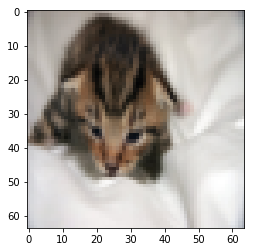

In [21]:
# Example of a picture that was wrongly classified.
index = 1
plt.imshow(test_set_x[:,index].reshape((num_px, num_px, 3)))
print ("y = " + str(test_set_y[0,index]) + ", you predicted that it is a \"" + classes[d["Y_prediction_test"][0,index]].decode("utf-8") +  "\" picture.")

Let's also plot the cost function and the gradients.

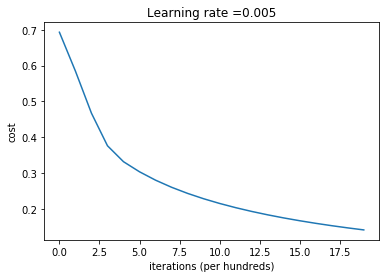

In [22]:
# Plot learning curve (with costs)
costs = np.squeeze(d['costs'])
plt.plot(costs)
plt.ylabel('cost')
plt.xlabel('iterations (per hundreds)')
plt.title("Learning rate =" + str(d["learning_rate"]))
plt.show()

**Interpretation**:
You can see the cost decreasing. It shows that the parameters are being learned. However, you see that you could train the model even more on the training set. Try to increase the number of iterations in the cell above and rerun the cells. You might see that the training set accuracy goes up, but the test set accuracy goes down. This is called overfitting. 

## 6 - Further analysis (optional/ungraded exercise) ##

Congratulations on building your first image classification model. Let's analyze it further, and examine possible choices for the learning rate $\alpha$. 

#### Choice of learning rate ####

**Reminder**:
In order for Gradient Descent to work you must choose the learning rate wisely. The learning rate $\alpha$  determines how rapidly we update the parameters. If the learning rate is too large we may "overshoot" the optimal value. Similarly, if it is too small we will need too many iterations to converge to the best values. That's why it is crucial to use a well-tuned learning rate.

Let's compare the learning curve of our model with several choices of learning rates. Run the cell below. This should take about 1 minute. Feel free also to try different values than the three we have initialized the `learning_rates` variable to contain, and see what happens. 

In [23]:
learning_rates = [0.01, 0.001, 0.0001]
models = {}
for i in learning_rates:
    print ("learning rate is: " + str(i))
    models[str(i)] = model(train_set_x, train_set_y, test_set_x, test_set_y, num_iterations = 1500, learning_rate = i, print_cost = False)
    print ('\n' + "-------------------------------------------------------" + '\n')

for i in learning_rates:
    plt.plot(np.squeeze(models[str(i)]["costs"]), label= str(models[str(i)]["learning_rate"]))

plt.ylabel('cost')
plt.xlabel('iterations (hundreds)')

legend = plt.legend(loc='upper center', shadow=True)
frame = legend.get_frame()
frame.set_facecolor('0.90')
plt.show()

learning rate is: 0.01
[[ 0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
   0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5

[[ 0.22946315  0.10200972  0.09978784  0.11733731  0.16659451  0.22706888
   0.17434297  0.19534     0.12273598  0.1441602   0.08546893  0.10768859
   0.17770234  0.06180584  0.07508488  0.06113031  0.05308027  0.02741465
   0.09099237  0.30780912  0.08207299  0.15474733  0.04025866  0.06223738
   0.09370054  0.31296111  0.09631371  0.11478052  0.14086667  0.10289986
   0.20424023  0.12307383  0.13818077  0.10995818  0.11157058  0.23113084
   0.11746502  0.05129413  0.4105918   0.17047976  0.0947898   0.22869345
   0.11404234  0.07293543  0.08913524  0.21699131  0.1128313   0.20244583
   0.08812326  0.14515913  0.06210929  0.11029507  0.08490507  0.06766324
   0.17342975  0.04731762  0.19197584  0.05148826  0.26230369  0.24382787
   0.25931549  0.12975146  0.06353296  0.1290735   0.04982155  0.19481355
   0.106013    0.11535563  0.09967379  0.07210129  0.10909733  0.22301177
   0.21259366  0.22237065  0.13509502  0.09408692  0.09557841  0.13602482
   0.12292446  0.26819816  0.06587714 

[[ 0.87512618  0.94056432  0.98149022  0.49005757  0.73453894  0.79820439
   0.74919295  0.90366262  0.90906647  0.86571325  0.97846073  0.93705334
   0.90413372  0.97246553  0.94615356  0.98178182  0.949452    0.96540111
   0.95685247  0.87754111  0.91878039  0.75193703  0.98772401  0.98682393
   0.97528216  0.7458814   0.87394632  0.94593696  0.79999706  0.85271589
   0.67384067  0.98329768  0.96617049  0.97212002  0.73562414  0.91601192
   0.8791813   0.98580266  0.66912745  0.94691319  0.84863232  0.58843712
   0.96259729  0.95519582  0.8839353   0.82728289  0.94550446  0.93093373
   0.5774692   0.92736513  0.98696989  0.95845376  0.94336389  0.98928944
   0.88477308  0.96576603  0.95136337  0.99410586  0.71287787  0.91105236
   0.93826979  0.92870716  0.93706861  0.8740641   0.99134168  0.85279614
   0.98567195  0.9112729   0.96555846  0.9601778   0.96491357  0.94267077
   0.68694482  0.93889143  0.95847531  0.97163247  0.7151474   0.8676852
   0.78162025  0.63122889  0.78427804  

[[  4.01797805e-03   7.21237492e-05   3.34826636e-05   7.48778107e-04
    1.84168852e-03   5.67598415e-03   1.93763534e-03   1.99980415e-03
    2.09054492e-04   5.56270614e-04   2.13447606e-05   1.11534752e-04
    1.08974745e-03   8.52392608e-06   2.23588331e-05   4.41903871e-06
    5.84052643e-06   4.06835040e-07   3.82068843e-05   1.81608163e-02
    3.92607832e-05   1.20271142e-03   8.41952695e-07   4.10039963e-06
    3.32763400e-05   3.33241219e-02   1.04747739e-04   1.19978516e-04
    7.49023409e-04   1.67580670e-04   5.53842197e-03   5.83645030e-05
    1.97564095e-04   6.00145263e-05   3.73413207e-04   2.92511217e-03
    2.07137529e-04   2.10603326e-06   1.55021418e-01   5.81328648e-04
    1.06575599e-04   1.11867434e-02   9.50393990e-05   1.67291434e-05
    6.96448131e-05   4.13367581e-03   1.08063076e-04   1.41109412e-03
    2.14088343e-04   3.74284718e-04   4.22635992e-06   8.48177395e-05
    3.82163386e-05   5.41312546e-06   1.21913984e-03   2.65796832e-06
    1.03085457e-03  

[[ 0.55940723  0.39312399  0.66908043  0.0668908   0.2660981   0.43816484
   0.26157318  0.6306837   0.37431653  0.35702044  0.60637972  0.46658415
   0.52543799  0.5152367   0.34807825  0.46104484  0.25333492  0.17636415
   0.44173684  0.71533103  0.27631536  0.24264537  0.47240848  0.56111504
   0.61638866  0.5275915   0.24806794  0.50110474  0.28899358  0.25676225
   0.28315694  0.68304314  0.66782443  0.59582963  0.17950034  0.62412365
   0.29718085  0.49158313  0.55175134  0.62564245  0.19651491  0.25029145
   0.58072544  0.35665925  0.23057819  0.45718188  0.46950598  0.61604157
   0.07161697  0.50480903  0.58294758  0.53278652  0.38729726  0.66846187
   0.49366166  0.26497835  0.71964665  0.68300741  0.37054927  0.69535574
   0.73831513  0.50315754  0.25192611  0.34850279  0.55397811  0.44981951
   0.64656367  0.39142068  0.52505387  0.37767895  0.53011873  0.74975082
   0.29030494  0.6948693   0.57835064  0.57445434  0.10606292  0.38075594
   0.20406945  0.31484465  0.11589689 

[[ 0.4272304   0.19006419  0.42895089  0.02875807  0.16125422  0.32242846
   0.15111627  0.51948081  0.19751609  0.20470133  0.36079581  0.27321186
   0.36545586  0.27705656  0.15280925  0.18741473  0.09119819  0.04598531
   0.21661035  0.65538566  0.11446126  0.13482756  0.1847354   0.26560477
   0.37992842  0.46120894  0.11247206  0.29362577  0.16827272  0.12942463
   0.19218341  0.42352151  0.4850082   0.35370296  0.09056489  0.478115
   0.14275663  0.20246372  0.51790219  0.44525613  0.0832402   0.17388756
   0.37074434  0.1496873   0.09685435  0.33400074  0.2595473   0.45285711
   0.02957288  0.31746885  0.29202554  0.31351112  0.18768757  0.38952226
   0.35026698  0.08438461  0.58938071  0.36207327  0.26983989  0.60330711
   0.6283344   0.32322242  0.09270111  0.19476793  0.23220344  0.30675679
   0.36368282  0.21572032  0.28948248  0.15902563  0.29150503  0.65257732
   0.19565564  0.55799981  0.35797968  0.33766512  0.04105511  0.22928473
   0.09956288  0.23150283  0.04539341  0

[[  3.43876682e-02   1.53873766e-03   2.20396402e-03   1.75131414e-03
    1.10761378e-02   3.44693424e-02   9.34589903e-03   3.98004261e-02
    3.11487636e-03   6.04035679e-03   1.60717205e-03   3.49298500e-03
    1.47044397e-02   9.61204111e-04   7.78173305e-04   2.80848838e-04
    2.68039600e-04   3.89093285e-05   1.23338317e-03   1.51331011e-01
    8.04010680e-04   6.92263579e-03   1.38389662e-04   3.80845230e-04
    2.16426496e-03   1.33625092e-01   1.53048207e-03   3.37313177e-03
    7.17048301e-03   2.59825107e-03   2.39733119e-02   2.05729626e-03
    8.03302989e-03   2.28786852e-03   3.23825724e-03   2.88978383e-02
    2.31551956e-03   2.14796971e-04   2.94348197e-01   1.12806604e-02
    1.20844078e-03   3.21556750e-02   3.98716388e-03   5.91373568e-04
    1.02521873e-03   2.99041843e-02   2.68389383e-03   1.83202218e-02
    1.06664999e-03   6.62636351e-03   4.62593115e-04   2.88416227e-03
    1.28479836e-03   7.39892896e-04   1.72939959e-02   1.34482804e-04
    2.64742442e-02  

[[  5.18567797e-03   6.11410593e-05   5.65890099e-05   2.46990133e-04
    1.69141728e-03   6.62312078e-03   1.36109958e-03   5.18926322e-03
    1.86908698e-04   5.30536741e-04   3.93208258e-05   1.74055813e-04
    1.45456717e-03   2.08559042e-05   2.31309612e-05   3.87105584e-06
    5.54073231e-06   3.62446098e-07   3.90981561e-05   3.96424619e-02
    2.96582382e-05   8.91138969e-04   1.20993994e-06   4.92737811e-06
    6.12057570e-05   4.89077101e-02   8.49029939e-05   1.59949152e-04
    7.98189264e-04   1.80813589e-04   5.31899335e-03   5.32999234e-05
    3.99643752e-04   7.28544302e-05   3.25595523e-04   3.47793289e-03
    1.45897934e-04   2.36734889e-06   1.87104008e-01   7.92544178e-04
    6.97485363e-05   9.37252728e-03   1.65375883e-04   1.51300084e-05
    4.91415572e-05   5.03898867e-03   1.19386473e-04   1.73383051e-03
    1.06481210e-04   4.46941347e-04   6.23281402e-06   1.15929523e-04
    4.51196056e-05   1.04192791e-05   1.93763846e-03   1.93536459e-06
    2.28524249e-03  

[[ 0.90951687  0.9224767   0.99162296  0.12683074  0.6743626   0.82069041
   0.61241072  0.97184929  0.88758253  0.84417386  0.9907491   0.9626709
   0.93250174  0.99115026  0.94295193  0.9780057   0.93563008  0.94828218
   0.95628974  0.95875846  0.86911967  0.62771288  0.99207932  0.99002469
   0.98937505  0.83267909  0.81340665  0.96220781  0.78657582  0.84256326
   0.62315693  0.98377583  0.98749415  0.97965364  0.63887639  0.93664634
   0.79866859  0.98768136  0.73722034  0.96678729  0.71733812  0.48224817
   0.98226398  0.94433826  0.79783525  0.85709718  0.9507858   0.95046829
   0.2610363   0.94117656  0.99255601  0.97253699  0.94975094  0.99589044
   0.93289954  0.94024727  0.98461388  0.9974415   0.63947297  0.97219191
   0.97110273  0.96036633  0.89796062  0.86827176  0.99236712  0.86055036
   0.98421031  0.92017928  0.97364823  0.95008868  0.96607073  0.98540161
   0.61851675  0.96801534  0.96452476  0.98520575  0.34448674  0.88822457
   0.62970602  0.52995677  0.65423341  

[[  4.26840766e-02   1.64562835e-03   3.59550873e-03   1.07401292e-03
    1.21583574e-02   4.08794663e-02   8.72906371e-03   7.49870351e-02
    3.38244915e-03   6.64795687e-03   2.81839883e-03   5.46476703e-03
    1.93871575e-02   2.07194444e-03   9.86499710e-04   3.14664323e-04
    3.31767386e-04   4.89014057e-05   1.50831855e-03   2.31107034e-01
    8.19963614e-04   6.69597038e-03   2.18320541e-04   5.15332701e-04
    3.72713016e-03   1.72909910e-01   1.63816573e-03   4.81953587e-03
    8.63550145e-03   3.41309881e-03   2.57759232e-02   2.22374283e-03
    1.38094464e-02   3.00838033e-03   3.54728356e-03   3.39009287e-02
    2.18737600e-03   2.83349695e-04   3.31209397e-01   1.52198116e-02
    1.15182148e-03   3.21543392e-02   6.49961079e-03   6.87303872e-04
    1.02944037e-03   3.68557173e-02   3.31129330e-03   2.29564524e-02
    8.86734243e-04   8.26955963e-03   7.28878829e-04   4.14313566e-03
    1.71226335e-03   1.34316761e-03   2.59317066e-02   1.41008953e-04
    4.66325133e-02  

[[  6.87345279e-03   7.51190427e-05   1.05905784e-04   1.73935255e-04
    2.05622064e-03   8.43821972e-03   1.41184116e-03   1.07718929e-02
    2.29860446e-04   6.50044510e-04   7.95237186e-05   3.11424286e-04
    2.09623242e-03   5.26823486e-05   3.44898163e-05   5.16367878e-06
    8.31885349e-06   5.75746358e-07   5.51744840e-05   6.67603971e-02
    3.52677704e-05   9.63222736e-04   2.31457069e-06   7.88198235e-06
    1.20235314e-04   6.77755586e-02   1.05325344e-04   2.60133492e-04
    1.07557298e-03   2.76775756e-04   6.19448829e-03   6.51404291e-05
    7.64356924e-04   1.09022112e-04   4.06278866e-04   4.36029721e-03
    1.56048648e-04   3.73054540e-06   2.18192329e-01   1.17829514e-03
    7.75261717e-05   1.00938863e-02   3.06858451e-04   2.07023041e-05
    5.79393835e-05   6.76194885e-03   1.67566180e-04   2.37576270e-03
    1.04063799e-04   6.16681757e-04   1.16888098e-05   1.90056958e-04
    6.95366974e-05   2.21183166e-05   3.22976969e-03   2.47923687e-06
    4.43688557e-03  

[[ 0.42986635  0.12170971  0.47394882  0.00807874  0.13992198  0.32387558
   0.09709231  0.72256691  0.14115439  0.16069544  0.43883243  0.33368038
   0.37952405  0.44343994  0.12528719  0.10643575  0.06913829  0.03070145
   0.1658501   0.79017986  0.06511892  0.0901417   0.17429895  0.20827371
   0.45407247  0.55510575  0.07700847  0.30698823  0.16249261  0.13669995
   0.17317117  0.27233798  0.59550495  0.3085199   0.07335586  0.4375607
   0.07748287  0.14596968  0.57015086  0.44794998  0.04630751  0.14416607
   0.44965667  0.1013195   0.05704327  0.35058104  0.21861528  0.4374012
   0.01425043  0.28863206  0.29206464  0.32380766  0.17157212  0.45393371
   0.44283367  0.0425996   0.72600487  0.38155661  0.20942265  0.76733165
   0.67811879  0.39001917  0.05570132  0.17252419  0.16147694  0.27693115
   0.22276264  0.20468776  0.2629932   0.09891129  0.2106668   0.81099683
   0.17397764  0.58249416  0.28568984  0.38042784  0.01300214  0.22623967
   0.05901507  0.18219785  0.03454605  0

[[ 0.23258488  0.03204954  0.15082939  0.00351037  0.06941546  0.18569328
   0.04479065  0.51666151  0.04519868  0.0613146   0.13361221  0.12464159
   0.17722902  0.13632016  0.03108547  0.01723651  0.01500253  0.00461493
   0.04035819  0.65816842  0.01600081  0.03967329  0.02604569  0.03598359
   0.14494131  0.44295097  0.0239855   0.10396862  0.07257171  0.05419307
   0.10040798  0.06135826  0.28414863  0.08510553  0.03006824  0.21606316
   0.02300382  0.02220816  0.50876153  0.19299267  0.01453195  0.09143887
   0.17582183  0.02221736  0.01636181  0.20223312  0.06594592  0.20941253
   0.00572981  0.10552917  0.05923799  0.10535611  0.04624117  0.11149808
   0.2460357   0.00718343  0.47124373  0.06765194  0.12577077  0.59491733
   0.43924685  0.16375307  0.0122438   0.06360137  0.02334782  0.13022921
   0.04621128  0.07014587  0.07303012  0.02020112  0.0540557   0.62087183
   0.10337456  0.31495426  0.08661874  0.11715103  0.00425422  0.0882981
   0.02265855  0.12029237  0.01118525  

[[  6.57322392e-03   6.65732929e-05   1.29376562e-04   1.06580052e-04
    1.99787788e-03   8.34301695e-03   1.22172518e-03   1.48312293e-02
    2.08661300e-04   5.85072171e-04   9.89244129e-05   3.93070849e-04
    2.17301431e-03   7.75759853e-05   3.61192526e-05   4.50049232e-06
    8.81511764e-06   5.87890844e-07   5.15151043e-05   8.25870094e-02
    2.93348818e-05   8.45879925e-04   2.53603334e-06   7.75245643e-06
    1.43476775e-04   7.94029029e-02   9.79057373e-05   2.96148077e-04
    1.10728739e-03   3.43375860e-04   5.94504707e-03   5.37907046e-05
    9.56960293e-04   1.10134400e-04   3.84029425e-04   3.93889443e-03
    1.19040558e-04   3.52716366e-06   2.36650788e-01   1.24572684e-03
    6.63611679e-05   9.27415659e-03   3.97010416e-04   1.93676200e-05
    5.21284552e-05   7.38346484e-03   1.66048468e-04   2.52135846e-03
    8.27658151e-05   5.86617331e-04   1.38714783e-05   2.16574474e-04
    7.13434241e-05   2.73802268e-05   4.19433813e-03   2.17134238e-06
    5.98916276e-03  

[[ 0.56339947  0.25205463  0.78094169  0.00881211  0.22289845  0.44304287
   0.14485167  0.87523546  0.2642362   0.26746077  0.75996132  0.62712774
   0.56772957  0.80291216  0.31683509  0.28372538  0.21427984  0.12607159
   0.35216953  0.88307681  0.1385534   0.14181272  0.50961619  0.50284558
   0.75488447  0.67989612  0.16196111  0.57354232  0.28689503  0.32358056
   0.24512448  0.48708781  0.82680912  0.5718445   0.13361531  0.5716245
   0.12879189  0.39880807  0.6420159   0.66492505  0.09181674  0.18595595
   0.74846949  0.25041557  0.12428617  0.51333361  0.42517669  0.63810898
   0.02299104  0.47037785  0.6611324   0.60435435  0.37971546  0.79986328
   0.68160518  0.12875182  0.8887657   0.78246923  0.26302218  0.89656223
   0.82181971  0.64074371  0.14722945  0.30409276  0.49017207  0.39712595
   0.47330295  0.39031307  0.53254461  0.23252675  0.41084214  0.92670488
   0.259652    0.73801141  0.48593652  0.69596717  0.01848941  0.3600949
   0.10363322  0.2271957   0.08281918  0

[[ 0.75764665  0.60358144  0.95774123  0.01836062  0.41494327  0.63817796
   0.28885931  0.95566815  0.57241723  0.52881632  0.95360958  0.88889273
   0.80228717  0.96833891  0.72471823  0.74628904  0.64971547  0.58845223
   0.73387746  0.94313081  0.42101324  0.29808878  0.91400909  0.88982306
   0.94837427  0.79530201  0.43319672  0.86160897  0.54266484  0.66392382
   0.4017266   0.83261084  0.95652917  0.87533579  0.31544006  0.77649734
   0.33001643  0.84961791  0.71419919  0.87885461  0.27412543  0.28908717
   0.93970034  0.65616787  0.37264031  0.72454943  0.76742478  0.8508229
   0.06191828  0.75872452  0.94400098  0.88414852  0.75716437  0.97129018
   0.87525511  0.52174186  0.9674423   0.97575605  0.39509427  0.96133732
   0.92919478  0.87714671  0.49551458  0.59225916  0.90972301  0.62637005
   0.84865162  0.71592015  0.86027037  0.6323817   0.77302207  0.9767741
   0.42680163  0.89179073  0.79814734  0.93129183  0.05179208  0.63391637
   0.25936602  0.3338897   0.27569631  0

[[ 0.32257514  0.05909986  0.36925599  0.00309331  0.10684964  0.2554363
   0.06037972  0.74200158  0.07716882  0.09392882  0.33642259  0.2976133
   0.29050578  0.42498489  0.07861507  0.0389351   0.03733542  0.01412788
   0.0863179   0.79609164  0.02865525  0.05685945  0.08823719  0.09250762
   0.35668275  0.57015289  0.04447924  0.24346778  0.12518762  0.13031568
   0.1348713   0.11149152  0.50398798  0.18522583  0.05014636  0.28599419
   0.03368874  0.06024061  0.58161957  0.33984511  0.02322008  0.11459399
   0.38819007  0.04957918  0.03067263  0.30430445  0.13078387  0.34648856
   0.00810524  0.1771812   0.18804984  0.23916375  0.10572731  0.32450886
   0.44226336  0.01567149  0.71643826  0.24745033  0.14858342  0.79320447
   0.6149641   0.32001426  0.02721364  0.11022554  0.07538862  0.18707158
   0.09855935  0.13799338  0.16826319  0.04121729  0.10193766  0.82577647
   0.14987819  0.45537233  0.15630438  0.2903409   0.00481288  0.14052891
   0.0343462   0.1421338   0.02291929  0

[[ 0.57822802  0.23623114  0.81451     0.00646008  0.24010968  0.45706508
   0.13923619  0.91611857  0.25405832  0.26047771  0.7988646   0.69271983
   0.59175657  0.87435092  0.34593606  0.24999361  0.20843705  0.12794768
   0.36319887  0.91098105  0.12966333  0.14032364  0.53977145  0.48486906
   0.80702168  0.72220566  0.16407536  0.63595854  0.31137133  0.38041019
   0.25067911  0.43756857  0.84304285  0.58244178  0.144726    0.55029422
   0.11947269  0.39098237  0.66853925  0.68783772  0.08432515  0.19544075
   0.78425349  0.24955133  0.1234604   0.53260665  0.42745235  0.65410605
   0.02332268  0.46949099  0.69802085  0.64023535  0.40848455  0.83411402
   0.73437709  0.10835493  0.91768963  0.81910173  0.25149623  0.92788048
   0.84213841  0.68344665  0.14720708  0.32251752  0.47404413  0.40320563
   0.42691297  0.41718522  0.55133288  0.2172131   0.38170965  0.95004311
   0.27642343  0.7512566   0.47617565  0.73689394  0.01443124  0.37733805
   0.09897887  0.22300658  0.09307551 

[[ 0.20608493  0.02296109  0.17627901  0.00155161  0.0664644   0.17219657
   0.03485025  0.64025153  0.03432514  0.04642669  0.15431481  0.16605111
   0.17161465  0.22564191  0.03176152  0.0104864   0.01283523  0.00387436
   0.03273685  0.73066303  0.01053171  0.03192955  0.0242171   0.02602009
   0.17457597  0.50929509  0.01997032  0.12661853  0.07270943  0.07624711
   0.09137264  0.03607239  0.30164369  0.07503966  0.02739246  0.16085725
   0.01407501  0.01596069  0.55079604  0.19057776  0.0101572   0.08432176
   0.21580242  0.01740864  0.0131322   0.20968948  0.05592436  0.212111
   0.00432921  0.08431162  0.06568768  0.11440632  0.04370816  0.12715682
   0.32000953  0.00435859  0.57609925  0.0794665   0.10134723  0.71678827
   0.46757009  0.18228324  0.00974514  0.05564819  0.01969004  0.1082019
   0.03164554  0.06721024  0.07065533  0.01317945  0.03718379  0.73953305
   0.10698151  0.28622387  0.0650743   0.13514756  0.00206228  0.07058339
   0.0175433   0.1051942   0.01095057  0.

[[ 0.71144424  0.48140974  0.94683534  0.01006487  0.37191675  0.59222991
   0.2303629   0.9609305   0.46827125  0.43336505  0.94088871  0.88037066
   0.76370731  0.96906351  0.66060871  0.58916644  0.52890527  0.44947552
   0.64486523  0.94731067  0.29900758  0.24033193  0.86623134  0.81101318
   0.93944096  0.80437023  0.34732674  0.84678586  0.49446872  0.65475834
   0.35690279  0.71762533  0.94388965  0.82435428  0.26734489  0.69853899
   0.23117448  0.75098251  0.72330847  0.84960511  0.19224411  0.26397398
   0.92878078  0.54130456  0.28707395  0.69122282  0.68797905  0.82218134
   0.04632789  0.68014411  0.92213947  0.85574542  0.69116254  0.96091344
   0.87414371  0.34658614  0.96796864  0.96568028  0.3364019   0.96653813
   0.92087412  0.85696845  0.38313372  0.5223336   0.84515203  0.55781198
   0.74959409  0.6580518   0.8132846   0.48519682  0.65910945  0.97943127
   0.4003185   0.8619198   0.71365839  0.91409422  0.02876055  0.55402278
   0.19740113  0.29476257  0.22864871 

[[  4.24498792e-02   1.24178845e-03   7.45032157e-03   2.86997199e-04
    1.34132388e-02   4.32345796e-02   6.51608008e-03   2.15695160e-01
    2.74503282e-03   5.28311110e-03   6.02426241e-03   1.33544288e-02
    2.40114000e-02   9.43382052e-03   1.41061441e-03   2.03703334e-04
    3.78403090e-04   5.73736073e-05   1.48780505e-03   4.12104838e-01
    5.42918986e-04   5.37966974e-03   3.26322243e-04   4.71666266e-04
    8.34547877e-03   2.78830546e-01   1.54552673e-03   9.48646594e-03
    1.09264044e-02   7.96160580e-03   2.52375862e-02   1.23633875e-03
    2.48076448e-02   3.41242575e-03   3.76818037e-03   2.46879157e-02
    1.20354164e-03   2.56540655e-04   4.18337101e-01   2.00075754e-02
    8.02711737e-04   3.07295889e-02   1.46544723e-02   6.41154964e-04
    9.01209055e-04   4.86132049e-02   3.41248297e-03   2.97351943e-02
    6.29812007e-04   7.52100957e-03   1.38604284e-03   6.87711908e-03
    2.22167704e-03   2.90149830e-03   6.09121632e-02   9.02274142e-05
    1.23817298e-01  

[[ 0.48994765  0.13668091  0.73245477  0.0031682   0.18363502  0.38129638
   0.09570395  0.91075519  0.16058624  0.17149255  0.70671091  0.62045506
   0.4966167   0.83714055  0.23449957  0.11600246  0.11110467  0.0580185
   0.23398942  0.90634364  0.06703228  0.09538921  0.34494784  0.28327972
   0.73376206  0.71232943  0.10137476  0.55410789  0.23737235  0.31959206
   0.19643907  0.25610202  0.77473102  0.43321414  0.10005077  0.42605783
   0.0664011   0.20858521  0.66718802  0.59341496  0.04684393  0.16123124
   0.71105387  0.14177663  0.0733161   0.45972063  0.29233026  0.57207106
   0.01445835  0.33809322  0.5534599   0.52843086  0.28237509  0.73575553
   0.69665904  0.04510985  0.90369753  0.70228581  0.19438287  0.92630587
   0.80693557  0.59788887  0.08028613  0.23138002  0.27303863  0.30914504
   0.25488505  0.31062172  0.41449159  0.10915105  0.22734285  0.94697215
   0.23219255  0.66787569  0.32594161  0.63469069  0.00689465  0.26622295
   0.06188089  0.18091758  0.05964738  

[[  1.80612081e-01   1.53209636e-02   1.53826039e-01   8.80475157e-04
    5.63017869e-02   1.50740061e-01   2.69106110e-02   6.74638261e-01
    2.44589093e-02   3.40362363e-02   1.31891858e-01   1.56807749e-01
    1.47883906e-01   2.34360672e-01   2.46190374e-02   5.79091440e-03
    8.05157328e-03   2.31069657e-03   2.39022839e-02   7.50737512e-01
    6.71427478e-03   2.46349057e-02   1.62064693e-02   1.56055512e-02
    1.62321432e-01   5.22574404e-01   1.45671715e-02   1.19031219e-01
    6.09742123e-02   7.13045183e-02   7.69033048e-02   2.19768007e-02
    2.61739566e-01   5.60550170e-02   2.20632153e-02   1.24137460e-01
    9.54055735e-03   9.53043357e-03   5.63145565e-01   1.65043127e-01
    6.78296014e-03   7.56660410e-02   1.93530790e-01   1.17127738e-02
    9.41608621e-03   1.86078066e-01   4.05832705e-02   1.87634856e-01
    3.22820244e-03   6.31246986e-02   5.07513590e-02   9.59021161e-02
    3.34918747e-02   1.04151021e-01   3.19112926e-01   2.31381091e-03
    5.89978958e-01  

[[ 0.62217392  0.28157991  0.90254005  0.00431762  0.27696077  0.4981522
   0.14919702  0.95726118  0.29679605  0.28435127  0.88973678  0.82112396
   0.66529237  0.952636    0.4793942   0.30061351  0.28424046  0.19914977
   0.45306333  0.9437122   0.14664577  0.15424687  0.69129488  0.58107687
   0.8998902   0.79016731  0.20516211  0.77596634  0.37440781  0.54657579
   0.2711931   0.4798955   0.90157831  0.68254351  0.17634543  0.56405626
   0.12366989  0.48897815  0.71810582  0.76939895  0.09554081  0.21287056
   0.8800743   0.32188267  0.1588173   0.59952114  0.50575355  0.74242773
   0.02576474  0.51988742  0.83314827  0.75878105  0.51829464  0.91731986
   0.83676814  0.13208746  0.9588712   0.92002886  0.25279377  0.96406376
   0.8942677   0.78450569  0.20156987  0.38359843  0.6181638   0.43704478
   0.51464605  0.51405156  0.6750173   0.25152057  0.42803607  0.97689847
   0.32476861  0.79550417  0.53187856  0.84640614  0.01187416  0.40751679
   0.11224653  0.23055654  0.1334079   

[[  1.79087574e-02   2.69141167e-04   1.75239199e-03   8.28042797e-05
    5.62936850e-03   2.01923106e-02   2.53940830e-03   1.24216485e-01
    7.28809386e-04   1.59762290e-03   1.32029740e-03   4.31953775e-03
    8.69299743e-03   2.44511272e-03   3.18102729e-04   2.53643335e-05
    6.21780638e-05   6.77182417e-06   3.12657352e-04   3.01344606e-01
    1.06754904e-04   1.99699025e-03   4.01607262e-05   6.08758853e-05
    2.09659954e-03   2.12617315e-01   4.06756298e-04   3.01876074e-03
    4.08616307e-03   2.98310758e-03   1.22169340e-02   2.07292254e-04
    7.02330194e-03   7.39366754e-04   1.31865341e-03   8.46870479e-03
    3.00245335e-04   3.07745354e-05   3.77241670e-01   6.53074400e-03
    1.97984733e-04   1.74588952e-02   4.24599861e-03   1.17971012e-04
    2.25903394e-04   2.25701048e-02   8.11170088e-04   1.14875562e-02
    2.08065041e-04   2.07202929e-03   2.34877494e-04   1.81906580e-03
    5.03970144e-04   5.04856242e-04   2.87573249e-02   1.11947389e-05
    5.69528201e-02  

[[ 0.83271612  0.69897236  0.98887638  0.00920169  0.51908125  0.7204275
   0.32484061  0.98943431  0.66704948  0.59821706  0.98752552  0.96755417
   0.88616811  0.99583867  0.87761852  0.8188303   0.78053402  0.77770254
   0.85439346  0.97879327  0.49845926  0.34961692  0.97267725  0.94197496
   0.98806373  0.88791599  0.56061626  0.95779829  0.6760176   0.86229064
   0.45954631  0.87262679  0.98346226  0.94069223  0.43121349  0.807871
   0.37210072  0.92310631  0.79509941  0.94232602  0.32506072  0.34593132
   0.98186828  0.78736894  0.50145759  0.81251953  0.85636035  0.92373626
   0.07790102  0.83164809  0.98526368  0.95613185  0.88131885  0.99341129
   0.95540056  0.6026503   0.99179484  0.995466    0.40565606  0.99030845
   0.96956853  0.95160915  0.65968555  0.72486151  0.96189646  0.7062839
   0.90509816  0.84539524  0.94049471  0.71798107  0.82832256  0.99491067
   0.53180418  0.93728397  0.86343178  0.97933241  0.03786413  0.72425574
   0.30850662  0.3536196   0.44846372  0.6

[[  1.58089881e-01   1.08791032e-02   1.45395403e-01   4.88421810e-04
    4.68878680e-02   1.31326401e-01   2.09169718e-02   7.07777071e-01
    1.83591647e-02   2.53660615e-02   1.18515111e-01   1.55944770e-01
    1.28914965e-01   2.54520579e-01   2.03921356e-02   3.48984880e-03
    5.46914022e-03   1.50922626e-03   1.80205323e-02   7.68265230e-01
    4.38285622e-03   1.91731048e-02   1.17050213e-02   1.01494954e-02
    1.57761287e-01   5.39176280e-01   1.09934439e-02   1.18324497e-01
    5.13641601e-02   7.08477164e-02   6.50132238e-02   1.42964584e-02
    2.36905620e-01   4.42842802e-02   1.78478333e-02   9.66394964e-02
    6.50528796e-03   6.07581813e-03   5.77575996e-01   1.47935737e-01
    4.65156382e-03   6.72221091e-02   1.87268740e-01   8.28355708e-03
    7.08322972e-03   1.68675305e-01   3.08292576e-02   1.76332821e-01
    2.37754892e-03   4.81568136e-02   4.34537747e-02   8.50237253e-02
    2.63815807e-02   9.18882184e-02   3.31379213e-01   1.34273033e-03
    6.16129481e-01  

[[  1.24448414e-02   1.36412228e-04   1.00558752e-03   4.28838043e-05
    3.80152054e-03   1.44294148e-02   1.63848031e-03   1.05222933e-01
    4.06782292e-04   9.32456464e-04   7.22115496e-04   2.82541994e-03
    5.65671397e-03   1.54446775e-03   1.71107611e-04   9.90926708e-06
    2.75521711e-05   2.63452938e-06   1.59815361e-04   2.71150550e-01
    5.07211116e-05   1.26745626e-03   1.65287772e-05   2.46296567e-05
    1.25183158e-03   1.94447463e-01   2.24930869e-04   1.97506587e-03
    2.65844903e-03   2.03398037e-03   8.78694080e-03   9.29975340e-05
    4.20505229e-03   3.86729890e-04   8.31221739e-04   5.23290615e-03
    1.59708202e-04   1.20477582e-05   3.66554743e-01   4.14143902e-03
    1.03402122e-04   1.35849870e-02   2.64465541e-03   5.59657365e-05
    1.22728296e-04   1.62106641e-02   4.33053952e-04   7.89396266e-03
    1.24220541e-04   1.17538418e-03   1.15201483e-04   1.06094569e-03
    2.67030225e-04   2.53319133e-04   2.20355541e-02   4.28344492e-06
    4.38195988e-02  

[[  1.52175954e-01   9.85682450e-03   1.47770557e-01   3.93059327e-04
    4.42221274e-02   1.25767126e-01   1.92597638e-02   7.24231649e-01
    1.69274809e-02   2.31231846e-02   1.17313761e-01   1.60494233e-01
    1.24387688e-01   2.71878121e-01   1.97410211e-02   2.99397647e-03
    4.88751682e-03   1.34505351e-03   1.66496659e-02   7.76644492e-01
    3.82094425e-03   1.77221176e-02   1.08166225e-02   8.94306988e-03
    1.61324408e-01   5.48595971e-01   1.01410227e-02   1.22065080e-01
    4.89446021e-02   7.29362956e-02   6.17869269e-02   1.25018510e-02
    2.32848112e-01   4.17634411e-02   1.68020249e-02   8.88531192e-02
    5.74059401e-03   5.32026955e-03   5.84685366e-01   1.45098247e-01
    4.11823687e-03   6.49408235e-02   1.91189825e-01   7.49940509e-03
    6.54667716e-03   1.64771911e-01   2.85356292e-02   1.76766843e-01
    2.15382561e-03   4.43023652e-02   4.29625350e-02   8.37365858e-02
    2.47645416e-02   9.12754854e-02   3.42834359e-01   1.13332836e-03
    6.32902094e-01  

[[ 0.82808424  0.67663959  0.99041566  0.0062787   0.50195378  0.71052168
   0.30033689  0.99156887  0.64875319  0.56953899  0.98862001  0.97222621
   0.88506268  0.99690516  0.88167578  0.79054475  0.76161275  0.76177056
   0.84681641  0.98155758  0.45333086  0.32665151  0.97224783  0.93483829
   0.98982981  0.89852003  0.54109404  0.9638974   0.66806809  0.87850069
   0.44386653  0.8530902   0.9842943   0.93961054  0.41736306  0.78844091
   0.33228407  0.91315073  0.80741038  0.94419184  0.2905282   0.3370969
   0.98438208  0.77149276  0.48380475  0.81238781  0.84795839  0.9291481
   0.06867063  0.81811898  0.98674493  0.95878057  0.87812531  0.99413374
   0.96215193  0.55078936  0.99341221  0.99620723  0.38105153  0.99242221
   0.97268886  0.95504109  0.64243169  0.71204771  0.96071244  0.68904136
   0.89827968  0.84425644  0.94301884  0.67638742  0.80536654  0.99612497
   0.52861435  0.93559193  0.85021207  0.98141675  0.02822336  0.69574982
   0.28589716  0.33789422  0.44325429  0

[[ 0.58467664  0.20815927  0.90679324  0.00188712  0.23386832  0.45400836
   0.1127918   0.96886506  0.23287297  0.21689823  0.88592636  0.83673037
   0.63099699  0.96557333  0.44098233  0.18942424  0.20136983  0.13454935
   0.37914942  0.95346469  0.09196481  0.11765094  0.61939567  0.45628411
   0.90877459  0.81324958  0.15756255  0.79542473  0.32994433  0.56829335
   0.23128267  0.35244287  0.89450827  0.62703677  0.144514    0.4794808
   0.08090311  0.36163338  0.74055234  0.75286682  0.06210613  0.1904884
   0.88768491  0.24282156  0.12067022  0.57161111  0.42714944  0.73976438
   0.01779841  0.43831583  0.82219564  0.74463245  0.45616758  0.91449484
   0.85979099  0.0721548   0.96824819  0.92204426  0.2053028   0.97468389
   0.90192364  0.78154155  0.14903717  0.32717977  0.5210975   0.37548334
   0.41509985  0.46979011  0.64451625  0.15730593  0.31220467  0.98419779
   0.30053785  0.76680699  0.43636297  0.84430805  0.00583293  0.32183093
   0.08142888  0.19679903  0.11072774  0

[[ 0.8211524   0.6513775   0.99038181  0.00506976  0.48559456  0.69946749
   0.28215966  0.99216457  0.62715138  0.54474682  0.98828808  0.97266558
   0.87978709  0.99712067  0.87630089  0.76025177  0.7367672   0.73658533
   0.8342642   0.98223877  0.41686082  0.30805757  0.96930527  0.92483574
   0.98995825  0.90135023  0.51846017  0.96451129  0.65482172  0.8802102
   0.42960325  0.83257274  0.9837318   0.93480526  0.40161481  0.77137487
   0.30439344  0.89977183  0.81147796  0.94218427  0.26533575  0.32930983
   0.98450601  0.75063016  0.46134446  0.80644801  0.83513864  0.92827479
   0.06268495  0.80312567  0.98623951  0.95738406  0.86936243  0.9939601
   0.96357615  0.50396294  0.99376361  0.99616027  0.36369938  0.99300462
   0.97291864  0.95438446  0.61778502  0.69688796  0.95564181  0.67274171
   0.88657904  0.83663835  0.94040589  0.63832467  0.78138964  0.99644008
   0.51983927  0.93199358  0.83490073  0.98105948  0.02346491  0.67285729
   0.26673411  0.32588112  0.42951211  0

[[  1.16187792e-01   5.58221280e-03   1.02194136e-01   2.13765629e-04
    3.22202838e-02   9.71484872e-02   1.33252815e-02   7.04244111e-01
    1.04390308e-02   1.47006363e-02   7.62335053e-02   1.23713607e-01
    8.99960311e-02   2.18246859e-01   1.22772301e-02   1.33303880e-03
    2.48504882e-03   6.25923975e-04   9.55054245e-03   7.58342584e-01
    2.00843276e-03   1.21423114e-02   5.24061211e-03   4.09124879e-03
    1.16539015e-01   5.32417627e-01   6.25764249e-03   9.29240359e-02
    3.48296327e-02   5.74912911e-02   4.75275798e-02   6.18073801e-03
    1.66896158e-01   2.46125227e-02   1.16684604e-02   5.92030573e-02
    3.33192013e-03   2.37453153e-03   5.80572481e-01   1.04456080e-01
    2.39435326e-03   5.39352569e-02   1.43682210e-01   4.03381811e-03
    3.98644820e-03   1.30215239e-01   1.69526520e-02   1.37874430e-01
    1.41682879e-03   2.75088843e-02   2.51229443e-02   5.62288228e-02
    1.48136986e-02   5.53034571e-02   3.06009518e-01   4.97019350e-04
    5.90237846e-01  

[[ 0.60509113  0.22159015  0.92943984  0.00153791  0.24278611  0.46769091
   0.11417711  0.97690031  0.24720886  0.22344729  0.91073111  0.87140985
   0.65653204  0.97777155  0.49256398  0.19998286  0.21955241  0.15598857
   0.410801    0.96120111  0.09417551  0.12022406  0.67102822  0.48275294
   0.93249598  0.83462556  0.16997357  0.83745538  0.3490601   0.628754
   0.23653728  0.36257156  0.91262052  0.66117854  0.15513051  0.48361625
   0.08205534  0.38738767  0.75881149  0.78142879  0.06423631  0.1977898
   0.91341037  0.26484569  0.13188311  0.59298329  0.45143373  0.77164789
   0.01826934  0.45436486  0.86167329  0.78299768  0.49306603  0.93614167
   0.88817964  0.07516053  0.97637228  0.94563632  0.2034974   0.9810947
   0.91751232  0.81546676  0.16611464  0.34895254  0.56557781  0.38659399
   0.4444536   0.50575933  0.69075482  0.16117422  0.32008196  0.98859303
   0.31480886  0.78377633  0.45143275  0.87620399  0.00522802  0.32900909
   0.08410498  0.19752154  0.12746733  0.1

[[  1.60450075e-02   1.81915215e-04   2.25736909e-03   2.87950214e-05
    4.52386487e-03   1.72387590e-02   1.79753429e-03   2.01491344e-01
    5.33340643e-04   1.10291958e-03   1.50854031e-03   5.86186790e-03
    7.87706939e-03   4.82515354e-03   3.07254497e-04   1.33559090e-05
    3.99249372e-05   4.50879219e-06   2.42451651e-04   3.77417960e-01
    6.03012052e-05   1.43635959e-03   3.23881085e-05   3.65381563e-05
    2.93950093e-03   2.59225983e-01   3.02876643e-04   4.13353185e-03
    3.47370750e-03   3.88881331e-03   9.86881601e-03   1.17054512e-04
    7.37758921e-03   6.12306326e-04   1.08048928e-03   5.86477835e-03
    1.81379528e-04   1.81758068e-05   4.23223488e-01   6.52297928e-03
    1.21834208e-04   1.56437207e-02   5.59673773e-03   8.21619179e-05
    1.70042139e-04   2.09546716e-02   6.04249707e-04   1.26028302e-02
    1.41108422e-04   1.49628478e-03   2.61310656e-04   1.91116563e-03
    4.18622228e-04   5.95532794e-04   4.14483319e-02   5.42849714e-06
    9.03783158e-02  

[[ 0.8076969   0.59544311  0.99043287  0.00318102  0.45297756  0.67685877
   0.24718751  0.99348817  0.58054667  0.4933752   0.98784447  0.97389548
   0.86826727  0.9976267   0.86495524  0.68567236  0.68013321  0.68131238
   0.8062226   0.9836989   0.34327993  0.27070584  0.96222608  0.89761768
   0.99050447  0.90795746  0.47289534  0.96611695  0.62684731  0.88553097
   0.39955671  0.77987336  0.98290268  0.92294785  0.37166164  0.73239763
   0.25195205  0.86391519  0.82137068  0.93783414  0.22074426  0.31594803
   0.98508764  0.70406714  0.41666891  0.79322891  0.80451225  0.92611646
   0.05243474  0.76854473  0.98523253  0.95460946  0.8495723   0.99370335
   0.96723304  0.40597041  0.99453689  0.99613316  0.32797075  0.99419743
   0.97350315  0.9537117   0.5662185   0.66747692  0.94138047  0.63816184
   0.85731627  0.82108343  0.93498222  0.55049641  0.72095127  0.99707317
   0.50209235  0.92398738  0.7964668   0.98054979  0.01571411  0.62387958
   0.22885919  0.30101903  0.40885786 

[[  8.45702159e-02   2.89323843e-03   6.44349560e-02   1.07976404e-04
    2.23889320e-02   7.17134040e-02   8.79106090e-03   6.78538147e-01
    5.96866950e-03   8.76651112e-03   4.54325148e-02   8.90799032e-02
    6.07054402e-02   1.65318218e-01   6.98524161e-03   5.23123690e-04
    1.14184476e-03   2.61253249e-04   5.00527962e-03   7.31963227e-01
    9.62308693e-04   7.84235946e-03   2.23313919e-03   1.62459323e-03
    7.83497005e-02   5.11809661e-01   3.60560289e-03   6.58946826e-02
    2.33297609e-02   4.31849885e-02   3.48792584e-02   2.71201431e-03
    1.11333690e-01   1.29925602e-02   7.69441483e-03   3.67711996e-02
    1.80822187e-03   9.18605773e-04   5.75563624e-01   6.94591928e-02
    1.32145284e-03   4.38770973e-02   1.01082348e-01   1.97569478e-03
    2.25977103e-03   9.73752280e-02   9.15197491e-03   1.00167552e-01
    8.92535566e-04   1.57310360e-02   1.31533329e-02   3.46740485e-02
    8.07396450e-03   3.01818354e-02   2.66415588e-01   1.94183508e-04
    5.34644735e-01  

[[ 0.64845553  0.2622287   0.95733984  0.00125302  0.26872626  0.50138759
   0.12403605  0.98567528  0.28750566  0.24915065  0.94422539  0.91601213
   0.70552545  0.98936375  0.59086195  0.24135437  0.2738729   0.21803461
   0.48442615  0.97078343  0.10811931  0.13154968  0.76438032  0.55290604
   0.96065946  0.8646976   0.20508871  0.89233448  0.39337578  0.72408552
   0.25292318  0.40504965  0.93993713  0.72610318  0.18266148  0.50843529
   0.09208897  0.45850271  0.78601271  0.82838622  0.07568357  0.2165034
   0.94606338  0.32501129  0.16315935  0.63463884  0.50995658  0.82034689
   0.02074697  0.49921773  0.91494113  0.84275064  0.57009589  0.96309707
   0.92480648  0.09193254  0.98539711  0.97190097  0.20897971  0.98799427
   0.93875576  0.86632366  0.21319207  0.402985    0.65678336  0.4190135
   0.51857238  0.57832949  0.76916331  0.1847731   0.35524204  0.9931293
   0.34641471  0.81659764  0.49519044  0.91973248  0.00493774  0.35856612
   0.09465839  0.20494128  0.17060288  0.

[[  2.15443667e-02   2.71481370e-04   4.72861113e-03   2.59552442e-05
    5.76906407e-03   2.16286900e-02   2.19784963e-03   3.18215314e-01
    7.65477159e-04   1.46026734e-03   3.09379461e-03   1.11232882e-02
    1.12326621e-02   1.26996003e-02   5.54569501e-04   2.15548372e-05
    6.60602339e-05   8.78635191e-06   3.97152703e-04   4.71011969e-01
    8.46883513e-05   1.78205929e-03   6.71760119e-05   6.15446637e-05
    6.37227086e-03   3.21155981e-01   4.47988024e-04   7.86988491e-03
    4.74776214e-03   6.94316803e-03   1.16839965e-02   1.72013287e-04
    1.30845229e-02   1.00756597e-03   1.49466006e-03   7.33477116e-03
    2.41246404e-04   3.13254370e-05   4.70225874e-01   1.02190006e-02
    1.70429821e-04   1.87680145e-02   1.10764356e-02   1.34746945e-04
    2.57685489e-04   2.74302653e-02   9.09718171e-04   1.92287350e-02
    1.82115078e-04   2.08816866e-03   5.74124267e-04   3.39323421e-03
    6.88417880e-04   1.35281343e-03   7.07036986e-02   8.52398979e-06
    1.58170113e-01  

    5.67096076e-02]]
[[ 0.78186411  0.50922321  0.98892682  0.00192106  0.40593432  0.63933255
   0.20636576  0.99400777  0.50807156  0.42278075  0.98548092  0.97169065
   0.84346625  0.99770845  0.83424855  0.56415556  0.58626272  0.5830777
   0.75170522  0.98369903  0.25583044  0.22388429  0.94451631  0.84013759
   0.98962759  0.90992729  0.40509487  0.96314678  0.5778737   0.88011418
   0.35644562  0.68827994  0.98003843  0.89642312  0.32500016  0.67345273
   0.19322301  0.79001497  0.82702655  0.92576039  0.1722821   0.29519681
   0.98374548  0.62376788  0.35054651  0.76583236  0.74772852  0.91568519
   0.04142575  0.70959336  0.98115356  0.94525446  0.80731315  0.99222687
   0.96802769  0.28727693  0.99461606  0.99527398  0.28531753  0.99466693
   0.97149367  0.94767734  0.48240531  0.61700921  0.90755119  0.58421425
   0.80121154  0.78661596  0.91975654  0.42676813  0.62161023  0.99729226
   0.47058071  0.90743369  0.72773284  0.97703288  0.00981057  0.55029876
   0.18246748  0.2

[[  5.79769759e-02   1.38335194e-03   3.57830362e-02   5.33316534e-05
    1.48282440e-02   5.02274281e-02   5.58153049e-03   6.31652336e-01
    3.17676729e-03   4.92570680e-03   2.40545517e-02   5.76910031e-02
    3.76956978e-02   1.10522932e-01   3.56715151e-03   1.84755467e-04
    4.77540752e-04   9.74946954e-05   2.37699023e-03   6.87889264e-01
    4.26886581e-04   4.79939580e-03   8.23465519e-04   5.65985417e-04
    4.66163333e-02   4.80509506e-01   1.94076194e-03   4.19100731e-02
    1.46263995e-02   2.99666022e-02   2.43965610e-02   1.07655555e-03
    6.75234032e-02   6.10881881e-03   4.76829845e-03   2.14629862e-02
    9.26943271e-04   3.10982514e-04   5.65064280e-01   4.19312887e-02
    6.99038280e-04   3.46810155e-02   6.41707879e-02   8.81679602e-04
    1.19323215e-03   6.82265235e-02   4.50011363e-03   6.64191513e-02
    5.39477635e-04   8.30136789e-03   5.99909264e-03   1.92260559e-02
    3.95216957e-03   1.43344242e-02   2.19254054e-01   6.93265206e-05
    4.54626726e-01  

[[ 0.70033151  0.32875351  0.97671703  0.00109908  0.30806763  0.54575618
   0.14239712  0.99139797  0.35049721  0.2918193   0.9687877   0.94952291
   0.76020429  0.99539399  0.70165407  0.31627916  0.36346719  0.32728549
   0.58128078  0.97826643  0.13526134  0.15095492  0.8534872   0.64744331
   0.97916957  0.89202033  0.26232794  0.9344757   0.45368394  0.81382923
   0.27748388  0.47510018  0.96250117  0.79642376  0.22430559  0.5487966
   0.11172601  0.56090879  0.81267945  0.87399811  0.09815227  0.24323553
   0.96951839  0.41780495  0.21566019  0.68333042  0.58849478  0.86650209
   0.02535036  0.56208878  0.95402508  0.89619311  0.66188065  0.98111056
   0.95297262  0.12697306  0.99142678  0.98736239  0.22170944  0.9925697
   0.95670623  0.91023441  0.29134683  0.47746948  0.76183568  0.46515238
   0.62125463  0.66355148  0.84510319  0.2294865   0.41528321  0.99599122
   0.38897798  0.8521788   0.55835504  0.95309026  0.00507547  0.40331621
   0.11305377  0.21826952  0.24129123  0

[[  3.26313220e-02   5.05816185e-04   1.25451343e-02   2.68488522e-05
    8.32911548e-03   3.00626138e-02   3.07461954e-03   4.91667489e-01
    1.33075892e-03   2.27940724e-03   8.07496220e-03   2.52963530e-02
    1.84652653e-02   4.19162710e-02   1.25602621e-03   4.69089969e-05
    1.42488373e-04   2.35587092e-05   8.14796442e-04   5.84713217e-01
    1.49031215e-04   2.52562669e-03   1.89359063e-04   1.37931868e-04
    1.72081154e-02   4.05787261e-01   8.07283967e-04   1.80273227e-02
    7.46098104e-03   1.46799490e-02   1.51731174e-02   3.24705354e-04
    2.82426802e-02   2.06766883e-03   2.38892002e-03   1.06047434e-02
    3.88629896e-04   7.26731884e-05   5.26609047e-01   1.88951502e-02
    2.93486862e-04   2.43607908e-02   2.68198238e-02   2.83283669e-04
    4.80351426e-04   3.98981860e-02   1.68203046e-03   3.37379639e-02
    2.73952756e-04   3.47931656e-03   1.67274386e-03   7.40389922e-03
    1.39458827e-03   4.06410211e-03   1.34514752e-01   1.80657689e-05
    2.92674448e-01  

[[ 0.74381238  0.40724215  0.98591881  0.00114443  0.35096147  0.5885249
   0.16619306  0.9939562   0.42167118  0.34349999  0.98077502  0.96672534
   0.80459627  0.99752984  0.78420241  0.41438478  0.46494089  0.45359798
   0.66894126  0.98248277  0.17501241  0.17687997  0.9095247   0.73898484
   0.98741694  0.90859302  0.32803533  0.95659175  0.51366728  0.86713687
   0.30759519  0.55965477  0.97469981  0.85106759  0.27041025  0.59623351
   0.1394529   0.66709819  0.82908439  0.90544918  0.12746631  0.26998108
   0.98077019  0.51611239  0.27800572  0.72576083  0.6649478   0.89824631
   0.03144094  0.62688428  0.97329772  0.92864458  0.73883928  0.98924619
   0.96700728  0.18071902  0.99422841  0.99349824  0.24133266  0.99467139
   0.96740528  0.93603962  0.38130512  0.5473941   0.84434267  0.51449339
   0.71530808  0.73242146  0.89392264  0.2946267   0.49306215  0.99725956
   0.43028364  0.88059374  0.62887459  0.97034501  0.00590022  0.45628074
   0.13803358  0.23634013  0.31562723  

[[  4.35335148e-02   8.05285125e-04   2.41321628e-02   2.99097499e-05
    1.08700960e-02   3.79798021e-02   3.96940083e-03   6.02235885e-01
    2.00641396e-03   3.18383883e-03   1.53060791e-02   4.34267594e-02
    2.61996240e-02   8.78059394e-02   2.23009600e-03   8.50184998e-05
    2.49975834e-04   4.78823131e-05   1.36427897e-03   6.52881233e-01
    2.30470002e-04   3.30443066e-03   3.95414259e-04   2.53323232e-04
    3.28603761e-02   4.62718119e-01   1.23848410e-03   3.12653508e-02
    1.03209888e-02   2.40005342e-02   1.85317446e-02   5.30726467e-04
    4.68018308e-02   3.48002484e-03   3.34112144e-03   1.40480916e-02
    5.60186661e-04   1.37009727e-04   5.60521732e-01   2.89345123e-02
    4.37032624e-04   2.92648479e-02   4.77764869e-02   4.86391357e-04
    7.55227046e-04   5.19122954e-02   2.64786340e-03   4.97598698e-02
    3.71486264e-04   5.07901755e-03   3.49756175e-03   1.26512044e-02
    2.30407559e-03   8.54812366e-03   1.97337370e-01   3.21099613e-05
    4.07451531e-01  

[[  4.09645462e-02   7.22954721e-04   2.23020896e-02   2.66599097e-05
    1.01927797e-02   3.57819234e-02   3.70324961e-03   5.94883888e-01
    1.83195144e-03   2.91229862e-03   1.38817208e-02   4.10721704e-02
    2.42833820e-02   8.37853627e-02   2.03357144e-03   7.27473826e-05
    2.18853336e-04   4.14744633e-05   1.21624449e-03   6.44550911e-01
    2.03389548e-04   3.06769279e-03   3.40225956e-04   2.14972001e-04
    3.05366968e-02   4.58892346e-01   1.13132099e-03   2.95464952e-02
    9.61312533e-03   2.29864411e-02   1.75511925e-02   4.59109042e-04
    4.31110953e-02   3.10374715e-03   3.10844401e-03   1.28501028e-02
    5.05777024e-04   1.16061687e-04   5.59122437e-01   2.68141987e-02
    3.96161668e-04   2.82875536e-02   4.50087337e-02   4.30734354e-04
    6.89412858e-04   4.90589062e-02   2.37881815e-03   4.70892128e-02
    3.44701339e-04   4.58616313e-03   3.14118995e-03   1.16121992e-02
    2.06018877e-03   7.67831174e-03   1.93086524e-01   2.74754209e-05
    3.97795606e-01  

[[  7.28241787e-01   3.72118328e-01   9.85669876e-01   8.73441907e-04
    3.30076172e-01   5.65897051e-01   1.51671801e-01   9.94244596e-01
    3.92935378e-01   3.13156361e-01   9.79330483e-01   9.67081492e-01
    7.88262166e-01   9.97754951e-01   7.71343356e-01   3.58322006e-01
    4.18913623e-01   4.11655615e-01   6.34262759e-01   9.82267846e-01
    1.47706561e-01   1.60469305e-01   8.93453187e-01   6.86860356e-01
    9.87342490e-01   9.10816206e-01   3.03554819e-01   9.57106943e-01
    4.90379568e-01   8.70627741e-01   2.89747651e-01   5.00045166e-01
    9.72768421e-01   8.31032612e-01   2.52644458e-01   5.58243220e-01
    1.21084228e-01   6.08997835e-01   8.32510388e-01   8.98483810e-01
    1.12347129e-01   2.62854867e-01   9.80971369e-01   4.75481443e-01
    2.56912292e-01   7.10296026e-01   6.30714638e-01   8.95237987e-01
    2.83290492e-02   5.88826701e-01   9.71487105e-01   9.23825043e-01
    7.09087566e-01   9.88508184e-01   9.68939720e-01   1.47499646e-01
    9.94466910e-01  

[[  7.24919536e-01   3.65936446e-01   9.86046353e-01   8.02853973e-04
    3.25437375e-01   5.60127538e-01   1.48412313e-01   9.94424082e-01
    3.88470918e-01   3.06230103e-01   9.79270329e-01   9.68140764e-01
    7.84938550e-01   9.97906710e-01   7.72428669e-01   3.46513381e-01
    4.09239934e-01   4.05783428e-01   6.27026356e-01   9.82345484e-01
    1.41583820e-01   1.57137153e-01   8.90605812e-01   6.73652186e-01
    9.87681178e-01   9.12348803e-01   2.99749768e-01   9.58540564e-01
    4.86173664e-01   8.74786583e-01   2.86313508e-01   4.84587957e-01
    9.72450559e-01   8.27162263e-01   2.49848294e-01   5.47255110e-01
    1.17029710e-01   5.95420113e-01   8.34244231e-01   8.97838657e-01
    1.08944070e-01   2.62455729e-01   9.81580843e-01   4.67583955e-01
    2.54297505e-01   7.07499407e-01   6.23769548e-01   8.96560355e-01
    2.77712725e-02   5.78989867e-01   9.71884203e-01   9.23855175e-01
    7.02912817e-01   9.88607571e-01   9.70187061e-01   1.40518062e-01
    9.94667328e-01  

[[  4.49482736e-02   8.45533131e-04   3.12833657e-02   2.38783329e-05
    1.09858251e-02   3.78401011e-02   3.94502351e-03   6.53679817e-01
    2.12407333e-03   3.16778020e-03   1.80964783e-02   5.54247525e-02
    2.72272816e-02   1.28927487e-01   2.66253096e-03   8.57991172e-05
    2.58461809e-04   5.40391893e-05   1.43447246e-03   6.73945659e-01
    2.24111776e-04   3.30217407e-03   4.43509895e-04   2.49742032e-04
    4.25075750e-02   4.93004870e-01   1.31986562e-03   4.03345456e-02
    1.07281793e-02   3.06101078e-02   1.86171843e-02   5.06016524e-04
    5.18765971e-02   3.70720820e-03   3.50225268e-03   1.33195306e-02
    5.52316309e-04   1.37785433e-04   5.79068602e-01   3.19064597e-02
    4.39266904e-04   3.05861929e-02   6.13841598e-02   5.13542122e-04
    8.21010730e-04   5.36678119e-02   2.74715281e-03   5.76367918e-02
    3.79542241e-04   4.99694243e-03   4.48128252e-03   1.46887079e-02
    2.42133151e-03   1.07821830e-02   2.40708342e-01   3.17077718e-05
    4.69738311e-01  

[[  4.57324631e-02   8.74403849e-04   3.38312230e-02   2.31623430e-05
    1.11331685e-02   3.81688294e-02   3.99045062e-03   6.66112494e-01
    2.19423847e-03   3.21518720e-03   1.90847776e-02   5.95066858e-02
    2.78450467e-02   1.42203394e-01   2.83682303e-03   8.86422943e-05
    2.66568609e-04   5.71783832e-05   1.48139676e-03   6.79877105e-01
    2.27750434e-04   3.35488377e-03   4.68394064e-04   2.56366273e-04
    4.58285417e-02   5.00824506e-01   1.36365815e-03   4.34699350e-02
    1.09682062e-02   3.27790919e-02   1.88658676e-02   5.13361245e-04
    5.35988721e-02   3.84589540e-03   3.59332305e-03   1.33352520e-02
    5.61338589e-04   1.42324675e-04   5.83447137e-01   3.31327214e-02
    4.46762558e-04   3.11561793e-02   6.59490503e-02   5.31900900e-04
    8.53100471e-04   5.46623529e-02   2.82859874e-03   6.05873136e-02
    3.87563239e-04   5.06125101e-03   4.86406377e-03   1.54644334e-02
    2.49984991e-03   1.16089022e-02   2.52874014e-01   3.25238910e-05
    4.86711950e-01  

[[  4.65328151e-02   9.05912816e-04   3.66090331e-02   2.25304167e-05
    1.12854188e-02   3.85092911e-02   4.04000560e-03   6.78022319e-01
    2.27013284e-03   3.26614277e-03   2.01036640e-02   6.39254441e-02
    2.84910213e-02   1.56514286e-01   3.02840399e-03   9.18028548e-05
    2.75156049e-04   6.05991633e-05   1.53122466e-03   6.85641566e-01
    2.31759321e-04   3.41428135e-03   4.95243672e-04   2.63613324e-04
    4.94186724e-02   5.08521172e-01   1.41037981e-03   4.68937210e-02
    1.12188252e-02   3.51192606e-02   1.91428381e-02   5.21681028e-04
    5.52718215e-02   3.99503306e-03   3.69074581e-03   1.33554398e-02
    5.71388710e-04   1.47307205e-04   5.87689205e-01   3.44291241e-02
    4.54561955e-04   3.17652183e-02   7.08607384e-02   5.51559020e-04
    8.87555115e-04   5.57037732e-02   2.91621869e-03   6.38023626e-02
    3.96354854e-04   5.12849089e-03   5.28733810e-03   1.62882190e-02
    2.58355345e-03   1.24985250e-02   2.65290727e-01   3.34164778e-05
    5.03632814e-01  

[[  4.73297005e-02   9.39553037e-04   3.96036005e-02   2.19661695e-05
    1.14376386e-02   3.88478390e-02   4.09206183e-03   6.89312239e-01
    2.35045293e-03   3.31885894e-03   2.11351258e-02   6.86568947e-02
    2.91509449e-02   1.71734129e-01   3.23639309e-03   9.52138239e-05
    2.84002361e-04   6.42592632e-05   1.58292737e-03   6.91177965e-01
    2.35968442e-04   3.47896727e-03   5.23649313e-04   2.71250287e-04
    5.32580822e-02   5.16018385e-01   1.45921131e-03   5.05942137e-02
    1.14739684e-02   3.76206596e-02   1.94409185e-02   5.30613307e-04
    5.68543432e-02   4.15205855e-03   3.79282493e-03   1.33739695e-02
    5.82145455e-04   1.52602234e-04   5.91771420e-01   3.57777332e-02
    4.62418538e-04   3.24058410e-02   7.60882327e-02   5.72132804e-04
    9.23860335e-04   5.67697887e-02   3.00812566e-03   6.72653332e-02
    4.05737311e-04   5.19547245e-03   5.74984901e-03   1.71499267e-02
    2.67078678e-03   1.34422995e-02   2.77821156e-01   3.43563253e-05
    5.20307531e-01  

[[  4.81268927e-02   9.75588419e-04   4.28356030e-02   2.14649467e-05
    1.15904960e-02   3.91876383e-02   4.14700598e-03   7.00023714e-01
    2.43555198e-03   3.37365841e-03   2.21805048e-02   7.37226317e-02
    2.98280572e-02   1.87852899e-01   3.46272221e-03   9.89130771e-05
    2.93165841e-04   6.81890855e-05   1.63687210e-03   6.96520420e-01
    2.40410110e-04   3.54935428e-03   5.53815942e-04   2.79352986e-04
    5.73705671e-02   5.23321527e-01   1.51038825e-03   5.45948286e-02
    1.17340460e-02   4.02964354e-02   1.97604112e-02   5.40316346e-04
    5.83499023e-02   4.31809349e-03   3.90004287e-03   1.33925651e-02
    5.93697829e-04   1.58256546e-04   5.95712919e-01   3.71844637e-02
    4.70421715e-04   3.30803512e-02   8.16544629e-02   5.93768483e-04
    9.62188714e-04   5.78637575e-02   3.10484556e-03   7.09973066e-02
    4.15753402e-04   5.26278458e-03   6.25635533e-03   1.80528899e-02
    2.76218381e-03   1.44450883e-02   2.90446112e-01   3.53513018e-05
    5.36726886e-01  

[[  4.91904520e-02   1.02764177e-03   4.75424684e-02   2.08851549e-05
    1.17950307e-02   3.96431993e-02   4.22488125e-03   7.13441264e-01
    2.55662985e-03   3.44996897e-03   2.35929274e-02   8.10204683e-02
    3.07584148e-02   2.10663804e-01   3.79594076e-03   1.04336189e-04
    3.05904704e-04   7.38848692e-05   1.71255623e-03   7.03370792e-01
    2.46699020e-04   3.65232492e-03   5.96984603e-04   2.90933240e-04
    6.33086713e-02   5.32747643e-01   1.58241268e-03   6.04276327e-02
    1.20875121e-02   4.41526615e-02   2.02182408e-02   5.54594552e-04
    6.02046791e-02   4.55453043e-03   4.05126129e-03   1.34182273e-02
    6.10382278e-04   1.66392798e-04   6.00769511e-01   3.91543826e-02
    4.81383417e-04   3.40337269e-02   8.96266001e-02   6.24386521e-04
    1.01656514e-03   5.93643898e-02   3.24157731e-03   7.64189390e-02
    4.30106216e-04   5.35308066e-03   7.00750444e-03   1.93230749e-02
    2.89101899e-03   1.58787806e-02   3.07363778e-01   3.67677382e-05
    5.58163561e-01  

[[  4.99893867e-02   1.06994189e-03   5.13942125e-02   2.05107093e-05
    1.19489852e-02   3.99874116e-02   4.28689502e-03   7.22886424e-01
    2.65334389e-03   3.50970815e-03   2.46644464e-02   8.69196128e-02
    3.14779135e-02   2.28688306e-01   4.07198202e-03   1.08810061e-04
    3.15879859e-04   7.85312417e-05   1.77239108e-03   7.08325160e-01
    2.51702175e-04   3.73665278e-03   6.31761644e-04   3.00251446e-04
    6.81278752e-02   5.39580609e-01   1.63942227e-03   6.52017847e-02
    1.23571345e-02   4.72755333e-02   2.05846506e-02   5.66433781e-04
    6.14907601e-02   4.74410808e-03   4.17115721e-03   1.34388182e-02
    6.23901174e-04   1.72980577e-04   6.04428131e-01   4.07061834e-02
    4.89877794e-04   3.47905868e-02   9.60369416e-02   6.48789084e-04
    1.05992579e-03   6.05207200e-02   3.35025478e-03   8.08415526e-02
    4.41635014e-04   5.42135702e-03   7.63404231e-03   2.03273412e-02
    2.99332930e-03   1.70307625e-02   3.20074245e-01   3.79017849e-05
    5.73864288e-01  

[[  6.98548603e-01   3.36517587e-01   9.88207669e-01   5.13384539e-04
    2.94251772e-01   5.19918277e-01   1.30637245e-01   9.95063392e-01
    3.67531612e-01   2.65382543e-01   9.76858825e-01   9.74409946e-01
    7.61580716e-01   9.98569613e-01   7.87158799e-01   2.86556233e-01
    3.46540638e-01   3.72708075e-01   5.78703772e-01   9.82151316e-01
    1.08956725e-01   1.43133794e-01   8.69989564e-01   5.87663854e-01
    9.89453888e-01   9.19200283e-01   2.78459102e-01   9.67412233e-01
    4.57873696e-01   8.99081104e-01   2.72372958e-01   3.93911952e-01
    9.66588273e-01   8.03290517e-01   2.36110242e-01   4.72652116e-01
    9.65847874e-02   5.13512637e-01   8.41332475e-01   8.93720130e-01
    8.78259479e-02   2.65005467e-01   9.84856054e-01   4.19186196e-01
    2.41555691e-01   6.89710382e-01   5.82725287e-01   9.09912409e-01
    2.53884117e-02   5.10551430e-01   9.74751166e-01   9.22893724e-01
    6.62533039e-01   9.88700091e-01   9.75849255e-01   1.03902457e-01
    9.95616890e-01  

[[  5.18626090e-02   1.18088306e-03   6.15719803e-02   1.98153847e-05
    1.23106251e-02   4.08018026e-02   4.44433893e-03   7.43011099e-01
    2.89978189e-03   3.65795087e-03   2.71978961e-02   1.02182526e-01
    3.32348009e-02   2.73370090e-01   4.81710661e-03   1.20812786e-04
    3.40720513e-04   9.07976211e-05   1.92354981e-03   7.19360694e-01
    2.64404505e-04   3.95848229e-03   7.21945555e-04   3.24366020e-04
    8.07112629e-02   5.54734749e-01   1.78325530e-03   7.77968434e-02
    1.29996303e-02   5.54029561e-02   2.15132615e-02   5.98452277e-04
    6.41473922e-02   5.23231875e-03   4.47413178e-03   1.34942261e-02
    6.59023686e-04   1.90179565e-04   6.12585159e-01   4.45930354e-02
    5.10865641e-04   3.67030742e-02   1.12511444e-01   7.11109425e-04
    1.17037964e-03   6.33178984e-02   3.62584663e-03   9.24563356e-02
    4.71169959e-04   5.58340066e-03   9.34052540e-03   2.28523735e-02
    3.25332728e-03   1.99959513e-02   3.49638409e-01   4.08104079e-05
    6.09110411e-01  

[[  5.26719263e-02   1.23430835e-03   6.64949848e-02   1.95864804e-05
    1.24671157e-02   4.11568211e-02   4.51759799e-03   7.50875822e-01
    3.01482522e-03   3.72556031e-03   2.82954036e-02   1.09394960e-01
    3.40238803e-02   2.93447375e-01   5.18628941e-03   1.26723945e-04
    3.52112806e-04   9.67477192e-05   1.99386483e-03   7.23896266e-01
    2.70328115e-04   4.06494712e-03   7.64954753e-04   3.35835336e-04
    8.67278082e-02   5.60896346e-01   1.84993719e-03   8.38692065e-02
    1.32803742e-02   5.92772073e-02   2.19420030e-02   6.14328841e-04
    6.51439637e-02   5.46347703e-03   4.61471756e-03   1.35221901e-02
    6.75711605e-04   1.98433097e-04   6.15943184e-01   4.63806334e-02
    5.20465998e-04   3.75888638e-02   1.20251019e-01   7.40390157e-04
    1.22201974e-03   6.45575730e-02   3.75411669e-03   9.80334360e-02
    4.85000995e-04   5.65448055e-03   1.01922930e-02   2.40166243e-02
    3.37491198e-03   2.13950469e-02   3.62213749e-01   4.21804111e-05
    6.23580453e-01  

[[  6.84554105e-01   3.26488147e-01   9.88717046e-01   4.45982069e-04
    2.80088289e-01   5.01739800e-01   1.24271400e-01   9.95073633e-01
    3.58649509e-01   2.49240660e-01   9.74545494e-01   9.76055581e-01
    7.49886514e-01   9.98688543e-01   7.92982286e-01   2.66943131e-01
    3.19368461e-01   3.57216400e-01   5.56630307e-01   9.81733972e-01
    9.77125242e-02   1.39456923e-01   8.58550263e-01   5.50891159e-01
    9.89836492e-01   9.20094826e-01   2.68832927e-01   9.69950708e-01
    4.43046060e-01   9.05991203e-01   2.67969306e-01   3.62061332e-01
    9.61898418e-01   7.92453153e-01   2.30596669e-01   4.41400233e-01
    8.98901328e-02   4.80273345e-01   8.42421240e-01   8.90956226e-01
    7.98382333e-02   2.67035786e-01   9.85613176e-01   3.98441245e-01
    2.35329478e-01   6.80786429e-01   5.64889816e-01   9.15394500e-01
    2.46242286e-02   4.79662284e-01   9.75433426e-01   9.20785984e-01
    6.44166718e-01   9.88278691e-01   9.76875806e-01   9.14596876e-02
    9.95803791e-01  

[[  5.45866344e-02   1.37498738e-03   7.94610961e-02   1.91966565e-05
    1.28380912e-02   4.20036318e-02   4.70317576e-03   7.67641745e-01
    3.30727736e-03   3.89405884e-03   3.08781524e-02   1.27869384e-01
    3.59596216e-02   3.41811122e-01   6.18846780e-03   1.42664289e-04
    3.80716059e-04   1.12555649e-04   2.17292946e-03   7.34111670e-01
    2.85429980e-04   4.34236476e-03   8.77298631e-04   3.65665554e-04
    1.02382308e-01   5.74531204e-01   2.01884333e-03   9.97711703e-02
    1.39483601e-02   6.93322656e-02   2.30137316e-02   6.57337506e-04
    6.71654510e-02   6.06207774e-03   4.97088386e-03   1.36003551e-02
    7.18831478e-04   2.20125505e-04   6.23528555e-01   5.08625010e-02
    5.44618009e-04   3.98229318e-02   1.39970984e-01   8.15673630e-04
    1.35378755e-03   6.75410698e-02   4.07976623e-03   1.12583414e-01
    5.20192467e-04   5.82599358e-03   1.25173178e-02   2.69394129e-02
    3.68600603e-03   2.49921320e-02   3.91214222e-01   4.57057657e-05
    6.55783034e-01  

[[  6.73454420e-01   3.19736155e-01   9.88975720e-01   4.07349584e-04
    2.69577117e-01   4.88127207e-01   1.19919126e-01   9.95012214e-01
    3.51728305e-01   2.37823526e-01   9.72342829e-01   9.76951041e-01
    7.40679100e-01   9.98739294e-01   7.96959213e-01   2.54205050e-01
    2.99699981e-01   3.45427430e-01   5.40098514e-01   9.81343055e-01
    9.02544421e-02   1.37228512e-01   8.49128495e-01   5.24036984e-01
    9.90017778e-01   9.20184491e-01   2.61571168e-01   9.71431794e-01
    4.31187154e-01   9.10098534e-01   2.64789727e-01   3.41209169e-01
    9.57575985e-01   7.84208022e-01   2.26563077e-01   4.18998339e-01
    8.54532360e-02   4.56541302e-01   8.42811402e-01   8.88533389e-01
    7.44556073e-02   2.68689448e-01   9.85989763e-01   3.83301707e-01
    2.30368178e-01   6.73557804e-01   5.51450633e-01   9.19075683e-01
    2.40895732e-02   4.56765158e-01   9.75756051e-01   9.18618604e-01
    6.30335991e-01   9.87815948e-01   9.77292717e-01   8.32618320e-02
    9.95885253e-01  

[[  5.65594986e-02   1.54209191e-03   9.47611421e-02   1.89931812e-05
    1.32220037e-02   4.28846227e-02   4.91123128e-03   7.82454786e-01
    3.63707783e-03   4.08003176e-03   3.34883256e-02   1.48742033e-01
    3.80465749e-02   3.91395612e-01   7.43164256e-03   1.62245351e-04
    4.12648122e-04   1.31610559e-04   2.37656953e-03   7.43920302e-01
    3.02632920e-04   4.66462091e-03   1.00971497e-03   4.00518669e-04
    1.20537148e-01   5.87203328e-01   2.20924031e-03   1.18327486e-01
    1.46375454e-02   8.09687347e-02   2.41886370e-02   7.10260982e-04
    6.88153879e-02   6.75732287e-03   5.37212190e-03   1.37008786e-02
    7.68437203e-04   2.45905522e-04   6.30858326e-01   5.58229497e-02
    5.71742442e-04   4.23143269e-02   1.62101095e-01   9.02370661e-04
    1.50357699e-03   7.06473356e-02   4.44696270e-03   1.29480184e-01
    5.59828222e-04   6.00884494e-03   1.54128626e-02   3.01757339e-02
    4.04179267e-03   2.91104724e-02   4.19649530e-01   4.97638656e-05
    6.85759919e-01  

[[  5.77256036e-02   1.65175033e-03   1.04687925e-01   1.89560880e-05
    1.34500782e-02   4.34084635e-02   5.04135704e-03   7.90167291e-01
    3.84453543e-03   4.19563668e-03   3.49928201e-02   1.61784295e-01
    3.93182014e-02   4.19881752e-01   8.27638857e-03   1.75442827e-04
    4.32683542e-04   1.44287284e-04   2.50602667e-03   7.49390585e-01
    3.13595478e-04   4.87135339e-03   1.09636375e-03   4.23111238e-04
    1.32152018e-01   5.94057963e-01   2.32938966e-03   1.30231929e-01
    1.50435434e-02   8.84119779e-02   2.49097685e-02   7.45845589e-04
    6.96222873e-02   7.20580255e-03   5.62503685e-03   1.37704726e-02
    8.00059565e-04   2.62878737e-04   6.34974976e-01   5.88964380e-02
    5.88853090e-04   4.38670494e-02   1.75859402e-01   9.58001332e-04
    1.59859195e-03   7.24765024e-02   4.67816366e-03   1.40280523e-01
    5.84696843e-04   6.12041692e-03   1.73799225e-02   3.21800952e-02
    4.26880917e-03   3.17293554e-02   4.35636035e-01   5.23649037e-05
    7.01895856e-01  

[[  5.89291215e-02   1.77342808e-03   1.15564961e-01   1.89755759e-05
    1.36866039e-02   4.39509722e-02   5.18050472e-03   7.97405709e-01
    4.06751180e-03   4.31916129e-03   3.65086609e-02   1.75656518e-01
    4.06557321e-02   4.48271566e-01   9.23895211e-03   1.90385722e-04
    4.54241594e-04   1.58519792e-04   2.64653204e-03   7.54790267e-01
    3.25527515e-04   5.09633068e-03   1.19252366e-03   4.47966773e-04
    1.44743138e-01   6.00663772e-01   2.45909174e-03   1.43147965e-01
    1.54607798e-02   9.64885610e-02   2.56704438e-02   7.85977517e-04
    7.03517652e-02   7.69725795e-03   5.89771978e-03   1.38502722e-02
    8.34334620e-04   2.81795318e-04   6.39064393e-01   6.21609834e-02
    6.07326913e-04   4.55236109e-02   1.90438730e-01   1.01878143e-03
    1.70146864e-03   7.43454313e-02   4.92695658e-03   1.51966469e-01
    6.11356788e-04   6.23859932e-03   1.96159629e-02   3.43078164e-02
    4.51577806e-03   3.45644115e-02   4.51445097e-01   5.52037638e-05
    7.17325491e-01  

[[  6.45991225e-01   3.05534790e-01   9.89252181e-01   3.41662974e-04
    2.45774370e-01   4.56464351e-01   1.10744677e-01   9.94689557e-01
    3.34407666e-01   2.13211523e-01   9.65462005e-01   9.78159521e-01
    7.17759852e-01   9.98770918e-01   8.04979606e-01   2.28985575e-01
    2.56476461e-01   3.17532569e-01   5.01578034e-01   9.80230274e-01
    7.54463334e-02   1.33016028e-01   8.24276333e-01   4.63436297e-01
    9.90157354e-01   9.18959631e-01   2.44621907e-01   9.73801207e-01
    4.01790448e-01   9.16990260e-01   2.57295863e-01   3.00391158e-01
    9.44571445e-01   7.64187782e-01   2.17403098e-01   3.69968594e-01
    7.63792532e-02   4.04684599e-01   8.42848101e-01   8.81638048e-01
    6.35858323e-02   2.72733955e-01   9.86360791e-01   3.49138272e-01
    2.17955584e-01   6.54598670e-01   5.19396495e-01   9.26093616e-01
    2.28818665e-02   4.04889536e-01   9.75944725e-01   9.11644690e-01
    5.97657485e-01   9.86256587e-01   9.77456983e-01   6.70553150e-02
    9.95928390e-01  

[[  6.37795911e-01   3.01687736e-01   9.89256792e-01   3.27207195e-04
    2.39196175e-01   4.47435489e-01   1.08305324e-01   9.94557023e-01
    3.29130336e-01   2.06643477e-01   9.62974916e-01   9.78314564e-01
    7.10825040e-01   9.98762606e-01   8.06949085e-01   2.22577034e-01
    2.44822918e-01   3.09470746e-01   4.90542062e-01   9.79866641e-01
    7.17690773e-02   1.31950696e-01   8.16390606e-01   4.46559600e-01
    9.90131541e-01   9.18314299e-01   2.39793563e-01   9.74248475e-01
    3.93082475e-01   9.18396508e-01   2.55099374e-01   2.90285542e-01
    9.40019340e-01   7.58160562e-01   2.14837791e-01   3.56713750e-01
    7.40148864e-02   3.90655158e-01   8.42706310e-01   8.79317393e-01
    6.08380704e-02   2.73904355e-01   9.86352093e-01   3.39603489e-01
    2.14219962e-01   6.48583977e-01   5.09972816e-01   9.27693993e-01
    2.25372198e-02   3.90550730e-01   9.75858010e-01   9.09139263e-01
    5.88144635e-01   9.85678675e-01   9.77345693e-01   6.30340148e-02
    9.95908916e-01  

[[  6.25031716e-02   2.18442102e-03   1.51003249e-01   1.93266002e-05
    1.43971849e-02   4.55697220e-02   5.61670295e-03   8.15308490e-01
    4.77510707e-03   4.70899298e-03   4.07602671e-02   2.18174426e-01
    4.47424638e-02   5.24796221e-01   1.26699117e-02   2.42959762e-04
    5.23250139e-04   2.07939749e-04   3.10268696e-03   7.69440009e-01
    3.64593018e-04   5.82411967e-03   1.51946435e-03   5.30687310e-04
    1.84888065e-01   6.17780198e-01   2.87609317e-03   1.84290684e-01
    1.66875894e-02   1.22371527e-01   2.79986804e-02   9.25418512e-04
    7.21126708e-02   9.31814220e-03   6.77122041e-03   1.41320743e-02
    9.44510572e-04   3.46577594e-04   6.50324499e-01   7.22623790e-02
    6.66656862e-04   5.06951805e-02   2.34788704e-01   1.21855629e-03
    2.03350924e-03   7.97007974e-02   5.71913361e-03   1.88973206e-01
    6.95454830e-04   6.60920686e-03   2.75014228e-02   4.08836152e-02
    5.32058753e-03   4.36648602e-02   4.94199122e-01   6.45165513e-05
    7.56291398e-01  

    5.28883145e-01]]
[[  6.39281569e-02   2.36820252e-03   1.66135192e-01   1.95682507e-05
    1.46842348e-02   4.62172299e-02   5.79789168e-03   8.21236514e-01
    5.07321927e-03   4.87302273e-03   4.23490429e-02   2.35243179e-01
    4.64068379e-02   5.51769546e-01   1.42860748e-02   2.67420996e-04
    5.52724464e-04   2.30726068e-04   3.29971840e-03   7.74749138e-01
    3.81644849e-04   6.13510972e-03   1.66747231e-03   5.67233992e-04
    2.01662246e-01   6.23711009e-01   3.05470537e-03   2.01430969e-01
    1.71722059e-02   1.33278491e-01   2.89465936e-02   9.89303009e-04
    7.27225507e-02   1.00270722e-02   7.14354583e-03   1.42609793e-02
    9.91363565e-04   3.76066767e-04   6.54477067e-01   7.64043350e-02
    6.91974919e-04   5.28345887e-02   2.52452552e-01   1.30583022e-03
    2.17602317e-03   8.17331212e-02   6.05427941e-03   2.04290173e-01
    7.30667243e-04   6.76540723e-03   3.11585032e-02   4.35776879e-02
    5.66925906e-03   4.75321233e-02   5.09576276e-01   6.85789724e-05

[[  6.54370388e-02   2.57465950e-03   1.82588947e-01   1.98758115e-05
    1.49905457e-02   4.69036342e-02   5.99309583e-03   8.26923129e-01
    5.39729898e-03   5.05145493e-03   4.39689645e-02   2.53169400e-01
    4.81847455e-02   5.78171922e-01   1.61566067e-02   2.95538459e-04
    5.85086192e-04   2.56832692e-04   3.51718265e-03   7.80074027e-01
    4.00593970e-04   6.47510450e-03   1.83545007e-03   6.08062444e-04
    2.19676758e-01   6.29532630e-01   3.25103575e-03   2.19792657e-01
    1.76834028e-02   1.45072232e-01   2.99585849e-02   1.06198331e-03
    7.33481892e-02   1.08139595e-02   7.55136761e-03   1.44060525e-02
    1.04248499e-03   4.09608951e-04   6.58686324e-01   8.08337550e-02
    7.19694051e-04   5.51338090e-02   2.70917259e-01   1.40273704e-03
    2.33272424e-03   8.38152087e-02   6.41964118e-03   2.20629982e-01
    7.68818070e-04   6.93598346e-03   3.53413040e-02   4.64585104e-02
    6.05462814e-03   5.17507017e-02   5.24917078e-01   7.30875060e-05
    7.81677342e-01  

[[  6.03575169e-01   2.86313543e-01   9.88964611e-01   2.81483000e-04
    2.13913244e-01   4.11318798e-01   9.90601841e-02   9.93858159e-01
    3.06508206e-01   1.82084765e-01   9.49986888e-01   9.78215532e-01
    6.81161726e-01   9.98665666e-01   8.13352638e-01   1.98875050e-01
    2.01213506e-01   2.76785417e-01   4.45955579e-01   9.78216576e-01
    5.89813606e-02   1.27838322e-01   7.80882828e-01   3.80619718e-01
    9.89745129e-01   9.14696585e-01   2.20566510e-01   9.75213132e-01
    3.57491192e-01   9.22013392e-01   2.46041486e-01   2.54558561e-01
    9.17330592e-01   7.31996600e-01   2.04714498e-01   3.06549017e-01
    6.51822100e-02   3.37343170e-01   8.41715216e-01   8.68216965e-01
    5.10481285e-02   2.78520397e-01   9.85844539e-01   3.02057738e-01
    1.98542063e-01   6.21546492e-01   4.70724557e-01   9.32380982e-01
    2.11349180e-02   3.35601426e-01   9.74862841e-01   8.96545153e-01
    5.48865215e-01   9.82650393e-01   9.76369437e-01   4.90372464e-02
    9.95705754e-01  

[[  6.87530707e-02   3.06990958e-03   2.19741373e-01   2.07074770e-05
    1.56718292e-02   4.84133972e-02   6.43159169e-03   8.37716320e-01
    6.13652034e-03   5.45904783e-03   4.73270212e-02   2.91549602e-01
    5.21352188e-02   6.29050114e-01   2.08591891e-02   3.65504779e-04
    6.60214072e-04   3.21619749e-04   4.02569040e-03   7.90821019e-01
    4.45409313e-04   7.25543211e-03   2.24660433e-03   7.05301942e-04
    2.59566751e-01   6.40963011e-01   3.70756026e-03   2.60267591e-01
    1.88031918e-02   1.71546702e-01   3.22056563e-02   1.23965945e-03
    7.47278905e-02   1.26674267e-02   8.49342145e-03   1.47498644e-02
    1.15956068e-03   4.91885454e-04   6.67330064e-01   9.06656870e-02
    7.83575107e-04   6.02768482e-02   3.10154506e-01   1.63137702e-03
    2.69693166e-03   8.81411892e-02   7.25711679e-03   2.56386356e-01
    8.55420201e-04   7.32876835e-03   4.56210275e-02   5.28570244e-02
    6.95746377e-03   6.14067315e-02   5.55617490e-01   8.37217864e-05
    8.04824340e-01  

[[  7.05843914e-02   3.36738115e-03   2.40550576e-01   2.12431941e-05
    1.60524386e-02   4.92470178e-02   6.67831152e-03   8.42882709e-01
    6.55928498e-03   5.69240361e-03   4.90783608e-02   3.11956904e-01
    5.43372978e-02   6.53433236e-01   2.38157728e-02   4.09089650e-04
    7.04000490e-04   3.61961021e-04   4.32404784e-03   7.96261374e-01
    4.72007609e-04   7.70343949e-03   2.49942358e-03   7.63369769e-04
    2.81474404e-01   6.46625603e-01   3.97411313e-03   2.82389359e-01
    1.94213194e-02   1.86333695e-01   3.34579987e-02   1.34831798e-03
    7.55223225e-02   1.37613262e-02   9.03928058e-03   1.49510159e-02
    1.22669084e-03   5.42518479e-04   6.71787168e-01   9.61286515e-02
    8.20451678e-04   6.31571581e-02   3.30857093e-01   1.76665538e-03
    2.90931099e-03   9.03907842e-02   7.73859990e-03   2.75772685e-01
    9.04737855e-04   7.55561517e-03   5.19178588e-02   5.64175528e-02
    7.48803988e-03   6.69377157e-02   5.71029054e-01   9.00152362e-05
    8.15621520e-01  

[[  5.71944335e-01   2.72181420e-01   9.88291402e-01   2.52447947e-04
    1.93209585e-01   3.79857631e-01   9.14748124e-02   9.93019225e-01
    2.84937784e-01   1.62585417e-01   9.33343350e-01   9.77248246e-01
    6.52563398e-01   9.98499916e-01   8.16926561e-01   1.79509349e-01
    1.67105541e-01   2.47849149e-01   4.06400104e-01   9.76514048e-01
    4.98655570e-02   1.24104946e-01   7.44131455e-01   3.25333241e-01
    9.89015540e-01   9.10397231e-01   2.03958945e-01   9.75118092e-01
    3.26110573e-01   9.22892872e-01   2.37862479e-01   2.27689535e-01
    8.90511855e-01   7.05767604e-01   1.95965943e-01   2.66196834e-01
    5.80593737e-02   2.94022018e-01   8.40464130e-01   8.55804587e-01
    4.37616124e-02   2.82353058e-01   9.84770356e-01   2.69883790e-01
    1.84057824e-01   5.93838419e-01   4.34372653e-01   9.34361085e-01
    1.98789983e-02   2.91133093e-01   9.73064887e-01   8.81665800e-01
    5.12706087e-01   9.78808897e-01   9.74931702e-01   3.90801810e-02
    9.95366738e-01  

[[  5.60514622e-01   2.66986000e-01   9.87956276e-01   2.43945642e-04
    1.86261693e-01   3.68889828e-01   8.89061794e-02   9.92670359e-01
    2.77050175e-01   1.56134360e-01   9.25967781e-01   9.76715920e-01
    6.41928112e-01   9.98422720e-01   8.17722303e-01   1.72864432e-01
    1.56053995e-01   2.37704281e-01   3.92452666e-01   9.75857206e-01
    4.70437869e-02   1.22720740e-01   7.29892910e-01   3.06615346e-01
    9.88664451e-01   9.08674892e-01   1.98200601e-01   9.74897730e-01
    3.15183681e-01   9.22749170e-01   2.34958072e-01   2.18956615e-01
    8.79305401e-01   6.95715809e-01   1.92904929e-01   2.52796802e-01
    5.56718451e-02   2.79521390e-01   8.39962958e-01   8.50779981e-01
    4.14416040e-02   2.83638967e-01   9.84244346e-01   2.58762840e-01
    1.78852850e-01   5.83215197e-01   4.21227517e-01   9.34618800e-01
    1.94346805e-02   2.76402329e-01   9.72204792e-01   8.75462038e-01
    4.99622723e-01   9.77121852e-01   9.74312307e-01   3.60184628e-02
    9.95210751e-01  

[[  5.51649305e-01   2.62915549e-01   9.87662279e-01   2.37906107e-04
    1.81047406e-01   3.60519854e-01   8.69690305e-02   9.92382295e-01
    2.70914863e-01   1.51319022e-01   9.19673733e-01   9.76238030e-01
    6.33565614e-01   9.98356273e-01   8.18171629e-01   1.67809109e-01
    1.47910210e-01   2.29957217e-01   3.81760121e-01   9.75332100e-01
    4.49984744e-02   1.21628552e-01   7.18497202e-01   2.92553387e-01
    9.88359152e-01   9.07286071e-01   1.93816216e-01   9.74665684e-01
    3.06863040e-01   9.22487791e-01   2.32722992e-01   2.12467262e-01
    8.70029986e-01   6.87696495e-01   1.90558972e-01   2.42792319e-01
    5.38799750e-02   2.68655592e-01   8.39559679e-01   8.46676734e-01
    3.97398356e-02   2.84603634e-01   9.83784980e-01   2.50310991e-01
    1.74832014e-01   5.74761019e-01   4.11037167e-01   9.34669367e-01
    1.90937087e-02   2.65430588e-01   9.71457822e-01   8.70328593e-01
    4.89465041e-01   9.75687549e-01   9.73798611e-01   3.38109995e-02
    9.95077477e-01  

[[  7.81125813e-02   4.76891887e-03   3.25356028e-01   2.38743107e-05
    1.76426310e-02   5.26605271e-02   7.72040904e-03   8.60098868e-01
    8.39728850e-03   6.70539203e-03   5.57031905e-02   3.88925465e-01
    6.35093589e-02   7.32463228e-01   3.88286608e-02   6.27738266e-04
    9.00805103e-04   5.65347305e-04   5.68007487e-03   8.15701519e-01
    5.95196584e-04   9.65384892e-03   3.74940857e-03   1.03486892e-03
    3.67991118e-01   6.66557218e-01   5.17725796e-03   3.69114528e-01
    2.19766200e-02   2.46877867e-01   3.86818789e-02   1.87566202e-03
    7.91941917e-02   1.87668759e-02   1.14654608e-02   1.58243275e-02
    1.51897605e-03   7.92371940e-04   6.88205974e-01   1.18669348e-01
    9.82970736e-04   7.52177006e-02   4.08041924e-01   2.38926401e-03
    3.86412718e-03   9.87414734e-02   9.85070585e-03   3.50727979e-01
    1.11799919e-03   8.55331010e-03   8.21679051e-02   7.11844360e-02
    9.90403922e-03   9.09067910e-02   6.25472353e-01   1.19044142e-04
    8.49673690e-01  

[[  5.30005594e-01   2.52829176e-01   9.86815341e-01   2.24837187e-04
    1.68906005e-01   3.40564959e-01   8.24259742e-02   9.91611115e-01
    2.55919850e-01   1.40185439e-01   9.01955558e-01   9.74830302e-01
    6.12726165e-01   9.98168395e-01   8.18687747e-01   1.55782466e-01
    1.29504618e-01   2.11518275e-01   3.56126643e-01   9.73990426e-01
    4.04634126e-02   1.18885185e-01   6.89394921e-01   2.59897458e-01
    9.87487205e-01   9.03718985e-01   1.83394225e-01   9.73887005e-01
    2.87111757e-01   9.21336868e-01   2.27321797e-01   1.97519141e-01
    8.45174847e-01   6.67275590e-01   1.84914137e-01   2.19694370e-01
    4.97089566e-02   2.43442669e-01   8.38526276e-01   8.35871254e-01
    3.59072294e-02   2.86852235e-01   9.82467380e-01   2.30299465e-01
    1.65090333e-01   5.53359342e-01   3.86211058e-01   9.34284920e-01
    1.82750303e-02   2.40212480e-01   9.69326866e-01   8.56548969e-01
    4.64632406e-01   9.71664631e-01   9.72426897e-01   2.89693598e-02
    9.94705735e-01  

[[  8.26390764e-02   5.75415083e-03   3.74217892e-01   2.57172648e-05
    1.86130458e-02   5.46940819e-02   8.36756960e-03   8.68288004e-01
    9.57840270e-03   7.35193003e-03   5.93671673e-02   4.29804084e-01
    6.91053314e-02   7.67829713e-01   5.02196169e-02   7.92453631e-04
    1.03221180e-03   7.20218071e-04   6.59756630e-03   8.25602042e-01
    6.80225020e-04   1.09033648e-02   4.68233337e-03   1.22424586e-03
    4.16113003e-01   6.76745430e-01   5.98542038e-03   4.17010398e-01
    2.35294712e-02   2.82344164e-01   4.18790818e-02   2.25867398e-03
    8.17428158e-02   2.21692856e-02   1.30631446e-02   1.63634112e-02
    1.70668108e-03   9.77935424e-04   6.96889113e-01   1.32224216e-01
    1.08901817e-03   8.26249911e-02   4.48578376e-01   2.81573061e-03
    4.50168717e-03   1.03177209e-01   1.12204749e-02   3.91493255e-01
    1.25441511e-03   9.19718878e-03   1.03515603e-01   8.01484165e-02
    1.15402015e-02   1.06136664e-01   6.52870289e-01   1.39031354e-04
    8.64648067e-01  

[[  8.47531186e-02   6.25268521e-03   3.96231057e-01   2.66335629e-05
    1.90687092e-02   5.56372830e-02   8.67525309e-03   8.71712642e-01
    1.01497324e-02   7.66281210e-03   6.10210802e-02   4.47579745e-01
    7.17377191e-02   7.82044698e-01   5.61843945e-02   8.78732336e-04
    1.09701790e-03   8.01960700e-04   7.05319340e-03   8.29857681e-01
    7.22845236e-04   1.15056294e-02   5.16994831e-03   1.31968944e-03
    4.37439715e-01   6.81175159e-01   6.38523025e-03   4.38178423e-01
    2.42589421e-02   2.98541759e-01   4.33857664e-02   2.45572801e-03
    8.30188952e-02   2.38603859e-02   1.38449881e-02   1.66148820e-02
    1.79736185e-03   1.07459516e-03   7.00694040e-01   1.38544493e-01
    1.14075973e-03   8.61252806e-02   4.66141438e-01   3.02861991e-03
    4.81602140e-03   1.05120809e-01   1.18854556e-02   4.09399867e-01
    1.32028302e-03   9.50785058e-03   1.14235371e-01   8.43554002e-02
    1.23524771e-02   1.13431579e-01   6.64584774e-01   1.49052368e-04
    8.70663184e-01  

[[  8.69762251e-02   6.80420259e-03   4.18759852e-01   2.76322021e-05
    1.95491328e-02   5.66241972e-02   9.00266488e-03   8.75082280e-01
    1.07642316e-02   7.99565057e-03   6.27292327e-02   4.65414040e-01
    7.45180424e-02   7.95665781e-01   6.29125531e-02   9.76256432e-04
    1.16757414e-03   8.94868310e-04   7.55139433e-03   8.34108946e-01
    7.69706778e-04   1.21514827e-02   5.72078372e-03   1.42500281e-03
    4.59058934e-01   6.85644402e-01   6.82126848e-03   4.59604939e-01
    2.50285831e-02   3.15288369e-01   4.49786548e-02   2.67604254e-03
    8.44181492e-02   2.57094382e-02   1.46916874e-02   1.68780439e-02
    1.89478418e-03   1.18353258e-03   7.04540987e-01   1.45179576e-01
    1.19674929e-03   8.98349592e-02   4.83738889e-01   3.26206828e-03
    5.15808906e-03   1.07084122e-01   1.26019281e-02   4.27473409e-01
    1.39105297e-03   9.84090629e-03   1.25991847e-01   8.87929223e-02
    1.32401767e-02   1.21216854e-01   6.76250373e-01   1.60080167e-04
    8.76440297e-01  

[[  4.86580142e-01   2.32055684e-01   9.84508233e-01   2.03832636e-04
    1.46722330e-01   3.02427526e-01   7.40156244e-02   9.89731469e-01
    2.26084553e-01   1.20101285e-01   8.54333059e-01   9.70894237e-01
    5.69052826e-01   9.97662985e-01   8.17439558e-01   1.32846306e-01
    9.82674299e-02   1.76752603e-01   3.06835368e-01   9.71015967e-01
    3.29275979e-02   1.13011239e-01   6.25718695e-01   2.01544965e-01
    9.85131297e-01   8.95891682e-01   1.63549051e-01   9.71452642e-01
    2.49765490e-01   9.16993677e-01   2.16602175e-01   1.70593227e-01
    7.85556571e-01   6.22571431e-01   1.73797917e-01   1.78421750e-01
    4.21175788e-02   1.98015937e-01   8.36249819e-01   8.10511875e-01
    2.93876351e-02   2.91013002e-01   9.78887452e-01   1.92760369e-01
    1.45956371e-01   5.07337410e-01   3.36879018e-01   9.31542508e-01
    1.66908727e-02   1.95642497e-01   9.63574206e-01   8.22981360e-01
    4.14732148e-01   9.60793143e-01   9.69175244e-01   2.12015307e-02
    9.93742577e-01  

[[  9.26007891e-02   8.32916183e-03   4.72719658e-01   3.03078601e-05
    2.07685892e-02   5.90973767e-02   9.84929301e-03   8.82709164e-01
    1.23824746e-02   8.86394740e-03   6.69452174e-02   5.06852889e-01
    8.16031473e-02   8.25053189e-01   8.20647771e-02   1.25609522e-03
    1.35740819e-03   1.16436580e-03   8.90150328e-03   8.43957838e-01
    8.97854396e-04   1.38410825e-02   7.30160992e-03   1.71487325e-03
    5.10069503e-01   6.96221048e-01   7.99688101e-03   5.10042505e-01
    2.69847010e-02   3.56215962e-01   4.90417690e-02   3.29681360e-03
    8.82150815e-02   3.07140889e-02   1.69459369e-02   1.75343575e-02
    2.15067968e-03   1.49484986e-03   7.13639905e-01   1.61892978e-01
    1.34600049e-03   9.93544289e-02   5.24606166e-01   3.89734015e-03
    6.07691845e-03   1.11714145e-01   1.44923868e-02   4.69898044e-01
    1.57707284e-03   1.07107408e-02   1.57767086e-01   1.00077809e-01
    1.56417860e-02   1.41381138e-01   7.03131960e-01   1.90330052e-04
    8.89008579e-01  

[[  9.60965175e-02   9.37438845e-03   5.03972842e-01   3.20709920e-05
    2.15281968e-02   6.06172618e-02   1.03890900e-02   8.86904487e-01
    1.34347070e-02   9.42186641e-03   6.95166429e-02   5.30149143e-01
    8.60389490e-02   8.40306379e-01   9.55200363e-02   1.45559491e-03
    1.48385813e-03   1.35898080e-03   9.80726055e-03   8.49503685e-01
    9.84609891e-04   1.49296161e-02   8.43020710e-03   1.91262708e-03
    5.39172065e-01   7.02350122e-01   8.78038644e-03   5.38741816e-01
    2.82043598e-02   3.80531058e-01   5.15849378e-02   3.73133762e-03
    9.07580375e-02   3.40618656e-02   1.84273217e-02   1.79335517e-02
    2.31647964e-03   1.71610798e-03   7.18885531e-01   1.72208658e-01
    1.44457957e-03   1.05366421e-01   5.47619812e-01   4.32501153e-03
    6.68698164e-03   1.14371112e-01   1.57225994e-02   4.94030470e-01
    1.69775422e-03   1.12696454e-02   1.78813995e-01   1.07129272e-01
    1.72484362e-02   1.54206900e-01   7.18175835e-01   2.10922256e-04
    8.95629937e-01  

[[  9.98016238e-02   1.05671090e-02   5.35164847e-01   3.40176517e-05
    2.23339272e-02   6.22145013e-02   1.09728708e-02   8.90972292e-01
    1.45892447e-02   1.00278905e-02   7.22255864e-02   5.52968346e-01
    9.07631135e-02   8.54437774e-01   1.11064856e-01   1.69002799e-03
    1.62526840e-03   1.59012937e-03   1.08247508e-02   8.54961939e-01
    1.08267291e-03   1.61135284e-02   9.75910083e-03   2.13762197e-03
    5.67936501e-01   7.08533230e-01   9.65521982e-03   5.67044746e-01
    2.94979353e-02   4.05310087e-01   5.42886959e-02   4.23549299e-03
    9.36065154e-02   3.78091572e-02   2.00635284e-02   1.83485717e-02
    2.49780672e-03   1.97578923e-03   7.24139747e-01   1.83064571e-01
    1.55425955e-03   1.11814130e-01   5.70231970e-01   4.80626572e-03
    7.36649341e-03   1.17022557e-01   1.70717878e-02   5.17884392e-01
    1.82989790e-03   1.18762924e-02   2.02031550e-01   1.14630865e-01
    1.90478291e-02   1.68006263e-01   7.32911097e-01   2.34342522e-04
    9.01857776e-01  

[[  4.32780742e-01   2.05666851e-01   9.80239731e-01   1.83674173e-04
    1.22462241e-01   2.58360417e-01   6.46842572e-02   9.86598541e-01
    1.90325915e-01   9.84992164e-02   7.67296354e-01   9.63430676e-01
    5.11347001e-01   9.96704308e-01   8.11800150e-01   1.06558070e-01
    6.84942846e-02   1.38177023e-01   2.50113912e-01   9.66678116e-01
    2.56427037e-02   1.04927734e-01   5.38102649e-01   1.42287760e-01
    9.80774864e-01   8.85053878e-01   1.40492648e-01   9.66706154e-01
    2.07185216e-01   9.07856315e-01   2.02992621e-01   1.41514349e-01
    6.94262732e-01   5.60022895e-01   1.59989393e-01   1.35374574e-01
    3.39353279e-02   1.50291115e-01   8.32983688e-01   7.71019806e-01
    2.30308342e-02   2.95714051e-01   9.72226306e-01   1.51024776e-01
    1.23190740e-01   4.45215732e-01   2.77396751e-01   9.24703718e-01
    1.48214306e-02   1.49823757e-01   9.52920745e-01   7.68391279e-01
    3.53065779e-01   9.39726135e-01   9.64127369e-01   1.42994237e-02
    9.92047415e-01  

[[  4.21766728e-01   2.00192772e-01   9.79118611e-01   1.80025375e-04
    1.17859750e-01   2.49747583e-01   6.28976652e-02   9.85814551e-01
    1.83233502e-01   9.44418877e-02   7.45166606e-01   9.61440864e-01
    4.99023897e-01   9.96444139e-01   8.10019830e-01   1.01468981e-01
    6.34385570e-02   1.30901688e-01   2.39130683e-01   9.65677526e-01
    2.43563045e-02   1.03140211e-01   5.19155481e-01   1.31864252e-01
    9.79627660e-01   8.82677939e-01   1.35921826e-01   9.65454685e-01
    1.98906196e-01   9.05416254e-01   2.00073225e-01   1.36026736e-01
    6.73496840e-01   5.46211070e-01   1.57098664e-01   1.27551875e-01
    3.24047146e-02   1.41581752e-01   8.32235679e-01   7.61629912e-01
    2.19213658e-02   2.96609470e-01   9.70465796e-01   1.43123353e-01
    1.18667819e-01   4.31907508e-01   2.65535381e-01   9.22812870e-01
    1.44480972e-02   1.41543542e-01   9.50107400e-01   7.55164023e-01
    3.40500417e-01   9.33954959e-01   9.62930664e-01   1.31738737e-02
    9.91613129e-01  

[[  1.08925178e-01   1.38916005e-02   6.03713521e-01   3.91240841e-05
    2.43184791e-02   6.60962538e-02   1.24618652e-02   8.99647057e-01
    1.76053576e-02   1.15814146e-02   7.89489054e-02   6.01918005e-01
    1.02471511e-01   8.82265244e-01   1.54640305e-01   2.37675620e-03
    2.00775114e-03   2.28086697e-03   1.35908961e-02   8.66828808e-01
    1.35169486e-03   1.91476513e-02   1.36718788e-02   2.76316756e-03
    6.30332872e-01   7.22611141e-01   1.20024600e-02   6.28158058e-01
    3.26753871e-02   4.61827628e-01   6.09407769e-02   5.68411898e-03
    1.01300587e-01   4.79028792e-02   2.43717797e-02   1.93360388e-02
    2.96840601e-03   2.73668561e-03   7.35895742e-01   2.09370465e-01
    1.84895129e-03   1.27976155e-01   6.19141177e-01   6.11597104e-03
    9.18440444e-03   1.22934382e-01   2.05870717e-02   5.69850612e-01
    2.17355831e-03   1.34283328e-02   2.62123383e-01   1.33207929e-01
    2.39048841e-02   2.02681446e-01   7.64670263e-01   2.99572624e-04
    9.14518959e-01  

[[  1.13340432e-01   1.57048668e-02   6.32906045e-01   4.17408635e-05
    2.52788123e-02   6.79542826e-02   1.32085496e-02   9.03294449e-01
    1.91535561e-02   1.23629356e-02   8.22883115e-02   6.22401534e-01
    1.08165120e-01   8.92970914e-01   1.78138525e-01   2.76956933e-03
    2.21142890e-03   2.68403004e-03   1.50668994e-02   8.71886368e-01
    1.49629696e-03   2.06690046e-02   1.59240027e-02   3.10469653e-03
    6.56636939e-01   7.28927655e-01   1.32351206e-02   6.53769441e-01
    3.42042062e-02   4.86876712e-01   6.41352254e-02   6.49955602e-03
    1.05373309e-01   5.32233451e-02   2.65924401e-02   1.97982482e-02
    3.20821507e-03   3.17302200e-03   7.41052605e-01   2.21848658e-01
    2.00508202e-03   1.35913192e-01   6.39838831e-01   6.81429477e-03
    1.01378678e-02   1.25533564e-01   2.23841693e-02   5.91945550e-01
    2.34898008e-03   1.42073166e-02   2.92112859e-01   1.42246435e-01
    2.64735456e-02   2.19717917e-01   7.78071818e-01   3.35316525e-04
    9.19591546e-01  

[[  3.84921115e-01   1.81663300e-01   9.74561138e-01   1.68460173e-04
    1.03241631e-01   2.21922234e-01   5.71686918e-02   9.82733638e-01
    1.60162547e-01   8.16316900e-02   6.60672703e-01   9.53249362e-01
    4.56526445e-01   9.95346288e-01   8.02112133e-01   8.51770506e-02
    4.87171801e-02   1.08051568e-01   2.03987434e-01   9.61975253e-01
    2.04383209e-02   9.67673800e-02   4.53832708e-01   1.00941930e-01
    9.74949701e-01   8.74309961e-01   1.20868524e-01   9.60389690e-01
    1.72194584e-01   8.95562729e-01   1.89747960e-01   1.18605265e-01
    6.00166122e-01   4.97475852e-01   1.47126896e-01   1.03643555e-01
    2.75996537e-02   1.14834214e-01   8.29474287e-01   7.26423077e-01
    1.86017163e-02   2.99343599e-01   9.63269650e-01   1.18257839e-01
    1.03881681e-01   3.86314556e-01   2.26872284e-01   9.15110243e-01
    1.32132198e-02   1.16221261e-01   9.38590176e-01   7.05235806e-01
    2.98712598e-01   9.09638731e-01   9.58435346e-01   9.96883914e-03
    9.89880348e-01  

[[  3.70267672e-01   1.74192570e-01   9.72332842e-01   1.64025952e-04
    9.77375281e-02   2.11275573e-01   5.49822275e-02   9.81276236e-01
    1.51289429e-01   7.68372465e-02   6.23032548e-01   9.49192816e-01
    4.39092213e-01   9.94785467e-01   7.97994949e-01   7.90234270e-02
    4.37092498e-02   9.95930779e-02   1.90709149e-01   9.60325691e-01
    1.90224805e-02   9.40535521e-02   4.27228379e-01   9.02469617e-02
    9.72654623e-01   8.70789489e-01   1.14961679e-01   9.57930009e-01
    1.61981072e-01   8.90816187e-01   1.85349837e-01   1.12038432e-01
    5.69751219e-01   4.77028436e-01   1.43005439e-01   9.50586033e-02
    2.58157791e-02   1.05168154e-01   8.28249657e-01   7.10637896e-01
    1.74303864e-02   3.00296024e-01   9.59731744e-01   1.09040339e-01
    9.81544514e-02   3.67849303e-01   2.12004550e-01   9.11394028e-01
    1.27265542e-02   1.07092690e-01   9.32913714e-01   6.82820915e-01
    2.82245845e-01   8.97335761e-01   9.56407767e-01   8.90188879e-03
    9.89048692e-01  

[[  3.55780073e-01   1.66756537e-01   9.69846999e-01   1.59685512e-04
    9.24557067e-02   2.00980730e-01   5.28652769e-02   9.79679817e-01
    1.42701766e-01   7.22536705e-02   5.83969895e-01   9.44632136e-01
    4.21572676e-01   9.94140793e-01   7.93308187e-01   7.31369986e-02
    3.91814303e-02   9.15868703e-02   1.77986387e-01   9.58579015e-01
    1.76924074e-02   9.12699700e-02   4.00736657e-01   8.05155636e-02
    9.70088858e-01   8.67192436e-01   1.09163195e-01   9.55199859e-01
    1.52108268e-01   8.85589029e-01   1.80815738e-01   1.05738396e-01
    5.39217687e-01   4.56251626e-01   1.38839043e-01   8.70583609e-02
    2.41200725e-02   9.61338233e-02   8.26963237e-01   6.93940663e-01
    1.63459555e-02   3.01166017e-01   9.55771236e-01   1.00307611e-01
    9.25863756e-02   3.49480005e-01   1.97638151e-01   9.07312181e-01
    1.22478121e-02   9.85532673e-02   9.26551005e-01   6.59173367e-01
    2.66094838e-01   8.83354359e-01   9.54250515e-01   7.94682044e-03
    9.88130299e-01  

[[  3.41571916e-01   1.59432831e-01   9.67098186e-01   1.55452218e-04
    8.74211543e-02   1.91103916e-01   5.08298960e-02   9.77943976e-01
    1.34472115e-01   6.79052742e-02   5.44214994e-01   9.39546324e-01
    4.04134090e-01   9.93403926e-01   7.88089379e-01   6.75708609e-02
    3.51206018e-02   8.40901518e-02   1.65916383e-01   9.56742724e-01
    1.64512344e-02   8.84484987e-02   3.74711736e-01   7.17502656e-02
    9.67245779e-01   8.63546915e-01   1.03522177e-01   9.52197383e-01
    1.42639885e-01   8.79895308e-01   1.76182336e-01   9.97513723e-02
    5.08966502e-01   4.35379193e-01   1.34672038e-01   7.96615847e-02
    2.25217454e-02   8.77716095e-02   8.25630862e-01   6.76455524e-01
    1.53487141e-02   3.01975045e-01   9.51374302e-01   9.21163430e-02
    8.72264896e-02   3.31394148e-01   1.83904031e-01   9.02886996e-01
    1.17813621e-02   9.06227930e-02   9.19484787e-01   6.34527821e-01
    2.50423126e-01   8.67625650e-01   9.51975990e-01   7.09774972e-03
    9.87123820e-01  

[[  1.37036633e-01   2.78992982e-02   7.53493712e-01   5.72206705e-05
    3.04310761e-02   7.77965046e-02   1.75135604e-02   9.18798522e-01
    2.84933507e-02   1.68731943e-02   1.01844025e-01   7.06501688e-01
    1.38901778e-01   9.31538110e-01   3.21829771e-01   5.68210670e-03
    3.54185421e-03   5.80747573e-03   2.46583298e-02   8.93515366e-01
    2.44472552e-03   2.93172676e-02   3.28596733e-02   5.43841531e-03
    7.64497475e-01   7.58717153e-01   2.09099139e-02   7.57471340e-01
    4.22305904e-02   5.98336399e-01   8.07010987e-02   1.24056139e-02
    1.30817624e-01   8.65369333e-02   3.99536185e-02   2.21273178e-02
    4.63155503e-03   6.44632125e-03   7.64316892e-01   2.85761225e-01
    3.01964779e-03   1.79575326e-01   7.26825604e-01   1.13145165e-02
    1.60986095e-02   1.37427231e-01   3.30894643e-02   6.85200416e-01
    3.39408645e-03   1.86596605e-02   4.51800566e-01   1.91244886e-01
    4.27633516e-02   3.11998523e-01   8.34213575e-01   5.82408984e-04
    9.39500828e-01  

[[  3.17810858e-01   1.47192975e-01   9.61697702e-01   1.48403473e-04
    7.92938582e-02   1.75057536e-01   4.75143559e-02   9.74599437e-01
    1.21180180e-01   6.09509497e-02   4.75549718e-01   9.29412417e-01
    3.74455539e-01   9.91878592e-01   7.77982169e-01   5.87732767e-02
    2.90974169e-02   7.23815077e-02   1.46692154e-01   9.53367136e-01
    1.45084846e-02   8.35536505e-02   3.31545771e-01   5.87191760e-02
    9.61646101e-01   8.57179052e-01   9.42185883e-02   9.46342762e-01
    1.27259816e-01   8.68961265e-01   1.68013013e-01   9.02079205e-02
    4.58038234e-01   3.99554107e-01   1.27569929e-01   6.82197121e-02
    1.99910594e-02   7.48838218e-02   8.23272289e-01   6.44610497e-01
    1.38182767e-02   3.03378945e-01   9.42673499e-01   7.92594828e-02
    7.85196006e-02   3.01058210e-01   1.61812736e-01   8.94477902e-01
    1.10119306e-02   7.82766103e-02   9.05538546e-01   5.90082365e-01
    2.24736361e-01   8.36046409e-01   9.47794005e-01   5.85112412e-03
    9.85164054e-01  

[[  3.05126844e-01   1.40712846e-01   9.58339215e-01   1.44657829e-04
    7.50869279e-02   1.66725293e-01   4.57911188e-02   9.72549183e-01
    1.14351783e-01   5.73995939e-02   4.38310007e-01   9.22999315e-01
    3.58378374e-01   9.90873834e-01   7.71920942e-01   5.43675476e-02
    2.62428558e-02   6.65801362e-02   1.36958898e-01   9.51393619e-01
    1.35374315e-02   8.08670948e-02   3.08946193e-01   5.25500526e-02
    9.58158031e-01   8.53639954e-01   8.93371908e-02   9.42724247e-01
    1.19265373e-01   8.62308761e-01   1.63434916e-01   8.53898473e-02
    4.30831351e-01   3.80073537e-01   1.23744183e-01   6.25524338e-02
    1.87131871e-02   6.85670202e-02   8.21972989e-01   6.26203484e-01
    1.30689729e-02   3.04279864e-01   9.37211921e-01   7.28338162e-02
    7.40216342e-02   2.84830653e-01   1.50513014e-01   8.89437586e-01
    1.06094269e-02   7.21218147e-02   8.96842639e-01   5.64714395e-01
    2.11382084e-01   8.16024577e-01   9.45358632e-01   5.26561059e-03
    9.83950330e-01  

[[  2.93258223e-01   1.34715618e-01   9.54854741e-01   1.41168136e-04
    7.12195966e-02   1.59072064e-01   4.42099089e-02   9.70436460e-01
    1.08147258e-01   5.41774041e-02   4.03422166e-01   9.16237477e-01
    3.43205201e-01   9.89781118e-01   7.65880538e-01   5.04448119e-02
    2.37810419e-02   6.14485104e-02   1.28209357e-01   9.49430529e-01
    1.26695752e-02   7.83172684e-02   2.88248416e-01   4.72456151e-02
    9.54538453e-01   8.50244355e-01   8.48337198e-02   9.38979930e-01
    1.11904627e-01   8.55500152e-01   1.59010841e-01   8.10839010e-02
    4.05444363e-01   3.61699691e-01   1.20167658e-01   5.75059544e-02
    1.75636917e-02   6.30115181e-02   8.20758713e-01   6.08045350e-01
    1.24100586e-02   3.05331828e-01   9.31495795e-01   6.70979109e-02
    6.99175745e-02   2.69620308e-01   1.40274788e-01   8.84355495e-01
    1.02400573e-02   6.66161545e-02   8.87816203e-01   5.39959448e-01
    1.99173470e-01   7.94980454e-01   9.42950138e-01   4.76339618e-03
    9.82689891e-01  

[[  2.82287662e-01   1.29247429e-01   9.51311594e-01   1.37956989e-04
    6.76934696e-02   1.52120362e-01   4.27765667e-02   9.68297093e-01
    1.02581633e-01   5.12853975e-02   3.71345365e-01   9.09230560e-01
    3.29079562e-01   9.88612392e-01   7.60026510e-01   4.69994254e-02
    2.16747891e-02   5.69668612e-02   1.20445503e-01   9.47512187e-01
    1.19018921e-02   7.59346860e-02   2.69611638e-01   4.27274414e-02
    9.50861596e-01   8.47040787e-01   8.07303702e-02   9.35174089e-01
    1.05189522e-01   8.48647082e-01   1.54794465e-01   7.72979402e-02
    3.82088832e-01   3.44642664e-01   1.16881386e-01   5.30493599e-02
    1.65409183e-02   5.81805035e-02   8.19663699e-01   5.90423982e-01
    1.18377316e-02   3.06583839e-01   9.25624218e-01   6.20316729e-02
    6.62187010e-02   2.55529632e-01   1.31113291e-01   8.79334529e-01
    9.90630982e-03   6.17307599e-02   8.78643304e-01   5.16219336e-01
    1.88177489e-01   7.73320878e-01   9.40614672e-01   4.33568555e-03
    9.81402855e-01  

    2.41796202e-01]]
[[  1.60589773e-01   4.52156379e-02   8.31767516e-01   7.54246294e-05
    3.54010670e-02   8.73889017e-02   2.24473471e-02   9.29881893e-01
    3.99317761e-02   2.19503736e-02   1.22974020e-01   7.61726140e-01
    1.69714575e-01   9.52333275e-01   4.77454495e-01   1.04764323e-02
    5.36542572e-03   1.12722817e-02   3.77420302e-02   9.09212523e-01
    3.74442979e-03   3.88710204e-02   6.09290691e-02   8.85505026e-03
    8.35096242e-01   7.83923809e-01   3.05399273e-02   8.23668292e-01
    4.94834519e-02   6.79875419e-01   9.61423377e-02   2.20258165e-02
    1.60524651e-01   1.28221521e-01   5.62564181e-02   2.39780938e-02
    6.32149359e-03   1.19224530e-02   7.83518025e-01   3.44327193e-01
    4.44497366e-03   2.27873529e-01   7.86675876e-01   1.72259834e-02
    2.37096515e-02   1.45729052e-01   4.57022751e-02   7.51075234e-01
    4.66884508e-03   2.33584995e-02   5.94669736e-01   2.40035868e-01
    6.40099204e-02   4.00301279e-01   8.73499761e-01   9.51052051e-04

[[  1.63746360e-01   4.80746737e-02   8.40204932e-01   7.81578512e-05
    3.60236695e-02   8.86604505e-02   2.31817470e-02   9.31155692e-01
    4.16914552e-02   2.26868978e-02   1.25724106e-01   7.67611409e-01
    1.73855191e-01   9.54343533e-01   4.98552676e-01   1.13360988e-02
    5.65994628e-03   1.22797907e-02   3.98719101e-02   9.11069706e-01
    3.95483747e-03   4.02524120e-02   6.59228484e-02   9.42822994e-03
    8.42847087e-01   7.87152848e-01   3.20148290e-02   8.30748701e-01
    5.03250437e-02   6.89127774e-01   9.81247239e-02   2.37691819e-02
    1.64702883e-01   1.34560466e-01   5.87764634e-02   2.41583708e-02
    6.57548976e-03   1.29072555e-02   7.86061417e-01   3.51769279e-01
    4.68557062e-03   2.35253756e-01   7.93355546e-01   1.81450388e-02
    2.48939162e-02   1.46440148e-01   4.75711684e-02   7.58704794e-01
    4.86739604e-03   2.39797226e-02   6.12250159e-01   2.46444615e-01
    6.73815946e-02   4.11436059e-01   8.78037346e-01   1.01329240e-03
    9.53565019e-01  

[[  1.66708724e-01   5.08991467e-02   8.47783957e-01   8.07967327e-05
    3.65899946e-02   8.98530210e-02   2.38909139e-02   9.32320191e-01
    4.34047352e-02   2.33922708e-02   1.28247436e-01   7.72851612e-01
    1.77739428e-01   9.56099567e-01   5.18341029e-01   1.22050526e-02
    5.94957225e-03   1.33046038e-02   4.19746007e-02   9.12781894e-01
    4.16179386e-03   4.15736692e-02   7.09512576e-02   9.99788030e-03
    8.49853586e-01   7.90180611e-01   3.34421526e-02   8.37086591e-01
    5.10680965e-02   6.97485826e-01   9.99568713e-02   2.55411851e-02
    1.68646759e-01   1.40686287e-01   6.12339726e-02   2.43076737e-02
    6.82093510e-03   1.39022044e-02   7.88482240e-01   3.58648284e-01
    4.92626181e-03   2.42491205e-01   7.99399433e-01   1.90362650e-02
    2.60461133e-02   1.46990890e-01   4.93695097e-02   7.65683643e-01
    5.06167350e-03   2.45533330e-02   6.28414821e-01   2.52399140e-01
    7.06904452e-02   4.21663904e-01   8.82187719e-01   1.07511028e-03
    9.54798023e-01  

[[  2.52885008e-01   1.14994299e-01   9.40083660e-01   1.29351939e-04
    5.83767523e-02   1.34087977e-01   3.90707114e-02   9.61539861e-01
    8.85287586e-02   4.39389903e-02   2.87640216e-01   8.85940027e-01
    2.90807146e-01   9.84452270e-01   7.43409117e-01   3.86518644e-02
    1.67628218e-02   4.62023491e-02   1.01258855e-01   9.41882998e-01
    1.00005046e-02   6.94295145e-02   2.22685697e-01   3.23202498e-02
    9.39297121e-01   8.38266454e-01   6.99946188e-02   9.23000076e-01
    8.74853773e-02   8.27042110e-01   1.42775161e-01   6.81962050e-02
    3.20344713e-01   2.98871374e-01   1.08255318e-01   4.20261704e-02
    1.39840439e-02   4.66356420e-02   8.17143858e-01   5.38926469e-01
    1.04852483e-02   3.12225207e-01   9.06561073e-01   4.95207798e-02
    5.67496275e-02   2.17544892e-01   1.08075413e-01   8.64316471e-01
    9.05647372e-03   4.94950978e-02   8.49689776e-01   4.48686123e-01
    1.60363074e-01   7.03104673e-01   9.33890210e-01   3.34366234e-03
    9.77248293e-01  

[[  2.45569321e-01   1.11519748e-01   9.36856631e-01   1.27164875e-04
    5.60652369e-02   1.29746861e-01   3.81760266e-02   9.59601883e-01
    8.52359312e-02   4.22012786e-02   2.67630816e-01   8.78888728e-01
    2.81201364e-01   9.83104917e-01   7.39121420e-01   3.67735025e-02
    1.56931580e-02   4.37973873e-02   9.68601756e-02   9.40383260e-01
    9.55999433e-03   6.77726749e-02   2.11802582e-01   3.00912951e-02
    9.36016714e-01   8.36087463e-01   6.73636767e-02   9.19430415e-01
    8.31187621e-02   8.20763655e-01   1.39576506e-01   6.61821813e-02
    3.05240435e-01   2.87499545e-01   1.06153941e-01   3.94856841e-02
    1.33871920e-02   4.40650583e-02   8.16696338e-01   5.25061857e-01
    1.01919419e-02   3.14402293e-01   9.00945979e-01   4.66313886e-02
    5.44822281e-02   2.08035840e-01   1.02702642e-01   8.60230421e-01
    8.85577409e-03   4.66217025e-02   8.41411968e-01   4.31040625e-01
    1.53869376e-01   6.82510926e-01   9.32130907e-01   3.12779005e-03
    9.76023675e-01  

[[  1.75995752e-01   6.07191068e-02   8.69682700e-01   8.95240154e-05
    3.82053534e-02   9.36073896e-02   2.62522587e-02   9.35842972e-01
    4.92232136e-02   2.57017738e-02   1.35635860e-01   7.87622118e-01
    1.89882119e-01   9.60865935e-01   5.80033334e-01   1.53918865e-02
    6.95240255e-03   1.71094614e-02   4.93224918e-02   9.18041339e-01
    4.87649570e-03   4.58658879e-02   8.92135253e-02   1.20193072e-02
    8.70409636e-01   7.99795241e-01   3.81791345e-02   8.55200307e-01
    5.30104618e-02   7.21685690e-01   1.05440462e-01   3.21348095e-02
    1.81074309e-01   1.61014219e-01   6.95904992e-02   2.46364746e-02
    7.63798823e-03   1.75423944e-02   7.96455384e-01   3.79426777e-01
    5.79673337e-03   2.67684184e-01   8.17150273e-01   2.20035467e-02
    2.99231704e-02   1.47860622e-01   5.53175379e-02   7.86640594e-01
    5.72837886e-03   2.62501974e-02   6.77061982e-01   2.70529908e-01
    8.21248216e-02   4.52047258e-01   8.94649118e-01   1.29278278e-03
    9.58363950e-01  

[[  1.78817444e-01   6.40133949e-02   8.75857021e-01   9.22964795e-05
    3.86296558e-02   9.47598989e-02   2.70147535e-02   9.36897592e-01
    5.11475819e-02   2.64367923e-02   1.37663466e-01   7.91650433e-01
    1.93552451e-01   9.62113040e-01   5.98611783e-01   1.65255747e-02
    7.29014631e-03   1.84779850e-02   5.18194386e-02   9.19636797e-01
    5.11547673e-03   4.72095833e-02   9.56415428e-02   1.27187484e-02
    8.76309806e-01   8.02809979e-01   3.96893412e-02   8.60223177e-01
    5.34494502e-02   7.28448694e-01   1.06992198e-01   3.45179224e-02
    1.84838793e-01   1.67523508e-01   7.23477489e-02   2.46901243e-02
    7.90109042e-03   1.88331131e-02   7.99057706e-01   3.85447396e-01
    6.10499247e-03   2.76306904e-01   8.22256706e-01   2.29519415e-02
    3.11806293e-02   1.47818745e-01   5.72310527e-02   7.92801635e-01
    5.95079626e-03   2.67182869e-02   6.91275730e-01   2.75813621e-01
    8.59751353e-02   4.60670911e-01   8.98309396e-01   1.36686030e-03
    9.59370337e-01  

[[  2.28783645e-01   1.03561714e-01   9.28752301e-01   1.21901310e-04
    5.07242292e-02   1.20027444e-01   3.61486532e-02   9.54746447e-01
    7.79973712e-02   3.83498365e-02   2.23442203e-01   8.60351016e-01
    2.59052654e-01   9.79350274e-01   7.29142405e-01   3.27473708e-02
    1.34486884e-02   3.86642885e-02   8.73252722e-02   9.36849048e-01
    8.59175748e-03   6.38657906e-02   1.88160847e-01   2.54828683e-02
    9.27903721e-01   8.31258135e-01   6.13228510e-02   9.10214413e-01
    7.31124151e-02   8.04618511e-01   1.31791809e-01   6.19331610e-02
    2.71069668e-01   2.61403752e-01   1.01369548e-01   3.39625417e-02
    1.20683873e-02   3.85887687e-02   8.16164812e-01   4.91444151e-01
    9.59068741e-03   3.21184978e-01   8.86572939e-01   4.02943082e-02
    4.93685569e-02   1.86117115e-01   9.09481504e-02   8.50383374e-01
    8.40942489e-03   4.02444190e-02   8.20711128e-01   3.89356446e-01
    1.39685347e-01   6.29933378e-01   9.28023513e-01   2.67212523e-03
    9.72864970e-01  

[[  2.24936768e-01   1.01730556e-01   9.26762818e-01   1.20618310e-04
    4.94861904e-02   1.17848269e-01   3.56870618e-02   9.53554529e-01
    7.64045142e-02   3.74949834e-02   2.13688271e-01   8.55588475e-01
    2.53957630e-01   9.78332808e-01   7.26866308e-01   3.18806739e-02
    1.29742408e-02   3.75636861e-02   8.52505863e-02   9.36033790e-01
    8.37775600e-03   6.29427341e-02   1.83027839e-01   2.45241250e-02
    9.25942913e-01   8.30220034e-01   5.99289454e-02   9.07877080e-01
    7.08148915e-02   8.00535984e-01   1.29899302e-01   6.10343226e-02
    2.63338147e-01   2.55416556e-01   1.00277170e-01   3.27561387e-02
    1.17747712e-02   3.74162239e-02   8.16180057e-01   4.83347934e-01
    9.46895559e-03   3.23205589e-01   8.82979379e-01   3.88942504e-02
    4.82082339e-02   1.81062323e-01   8.83725149e-02   8.48054269e-01
    8.30962758e-03   3.88193690e-02   8.15645568e-01   3.79568992e-01
    1.36586758e-01   6.16773289e-01   9.27082140e-01   2.57482246e-03
    9.72065991e-01  

[[  1.84720016e-01   7.14407627e-02   8.88266182e-01   9.82279940e-05
    3.93602264e-02   9.71962934e-02   2.86906235e-02   9.39128216e-01
    5.54846469e-02   2.80400578e-02   1.41352580e-01   7.99448837e-01
    2.01181816e-01   9.64447023e-01   6.37455960e-01   1.92256380e-02
    8.06085257e-03   2.17642974e-02   5.75557777e-02   9.23058069e-01
    5.65487494e-03   5.00678646e-02   1.10810163e-01   1.43561780e-02
    8.88332677e-01   8.09458598e-01   4.29331999e-02   8.70120682e-01
    5.40318649e-02   7.41778365e-01   1.09957472e-01   4.02758317e-02
    1.92590374e-01   1.81650708e-01   7.85230643e-02   2.47108882e-02
    8.47455599e-03   2.18970639e-02   8.04991146e-01   3.97410620e-01
    6.84550594e-03   2.96588024e-01   8.32692103e-01   2.49891332e-02
    3.39302921e-02   1.47067687e-01   6.14408313e-02   8.05601681e-01
    6.45386191e-03   2.75719763e-02   7.20435599e-01   2.86312820e-01
    9.47797355e-02   4.77471262e-01   9.05902439e-01   1.53572991e-03
    9.61385131e-01  

[[  1.86632992e-01   7.40426139e-02   8.92224929e-01   1.00181447e-04
    3.95290104e-02   9.79908004e-02   2.92648263e-02   9.39869999e-01
    5.70144816e-02   2.85861918e-02   1.42280468e-01   8.01793557e-01
    2.03634755e-01   9.65123601e-01   6.50289518e-01   2.02273914e-02
    8.33496367e-03   2.29925827e-02   5.96116803e-02   9.24225318e-01
    5.84427928e-03   5.10087375e-02   1.16388499e-01   1.49551125e-02
    8.92216364e-01   8.11800801e-01   4.40061402e-02   8.73192007e-01
    5.40784415e-02   7.45897759e-01   1.10799355e-01   4.24450006e-02
    1.95020613e-01   1.86402747e-01   8.06842143e-02   2.46774938e-02
    8.66763522e-03   2.30297925e-02   8.07153062e-01   4.01028277e-01
    7.12556183e-03   3.04174874e-01   8.36062835e-01   2.56600602e-02
    3.48595299e-02   1.46528267e-01   6.28852328e-02   8.09821651e-01
    6.63154502e-03   2.77908773e-02   7.29884621e-01   2.89464047e-01
    9.79281227e-02   4.82418240e-01   9.08403316e-01   1.59523963e-03
    9.62017976e-01  

[[  1.88287547e-01   7.64072409e-02   8.95691877e-01   1.01883990e-04
    3.96300808e-02   9.86761999e-02   2.97809581e-02   9.40526639e-01
    5.84152712e-02   2.90754094e-02   1.42884884e-01   8.03739013e-01
    2.05744589e-01   9.65673331e-01   6.61737151e-01   2.11690402e-02
    8.58617746e-03   2.41514809e-02   6.15073844e-02   9.25285622e-01
    6.01661381e-03   5.18312324e-02   1.21608143e-01   1.55138673e-02
    8.95636755e-01   8.13974355e-01   4.49431075e-02   8.75825034e-01
    5.40255361e-02   7.49410706e-01   1.11452138e-01   4.45044888e-02
    1.97051956e-01   1.90611324e-01   8.26545141e-02   2.46199533e-02
    8.83809883e-03   2.40921134e-02   8.09199372e-01   4.03993420e-01
    7.39361970e-03   3.11448981e-01   8.39018013e-01   2.62418500e-02
    3.56829885e-02   1.45853438e-01   6.41824026e-02   8.13581283e-01
    6.79424165e-03   2.79403048e-02   7.38206019e-01   2.92015340e-01
    1.00831515e-01   4.86383732e-01   9.10632936e-01   1.64920610e-03
    9.62561111e-01  

[[  1.89680203e-01   7.85194461e-02   8.98708405e-01   1.03329867e-04
    3.96649354e-02   9.92474945e-02   3.02370568e-02   9.41097283e-01
    5.96789683e-02   2.95057917e-02   1.43157566e-01   8.05302473e-01
    2.07508281e-01   9.66104940e-01   6.71891877e-01   2.20405615e-02
    8.81221284e-03   2.52278095e-02   6.32274958e-02   9.26242351e-01
    6.17062565e-03   5.25337365e-02   1.26418688e-01   1.60268133e-02
    8.98627052e-01   8.15984911e-01   4.57399058e-02   8.78053324e-01
    5.38767566e-02   7.52359716e-01   1.11919908e-01   4.64329160e-02
    1.98672883e-01   1.94258542e-01   8.44253056e-02   2.45374341e-02
    8.98477006e-03   2.50727214e-02   8.11132327e-01   4.06310300e-01
    7.64779118e-03   3.18402803e-01   8.41576543e-01   2.67304534e-02
    3.63958411e-02   1.45041670e-01   6.53248272e-02   8.16907020e-01
    6.94099537e-03   2.80205237e-02   7.45472417e-01   2.93962321e-01
    1.03468944e-01   4.89377624e-01   9.12609613e-01   1.69702816e-03
    9.63018500e-01  

    1.86573364e-01]]
[[  1.90809738e-01   8.03682772e-02   9.01311708e-01   1.04516594e-04
    3.96356114e-02   9.97009967e-02   3.06318755e-02   9.41581679e-01
    6.07992968e-02   2.98760645e-02   1.43095084e-01   8.06499737e-01
    2.08925742e-01   9.66425941e-01   6.80844611e-01   2.28333032e-02
    9.01118531e-03   2.62100586e-02   6.47595046e-02   9.27098965e-01
    6.30535982e-03   5.31158730e-02   1.30778019e-01   1.64890693e-02
    9.01217915e-01   8.17838386e-01   4.63943542e-02   8.79906807e-01
    5.36362876e-02   7.54783606e-01   1.12207781e-01   4.82116475e-02
    1.99877074e-01   1.97333990e-01   8.59905341e-02   2.44293629e-02
    9.10681514e-03   2.59619119e-02   8.12954574e-01   4.07987137e-01
    7.88641338e-03   3.25032115e-01   8.43756264e-01   2.71233165e-02
    3.69949524e-02   1.44092835e-01   6.63068802e-02   8.19823616e-01
    7.07107601e-03   2.80325842e-02   7.51752971e-01   2.95306041e-01
    1.05823342e-01   4.91414776e-01   9.14350567e-01   1.73821995e-03

[[  1.91679521e-01   8.19488705e-02   9.03537779e-01   1.05446243e-04
    3.95451893e-02   1.00035559e-01   3.09653095e-02   9.41981086e-01
    6.17730823e-02   3.01861593e-02   1.42702416e-01   8.07349259e-01
    2.10002885e-01   9.66643834e-01   6.88688635e-01   2.35409429e-02
    9.18192175e-03   2.70896181e-02   6.60956362e-02   9.27859876e-01
    6.42033061e-03   5.35792438e-02   1.34657303e-01   1.68971910e-02
    9.03440072e-01   8.19542301e-01   4.69072243e-02   8.81414791e-01
    5.33097137e-02   7.56721828e-01   1.12323021e-01   4.98265443e-02
    2.00667232e-01   1.99838849e-01   8.73481293e-02   2.42958566e-02
    9.20394333e-03   2.67527070e-02   8.14669902e-01   4.09041113e-01
    8.10824960e-03   3.31337858e-01   8.45577482e-01   2.74201453e-02
    3.74797061e-02   1.43010023e-01   6.71264467e-02   8.22357090e-01
    7.18410567e-03   2.79788647e-02   7.57119239e-01   2.96058198e-01
    1.07884330e-01   4.92523261e-01   9.15873349e-01   1.77247936e-03
    9.63691523e-01  

[[  1.92299050e-01   8.32637103e-02   9.05423260e-01   1.06126240e-04
    3.93980870e-02   1.00253392e-01   3.12386833e-02   9.42298835e-01
    6.26012057e-02   3.04375996e-02   1.41995116e-01   8.07874906e-01
    2.10753625e-01   9.66766911e-01   6.95522213e-01   2.41602391e-02
    9.32419308e-03   2.78617521e-02   6.72341975e-02   9.28530980e-01
    6.51564255e-03   5.39279161e-02   1.38044705e-01   1.72497063e-02
    9.05325890e-01   8.21106592e-01   4.72828378e-02   8.82607959e-01
    5.29045023e-02   7.58217375e-01   1.12275759e-01   5.12693317e-02
    2.01057545e-01   2.01788595e-01   8.85009480e-02   2.41379959e-02
    9.27654110e-03   2.74417318e-02   8.16283697e-01   4.09501611e-01
    8.31264792e-03   3.37327363e-01   8.47065207e-01   2.76234019e-02
    3.78525508e-02   1.41800656e-01   6.77860613e-02   8.24536603e-01
    7.28014686e-03   2.78633888e-02   7.61648741e-01   2.96244496e-01
    1.09650238e-01   4.92749779e-01   9.17196693e-01   1.79973746e-03
    9.63916698e-01  

[[  1.92684489e-01   8.43230318e-02   9.07006248e-01   1.06569510e-04
    3.92001083e-02   1.00360372e-01   3.14548461e-02   9.42540524e-01
    6.32890130e-02   3.06336504e-02   1.40999773e-01   8.08107241e-01
    2.11200582e-01   9.66804690e-01   7.01449199e-01   2.46914230e-02
    9.43882053e-03   2.85261228e-02   6.81801663e-02   9.29119849e-01
    6.59203657e-03   5.41685644e-02   1.40947082e-01   1.75473924e-02
    9.06909966e-01   8.22543879e-01   4.75292039e-02   8.83519332e-01
    5.24300902e-02   7.59318120e-01   1.12079190e-01   5.25383227e-02
    2.01074412e-01   2.03213782e-01   8.94571020e-02   2.39579161e-02
    9.32571662e-03   2.80296622e-02   8.17803082e-01   4.09411348e-01
    8.49962855e-03   3.43014740e-01   8.48250078e-01   2.77384326e-02
    3.81191565e-02   1.40476796e-01   6.82933679e-02   8.26395222e-01
    7.35973657e-03   2.76918706e-02   7.65426187e-01   2.95905723e-01
    1.11129004e-01   4.92161707e-01   9.18340814e-01   1.82017878e-03
    9.64075899e-01  

[[  1.98226001e-01   8.93231721e-02   9.13282374e-01   1.09958124e-04
    4.02878898e-02   1.03091165e-01   3.25698571e-02   9.44752554e-01
    6.66316525e-02   3.20149176e-02   1.48580640e-01   8.16412961e-01
    2.18399190e-01   9.68967669e-01   7.17453673e-01   2.68791653e-02
    1.01580321e-02   3.12642516e-02   7.26615713e-02   9.31285200e-01
    7.01437027e-03   5.60744810e-02   1.53182413e-01   1.91057502e-02
    9.13048639e-01   8.26342052e-01   4.99374964e-02   8.89446195e-01
    5.40362236e-02   7.68317114e-01   1.14522224e-01   5.66089322e-02
    2.09983641e-01   2.14053824e-01   9.32289728e-02   2.47433832e-02
    9.78979211e-03   3.06230529e-02   8.20382911e-01   4.20826132e-01
    9.02998902e-03   3.51164755e-01   8.56163502e-01   2.95509706e-02
    4.01982264e-02   1.43550330e-01   7.21429095e-02   8.33435452e-01
    7.67973699e-03   2.88755863e-02   7.80992882e-01   3.07649755e-01
    1.17934057e-01   5.10816592e-01   9.21940797e-01   1.96879584e-03
    9.65719455e-01  

[[  1.97057341e-01   8.88532547e-02   9.12952221e-01   1.09318163e-04
    3.98065051e-02   1.02442762e-01   3.24469487e-02   9.44391131e-01
    6.63344771e-02   3.18160027e-02   1.45613024e-01   8.14470802e-01
    2.16833682e-01   9.68440104e-01   7.18126068e-01   2.67622289e-02
    1.00661045e-02   3.11204548e-02   7.22777942e-02   9.31231357e-01
    6.96582048e-03   5.57367865e-02   1.52476409e-01   1.89577987e-02
    9.12746946e-01   8.26626340e-01   4.94650743e-02   8.88634619e-01
    5.31661368e-02   7.66872001e-01   1.13627157e-01   5.66341006e-02
    2.07553359e-01   2.12285356e-01   9.30120491e-02   2.43760930e-02
    9.70156830e-03   3.04504146e-02   8.21047081e-01   4.17566127e-01
    9.05954235e-03   3.54069753e-01   8.55124313e-01   2.91389642e-02
    3.98447619e-02   1.41534452e-01   7.15526093e-02   8.33155152e-01
    7.66010571e-03   2.83861582e-02   7.80040325e-01   3.04099572e-01
    1.17396239e-01   5.05217818e-01   9.21950664e-01   1.94537227e-03
    9.65425270e-01  

[[  1.92819186e-01   8.58717858e-02   9.09667151e-01   1.06799980e-04
    3.86061586e-02   1.00248394e-01   3.17559251e-02   9.42848801e-01
    6.43789062e-02   3.08996879e-02   1.37906715e-01   8.07757954e-01
    2.11264162e-01   9.66635430e-01   7.12032622e-01   2.55880774e-02
    9.60648440e-03   2.96538263e-02   6.96718326e-02   9.30193078e-01
    6.70246723e-03   5.43649014e-02   1.45857197e-01   1.80352422e-02
    9.09562011e-01   8.25394014e-01   4.76737631e-02   8.84725425e-01
    5.11689010e-02   7.60629036e-01   1.11176847e-01   5.47923112e-02
    1.99954949e-01   2.04749664e-01   9.09631650e-02   2.34886988e-02
    9.36077614e-03   2.90123988e-02   8.20923453e-01   4.07494703e-01
    8.86118221e-03   3.54820349e-01   8.50001209e-01   2.77190958e-02
    3.83789397e-02   1.37168537e-01   6.89487144e-02   8.29597847e-01
    7.48435584e-03   2.71398221e-02   7.71653001e-01   2.93523218e-01
    1.13507656e-01   4.88333012e-01   9.20372279e-01   1.84376297e-03
    9.64233926e-01  

[[  1.92619781e-01   8.62478015e-02   9.10540356e-01   1.06614635e-04
    3.82945474e-02   1.00072017e-01   3.18207789e-02   9.42904085e-01
    6.46933091e-02   3.09554847e-02   1.36257597e-01   8.07316298e-01
    2.10963411e-01   9.66475203e-01   7.15762199e-01   2.58721255e-02
    9.64781951e-03   3.00136872e-02   7.00953051e-02   9.30582482e-01
    6.72887455e-03   5.43253453e-02   1.47426461e-01   1.81843033e-02
    9.10421497e-01   8.26529718e-01   4.75899163e-02   8.84971623e-01
    5.05507016e-02   7.60823565e-01   1.10614008e-01   5.55571324e-02
    1.99055774e-01   2.04825780e-01   9.13884189e-02   2.32610229e-02
    9.34854137e-03   2.93199381e-02   8.22201261e-01   4.06037097e-01
    8.99914199e-03   3.59689791e-01   8.50467312e-01   2.76114212e-02
    3.83704003e-02   1.35598353e-01   6.90649882e-02   8.30677210e-01
    7.51900128e-03   2.68400656e-02   7.73628432e-01   2.91902195e-01
    1.14207882e-01   4.85763455e-01   9.21084785e-01   1.84589974e-03
    9.64235467e-01  

[[  1.93770157e-01   8.76339242e-02   9.12610036e-01   1.07177688e-04
    3.83223023e-02   1.00581046e-01   3.21163775e-02   9.43484055e-01
    6.56933587e-02   3.13194486e-02   1.36828967e-01   8.09075349e-01
    2.12432013e-01   9.66906102e-01   7.21956648e-01   2.65855215e-02
    9.84528875e-03   3.09117835e-02   7.14297928e-02   9.31372936e-01
    6.84445187e-03   5.47140799e-02   1.51414629e-01   1.86608425e-02
    9.12436568e-01   8.28250681e-01   4.80615702e-02   8.86546695e-01
    5.04811727e-02   7.63126384e-01   1.10744852e-01   5.70441351e-02
    2.00477539e-01   2.07334779e-01   9.25319065e-02   2.32869883e-02
    9.44259386e-03   3.01479005e-02   8.23712773e-01   4.07626408e-01
    9.22696652e-03   3.65075829e-01   8.52712409e-01   2.79376632e-02
    3.88273061e-02   1.35203284e-01   7.00472648e-02   8.33076312e-01
    7.61494459e-03   2.68911400e-02   7.78625244e-01   2.93456942e-01
    1.16280884e-01   4.88345153e-01   9.22408915e-01   1.88067682e-03
    9.64635773e-01  

[[  1.93077545e-01   8.73944855e-02   9.12695668e-01   1.06622263e-04
    3.79772806e-02   1.00177174e-01   3.20484299e-02   9.43325951e-01
    6.56059915e-02   3.12315341e-02   1.34868747e-01   8.07988743e-01
    2.11508517e-01   9.66579055e-01   7.23255054e-01   2.65855294e-02
    9.80814470e-03   3.09158142e-02   7.13056098e-02   9.31481703e-01
    6.82244821e-03   5.44752555e-02   1.51422157e-01   1.86288240e-02
    9.12511148e-01   8.28815398e-01   4.77430649e-02   8.86167172e-01
    4.98570908e-02   7.62446825e-01   1.10039564e-01   5.72105327e-02
    1.98925137e-01   2.06287136e-01   9.24552187e-02   2.30439613e-02
    9.38424074e-03   3.01297195e-02   8.24482428e-01   4.05329290e-01
    9.28440197e-03   3.68132679e-01   8.52354683e-01   2.76714319e-02
    3.86040041e-02   1.33702387e-01   6.97695351e-02   8.33247037e-01
    7.60719428e-03   2.65455452e-02   7.78663094e-01   2.91045375e-01
    1.16140626e-01   4.84517942e-01   9.22617231e-01   1.86705971e-03
    9.64483060e-01  

[[  1.91672496e-01   8.65816341e-02   9.12190878e-01   1.05578521e-04
    3.74511976e-02   9.94078893e-02   3.18493596e-02   9.42909244e-01
    6.51568741e-02   3.09861640e-02   1.31776521e-01   8.05810284e-01
    2.09660693e-01   9.65946575e-01   7.23285329e-01   2.63566539e-02
    9.69050115e-03   3.06336593e-02   7.06915751e-02   9.31407107e-01
    6.75252830e-03   5.39851879e-02   1.50164173e-01   1.84315448e-02
    9.12000004e-01   8.29155416e-01   4.71102720e-02   8.85099994e-01
    4.89468858e-02   7.60714489e-01   1.08924626e-01   5.69765284e-02
    1.96150173e-01   2.03904476e-01   9.19640981e-02   2.26746094e-02
    9.26572491e-03   2.98384954e-02   8.25187275e-01   4.01339087e-01
    9.29919712e-03   3.71091993e-01   8.51128772e-01   2.71686870e-02
    3.81202938e-02   1.31573485e-01   6.90459090e-02   8.32765280e-01
    7.56393478e-03   2.60128293e-02   7.77172000e-01   2.86922430e-01
    1.15267106e-01   4.77912989e-01   9.22524342e-01   1.83546019e-03
    9.64127407e-01  

[[  1.91679849e-01   8.69117411e-02   9.13084332e-01   1.05324808e-04
    3.72425082e-02   9.93439082e-02   3.19080759e-02   9.43059062e-01
    6.54860635e-02   3.10774154e-02   1.30793445e-01   8.05924808e-01
    2.09659073e-01   9.65929525e-01   7.26488664e-01   2.66293496e-02
    9.74508977e-03   3.09805776e-02   7.11142996e-02   9.31811518e-01
    6.78194179e-03   5.39517179e-02   1.51722119e-01   1.86046292e-02
    9.12843341e-01   8.30267715e-01   4.70627579e-02   8.85496526e-01
    4.85306126e-02   7.61271601e-01   1.08478922e-01   5.76312178e-02
    1.95718657e-01   2.04142801e-01   9.23093729e-02   2.25396521e-02
    9.25941037e-03   3.01487805e-02   8.26313545e-01   4.00414698e-01
    9.42993156e-03   3.75278892e-01   8.51863798e-01   2.71136296e-02
    3.81353830e-02   1.30468517e-01   6.92612272e-02   8.33842735e-01
    7.59180905e-03   2.58099442e-02   7.79189192e-01   2.85961276e-01
    1.15963402e-01   4.76467160e-01   9.23184010e-01   1.83902838e-03
    9.64199312e-01  

[[  1.91149268e-01   8.67213201e-02   9.13308524e-01   1.04758809e-04
    3.69517169e-02   9.90205176e-02   3.18518892e-02   9.42978307e-01
    6.54578958e-02   3.10274281e-02   1.29215488e-01   8.05204315e-01
    2.08965055e-01   9.65690778e-01   7.27916809e-01   2.66594031e-02
    9.72517714e-03   3.10225315e-02   7.10581971e-02   9.31976833e-01
    6.76766607e-03   5.37351394e-02   1.51927742e-01   1.86095683e-02
    9.13031034e-01   8.30933279e-01   4.67893078e-02   8.85279089e-01
    4.80074627e-02   7.60908695e-01   1.07836571e-01   5.78133299e-02
    1.94479351e-01   2.03311058e-01   9.22493542e-02   2.23449303e-02
    9.20895611e-03   3.01738785e-02   8.27106115e-01   3.98448705e-01
    9.49548259e-03   3.78330780e-01   8.51766676e-01   2.68940504e-02
    3.79494472e-02   1.29175676e-01   6.90866083e-02   8.34156740e-01
    7.58537973e-03   2.55185326e-02   7.79545271e-01   2.83958699e-01
    1.15926577e-01   4.73306565e-01   9.23449439e-01   1.82803227e-03
    9.64101828e-01  

[[  1.90386808e-01   8.63519410e-02   9.13420911e-01   1.03980881e-04
    3.65882823e-02   9.85712392e-02   3.17532132e-02   9.42831139e-01
    6.53334908e-02   3.09347198e-02   1.27220685e-01   8.04173441e-01
    2.07976408e-01   9.65357009e-01   7.29174021e-01   2.66322840e-02
    9.68338619e-03   3.09933663e-02   7.08669786e-02   9.32121783e-01
    6.73954233e-03   5.34249952e-02   1.51829418e-01   1.85751135e-02
    9.13096413e-01   8.31636140e-01   4.64038600e-02   8.84876228e-01
    4.73662772e-02   7.60278862e-01   1.07016316e-01   5.78999386e-02
    1.92815863e-01   2.02044540e-01   9.20628904e-02   2.21024914e-02
    9.13692039e-03   3.01313250e-02   8.27977582e-01   3.95838660e-01
    9.55775261e-03   3.81706089e-01   8.51468506e-01   2.65917986e-02
    3.76752433e-02   1.27601660e-01   6.87856295e-02   8.34351337e-01
    7.56794585e-03   2.51527646e-02   7.79573258e-01   2.81324344e-01
    1.15692561e-01   4.69129380e-01   9.23672068e-01   1.81112085e-03
    9.63947175e-01  

[[  1.89836608e-01   8.61651495e-02   9.13860189e-01   1.03238881e-04
    3.62508562e-02   9.82171011e-02   3.16934208e-02   9.42797439e-01
    6.53591285e-02   3.09055857e-02   1.25456654e-01   8.03567239e-01
    2.07274600e-01   9.65128109e-01   7.31255819e-01   2.67080625e-02
    9.67398956e-03   3.10938405e-02   7.08689679e-02   9.32396614e-01
    6.72894898e-03   5.31647837e-02   1.52324269e-01   1.86188880e-02
    9.13464593e-01   8.32617436e-01   4.60898553e-02   8.84755507e-01
    4.67592548e-02   7.60113971e-01   1.06228526e-01   5.81760571e-02
    1.91460460e-01   2.01168750e-01   9.20148644e-02   2.18843539e-02
    9.07835409e-03   3.02126963e-02   8.29059096e-01   3.93553298e-01
    9.65428798e-03   3.85796578e-01   8.51590583e-01   2.63458714e-02
    3.74694555e-02   1.26063052e-01   6.86537300e-02   8.34917284e-01
    7.56202959e-03   2.48140241e-02   7.80378712e-01   2.79049021e-01
    1.15758515e-01   4.65570926e-01   9.24087663e-01   1.79925902e-03
    9.63872015e-01  

[[  1.89407597e-01   8.60193406e-02   9.14289859e-01   1.02587398e-04
    3.59738800e-02   9.79325595e-02   3.16449418e-02   9.42794136e-01
    6.54005850e-02   3.08928050e-02   1.24034232e-01   8.03169664e-01
    2.06737850e-01   9.64961720e-01   7.33120486e-01   2.67849316e-02
    9.67131363e-03   3.11947698e-02   7.08931657e-02   9.32655209e-01
    6.72231200e-03   5.29447329e-02   1.52824434e-01   1.86694662e-02
    9.13822833e-01   8.33507280e-01   4.58310645e-02   8.84709921e-01
    4.62615575e-02   7.60087723e-01   1.05562669e-01   5.84235227e-02
    1.90376990e-01   2.00476463e-01   9.19780002e-02   2.17083791e-02
    9.02965034e-03   3.02985526e-02   8.30010850e-01   3.91668194e-01
    9.74162461e-03   3.89371869e-01   8.51785801e-01   2.61459642e-02
    3.73025994e-02   1.24785073e-01   6.85717378e-02   8.35459334e-01
    7.55726798e-03   2.45353195e-02   7.81189134e-01   2.77195088e-01
    1.15849430e-01   4.62690085e-01   9.24469760e-01   1.78969353e-03
    9.63825953e-01  

[[  1.88967208e-01   8.58159579e-02   9.14581906e-01   1.01965078e-04
    3.57261550e-02   9.76520013e-02   3.15855472e-02   9.42765594e-01
    6.53874853e-02   3.08645967e-02   1.22748476e-01   8.02744896e-01
    2.06190276e-01   9.64794144e-01   7.34499280e-01   2.68177314e-02
    9.65943109e-03   3.12394645e-02   7.08470516e-02   9.32852675e-01
    6.71066919e-03   5.27257301e-02   1.53073557e-01   1.86920394e-02
    9.14049552e-01   8.34232677e-01   4.55756966e-02   8.84598447e-01
    4.58234825e-02   7.59971631e-01   1.04957833e-01   5.85660150e-02
    1.89343287e-01   1.99731396e-01   9.18822266e-02   2.15510509e-02
    8.98104375e-03   3.03340552e-02   8.30797125e-01   3.89895637e-01
    9.80881057e-03   3.92330391e-01   8.51863100e-01   2.59517942e-02
    3.71304518e-02   1.23664356e-01   6.84519919e-02   8.35835126e-01
    7.54772092e-03   2.42852177e-02   7.81683795e-01   2.75462811e-01
    1.15825121e-01   4.59986395e-01   9.24751760e-01   1.77935895e-03
    9.63766808e-01  

[[  1.88535809e-01   8.56050931e-02   9.14879290e-01   1.01329741e-04
    3.54850526e-02   9.73754990e-02   3.15242665e-02   9.42743824e-01
    6.53728587e-02   3.08387206e-02   1.21506383e-01   8.02365369e-01
    2.05660895e-01   9.64637412e-01   7.35853654e-01   2.68485375e-02
    9.64809707e-03   3.12813484e-02   7.07974385e-02   9.33053456e-01
    6.69903949e-03   5.25042944e-02   1.53315787e-01   1.87158774e-02
    9.14276384e-01   8.34964258e-01   4.53214597e-02   8.84500734e-01
    4.53990705e-02   7.59892787e-01   1.04357974e-01   5.86965295e-02
    1.88336235e-01   1.98990720e-01   9.17755141e-02   2.13992394e-02
    8.93227092e-03   3.03682778e-02   8.31579437e-01   3.88145342e-01
    9.87559641e-03   3.95263608e-01   8.51962587e-01   2.57603886e-02
    3.69589116e-02   1.22571043e-01   6.83374014e-02   8.36214227e-01
    7.53723956e-03   2.40413852e-02   7.82186145e-01   2.73766174e-01
    1.15794641e-01   4.57344393e-01   9.25033077e-01   1.76897518e-03
    9.63712815e-01  

    1.73555413e-01]]
[[  1.88030083e-01   8.53396997e-02   9.15219814e-01   1.00566303e-04
    3.52090686e-02   9.70512536e-02   3.14480979e-02   9.42721291e-01
    6.53464591e-02   3.08082118e-02   1.20092072e-01   8.01956232e-01
    2.05048407e-01   9.64461917e-01   7.37375287e-01   2.68772818e-02
    9.63390657e-03   3.13207176e-02   7.07255497e-02   9.33287231e-01
    6.68457432e-03   5.22389840e-02   1.53562805e-01   1.87416442e-02
    9.14528614e-01   8.35817746e-01   4.50212529e-02   8.84390116e-01
    4.49163593e-02   7.59825366e-01   1.03658732e-01   5.88256446e-02
    1.87172622e-01   1.98108488e-01   9.16298973e-02   2.12266758e-02
    8.87418836e-03   3.04008322e-02   8.32483207e-01   3.86102733e-01
    9.95180568e-03   3.98642269e-01   8.52087031e-01   2.55366101e-02
    3.67552326e-02   1.21320118e-01   6.82011548e-02   8.36645987e-01
    7.52321684e-03   2.37617943e-02   7.82748867e-01   2.71801915e-01
    1.15736624e-01   4.54289901e-01   9.25353605e-01   1.75648956e-03

[[  1.87480029e-01   8.50389199e-02   9.15631704e-01   9.96851660e-05
    3.49069324e-02   9.66940436e-02   3.13611599e-02   9.42711813e-01
    6.53222879e-02   3.07804622e-02   1.18561741e-01   8.01582856e-01
    2.04395625e-01   9.64285154e-01   7.39113424e-01   2.69129554e-02
    9.62031175e-03   3.13685709e-02   7.06497584e-02   9.33564206e-01
    6.66918726e-03   5.19375993e-02   1.53866030e-01   1.87769618e-02
    9.14831605e-01   8.36809151e-01   4.46869635e-02   8.84302018e-01
    4.43902065e-02   7.59831486e-01   1.02875792e-01   5.89658682e-02
    1.85907545e-01   1.97137261e-01   9.14567915e-02   2.10397489e-02
    8.80885640e-03   3.04427421e-02   8.33514010e-01   3.83837205e-01
    1.00395211e-02   4.02478225e-01   8.52283118e-01   2.52900008e-02
    3.65294327e-02   1.19942316e-01   6.80630174e-02   8.37161072e-01
    7.50662887e-03   2.34551524e-02   7.83441397e-01   2.69645312e-01
    1.15678336e-01   4.50950203e-01   9.25727139e-01   1.74253553e-03
    9.63595279e-01  

[[  1.86934372e-01   8.47219541e-02   9.16043410e-01   9.87834698e-05
    3.46133385e-02   9.63386138e-02   3.12700160e-02   9.42709262e-01
    6.52907390e-02   3.07542613e-02   1.17086266e-01   8.01266661e-01
    2.03760181e-01   9.64122012e-01   7.40798169e-01   2.69428472e-02
    9.60644371e-03   3.14083318e-02   7.05628056e-02   9.33843077e-01
    6.65330837e-03   5.16307704e-02   1.54141366e-01   1.88117994e-02
    9.15126965e-01   8.37803319e-01   4.43525395e-02   8.84228628e-01
    4.38825199e-02   7.59884409e-01   1.02099314e-01   5.90830473e-02
    1.84670363e-01   1.96161143e-01   9.12627003e-02   2.08594826e-02
    8.74281705e-03   3.04789237e-02   8.34535309e-01   3.81591713e-01
    1.01256590e-02   4.06265404e-01   8.52500559e-01   2.50457358e-02
    3.63029009e-02   1.18601698e-01   6.79268865e-02   8.37671929e-01
    7.48827289e-03   2.31566823e-02   7.84125152e-01   2.67527672e-01
    1.15601238e-01   4.47679077e-01   9.26095632e-01   1.72833931e-03
    9.63544077e-01  

[[  1.86461612e-01   8.44339663e-02   9.16405003e-01   9.79806555e-05
    3.43634534e-02   9.60297240e-02   3.11873645e-02   9.42713046e-01
    6.52581982e-02   3.07329017e-02   1.15839956e-01   8.01037313e-01
    2.03219721e-01   9.63990734e-01   7.42235107e-01   2.69651927e-02
    9.59426518e-03   3.14375878e-02   7.04793837e-02   9.34088983e-01
    6.63916656e-03   5.13588784e-02   1.54363834e-01   1.88422790e-02
    9.15381080e-01   8.38675523e-01   4.40608934e-02   8.84178151e-01
    4.34532069e-02   7.59970382e-01   1.01426429e-01   5.91690200e-02
    1.83612242e-01   1.95307294e-01   9.10778301e-02   2.07070417e-02
    8.68467083e-03   3.05067935e-02   8.35421749e-01   3.79647117e-01
    1.01998670e-02   4.09542015e-01   8.52709286e-01   2.48344977e-02
    3.61050300e-02   1.17458918e-01   6.78102899e-02   8.38117375e-01
    7.47095130e-03   2.29023194e-02   7.84720626e-01   2.65709257e-01
    1.15521058e-01   4.44877162e-01   9.26415110e-01   1.71578064e-03
    9.63504183e-01  

[[  1.85922998e-01   8.40914374e-02   9.16816650e-01   9.70478539e-05
    3.40848728e-02   9.56774342e-02   3.10892669e-02   9.42722632e-01
    6.52138010e-02   3.07094251e-02   1.14460003e-01   8.00821611e-01
    2.02614925e-01   9.63851848e-01   7.43830711e-01   2.69855394e-02
    9.57989113e-03   3.14635779e-02   7.03739129e-02   9.34370929e-01
    6.62253917e-03   5.10437846e-02   1.54591495e-01   1.88762006e-02
    9.15663960e-01   8.39672434e-01   4.37278728e-02   8.84132716e-01
    4.29778544e-02   7.60107202e-01   1.00663937e-01   5.92475193e-02
    1.82424746e-01   1.94327250e-01   9.08486762e-02   2.05379772e-02
    8.61766151e-03   3.05331065e-02   8.36425791e-01   3.77441253e-01
    1.02830361e-02   4.13242578e-01   8.52963169e-01   2.45950853e-02
    3.58785861e-02   1.16184074e-01   6.76776179e-02   8.38621336e-01
    7.44966263e-03   2.26184796e-02   7.85390464e-01   2.63662712e-01
    1.15412199e-01   4.41730395e-01   9.26775541e-01   1.70122030e-03
    9.63463015e-01  

[[  1.85388230e-01   8.37380993e-02   9.17229018e-01   9.61024060e-05
    3.38139229e-02   9.53270726e-02   3.09880369e-02   9.42738556e-01
    6.51634219e-02   3.06874644e-02   1.13128270e-01   8.00657151e-01
    2.02026344e-01   9.63725521e-01   7.45385369e-01   2.70016662e-02
    9.56533329e-03   3.14832209e-02   7.02602380e-02   9.34654504e-01
    6.60564037e-03   5.07254265e-02   1.54797378e-01   1.89098087e-02
    9.15941705e-01   8.40669972e-01   4.33966091e-02   8.84102965e-01
    4.25188039e-02   7.60287656e-01   9.99100262e-02   5.93080671e-02
    1.81263486e-01   1.93348753e-01   9.06033403e-02   2.03743788e-02
    8.55035687e-03   3.05548789e-02   8.37421095e-01   3.75258868e-01
    1.03646760e-02   4.16899913e-01   8.53235644e-01   2.43586484e-02
    3.56530801e-02   1.14942806e-01   6.75470912e-02   8.39122834e-01
    7.42703121e-03   2.23422178e-02   7.86055713e-01   2.61654446e-01
    1.15288912e-01   4.38650126e-01   9.27132673e-01   1.68652525e-03
    9.63427176e-01  

[[  1.84790224e-01   8.33289622e-02   9.17693305e-01   9.50261216e-05
    3.35176893e-02   9.49349029e-02   3.08706595e-02   9.42763508e-01
    6.50996771e-02   3.06643534e-02   1.11684101e-01   8.00529602e-01
    2.01382001e-01   9.63597573e-01   7.47087998e-01   2.70150361e-02
    9.54867182e-03   3.14980091e-02   7.01230410e-02   9.34975102e-01
    6.58632536e-03   5.03639120e-02   1.55003576e-01   1.89470869e-02
    9.16248180e-01   8.41791720e-01   4.30263472e-02   8.84087605e-01
    4.20207605e-02   7.60539924e-01   9.90724491e-02   5.93561006e-02
    1.79986460e-01   1.92250548e-01   9.03093252e-02   2.01963178e-02
    8.47437500e-03   3.05740324e-02   8.38530404e-01   3.72831159e-01
    1.04546343e-02   4.20964025e-01   8.53562210e-01   2.40961735e-02
    3.54007941e-02   1.13584618e-01   6.74023356e-02   8.39683819e-01
    7.40008356e-03   2.20400625e-02   7.86798115e-01   2.59438754e-01
    1.15133727e-01   4.35260319e-01   9.27530696e-01   1.66985291e-03
    9.63392858e-01  

[[  1.84327377e-01   8.30032757e-02   9.18054623e-01   9.41814853e-05
    3.32932666e-02   9.46312667e-02   3.07770228e-02   9.42787819e-01
    6.50451356e-02   3.06474644e-02   1.10598389e-01   8.00470360e-01
    2.00893174e-01   9.63507979e-01   7.48380553e-01   2.70222153e-02
    9.53549677e-03   3.15044683e-02   7.00100393e-02   9.35225456e-01
    6.57111133e-03   5.00807074e-02   1.55146311e-01   1.89756636e-02
    9.16482518e-01   8.42663179e-01   4.27404163e-02   8.84088738e-01
    4.16462074e-02   7.60770617e-01   9.84290311e-02   5.93798448e-02
    1.79013852e-01   1.91399230e-01   9.00685067e-02   2.00618973e-02
    8.41516213e-03   3.05851991e-02   8.39385683e-01   3.70963201e-01
    1.05232068e-02   4.24089206e-01   8.53829799e-01   2.38946428e-02
    3.52058639e-02   1.12555159e-01   6.72911438e-02   8.40117918e-01
    7.37812675e-03   2.18111488e-02   7.87371456e-01   2.57746485e-01
    1.15001778e-01   4.32677354e-01   9.27837781e-01   1.65680254e-03
    9.63370400e-01  

[[  1.83865947e-01   8.26716217e-02   9.18415779e-01   9.33314516e-05
    3.30737775e-02   9.43286502e-02   3.06814497e-02   9.42816110e-01
    6.49862573e-02   3.06313900e-02   1.09543553e-01   8.00443903e-01
    2.00414181e-01   9.63426561e-01   7.49646409e-01   2.70266783e-02
    9.52209099e-03   3.15066195e-02   6.98917201e-02   9.35476469e-01
    6.55573287e-03   4.97959740e-02   1.55273753e-01   1.90037726e-02
    9.16713323e-01   8.43533091e-01   4.24563736e-02   8.84100830e-01
    4.12822679e-02   7.61029692e-01   9.77927118e-02   5.93923240e-02
    1.78058146e-01   1.90550560e-01   8.98177112e-02   1.99307589e-02
    8.35588581e-03   3.05931121e-02   8.40234377e-01   3.69112424e-01
    1.05905197e-02   4.27183631e-01   8.54108036e-01   2.36953441e-02
    3.50121564e-02   1.11548210e-01   6.71808797e-02   8.40549840e-01
    7.35535338e-03   2.15873276e-02   7.87940734e-01   2.56080046e-01
    1.14860299e-01   4.30138782e-01   9.28142730e-01   1.64368825e-03
    9.63351423e-01  

[[  1.83405726e-01   8.23346975e-02   9.18776738e-01   9.24771683e-05
    3.28590173e-02   9.40270256e-02   3.05840884e-02   9.42848224e-01
    6.49232061e-02   3.06160776e-02   1.08518260e-01   8.00448777e-01
    1.99944543e-01   9.63353000e-01   7.50887036e-01   2.70286117e-02
    9.50845296e-03   3.15046824e-02   6.97684498e-02   9.35728044e-01
    6.54021103e-03   4.95100040e-02   1.55386606e-01   1.90314014e-02
    9.16940846e-01   8.44401037e-01   4.21743929e-02   8.84123728e-01
    4.09285058e-02   7.61316000e-01   9.71636517e-02   5.93942801e-02
    1.77118771e-01   1.89705143e-01   8.95576636e-02   1.98027063e-02
    8.29659818e-03   3.05979049e-02   8.41076560e-01   3.67278920e-01
    1.06565653e-02   4.30248047e-01   8.54396228e-01   2.34983009e-02
    3.48198314e-02   1.10563049e-01   6.70714746e-02   8.40979684e-01
    7.33182582e-03   2.13684418e-02   7.88506195e-01   2.54438848e-01
    1.14709877e-01   4.27643438e-01   9.28445713e-01   1.63052378e-03
    9.63335819e-01  

[[  1.82946404e-01   8.19930493e-02   9.19137347e-01   9.16196357e-05
    3.26487662e-02   9.37263102e-02   3.04850558e-02   9.42883961e-01
    6.48560699e-02   3.06014468e-02   1.07521093e-01   8.00483373e-01
    1.99483637e-01   9.63286929e-01   7.52103520e-01   2.70281423e-02
    9.49456681e-03   3.14988063e-02   6.96404792e-02   9.35980051e-01
    6.52455632e-03   4.92230310e-02   1.55485276e-01   1.90585046e-02
    9.17165202e-01   8.45266564e-01   4.18945778e-02   8.84157133e-01
    4.05844706e-02   7.61628203e-01   9.65419276e-02   5.93863245e-02
    1.76194993e-01   1.88863297e-01   8.92889744e-02   1.96775409e-02
    8.23733831e-03   3.05996497e-02   8.41912262e-01   3.65462481e-01
    1.07213250e-02   4.33283034e-01   8.54693553e-01   2.33034957e-02
    3.46289876e-02   1.09598909e-01   6.69627845e-02   8.41407405e-01
    7.30759634e-03   2.11543156e-02   7.89067761e-01   2.52822052e-01
    1.14550931e-01   4.25189739e-01   9.28746819e-01   1.61731919e-03
    9.63323445e-01  

[[  1.82553242e-01   8.16968672e-02   9.19446089e-01   9.08827490e-05
    3.24719897e-02   9.34692411e-02   3.03989325e-02   9.42917352e-01
    6.47953638e-02   3.05894002e-02   1.06687803e-01   8.00535583e-01
    1.99095127e-01   9.63236009e-01   7.53127858e-01   2.70259327e-02
    9.48246124e-03   3.14907627e-02   6.95272604e-02   9.36196322e-01
    6.51104241e-03   4.89764344e-02   1.55558948e-01   1.90812972e-02
    9.17355108e-01   8.46006222e-01   4.16565431e-02   8.84193940e-01
    4.02970126e-02   7.61915494e-01   9.60149200e-02   5.93720822e-02
    1.75415134e-01   1.88144843e-01   8.90522571e-02   1.95724207e-02
    8.18659680e-03   3.05987917e-02   8.42623455e-01   3.63919044e-01
    1.07758007e-02   4.35861484e-01   8.54955139e-01   2.31382975e-02
    3.44666641e-02   1.08788709e-01   6.68701171e-02   8.41772345e-01
    7.28630912e-03   2.09744470e-02   7.89546047e-01   2.51455126e-01
    1.14408258e-01   4.23118709e-01   9.29003498e-01   1.60597716e-03
    9.63315318e-01  

[[  1.82225884e-01   8.14479352e-02   9.19703075e-01   9.02677935e-05
    3.23270082e-02   9.32554767e-02   3.03263439e-02   9.42947041e-01
    6.47425983e-02   3.05796787e-02   1.06007910e-01   8.00594310e-01
    1.98775735e-01   9.63197446e-01   7.53969015e-01   2.70228765e-02
    9.47222601e-03   3.14820136e-02   6.94305437e-02   9.36376683e-01
    6.49971881e-03   4.87706042e-02   1.55612872e-01   1.90999677e-02
    9.17511737e-01   8.46620856e-01   4.14594974e-02   8.84230249e-01
    4.00625113e-02   7.62168201e-01   9.55799314e-02   5.93552533e-02
    1.74773386e-01   1.87548485e-01   8.88507480e-02   1.94862669e-02
    8.14436684e-03   3.05964583e-02   8.43212523e-01   3.62642303e-01
    1.08204630e-02   4.37994264e-01   8.55177548e-01   2.30018797e-02
    3.43323216e-02   1.08124644e-01   6.67931956e-02   8.42075277e-01
    7.26822714e-03   2.08270679e-02   7.89942470e-01   2.50329007e-01
    1.14285033e-01   4.21414867e-01   9.29216444e-01   1.59651338e-03
    9.63310235e-01  

    1.70132223e-01]]
[[  1.81898700e-01   8.11972674e-02   9.19959749e-01   8.96523603e-05
    3.21840759e-02   9.30421132e-02   3.02530527e-02   9.42978366e-01
    6.46878961e-02   3.05702217e-02   1.05340760e-01   8.00666340e-01
    1.98460119e-01   9.63162279e-01   7.54799222e-01   2.70187620e-02
    9.46185426e-03   3.14714629e-02   6.93317692e-02   9.36557130e-01
    6.48834298e-03   4.85645510e-02   1.55660180e-01   1.91183340e-02
    9.17666937e-01   8.47233768e-01   4.12636791e-02   8.84271577e-01
    3.98324504e-02   7.62432537e-01   9.51487618e-02   5.93341265e-02
    1.74138810e-01   1.86954379e-01   8.86455951e-02   1.94013674e-02
    8.10219990e-03   3.05926871e-02   8.43798338e-01   3.61374101e-01
    1.08644538e-02   4.40112773e-01   8.55403725e-01   2.28665906e-02
    3.41988510e-02   1.07470419e-01   6.67165128e-02   8.42377133e-01
    7.24985179e-03   2.06819137e-02   7.90336950e-01   2.49214431e-01
    1.14158030e-01   4.19730538e-01   9.29428557e-01   1.58704224e-03

[[  1.81571625e-01   8.09450301e-02   9.20216080e-01   8.90367384e-05
    3.20431289e-02   9.28291372e-02   3.01790972e-02   9.43011270e-01
    6.46312978e-02   3.05610081e-02   1.04685949e-01   8.00751191e-01
    1.98148104e-01   9.63130397e-01   7.55618818e-01   2.70136311e-02
    9.45134415e-03   3.14591647e-02   6.92310236e-02   9.36737629e-01
    6.47691874e-03   4.83583466e-02   1.55701034e-01   1.91363881e-02
    9.17820756e-01   8.47844838e-01   4.10691142e-02   8.84317828e-01
    3.96066974e-02   7.62708083e-01   9.47214208e-02   5.93088930e-02
    1.73511207e-01   1.86362622e-01   8.84369936e-02   1.93176695e-02
    8.06010794e-03   3.05875099e-02   8.44380916e-01   3.60114386e-01
    1.09077697e-02   4.42217199e-01   8.55633447e-01   2.27324255e-02
    3.40662774e-02   1.06825809e-01   6.66400395e-02   8.42677916e-01
    7.23119940e-03   2.05389315e-02   7.90729500e-01   2.48111163e-01
    1.14027400e-01   4.18065276e-01   9.29639864e-01   1.57756706e-03
    9.63304501e-01  

[[  1.81310003e-01   8.07422158e-02   9.20420875e-01   8.85442890e-05
    3.19317595e-02   9.26590267e-02   3.01194792e-02   9.43038695e-01
    6.45846804e-02   3.05537987e-02   1.04170722e-01   8.00827989e-01
    1.97900971e-01   9.63107185e-01   7.56267071e-01   2.70088210e-02
    9.44283530e-03   3.14481030e-02   6.91490636e-02   9.36882045e-01
    6.46774684e-03   4.81933199e-02   1.55729177e-01   1.91506012e-02
    9.17942847e-01   8.48332293e-01   4.09143799e-02   8.84358308e-01
    3.94291105e-02   7.62936316e-01   9.43823083e-02   5.92858717e-02
    1.73014018e-01   1.85890967e-01   8.82677555e-02   1.92515423e-02
    8.02649592e-03   3.05823764e-02   8.44844657e-01   3.59112689e-01
    1.09419344e-02   4.43890722e-01   8.55819634e-01   2.26258986e-02
    3.39608789e-02   1.06316895e-01   6.65789927e-02   8.42917771e-01
    7.21608854e-03   2.04260752e-02   7.91042157e-01   2.47236535e-01
    1.13920379e-01   4.16746498e-01   9.29808348e-01   1.56998611e-03
    9.63303805e-01  

    1.69604374e-01]]
[[  1.80982979e-01   8.04875439e-02   9.20676505e-01   8.79290056e-05
    3.17942332e-02   9.24467171e-02   3.00444197e-02   9.43074312e-01
    6.45247687e-02   3.05449723e-02   1.03537151e-01   8.00934754e-01
    1.97595018e-01   9.63080947e-01   7.57068366e-01   2.70019586e-02
    9.43207221e-03   3.14327898e-02   6.90449766e-02   9.37062559e-01
    6.45624418e-03   4.79870125e-02   1.55758811e-01   1.91680740e-02
    9.18094291e-01   8.48939772e-01   4.07221258e-02   8.84413176e-01
    3.92107924e-02   7.63231014e-01   9.39618694e-02   5.92536996e-02
    1.72398493e-01   1.85303655e-01   8.80534140e-02   1.91698825e-02
    7.98456683e-03   3.05747458e-02   8.45421442e-01   3.57868111e-01
    1.09840282e-02   4.45970253e-01   8.56055208e-01   2.24937417e-02
    3.38299729e-02   1.05689041e-01   6.65028276e-02   8.43216627e-01
    7.19697643e-03   2.02868747e-02   7.91431260e-01   2.46153046e-01
    1.13783575e-01   4.15114460e-01   9.30018270e-01   1.56051146e-03

[[  1.80525062e-01   8.01291043e-02   9.21033658e-01   8.70685683e-05
    3.16047410e-02   9.21500793e-02   2.99383954e-02   9.43126579e-01
    6.44379015e-02   3.05329276e-02   1.02669040e-01   8.01103541e-01
    1.97171935e-01   9.63049220e-01   7.58173866e-01   2.69908304e-02
    9.41676496e-03   3.14086660e-02   6.88963381e-02   9.37315217e-01
    6.44007565e-03   4.76982480e-02   1.55790220e-01   1.91919763e-02
    9.18304203e-01   8.49786632e-01   4.04551736e-02   8.84497784e-01
    3.89117766e-02   7.63660453e-01   9.33796949e-02   5.92026209e-02
    1.71547572e-01   1.84485767e-01   8.77484336e-02   1.90573433e-02
    7.92604458e-03   3.05618520e-02   8.46223571e-01   3.56139682e-01
    1.10418127e-02   4.48858801e-01   8.56389967e-01   2.23105803e-02
    3.36483068e-02   1.04825149e-01   6.63964214e-02   8.43633236e-01
    7.16982812e-03   2.00953979e-02   7.91972823e-01   2.44654058e-01
    1.13586638e-01   4.12859545e-01   9.30310929e-01   1.54725502e-03
    9.63306938e-01  

[[  1.80001471e-01   7.97171752e-02   9.21440701e-01   8.60873151e-05
    3.13923549e-02   9.18118880e-02   2.98159858e-02   9.43189599e-01
    6.43344770e-02   3.05195511e-02   1.01702803e-01   8.01322687e-01
    1.96695439e-01   9.63019795e-01   7.59414883e-01   2.69760496e-02
    9.39892761e-03   3.13774134e-02   6.87225359e-02   9.37603792e-01
    6.42151434e-03   4.73685125e-02   1.55812192e-01   1.92184756e-02
    9.18541214e-01   8.50749022e-01   4.01532797e-02   8.84605303e-01
    3.85791516e-02   7.64174116e-01   9.27235333e-02   5.91361299e-02
    1.70590006e-01   1.83557461e-01   8.73934145e-02   1.89311425e-02
    7.85944711e-03   3.05440534e-02   8.47132659e-01   3.54184116e-01
    1.11062083e-02   4.52127959e-01   8.56779043e-01   2.21038864e-02
    3.34430236e-02   1.03858787e-01   6.62750667e-02   8.44106817e-01
    7.13828635e-03   1.98812810e-02   7.92587250e-01   2.42965827e-01
    1.13354255e-01   4.10324002e-01   9.30643698e-01   1.53212507e-03
    9.63313190e-01  

[[  1.79477463e-01   7.93032996e-02   9.21846436e-01   8.51091364e-05
    3.11842230e-02   9.14745474e-02   2.96923777e-02   9.43255947e-01
    6.42267797e-02   3.05065231e-02   1.00762914e-01   8.01568256e-01
    1.96225885e-01   9.62997295e-01   7.60633024e-01   2.69591955e-02
    9.38072295e-03   3.13424141e-02   6.85448189e-02   9.37892079e-01
    6.40287547e-03   4.70392909e-02   1.55819874e-01   1.92440836e-02
    9.18775291e-01   8.51705269e-01   3.98548379e-02   8.84723991e-01
    3.82558180e-02   7.64710747e-01   9.20771249e-02   5.90615718e-02
    1.69647732e-01   1.82636236e-01   8.70321151e-02   1.88073665e-02
    7.79318780e-03   3.05231040e-02   8.48033663e-01   3.52249411e-01
    1.11688458e-02   4.55363552e-01   8.57174376e-01   2.18999735e-02
    3.32402769e-02   1.02914018e-01   6.61539055e-02   8.44577700e-01
    7.10624604e-03   1.96720169e-02   7.93196932e-01   2.41303369e-01
    1.13114561e-01   4.07831242e-01   9.30974728e-01   1.51702687e-03
    9.63322608e-01  

[[  1.78952912e-01   7.88879494e-02   9.22250764e-01   8.41348238e-05
    3.09801487e-02   9.11380344e-02   2.95676923e-02   9.43325453e-01
    6.41149657e-02   3.04937788e-02   9.98481315e-02   8.01838689e-01
    1.95762732e-01   9.62981356e-01   7.61829293e-01   2.69403920e-02
    9.36215135e-03   3.13038497e-02   6.83634608e-02   9.38179981e-01
    6.38416958e-03   4.67107898e-02   1.55813837e-01   1.92687834e-02
    9.19006574e-01   8.52655068e-01   3.95598829e-02   8.84853461e-01
    3.79413587e-02   7.65268911e-01   9.14404115e-02   5.89795217e-02
    1.68720145e-01   1.81722298e-01   8.66651460e-02   1.86858701e-02
    7.72729899e-03   3.04991223e-02   8.48926636e-01   3.50335311e-01
    1.12297226e-02   4.58566189e-01   8.57575315e-01   2.16988113e-02
    3.30401027e-02   1.01990103e-01   6.60328685e-02   8.45045905e-01
    7.07375702e-03   1.94674310e-02   7.93801932e-01   2.39665900e-01
    1.12868041e-01   4.05379785e-01   9.31304082e-01   1.50197022e-03
    9.63335056e-01  

[[  1.78427720e-01   7.84715581e-02   9.22653594e-01   8.31650970e-05
    3.07799474e-02   9.08023315e-02   2.94420444e-02   9.43397952e-01
    6.39991882e-02   3.04812576e-02   9.89572874e-02   8.02132505e-01
    1.95305474e-01   9.62971631e-01   7.63004631e-01   2.69197546e-02
    9.34321460e-03   3.12618940e-02   6.81787197e-02   9.38467409e-01
    6.36540640e-03   4.63831995e-02   1.55794628e-01   1.92925614e-02
    9.19235197e-01   8.53598143e-01   3.92684380e-02   8.84993326e-01
    3.76353805e-02   7.65847237e-01   9.08133194e-02   5.88905165e-02
    1.67806678e-01   1.80815818e-01   8.62930812e-02   1.85665206e-02
    7.66181000e-03   3.04722247e-02   8.49811635e-01   3.48441557e-01
    1.12888385e-02   4.61736448e-01   8.57981260e-01   2.15003683e-02
    3.28425268e-02   1.01086333e-01   6.59118950e-02   8.45511452e-01
    7.04086589e-03   1.92673569e-02   7.94402312e-01   2.38052673e-01
    1.12615157e-01   4.02968224e-01   9.31631814e-01   1.48696422e-03
    9.63350406e-01  

[[  1.77901809e-01   7.80545247e-02   9.23054843e-01   8.22006087e-05
    3.05834463e-02   9.04674257e-02   2.93155422e-02   9.43473288e-01
    6.38795980e-02   3.04689031e-02   9.80892861e-02   8.02448303e-01
    1.94853636e-01   9.62967790e-01   7.64159918e-01   2.68973910e-02
    9.32391570e-03   3.12167135e-02   6.79908400e-02   9.38754279e-01
    6.34659488e-03   4.60566955e-02   1.55762780e-01   1.93154066e-02
    9.19461284e-01   8.54534249e-01   3.89805163e-02   8.85143208e-01
    3.73375121e-02   7.66444414e-01   9.01957617e-02   5.87950571e-02
    1.66906803e-01   1.79916939e-01   8.59164601e-02   1.84491968e-02
    7.59674728e-03   3.04425251e-02   8.50688716e-01   3.46567885e-01
    1.13461954e-02   4.64874881e-01   8.58391653e-01   2.13046118e-02
    3.26475654e-02   1.00202036e-01   6.57909323e-02   8.45974366e-01
    7.00761624e-03   1.90716358e-02   7.94998141e-01   2.36462973e-01
    1.12356348e-01   4.00595220e-01   9.31957970e-01   1.47201731e-03
    9.63368533e-01  

[[  1.77441001e-01   7.76893822e-02   9.23404577e-01   8.13614442e-05
    3.04144151e-02   9.01750301e-02   2.92042325e-02   9.43541419e-01
    6.37719453e-02   3.04581880e-02   9.73477115e-02   8.02741612e-01
    1.94462375e-01   9.62969012e-01   7.65154998e-01   2.68764863e-02
    9.30673528e-03   3.11746608e-02   6.78240521e-02   9.39004772e-01
    6.33010164e-03   4.57720225e-02   1.55724948e-01   1.93346244e-02
    9.19657123e-01   8.55347452e-01   3.87314788e-02   8.85282277e-01
    3.70832537e-02   7.66981423e-01   8.96631426e-02   5.87066041e-02
    1.66130168e-01   1.79136747e-01   8.55835780e-02   1.83481126e-02
    7.54018584e-03   3.04143270e-02   8.51449711e-01   3.44944684e-01
    1.13949428e-02   4.67595316e-01   8.58753991e-01   2.11355026e-02
    3.24791254e-02   9.94437426e-02   6.56850627e-02   8.46377273e-01
    6.97826082e-03   1.89038313e-02   7.95515809e-01   2.35090750e-01
    1.12125357e-01   3.98549466e-01   9.32242096e-01   1.45899335e-03
    9.63386580e-01  

[[  1.76979571e-01   7.73242550e-02   9.23752992e-01   8.05271027e-05
    3.02479898e-02   8.98832346e-02   2.90924119e-02   9.43611517e-01
    6.36615841e-02   3.04475268e-02   9.66221839e-02   8.03049888e-01
    1.94074645e-01   9.62974301e-01   7.66135881e-01   2.68544004e-02
    9.28928404e-03   3.11303640e-02   6.76551845e-02   9.39254732e-01
    6.31358283e-03   4.54884045e-02   1.55678162e-01   1.93531175e-02
    9.19851183e-01   8.56155023e-01   3.84851404e-02   8.85428482e-01
    3.68347130e-02   7.67531103e-01   8.91376756e-02   5.86138617e-02
    1.65363243e-01   1.78362525e-01   8.52479152e-02   1.82484259e-02
    7.48398342e-03   3.03841416e-02   8.52204725e-01   3.43336472e-01
    1.14423506e-02   4.70292128e-01   8.59119020e-01   2.09684019e-02
    3.23126941e-02   9.86994502e-02   6.55791397e-02   8.46778198e-01
    6.94868778e-03   1.87391463e-02   7.96030088e-01   2.33735582e-01
    1.11890413e-01   3.96531440e-01   9.32525066e-01   1.44602544e-03
    9.63406587e-01  

[[  1.76517501e-01   7.69593529e-02   9.24100043e-01   7.96979118e-05
    3.00840735e-02   8.95920375e-02   2.89801422e-02   9.43683490e-01
    6.35486098e-02   3.04368884e-02   9.59120848e-02   8.03372324e-01
    1.93690186e-01   9.62983469e-01   7.67103062e-01   2.68311932e-02
    9.27156581e-03   3.10839219e-02   6.74843767e-02   9.39504114e-01
    6.29704320e-03   4.52059337e-02   1.55622744e-01   1.93708831e-02
    9.20043534e-01   8.56956845e-01   3.82414952e-02   8.85581579e-01
    3.65916779e-02   7.68092687e-01   8.86192831e-02   5.85171063e-02
    1.64605730e-01   1.77594325e-01   8.49097741e-02   1.81500731e-02
    7.42815305e-03   3.03520403e-02   8.52953798e-01   3.41743069e-01
    1.14884239e-02   4.72965640e-01   8.59486440e-01   2.08032870e-02
    3.21482688e-02   9.79687610e-02   6.54731399e-02   8.47177160e-01
    6.91892127e-03   1.85774874e-02   7.96541025e-01   2.32397048e-01
    1.11651769e-01   3.94540360e-01   9.32806900e-01   1.43311805e-03
    9.63428482e-01  

[[  1.76120924e-01   7.66469062e-02   9.24396398e-01   7.89915031e-05
    2.99455011e-02   8.93429165e-02   2.88835981e-02   9.43746608e-01
    6.34497659e-02   3.04277656e-02   9.53152627e-02   8.03659383e-01
    1.93363064e-01   9.62994275e-01   7.67921525e-01   2.68104515e-02
    9.25616950e-03   3.10424790e-02   6.73365267e-02   9.39717377e-01
    6.28285319e-03   4.49647938e-02   1.55568609e-01   1.93855303e-02
    9.20207096e-01   8.57639467e-01   3.80347927e-02   8.85718110e-01
    3.63875909e-02   7.68582957e-01   8.81805153e-02   5.84311768e-02
    1.63963711e-01   1.76940689e-01   8.46181831e-02   1.80667880e-02
    7.38060353e-03   3.03230530e-02   8.53591161e-01   3.40388943e-01
    1.15268578e-02   4.75238918e-01   8.59803062e-01   2.06633226e-02
    3.20089245e-02   9.73529923e-02   6.53822063e-02   8.47517577e-01
    6.89327042e-03   1.84412631e-02   7.96976344e-01   2.31262667e-01
    1.11444455e-01   3.92854597e-01   9.33047578e-01   1.42210593e-03
    9.63448698e-01  

[[  1.75657648e-01   7.62829258e-02   9.24740808e-01   7.81726478e-05
    2.97860047e-02   8.90528323e-02   2.87706475e-02   9.43821839e-01
    6.33321858e-02   3.04170930e-02   9.46322819e-02   8.04006100e-01
    1.92984034e-01   9.63010169e-01   7.68864484e-01   2.67853088e-02
    9.23796708e-03   3.09923021e-02   6.71624632e-02   9.39965576e-01
    6.26628645e-03   4.46846751e-02   1.55497980e-01   1.94019409e-02
    9.20396444e-01   8.58430348e-01   3.77961211e-02   8.85883378e-01
    3.61542520e-02   7.69164712e-01   8.76750407e-02   5.83276475e-02
    1.63222942e-01   1.76183764e-01   8.42761849e-02   1.79707604e-02
    7.32549444e-03   3.02875776e-02   8.54329303e-01   3.38822558e-01
    1.15704697e-02   4.77869988e-01   8.60174196e-01   2.05018335e-02
    3.18482050e-02   9.66465608e-02   6.52760122e-02   8.47912938e-01
    6.86320397e-03   1.82849887e-02   7.97481193e-01   2.29953967e-01
    1.11199570e-01   3.90911594e-01   9.33327339e-01   1.40932180e-03
    9.63473913e-01  

[[  1.75260040e-01   7.59715269e-02   9.25034842e-01   7.74754835e-05
    2.96510949e-02   8.88046684e-02   2.86736004e-02   9.43887631e-01
    6.32295288e-02   3.04079012e-02   9.40578958e-02   8.04312907e-01
    1.92661232e-01   9.63026489e-01   7.69662829e-01   2.67629850e-02
    9.22216281e-03   3.09477915e-02   6.70120060e-02   9.40177769e-01
    6.25207914e-03   4.44456646e-02   1.55431247e-01   1.94154261e-02
    9.20557522e-01   8.59103465e-01   3.75936612e-02   8.86029996e-01
    3.59581965e-02   7.69671246e-01   8.72472166e-02   5.82362659e-02
    1.62594888e-01   1.75539828e-01   8.39816780e-02   1.78893900e-02
    7.27857816e-03   3.02557981e-02   8.54957355e-01   3.37491321e-01
    1.16068049e-02   4.80107328e-01   8.60493625e-01   2.03649424e-02
    3.17120219e-02   9.60510466e-02   6.51848876e-02   8.48250296e-01
    6.83732700e-03   1.81532541e-02   7.97911363e-01   2.28844592e-01
    1.10987242e-01   3.89265995e-01   9.33566256e-01   1.39842087e-03
    9.63496876e-01  

[[  1.74795574e-01   7.56090478e-02   9.25376483e-01   7.66678215e-05
    2.94957320e-02   8.85157068e-02   2.85601527e-02   9.43965845e-01
    6.31076542e-02   3.03971045e-02   9.34001922e-02   8.04681475e-01
    1.92286873e-01   9.63048535e-01   7.70583035e-01   2.67360816e-02
    9.20349323e-03   3.08941856e-02   6.68351052e-02   9.40424656e-01
    6.23549870e-03   4.41681522e-02   1.55346417e-01   1.94304821e-02
    9.20744071e-01   8.59883125e-01   3.73599107e-02   8.86206636e-01
    3.57339162e-02   7.70270824e-01   8.67543543e-02   5.81267660e-02
    1.61869981e-01   1.74794245e-01   8.36367089e-02   1.77955116e-02
    7.22422357e-03   3.02171789e-02   8.55684706e-01   3.35951325e-01
    1.16479830e-02   4.82696973e-01   8.60867623e-01   2.02069981e-02
    3.15549685e-02   9.53676397e-02   6.50784460e-02   8.48642121e-01
    6.80703087e-03   1.80020767e-02   7.98410282e-01   2.27564431e-01
    1.10736878e-01   3.87368678e-01   9.33843976e-01   1.38577248e-03
    9.63525185e-01  

[[  1.74330488e-01   7.52475886e-02   9.25716586e-01   7.58664882e-05
    2.93424860e-02   8.82273563e-02   2.84465074e-02   9.44045560e-01
    6.29835917e-02   3.03862071e-02   9.27553954e-02   8.05060875e-01
    1.91914747e-01   9.63073674e-01   7.71491550e-01   2.67082963e-02
    9.18457982e-03   3.08388526e-02   6.66568370e-02   9.40670791e-01
    6.21891586e-03   4.38921355e-02   1.55254340e-01   1.94448108e-02
    9.20929190e-01   8.60656651e-01   3.71287826e-02   8.86389081e-01
    3.55142686e-02   7.70879091e-01   8.62681506e-02   5.80143537e-02
    1.61153280e-01   1.74054777e-01   8.32904750e-02   1.77027256e-02
    7.17028671e-03   3.01769588e-02   8.56406303e-01   3.34425280e-01
    1.16878638e-02   4.85264712e-01   8.61242848e-01   2.00509289e-02
    3.13998672e-02   9.46961486e-02   6.49718540e-02   8.49032069e-01
    6.77663752e-03   1.78535318e-02   7.98906074e-01   2.26299132e-01
    1.10483857e-01   3.85495033e-01   9.34120605e-01   1.37320175e-03
    9.63555071e-01  

[[  1.73798229e-01   7.48359116e-02   9.26103355e-01   7.49586620e-05
    2.91698487e-02   8.78985689e-02   2.83164439e-02   9.44138409e-01
    6.28392358e-02   3.03736020e-02   9.20336971e-02   8.05506950e-01
    1.91491959e-01   9.63106003e-01   7.72516010e-01   2.66755172e-02
    9.16267323e-03   3.07736017e-02   6.64515624e-02   9.40951125e-01
    6.19996515e-03   4.35785932e-02   1.55140576e-01   1.94602991e-02
    9.21139068e-01   8.61533101e-01   3.68678195e-02   8.86604415e-01
    3.52687083e-02   7.71584125e-01   8.57205199e-02   5.78825675e-02
    1.60343959e-01   1.73217153e-01   8.28935088e-02   1.75979696e-02
    7.10916476e-03   3.01291123e-02   8.57223995e-01   3.32698080e-01
    1.17318667e-02   4.88172792e-01   8.61672921e-01   1.98748297e-02
    3.12249763e-02   9.39429082e-02   6.48498385e-02   8.49475451e-01
    6.74180516e-03   1.76868941e-02   7.99468920e-01   2.24870842e-01
    1.10191681e-01   3.83381921e-01   9.34435423e-01   1.35893394e-03
    9.63591082e-01  

[[  1.73265229e-01   7.44259224e-02   9.26488036e-01   7.40595819e-05
    2.89997833e-02   8.75705978e-02   2.81862470e-02   9.44233024e-01
    6.26922566e-02   3.03608070e-02   9.13275995e-02   8.05965498e-01
    1.91071594e-01   9.63141973e-01   7.73526204e-01   2.66417036e-02
    9.14046442e-03   3.07063123e-02   6.62447887e-02   9.41230393e-01
    6.18101982e-03   4.32671584e-02   1.55018079e-01   1.94748455e-02
    9.21347214e-01   8.62401405e-01   3.66102177e-02   8.86826726e-01
    3.50287585e-02   7.72298870e-01   8.51813159e-02   5.77475077e-02
    1.59544756e-01   1.72387493e-01   8.24954789e-02   1.74945302e-02
    7.04860604e-03   3.00793463e-02   8.58034291e-01   3.30988599e-01
    1.17742055e-02   4.91053000e-01   8.62104053e-01   1.97011137e-02
    3.10525828e-02   9.32043481e-02   6.47276029e-02   8.49916435e-01
    6.70689210e-03   1.75234906e-02   8.00027805e-01   2.23461042e-01
    1.09896555e-01   3.81298042e-01   9.34748823e-01   1.34477519e-03
    9.63628990e-01  

    1.64502359e-01]]
[[  1.72731533e-01   7.40177861e-02   9.26870593e-01   7.31694581e-05
    2.88321953e-02   8.72434543e-02   2.80559776e-02   9.44329310e-01
    6.25427744e-02   3.03477943e-02   9.06364836e-02   8.06435691e-01
    1.90653417e-01   9.63181389e-01   7.74522627e-01   2.66069125e-02
    9.11796245e-03   3.06370933e-02   6.60366570e-02   9.41508555e-01
    6.16208393e-03   4.29579016e-02   1.54887220e-01   1.94884559e-02
    9.21553695e-01   8.63261510e-01   3.63559394e-02   8.87055704e-01
    3.47942012e-02   7.73022516e-01   8.46503915e-02   5.76094311e-02
    1.58755377e-01   1.71565770e-01   8.20966697e-02   1.73923552e-02
    6.98861798e-03   3.00277483e-02   8.58837253e-01   3.29296570e-01
    1.18148979e-02   4.93905715e-01   8.62535989e-01   1.95297457e-02
    3.08826555e-02   9.24800234e-02   6.46051386e-02   8.50355050e-01
    6.67192069e-03   1.73632187e-02   8.00582794e-01   2.22069270e-01
    1.09598738e-01   3.79242557e-01   9.35060806e-01   1.33072902e-03

[[  1.72264019e-01   7.36623047e-02   9.27203559e-01   7.23980900e-05
    2.86875178e-02   8.69578927e-02   2.79419774e-02   9.44414859e-01
    6.24100164e-02   3.03362091e-02   9.00435857e-02   8.06856048e-01
    1.90289135e-01   9.63218558e-01   7.75383569e-01   2.65757108e-02
    9.09804005e-03   3.05750259e-02   6.58535330e-02   9.41751012e-01
    6.14552570e-03   4.26891385e-02   1.54766140e-01   1.94996025e-02
    9.21733049e-01   8.64007347e-01   3.61361407e-02   8.87261291e-01
    3.45932241e-02   7.73662402e-01   8.41925077e-02   5.74863281e-02
    1.58072509e-01   1.70853244e-01   8.17472818e-02   1.73039514e-02
    6.93660142e-03   2.99811641e-02   8.59533880e-01   3.27830154e-01
    1.18491679e-02   4.96379574e-01   8.62914402e-01   1.93816973e-02
    3.07359659e-02   9.18575806e-02   6.44977896e-02   8.50736919e-01
    6.64128923e-03   1.72254727e-02   8.01065264e-01   2.20865908e-01
    1.09336130e-01   3.77466665e-01   9.35332625e-01   1.31853346e-03
    9.63704900e-01  

[[  1.71729163e-01   7.32580341e-02   9.27582043e-01   7.15252272e-05
    2.85243389e-02   8.66323359e-02   2.78117236e-02   9.44514035e-01
    6.22561543e-02   3.03227200e-02   8.93790062e-02   8.07346001e-01
    1.89874485e-01   9.63263940e-01   7.76355415e-01   2.65392295e-02
    9.07501356e-03   3.05024664e-02   6.56432094e-02   9.42027005e-01
    6.12661733e-03   4.23841310e-02   1.54620552e-01   1.95114769e-02
    9.21936575e-01   8.64851985e-01   3.58879846e-02   8.87501961e-01
    3.43682281e-02   7.74400694e-01   8.36767061e-02   5.73432285e-02
    1.57300810e-01   1.70046298e-01   8.13477133e-02   1.72040206e-02
    6.87769904e-03   2.99263580e-02   8.60323266e-01   3.26170143e-01
    1.18868248e-02   4.99181713e-01   8.63347215e-01   1.92146378e-02
    3.05705712e-02   9.11588087e-02   6.43748807e-02   8.51171172e-01
    6.60626337e-03   1.70708118e-02   8.01613119e-01   2.19506756e-01
    1.09033908e-01   3.75462278e-01   9.35641941e-01   1.30470663e-03
    9.63747820e-01  

[[  1.71193776e-01   7.28560084e-02   9.27958311e-01   7.06617721e-05
    2.83633948e-02   8.63076452e-02   2.76815528e-02   9.44614628e-01
    6.21001171e-02   3.03089441e-02   8.87278067e-02   8.07845461e-01
    1.89461441e-01   9.63312258e-01   7.77314772e-01   2.65019172e-02
    9.05172099e-03   3.04282649e-02   6.54318925e-02   9.42301795e-01
    6.10772837e-03   4.20814656e-02   1.54467593e-01   1.95224369e-02
    9.22138605e-01   8.65688343e-01   3.56430323e-02   8.87748449e-01
    3.41480569e-02   7.75145778e-01   8.31687547e-02   5.71977598e-02
    1.56538173e-01   1.69247164e-01   8.09480819e-02   1.71052261e-02
    6.81938202e-03   2.98699569e-02   8.61105504e-01   3.24526836e-01
    1.19228919e-02   5.01957380e-01   8.63780195e-01   1.90498266e-02
    3.04075423e-02   9.04730875e-02   6.42517300e-02   8.51603139e-01
    6.57123522e-03   1.69190115e-02   8.02157260e-01   2.18164405e-01
    1.08729657e-01   3.73484068e-01   9.35949825e-01   1.29100058e-03
    9.63792337e-01  

    1.63122214e-01]]
[[  1.70657921e-01   7.24563383e-02   9.28332340e-01   6.98078353e-05
    2.82046105e-02   8.59838355e-02   2.75515128e-02   9.44716560e-01
    6.19420130e-02   3.02948613e-02   8.80894855e-02   8.08353757e-01
    1.89049830e-01   9.63363353e-01   7.78262043e-01   2.64638193e-02
    9.02817195e-03   3.03525133e-02   6.52196963e-02   9.42575353e-01
    6.08886178e-03   4.17811874e-02   1.54307580e-01   1.95324917e-02
    9.22339193e-01   8.66516413e-01   3.54012394e-02   8.88000479e-01
    3.39325316e-02   7.75896995e-01   8.26685036e-02   5.70501194e-02
    1.55784359e-01   1.68455783e-01   8.05486044e-02   1.70075298e-02
    6.76165343e-03   2.98120383e-02   8.61880660e-01   3.22899979e-01
    1.19573905e-02   5.04706911e-01   8.64213153e-01   1.88872294e-02
    3.02468420e-02   8.98000350e-02   6.41283362e-02   8.52032850e-01
    6.53622174e-03   1.67699849e-02   8.02697747e-01   2.16838460e-01
    1.08423581e-01   3.71531327e-01   9.36256272e-01   1.27741758e-03

[[  1.70121668e-01   7.20591232e-02   9.28704107e-01   6.89635063e-05
    2.80479147e-02   8.56609218e-02   2.74216485e-02   9.44819754e-01
    6.17819466e-02   3.02804527e-02   8.74635667e-02   8.08870258e-01
    1.88639492e-01   9.63417072e-01   7.79197612e-01   2.64249785e-02
    9.00437612e-03   3.02752994e-02   6.50067282e-02   9.42847652e-01
    6.07002029e-03   4.14833360e-02   1.54140822e-01   1.95416508e-02
    9.22538388e-01   8.67336195e-01   3.51625607e-02   8.88257777e-01
    3.37214820e-02   7.76653717e-01   8.21758034e-02   5.69004920e-02
    1.55039142e-01   1.67672093e-01   8.01494828e-02   1.69108967e-02
    6.70451546e-03   2.97526769e-02   8.62648801e-01   3.21289321e-01
    1.19903427e-02   5.07430635e-01   8.64645917e-01   1.87268123e-02
    3.00884319e-02   8.91392835e-02   6.40046999e-02   8.52460332e-01
    6.50123869e-03   1.66236488e-02   8.03234639e-01   2.15528543e-01
    1.08115876e-01   3.69603380e-01   9.36561273e-01   1.26395961e-03
    9.63885888e-01  

[[  1.69585086e-01   7.16644519e-02   9.29073590e-01   6.81288556e-05
    2.78932405e-02   8.53389199e-02   2.72920020e-02   9.44924136e-01
    6.16200199e-02   3.02657015e-02   8.68495987e-02   8.09394362e-01
    1.88230282e-01   9.63473273e-01   7.80121842e-01   2.63854354e-02
    8.98034314e-03   3.01967072e-02   6.47930900e-02   9.43118667e-01
    6.05120643e-03   4.11879455e-02   1.53967613e-01   1.95499242e-02
    9.22736237e-01   8.68147698e-01   3.49269500e-02   8.88520083e-01
    3.35147460e-02   7.77415352e-01   8.16905052e-02   5.67490504e-02
    1.54302305e-01   1.66896026e-01   7.97509050e-02   1.68152943e-02
    6.64796946e-03   2.96919451e-02   8.63409992e-01   3.19694615e-01
    1.20217712e-02   5.10128871e-01   8.65078327e-01   1.85685416e-02
    2.99322732e-02   8.84904789e-02   6.38808225e-02   8.52885614e-01
    6.46630075e-03   1.64799231e-02   8.03767994e-01   2.14234291e-01
    1.07806724e-01   3.67699578e-01   9.36864817e-01   1.25062839e-03
    9.63934789e-01  

    1.62025996e-01]]
[[  1.69048249e-01   7.12724032e-02   9.29440771e-01   6.73039361e-05
    2.77405242e-02   8.50178457e-02   2.71626128e-02   9.45029637e-01
    6.14563316e-02   3.02505919e-02   8.62471524e-02   8.09925503e-01
    1.87822066e-01   9.63531818e-01   7.81035080e-01   2.63452282e-02
    8.95608269e-03   3.01168172e-02   6.45788779e-02   9.43388377e-01
    6.03242253e-03   4.08950454e-02   1.53788238e-01   1.95573228e-02
    9.22932784e-01   8.68950939e-01   3.46943608e-02   8.88787140e-01
    3.33121692e-02   7.78181338e-01   8.12124613e-02   5.65959560e-02
    1.53573643e-01   1.66127510e-01   7.93530456e-02   1.67206926e-02
    6.59201602e-03   2.96299127e-02   8.64164300e-01   3.18115618e-01
    1.20516990e-02   5.12801931e-01   8.65510237e-01   1.84123840e-02
    2.97783264e-02   8.78532805e-02   6.37567070e-02   8.53308724e-01
    6.43142155e-03   1.63387310e-02   8.04297870e-01   2.12955354e-01
    1.07496299e-01   3.65819301e-01   9.37166896e-01   1.23742541e-03

[[  1.68511230e-01   7.08830467e-02   9.29805636e-01   6.64887846e-05
    2.75897060e-02   8.46977152e-02   2.70335177e-02   9.45136191e-01
    6.12909773e-02   3.02351100e-02   8.56558202e-02   8.10463141e-01
    1.87414721e-01   9.63592578e-01   7.81937656e-01   2.63043931e-02
    8.93160434e-03   3.00357062e-02   6.43641830e-02   9.43656759e-01
    6.01367073e-03   4.06046610e-02   1.53602971e-01   1.95638573e-02
    9.23128070e-01   8.69745942e-01   3.44647462e-02   8.89058701e-01
    3.31136044e-02   7.78951143e-01   8.07415253e-02   5.64413601e-02
    1.52852962e-01   1.65366470e-01   7.89560665e-02   1.66270636e-02
    6.53665501e-03   2.95666473e-02   8.64911793e-01   3.16552088e-01
    1.20801500e-02   5.15450121e-01   8.65941510e-01   1.82583067e-02
    2.96265520e-02   8.72273597e-02   6.36323571e-02   8.53729689e-01
    6.39661374e-03   1.61999989e-02   8.04824321e-01   2.11691396e-01
    1.07184763e-01   3.63961954e-01   9.37467497e-01   1.22435193e-03
    9.64036533e-01  

[[  1.67974104e-01   7.04964438e-02   9.30168169e-01   6.56834231e-05
    2.74407288e-02   8.43785445e-02   2.69047513e-02   9.45243733e-01
    6.11240501e-02   3.02192429e-02   8.50752146e-02   8.11006768e-01
    1.87008136e-01   9.63655430e-01   7.82829884e-01   2.62629643e-02
    8.90691766e-03   2.99534478e-02   6.41490914e-02   9.43923796e-01
    5.99495303e-03   4.03168129e-02   1.53412072e-01   1.95695393e-02
    9.23322135e-01   8.70532735e-01   3.42380589e-02   8.89334528e-01
    3.29189114e-02   7.79724266e-01   8.02775523e-02   5.62854042e-02
    1.52140074e-01   1.64612826e-01   7.85601182e-02   1.65343817e-02
    6.48188569e-03   2.95022139e-02   8.65652538e-01   3.15003791e-01
    1.21071483e-02   5.18073739e-01   8.66372025e-01   1.81062770e-02
    2.94769100e-02   8.66124001e-02   6.35077775e-02   8.54148536e-01
    6.36188907e-03   1.60636557e-02   8.05347402e-01   2.10442092e-01
    1.06872271e-01   3.62126967e-01   9.37766609e-01   1.21140901e-03
    9.64089257e-01  

    1.60908107e-01]]
[[  1.67436948e-01   7.01126480e-02   9.30528359e-01   6.48878602e-05
    2.72935389e-02   8.40603499e-02   2.67763458e-02   9.45352202e-01
    6.09556398e-02   3.02029792e-02   8.45049668e-02   8.11555902e-01
    1.86602209e-01   9.63720257e-01   7.83712065e-01   2.62209744e-02
    8.88203207e-03   2.98701124e-02   6.39336842e-02   9.44189469e-01
    5.97627125e-03   4.00315184e-02   1.53215796e-01   1.95743803e-02
    9.23515016e-01   8.71311355e-01   3.40142518e-02   8.89614389e-01
    3.27279564e-02   7.80500230e-01   7.98203990e-02   5.61282206e-02
    1.51434802e-01   1.63866498e-01   7.81653398e-02   1.64426229e-02
    6.42770672e-03   2.94366754e-02   8.66386600e-01   3.13470495e-01
    1.21327182e-02   5.20673079e-01   8.66801666e-01   1.79562628e-02
    2.93293607e-02   8.60080966e-02   6.33829737e-02   8.54565291e-01
    6.32725845e-03   1.59296335e-02   8.05867165e-01   2.09207132e-01
    1.06558966e-01   3.60313792e-01   9.38064222e-01   1.19859749e-03

[[  1.66899837e-01   6.97317057e-02   9.30886196e-01   6.41020922e-05
    2.71480852e-02   8.37431476e-02   2.66483314e-02   9.45461542e-01
    6.07858337e-02   3.01863087e-02   8.39447258e-02   8.12110087e-01
    1.86196847e-01   9.63786949e-01   7.84584483e-01   2.61784542e-02
    8.85695692e-03   2.97857671e-02   6.37180385e-02   9.44453763e-01
    5.95762709e-03   3.97487908e-02   1.53014385e-01   1.95783925e-02
    9.23706747e-01   8.72081842e-01   3.37932778e-02   8.89898059e-01
    3.25406117e-02   7.81278587e-01   7.93699242e-02   5.59699334e-02
    1.50736976e-01   1.63127401e-01   7.77718604e-02   1.63517647e-02
    6.37411624e-03   2.93700925e-02   8.67114049e-01   3.11951970e-01
    1.21568846e-02   5.23248426e-01   8.67230330e-01   1.78082322e-02
    2.91838641e-02   8.54141552e-02   6.32579518e-02   8.54979982e-01
    6.29273196e-03   1.57978667e-02   8.06383661e-01   2.07986215e-01
    1.06244987e-01   3.58521903e-01   9.38360324e-01   1.18591806e-03
    9.64198134e-01  

    1.60104505e-01]]
[[  1.66295736e-01   6.93066057e-02   9.31285939e-01   6.32297923e-05
    2.69864649e-02   8.33875011e-02   2.65048176e-02   9.45585518e-01
    6.05932383e-02   3.01670566e-02   8.33260005e-02   8.12739044e-01
    1.85741386e-01   9.63864075e-01   7.85554625e-01   2.61300214e-02
    8.82853226e-03   2.96897517e-02   6.34752423e-02   9.44749427e-01
    5.93669931e-03   3.94338033e-02   1.52781949e-01   1.95819305e-02
    9.23921113e-01   8.72938977e-01   3.35480100e-02   8.90221472e-01
    3.23340127e-02   7.82156570e-01   7.88709496e-02   5.57906852e-02
    1.49960619e-01   1.62304455e-01   7.73308967e-02   1.62506001e-02
    6.31452743e-03   2.92940108e-02   8.67924607e-01   3.10261009e-01
    1.21824251e-02   5.26117363e-01   8.67711291e-01   1.76440299e-02
    2.90225850e-02   8.47580041e-02   6.31170499e-02   8.55444072e-01
    6.25402576e-03   1.56522467e-02   8.06960878e-01   2.06629109e-01
    1.05891112e-01   3.56530845e-01   9.38691617e-01   1.17181222e-03

[[  1.65826056e-01   6.89785344e-02   9.31594777e-01   6.25598714e-05
    2.68621951e-02   8.31117839e-02   2.63935863e-02   9.45682609e-01
    6.04423689e-02   3.01517115e-02   8.28529432e-02   8.13231901e-01
    1.85387492e-01   9.63925510e-01   7.86301114e-01   2.60919382e-02
    8.80627468e-03   2.96143019e-02   6.32863182e-02   9.44978156e-01
    5.92045775e-03   3.91910745e-02   1.52597080e-01   1.95839789e-02
    9.24086894e-01   8.73598606e-01   3.33596414e-02   8.90475969e-01
    3.21762710e-02   7.82840803e-01   7.84884551e-02   5.56505049e-02
    1.49363016e-01   1.61670560e-01   7.69892658e-02   1.61726688e-02
    6.26869089e-03   2.92340247e-02   8.68549374e-01   3.08958346e-01
    1.22011067e-02   5.28328263e-01   8.68084353e-01   1.75179970e-02
    2.88988715e-02   8.42562338e-02   6.30072811e-02   8.55803269e-01
    6.22402810e-03   1.55408500e-02   8.07407055e-01   2.05585363e-01
    1.05615507e-01   3.54999987e-01   9.38947946e-01   1.16095734e-03
    9.64311236e-01  

[[  1.65423636e-01   6.86991307e-02   9.31858049e-01   6.19915781e-05
    2.67566532e-02   8.28760883e-02   2.62985309e-02   9.45766263e-01
    6.03123491e-02   3.01382959e-02   8.24529879e-02   8.13656689e-01
    1.85084361e-01   9.63979124e-01   7.86935484e-01   2.60590225e-02
    8.78709762e-03   2.95491265e-02   6.31243622e-02   9.45173345e-01
    5.90656196e-03   3.89845987e-02   1.52435897e-01   1.95852518e-02
    9.24228348e-01   8.74159137e-01   3.31998248e-02   8.90696052e-01
    3.20430535e-02   7.83428022e-01   7.81644252e-02   5.55298744e-02
    1.48855042e-01   1.61131471e-01   7.66974299e-02   1.61063843e-02
    6.22975605e-03   2.91820731e-02   8.69080979e-01   3.07850383e-01
    1.22163094e-02   5.30209198e-01   8.68403367e-01   1.74111217e-02
    2.87940113e-02   8.38319652e-02   6.29130737e-02   8.56109939e-01
    6.19839494e-03   1.54466321e-02   8.07787589e-01   2.04698776e-01
    1.05379082e-01   3.53699918e-01   9.39166715e-01   1.15173430e-03
    9.64354659e-01  

[[  1.64954383e-01   6.83752736e-02   9.32163510e-01   6.13354567e-05
    2.66346335e-02   8.26018581e-02   2.61879797e-02   9.45864336e-01
    6.01598847e-02   3.01223343e-02   8.19926437e-02   8.14154784e-01
    1.84730913e-01   9.64042734e-01   7.87669334e-01   2.60203174e-02
    8.76461394e-03   2.94725338e-02   6.29354253e-02   9.45400051e-01
    5.89038074e-03   3.87455519e-02   1.52244794e-01   1.95861809e-02
    9.24392644e-01   8.74807447e-01   3.30152609e-02   8.90954968e-01
    3.18898910e-02   7.84113754e-01   7.77907710e-02   5.53886406e-02
    1.48267285e-01   1.60507440e-01   7.63581665e-02   1.60296416e-02
    6.18474257e-03   2.91208701e-02   8.69696663e-01   3.06567672e-01
    1.22331160e-02   5.32387305e-01   8.68774627e-01   1.72877611e-02
    2.86730284e-02   8.33436240e-02   6.28030299e-02   8.56466321e-01
    6.16858629e-03   1.53381537e-02   8.08229354e-01   2.03673667e-01
    1.05103092e-01   3.52197015e-01   9.39420840e-01   1.14106880e-03
    9.64405975e-01  

[[  1.64418465e-01   6.80079548e-02   9.32510377e-01   6.05946461e-05
    2.64966170e-02   8.22894512e-02   2.60621103e-02   9.45977011e-01
    5.99846791e-02   3.01036792e-02   8.14745750e-02   8.14727055e-01
    1.84327199e-01   9.64116760e-01   7.88499968e-01   2.59757024e-02
    8.73877978e-03   2.93843126e-02   6.27195613e-02   9.45657798e-01
    5.87192913e-03   3.84747838e-02   1.52022527e-01   1.95865203e-02
    9.24579464e-01   8.75540979e-01   3.28067839e-02   8.91253552e-01
    3.17177413e-02   7.84898015e-01   7.73694074e-02   5.52266481e-02
    1.47601884e-01   1.59800659e-01   7.59721065e-02   1.59426994e-02
    6.13383678e-03   2.90501837e-02   8.70394395e-01   3.05114618e-01
    1.22511181e-02   5.34855267e-01   8.69197651e-01   1.71485031e-02
    2.85365161e-02   8.27940705e-02   6.26770940e-02   8.56871785e-01
    6.13465250e-03   1.52160358e-02   8.08731374e-01   2.02514091e-01
    1.04787547e-01   3.50497310e-01   9.39709802e-01   1.12900454e-03
    9.64465450e-01  

[[  1.63883013e-01   6.76436410e-02   9.32854864e-01   5.98634283e-05
    2.63600939e-02   8.19781242e-02   2.59367668e-02   9.46090274e-01
    5.98085184e-02   3.00845787e-02   8.09648242e-02   8.15302228e-01
    1.83923676e-01   9.64192121e-01   7.89322227e-01   2.59307039e-02
    8.71280600e-03   2.92954090e-02   6.25038190e-02   9.45914100e-01
    5.85352254e-03   3.82066038e-02   1.51796323e-01   1.95861013e-02
    9.24765300e-01   8.76266687e-01   3.26008804e-02   8.91554820e-01
    3.15485830e-02   7.85682571e-01   7.69539682e-02   5.50641163e-02
    1.46943098e-01   1.59100614e-01   7.55879052e-02   1.58565573e-02
    6.08350117e-03   2.89787547e-02   8.71085890e-01   3.03675129e-01
    1.22678588e-02   5.37300757e-01   8.69619257e-01   1.70110577e-02
    2.84018384e-02   8.22534075e-02   6.25509835e-02   8.57275323e-01
    6.10086698e-03   1.50958486e-02   8.09230392e-01   2.01367057e-01
    1.04471958e-01   3.48816294e-01   9.39997189e-01   1.11707335e-03
    9.64525767e-01  

[[  1.63414932e-01   6.73273405e-02   9.33154335e-01   5.92314338e-05
    2.62418326e-02   8.17066106e-02   2.58275371e-02   9.46189826e-01
    5.96536493e-02   3.00674975e-02   8.05254138e-02   8.15807634e-01
    1.83570715e-01   9.64259096e-01   7.90035001e-01   2.58910328e-02
    8.68997099e-03   2.92170979e-02   6.23151857e-02   9.46137173e-01
    5.83745449e-03   3.79740661e-02   1.51595313e-01   1.95851225e-02
    9.24927118e-01   8.76895314e-01   3.24227909e-02   8.91820490e-01
    3.14029488e-02   7.86369059e-01   7.65952197e-02   5.49215220e-02
    1.46371984e-01   1.58493530e-01   7.52533125e-02   1.57818278e-02
    6.03992184e-03   2.89156824e-02   8.71685883e-01   3.02426544e-01
    1.22814920e-02   5.39422327e-01   8.69986954e-01   1.68922569e-02
    2.82854711e-02   8.17874374e-02   6.24405004e-02   8.57626855e-01
    6.07143096e-03   1.49922285e-02   8.09664605e-01   2.00373504e-01
    1.04195853e-01   3.47360416e-01   9.40247353e-01   1.10674255e-03
    9.64579204e-01  

    1.57644924e-01]]
[[  1.62880547e-01   6.69686883e-02   9.33494356e-01   5.85180331e-05
    2.61080129e-02   8.13973480e-02   2.57032282e-02   9.46304074e-01
    5.94758846e-02   3.00475522e-02   8.00305769e-02   8.16387405e-01
    1.83167436e-01   9.64336753e-01   7.90842121e-01   2.58453737e-02
    8.66375779e-03   2.91270479e-02   6.20998114e-02   9.46390746e-01
    5.81913494e-03   3.77107259e-02   1.51362226e-01   1.95833159e-02
    9.25111173e-01   8.77606529e-01   3.22215930e-02   8.92126315e-01
    3.12391473e-02   7.87153359e-01   7.61905510e-02   5.47581919e-02
    1.45725256e-01   1.57805874e-01   7.48727920e-02   1.56971475e-02
    5.99064346e-03   2.88429870e-02   8.72365861e-01   3.01011948e-01
    1.22959359e-02   5.41826366e-01   8.70405753e-01   1.67581320e-02
    2.81541334e-02   8.12628237e-02   6.23140861e-02   8.58026840e-01
    6.03793910e-03   1.48755256e-02   8.10158109e-01   1.99249352e-01
    1.03880424e-01   3.45713357e-01   9.40531761e-01   1.09506017e-03

[[  1.62413507e-01   6.66573509e-02   9.33789923e-01   5.79015224e-05
    2.59920646e-02   8.11276624e-02   2.55949295e-02   9.46404426e-01
    5.93197147e-02   3.00297274e-02   7.96038456e-02   8.16896383e-01
    1.82814632e-01   9.64405624e-01   7.91541955e-01   2.58051563e-02
    8.64072572e-03   2.90478060e-02   6.19115752e-02   9.46611422e-01
    5.80314445e-03   3.74824124e-02   1.51155463e-01   1.95811429e-02
    9.25271468e-01   8.78222579e-01   3.20475537e-02   8.92395713e-01
    3.10980633e-02   7.87839191e-01   7.58410381e-02   5.46150121e-02
    1.45164505e-01   1.57209492e-01   7.45415212e-02   1.56236766e-02
    5.94798204e-03   2.87788755e-02   8.72955878e-01   2.99784844e-01
    1.23075984e-02   5.43912051e-01   8.70770917e-01   1.66421930e-02
    2.80406324e-02   8.08105561e-02   6.22033511e-02   8.58375297e-01
    6.00876815e-03   1.47748800e-02   8.10587561e-01   1.98275472e-01
    1.03604588e-01   3.44286598e-01   9.40779303e-01   1.08494649e-03
    9.64695654e-01  

[[  1.61880432e-01   6.63043759e-02   9.34125484e-01   5.72056878e-05
    2.58608309e-02   8.08205132e-02   2.54717117e-02   9.46519521e-01
    5.91405766e-02   3.00089286e-02   7.91230936e-02   8.17479746e-01
    1.82411476e-01   9.64485323e-01   7.92334626e-01   2.57589075e-02
    8.61430121e-03   2.89567715e-02   6.16967355e-02   9.46862246e-01
    5.78491501e-03   3.72238848e-02   1.50916100e-01   1.95779942e-02
    9.25453820e-01   8.78919544e-01   3.18509089e-02   8.92705512e-01
    3.09393117e-02   7.88622275e-01   7.54467132e-02   5.44511343e-02
    1.44529413e-01   1.56533910e-01   7.41649028e-02   1.55404127e-02
    5.89974418e-03   2.87050682e-02   8.73624570e-01   2.98394459e-01
    1.23198343e-02   5.46275512e-01   8.71186741e-01   1.65112893e-02
    2.79125074e-02   8.03012257e-02   6.20766650e-02   8.58771806e-01
    5.97558774e-03   1.46614945e-02   8.11075695e-01   1.97173417e-01
    1.03289605e-01   3.42672165e-01   9.41060698e-01   1.07351145e-03
    9.64758776e-01  

[[  1.61414641e-01   6.59980058e-02   9.34417154e-01   5.66044277e-05
    2.57470973e-02   8.05526976e-02   2.53643896e-02   9.46620557e-01
    5.89833013e-02   2.99903545e-02   7.87083458e-02   8.17991459e-01
    1.82058736e-01   9.64555877e-01   7.93022101e-01   2.57182033e-02
    8.59109616e-03   2.88767346e-02   6.15090343e-02   9.47080508e-01
    5.76900456e-03   3.69997670e-02   1.50704098e-01   1.95746666e-02
    9.25612655e-01   8.79523238e-01   3.16807881e-02   8.92978145e-01
    3.08025200e-02   7.89306658e-01   7.51060699e-02   5.43075754e-02
    1.43978668e-01   1.55947954e-01   7.38371310e-02   1.54681628e-02
    5.85798549e-03   2.86400477e-02   8.74204812e-01   2.97188248e-01
    1.23296036e-02   5.48326067e-01   8.71549239e-01   1.63981264e-02
    2.78017633e-02   7.98620114e-02   6.19657065e-02   8.59117254e-01
    5.94669618e-03   1.45636822e-02   8.11500508e-01   1.96218545e-01
    1.03014274e-01   3.41273398e-01   9.41305591e-01   1.06361336e-03
    9.64814550e-01  

[[  1.61015910e-01   6.57372453e-02   9.34665712e-01   5.60946598e-05
    2.56504099e-02   8.03238465e-02   2.52727726e-02   9.46707383e-01
    5.88481321e-02   2.99741548e-02   7.83571268e-02   8.18430884e-01
    1.81756392e-01   9.64616925e-01   7.93606919e-01   2.56831478e-02
    8.57114799e-03   2.88078699e-02   6.13483797e-02   9.47266691e-01
    5.75539735e-03   3.68092150e-02   1.50520563e-01   1.95713960e-02
    9.25748274e-01   8.80036161e-01   3.15363917e-02   8.93212910e-01
    3.06868002e-02   7.89892544e-01   7.48172908e-02   5.41844335e-02
    1.43510228e-01   1.55449507e-01   7.35575236e-02   1.54066785e-02
    5.82252340e-03   2.85840105e-02   8.74698585e-01   2.96161964e-01
    1.23372942e-02   5.50070832e-01   8.71858931e-01   1.63021386e-02
    2.77078356e-02   7.94902276e-02   6.18705237e-02   8.59412251e-01
    5.92203906e-03   1.44808602e-02   8.11862940e-01   1.95406974e-01
    1.02778520e-01   3.40084571e-01   9.41514509e-01   1.05520886e-03
    9.64862741e-01  

[[  1.60551364e-01   6.54351707e-02   9.34954015e-01   5.55064102e-05
    2.55385226e-02   8.00576836e-02   2.51663285e-02   9.46808924e-01
    5.86900471e-02   2.99549296e-02   7.79522446e-02   8.18944357e-01
    1.81403651e-01   9.64688782e-01   7.94284118e-01   2.56420659e-02
    8.54781165e-03   2.87272454e-02   6.11612428e-02   9.47482852e-01
    5.73955804e-03   3.65887038e-02   1.50304406e-01   1.95670997e-02
    9.25905893e-01   8.80629331e-01   3.13695635e-02   8.93487976e-01
    3.05535350e-02   7.90575097e-01   7.44840497e-02   5.40406946e-02
    1.42967884e-01   1.54872367e-01   7.32329043e-02   1.53354589e-02
    5.78153405e-03   2.85183002e-02   8.75270516e-01   2.94973404e-01
    1.23454846e-02   5.52091536e-01   8.72219029e-01   1.61913143e-02
    2.75993950e-02   7.90618320e-02   6.17593946e-02   8.59755141e-01
    5.89339948e-03   1.43853963e-02   8.12283826e-01   1.94468066e-01
    1.02503797e-01   3.38709208e-01   9.41757086e-01   1.04549603e-03
    9.64919392e-01  

[[  1.60021350e-01   6.50927657e-02   9.35281291e-01   5.48425966e-05
    2.54118354e-02   7.97546019e-02   2.50452707e-02   9.46925263e-01
    5.85089130e-02   2.99325286e-02   7.74957894e-02   8.19532068e-01
    1.81000499e-01   9.64771691e-01   7.95051484e-01   2.55948864e-02
    8.52106371e-03   2.86347617e-02   6.09477888e-02   9.47728505e-01
    5.72150363e-03   3.63390521e-02   1.50054806e-01   1.95615664e-02
    9.26085249e-01   8.81300393e-01   3.11810245e-02   8.93803769e-01
    3.04034685e-02   7.91353698e-01   7.41079494e-02   5.38763686e-02
    1.42353475e-01   1.54218485e-01   7.28640395e-02   1.52547318e-02
    5.73518975e-03   2.84427929e-02   8.75918749e-01   2.93626472e-01
    1.23538337e-02   5.54381513e-01   8.72628950e-01   1.60661679e-02
    2.74769412e-02   7.85791417e-02   6.16322891e-02   8.60145353e-01
    5.86083881e-03   1.42777937e-02   8.12762294e-01   1.93405317e-01
    1.02190305e-01   3.37152401e-01   9.42032781e-01   1.03451690e-03
    9.64984675e-01  

[[  1.59492350e-01   6.47533622e-02   9.35606212e-01   5.41877318e-05
    2.52863861e-02   7.94527094e-02   2.49248544e-02   9.47041884e-01
    5.83273344e-02   2.99096706e-02   7.70458408e-02   8.20120522e-01
    1.80597313e-01   9.64855388e-01   7.95811987e-01   2.55474778e-02
    8.49423944e-03   2.85419485e-02   6.07348126e-02   9.47972676e-01
    5.70350061e-03   3.60919043e-02   1.49802606e-01   1.95553804e-02
    9.26263788e-01   8.81964226e-01   3.09947107e-02   8.94120961e-01
    3.02557213e-02   7.92130555e-01   7.37368089e-02   5.37120343e-02
    1.41744745e-01   1.53570605e-01   7.24974798e-02   1.51747064e-02
    5.68937418e-03   2.83668823e-02   8.76561279e-01   2.92291556e-01
    1.23611276e-02   5.56651021e-01   8.73037119e-01   1.59426073e-02
    2.73560328e-02   7.81036421e-02   6.15050848e-02   8.60533810e-01
    5.82846268e-03   1.41717525e-02   8.13238079e-01   1.92353365e-01
    1.01877375e-01   3.35611331e-01   9.42306833e-01   1.02366632e-03
    9.65050504e-01  

[[  1.58964422e-01   6.44169481e-02   9.35928787e-01   5.35417222e-05
    2.51621496e-02   7.91520176e-02   2.48050886e-02   9.47158758e-01
    5.81453635e-02   2.98863566e-02   7.66022200e-02   8.20709516e-01
    1.80194085e-01   9.64939821e-01   7.96565776e-01   2.54998553e-02
    8.46734564e-03   2.84488403e-02   6.05223464e-02   9.48215362e-01
    5.68554952e-03   3.58472444e-02   1.49547939e-01   1.95485544e-02
    9.26441526e-01   8.82620909e-01   3.08105833e-02   8.94439422e-01
    3.01102265e-02   7.92905486e-01   7.33705230e-02   5.35477387e-02
    1.41141597e-01   1.52928643e-01   7.21332576e-02   1.50953734e-02
    5.64408169e-03   2.82906024e-02   8.77198171e-01   2.90968485e-01
    1.23673904e-02   5.58900287e-01   8.73443511e-01   1.58206069e-02
    2.72366380e-02   7.76351577e-02   6.13777914e-02   8.60920529e-01
    5.79627385e-03   1.40672348e-02   8.13711218e-01   1.91312025e-01
    1.01565064e-01   3.34085696e-01   9.42579234e-01   1.01294343e-03
    9.65116846e-01  

[[  1.58503408e-01   6.41250272e-02   9.36209121e-01   5.29836525e-05
    2.50544186e-02   7.88899055e-02   2.47008337e-02   9.47261207e-01
    5.79858568e-02   2.98655841e-02   7.62191074e-02   8.21225182e-01
    1.79841219e-01   9.65014262e-01   7.97219949e-01   2.54580216e-02
    8.44376172e-03   2.83671546e-02   6.03368811e-02   9.48426495e-01
    5.66988531e-03   3.56351944e-02   1.49323184e-01   1.95420665e-02
    9.26596401e-01   8.83189704e-01   3.06512352e-02   8.94719019e-01
    2.99847157e-02   7.93581836e-01   7.30539243e-02   5.34040468e-02
    1.40618348e-01   1.52371713e-01   7.18165033e-02   1.50265179e-02
    5.60487535e-03   2.82235802e-02   8.77750873e-01   2.89820384e-01
    1.23720433e-02   5.60851967e-01   8.73797631e-01   1.57151167e-02
    2.71333845e-02   7.72308544e-02   6.12663438e-02   8.61257498e-01
    5.76826420e-03   1.39770029e-02   8.14123069e-01   1.90409419e-01
    1.01292338e-01   3.32763195e-01   9.42816228e-01   1.00366492e-03
    9.65175296e-01  

[[  1.57977641e-01   6.37941797e-02   9.36527318e-01   5.23539866e-05
    2.49323921e-02   7.85914934e-02   2.45823093e-02   9.47378479e-01
    5.78032847e-02   2.98414201e-02   7.57868939e-02   8.21814689e-01
    1.79437893e-01   9.65099939e-01   7.97961538e-01   2.54100367e-02
    8.41675520e-03   2.82735810e-02   6.01254525e-02   9.48666398e-01
    5.65203290e-03   3.53951524e-02   1.49064235e-01   1.95340741e-02
    9.26772678e-01   8.83833194e-01   3.04711046e-02   8.95039528e-01
    2.98432731e-02   7.94352703e-01   7.26964656e-02   5.32399410e-02
    1.40025417e-01   1.51740617e-01   7.14567383e-02   1.49484590e-02
    5.56054816e-03   2.81466948e-02   8.78377358e-01   2.88519076e-01
    1.23764369e-02   5.63063885e-01   8.74200640e-01   1.55959744e-02
    2.70167436e-02   7.67750688e-02   6.11389084e-02   8.61641009e-01
    5.73643297e-03   1.38752442e-02   8.14591333e-01   1.89387505e-01
    1.00981319e-01   3.31265714e-01   9.43085523e-01   9.93178940e-04
    9.65242526e-01  

[[  1.57453104e-01   6.34662776e-02   9.36843192e-01   5.17328959e-05
    2.48115119e-02   7.82943116e-02   2.44644568e-02   9.47495924e-01
    5.76204602e-02   2.98168059e-02   7.53605329e-02   8.22404220e-01
    1.79034513e-01   9.65186214e-01   7.98696817e-01   2.53618779e-02
    8.38969763e-03   2.81798033e-02   5.99146171e-02   9.48904817e-01
    5.63423374e-03   3.51575468e-02   1.48803177e-01   1.95254774e-02
    9.26948196e-01   8.84469763e-01   3.02930524e-02   8.95360962e-01
    2.97039050e-02   7.95121182e-01   7.23435725e-02   5.30759937e-02
    1.39437807e-01   1.51115196e-01   7.10993838e-02   1.48710674e-02
    5.51672743e-03   2.80695303e-02   8.78998381e-01   2.87229142e-01
    1.23798673e-02   5.65256200e-01   8.74601818e-01   1.54783214e-02
    2.69015280e-02   7.63258236e-02   6.10114107e-02   8.62022833e-01
    5.70479541e-03   1.37749072e-02   8.15057042e-01   1.88375707e-01
    1.00671055e-01   3.29782847e-01   9.43353154e-01   9.82817899e-04
    9.65310191e-01  

[[  1.56929849e-01   6.31413025e-02   9.37156754e-01   5.11202802e-05
    2.46917566e-02   7.79983696e-02   2.43472823e-02   9.47613518e-01
    5.74374286e-02   2.97917444e-02   7.49398719e-02   8.22993614e-01
    1.78631078e-01   9.65273042e-01   7.99425915e-01   2.53135579e-02
    8.36259511e-03   2.80858507e-02   5.97044006e-02   9.49141753e-01
    5.61648825e-03   3.49223583e-02   1.48540123e-01   1.95162886e-02
    9.27122968e-01   8.85099491e-01   3.01170424e-02   8.95683208e-01
    2.95665543e-02   7.95887132e-01   7.19951490e-02   5.29122417e-02
    1.38855433e-01   1.50495368e-01   7.07444589e-02   1.47943350e-02
    5.47340730e-03   2.79921157e-02   8.79614002e-01   2.85950424e-01
    1.23823576e-02   5.67429132e-01   8.75001154e-01   1.53621336e-02
    2.67877082e-02   7.58829640e-02   6.08838599e-02   8.62402986e-01
    5.67335326e-03   1.36759587e-02   8.15520228e-01   1.87373863e-01
    1.00361588e-01   3.28314328e-01   9.43619118e-01   9.72580765e-04
    9.65378265e-01  

[[  1.56473090e-01   6.28593353e-02   9.37429233e-01   5.05911141e-05
    2.45878773e-02   7.77404444e-02   2.42453148e-02   9.47716515e-01
    5.72771402e-02   2.97694511e-02   7.45763537e-02   8.23509102e-01
    1.78278031e-01   9.65349437e-01   8.00058906e-01   2.52711555e-02
    8.33884815e-03   2.80035202e-02   5.95209876e-02   9.49347856e-01
    5.60100525e-03   3.47185356e-02   1.48308401e-01   1.95077723e-02
    9.27275291e-01   8.85644954e-01   2.99646810e-02   8.95965758e-01
    2.94479839e-02   7.96555162e-01   7.16938714e-02   5.27691460e-02
    1.38350084e-01   1.49957544e-01   7.04359056e-02   1.47277288e-02
    5.43590819e-03   2.79241945e-02   8.80148287e-01   2.84840624e-01
    1.23837834e-02   5.69314715e-01   8.75349051e-01   1.52616527e-02
    2.66892384e-02   7.55005817e-02   6.07722167e-02   8.62734263e-01
    5.64600290e-03   1.35904925e-02   8.15923468e-01   1.86505290e-01
    1.00091489e-01   3.27040939e-01   9.43850467e-01   9.63724078e-04
    9.65438144e-01  

[[  1.56082417e-01   6.26194108e-02   9.37661388e-01   5.01425942e-05
    2.44995007e-02   7.75201310e-02   2.41583329e-02   9.47804862e-01
    5.71396719e-02   2.97500736e-02   7.42680786e-02   8.23950699e-01
    1.77975389e-01   9.65415211e-01   8.00597840e-01   2.52347259e-02
    8.31847271e-03   2.79328750e-02   5.93641798e-02   9.49523614e-01
    5.58776721e-03   3.45452809e-02   1.48108687e-01   1.95001253e-02
    9.27405413e-01   8.86108416e-01   2.98352908e-02   8.96208322e-01
    2.93475209e-02   7.97126075e-01   7.14382535e-02   5.26466489e-02
    1.37920026e-01   1.49499869e-01   7.01729290e-02   1.46710309e-02
    5.40406456e-03   2.78658545e-02   8.80603021e-01   2.83896031e-01
    1.23844578e-02   5.70919355e-01   8.75646112e-01   1.51763931e-02
    2.66056545e-02   7.51765511e-02   6.06765004e-02   8.63017214e-01
    5.62268043e-03   1.35180465e-02   8.16267598e-01   1.85766689e-01
    9.98605044e-02   3.25957919e-01   9.44047748e-01   9.56206934e-04
    9.65489691e-01  

[[  1.55627634e-01   6.23415415e-02   9.37930612e-01   4.96251530e-05
    2.43971566e-02   7.72639963e-02   2.40573449e-02   9.47907995e-01
    5.69792248e-02   2.97271548e-02   7.39122073e-02   8.24465523e-01
    1.77622277e-01   9.65492265e-01   8.01222434e-01   2.51921327e-02
    8.29468030e-03   2.78503816e-02   5.91817206e-02   9.49727615e-01
    5.57236165e-03   3.43448301e-02   1.47874471e-01   1.94908055e-02
    9.27556715e-01   8.86644410e-01   2.96857214e-02   8.96491697e-01
    2.92316471e-02   7.97790107e-01   7.11430365e-02   5.25039363e-02
    1.37421859e-01   1.48969741e-01   6.98678770e-02   1.46053375e-02
    5.36725833e-03   2.77976641e-02   8.81129817e-01   2.82801691e-01
    1.23846190e-02   5.72778059e-01   8.75991354e-01   1.50779212e-02
    2.65090790e-02   7.48027778e-02   6.05648109e-02   8.63346167e-01
    5.59561239e-03   1.34344540e-02   8.16667344e-01   1.84911770e-01
    9.95916588e-02   3.24704116e-01   9.44276719e-01   9.47522957e-04
    9.65550073e-01  

[[  1.55109239e-01   6.20266520e-02   9.38236165e-01   4.90413981e-05
    2.42811813e-02   7.69724612e-02   2.39425803e-02   9.48025924e-01
    5.67958004e-02   2.97005543e-02   7.35103768e-02   8.25053295e-01
    1.77218687e-01   9.65580715e-01   8.01930859e-01   2.51433425e-02
    8.26746564e-03   2.77560262e-02   5.89738496e-02   9.49959374e-01
    5.55480672e-03   3.41179414e-02   1.47605274e-01   1.94796390e-02
    9.27728970e-01   8.87250829e-01   2.95165851e-02   8.96815981e-01
    2.91009370e-02   7.98546233e-01   7.08095348e-02   5.23411246e-02
    1.36857167e-01   1.48368859e-01   6.95215671e-02   1.45308524e-02
    5.32564374e-03   2.77195850e-02   8.81727002e-01   2.81561031e-01
    1.23839962e-02   5.74884821e-01   8.76384156e-01   1.49666792e-02
    2.63999229e-02   7.43811157e-02   6.04371461e-02   8.63720598e-01
    5.56486493e-03   1.33401192e-02   8.17121927e-01   1.83943542e-01
    9.92852733e-02   3.23283819e-01   9.44536830e-01   9.37710918e-04
    9.65619385e-01  

[[  1.54656864e-01   6.17534478e-02   9.38501668e-01   4.85371903e-05
    2.41805551e-02   7.67184148e-02   2.38427328e-02   9.48129153e-01
    5.66352832e-02   2.96769252e-02   7.31629487e-02   8.25566978e-01
    1.76865522e-01   9.65658423e-01   8.02546090e-01   2.51005608e-02
    8.24363636e-03   2.76734152e-02   5.87925489e-02   9.50160956e-01
    5.53949138e-03   3.39213205e-02   1.47368465e-01   1.94694260e-02
    9.27879124e-01   8.87776129e-01   2.93701410e-02   8.97100034e-01
    2.89880319e-02   7.99205344e-01   7.05210592e-02   5.21989371e-02
    1.36367066e-01   1.47847387e-01   6.92205827e-02   1.44661915e-02
    5.28961998e-03   2.76511550e-02   8.82245324e-01   2.80484108e-01
    1.23827612e-02   5.76713108e-01   8.76726313e-01   1.48704609e-02
    2.63054555e-02   7.40168794e-02   6.03254289e-02   8.64046911e-01
    5.53812557e-03   1.32586043e-02   8.17517721e-01   1.83103954e-01
    9.90179674e-02   3.22051928e-01   9.44763052e-01   9.29222958e-04
    9.65680283e-01  

    1.51028648e-01]]
[[  1.54141296e-01   6.14438495e-02   9.38802989e-01   4.79683776e-05
    2.40665120e-02   7.64292789e-02   2.37292768e-02   9.48247155e-01
    5.64518442e-02   2.96495202e-02   7.27705465e-02   8.26153234e-01
    1.76461889e-01   9.65747561e-01   8.03244006e-01   2.50515734e-02
    8.21638871e-03   2.75789659e-02   5.85860346e-02   9.50389957e-01
    5.52204005e-03   3.36987706e-02   1.47096469e-01   1.94572591e-02
    9.28050087e-01   8.88370468e-01   2.92045191e-02   8.97424936e-01
    2.88606314e-02   7.99955672e-01   7.01951129e-02   5.20367721e-02
    1.35811460e-01   1.47256264e-01   6.88789330e-02   1.43928743e-02
    5.24888922e-03   2.75728433e-02   8.82832927e-01   2.79263103e-01
    1.23805806e-02   5.78785469e-01   8.77115581e-01   1.47617557e-02
    2.61986629e-02   7.36058841e-02   6.01977479e-02   8.64418350e-01
    5.50775513e-03   1.31665943e-02   8.17967834e-01   1.82152996e-01
    9.87133939e-02   3.20656270e-01   9.45020021e-01   9.19632889e-04

[[  1.53819858e-01   6.12517676e-02   9.38990178e-01   4.76168475e-05
    2.39957469e-02   7.62492232e-02   2.36587227e-02   9.48320914e-01
    5.63372148e-02   2.96321773e-02   7.25277681e-02   8.26519157e-01
    1.76209613e-01   9.65803436e-01   8.03677426e-01   2.50209096e-02
    8.19935334e-03   2.75199244e-02   5.84573421e-02   9.50532338e-01
    5.51116119e-03   3.35608372e-02   1.46925774e-01   1.94493914e-02
    9.28156595e-01   8.88738711e-01   2.91019359e-02   8.97628110e-01
    2.87818721e-02   8.00422996e-01   6.99933877e-02   5.19356106e-02
    1.35466619e-01   1.46889406e-01   6.86666672e-02   1.43473628e-02
    5.22366793e-03   2.75238503e-02   8.83197620e-01   2.78505204e-01
    1.23788098e-02   5.80071513e-01   8.77357914e-01   1.46944876e-02
    2.61325405e-02   7.33518154e-02   6.01179486e-02   8.64649699e-01
    5.48887613e-03   1.31096995e-02   8.18247961e-01   1.81563232e-01
    9.85235445e-02   3.19790508e-01   9.45179775e-01   9.13698423e-04
    9.65793947e-01  

[[  1.53370890e-01   6.09846712e-02   9.39250778e-01   4.71297894e-05
    2.38973284e-02   7.59979941e-02   2.35604080e-02   9.48424175e-01
    5.61767780e-02   2.96076220e-02   7.21910105e-02   8.27030762e-01
    1.75856428e-01   9.65881856e-01   8.04280681e-01   2.49779251e-02
    8.17549926e-03   2.74372637e-02   5.82776711e-02   9.50730711e-01
    5.49596741e-03   3.33692178e-02   1.46685946e-01   1.94380425e-02
    9.28305267e-01   8.89250137e-01   2.89595051e-02   8.97912650e-01
    2.86727045e-02   8.01075098e-01   6.97135017e-02   5.17942447e-02
    1.34986920e-01   1.46379115e-01   6.83711314e-02   1.42840460e-02
    5.18865915e-03   2.74552097e-02   8.83704918e-01   2.77450831e-01
    1.23758150e-02   5.81860217e-01   8.77695937e-01   1.46011700e-02
    2.60407609e-02   7.29996744e-02   6.00062360e-02   8.64972560e-01
    5.46257829e-03   1.30308227e-02   8.18638612e-01   1.80743414e-01
    9.82584272e-02   3.18586755e-01   9.45402331e-01   9.05466184e-04
    9.65855431e-01  

[[  1.52859305e-01   6.06819958e-02   9.39546527e-01   4.65803338e-05
    2.37857697e-02   7.57120923e-02   2.34487079e-02   9.48542172e-01
    5.59935111e-02   2.95791697e-02   7.18105317e-02   8.27614394e-01
    1.75452799e-01   9.65971735e-01   8.04965143e-01   2.49287284e-02
    8.14823460e-03   2.73428065e-02   5.80730568e-02   9.50956055e-01
    5.47865554e-03   3.31523314e-02   1.46410702e-01   1.94246037e-02
    9.28474558e-01   8.89828806e-01   2.87983968e-02   8.98237916e-01
    2.85494732e-02   8.01817222e-01   6.93971842e-02   5.16330722e-02
    1.34443037e-01   1.45800598e-01   6.80357144e-02   1.42122493e-02
    5.14907457e-03   2.73767070e-02   8.84280052e-01   2.76255275e-01
    1.23716716e-02   5.83887811e-01   8.78080476e-01   1.44957305e-02
    2.59369819e-02   7.26022124e-02   5.98785803e-02   8.65340086e-01
    5.43271352e-03   1.29417660e-02   8.19082906e-01   1.79814735e-01
    9.79564141e-02   3.17222748e-01   9.45655111e-01   8.96165553e-04
    9.65925920e-01  

[[  1.52349377e-01   6.03820458e-02   9.39840069e-01   4.60384405e-05
    2.36751773e-02   7.54274942e-02   2.33377125e-02   9.48660136e-01
    5.58103701e-02   2.95503071e-02   7.14346284e-02   8.28196803e-01
    1.75049196e-01   9.66061859e-01   8.05644393e-01   2.48794640e-02
    8.12097126e-03   2.72483806e-02   5.78692280e-02   9.51179944e-01
    5.46139985e-03   3.29376707e-02   1.46134301e-01   1.94106756e-02
    9.28643196e-01   8.90401346e-01   2.86390409e-02   8.98563192e-01
    2.84278367e-02   8.02555934e-01   6.90845821e-02   5.14723337e-02
    1.33903724e-01   1.45226998e-01   6.77027910e-02   1.41410498e-02
    5.10993821e-03   2.72981633e-02   8.84850296e-01   2.75069667e-01
    1.23667787e-02   5.85897843e-01   8.78463120e-01   1.43915609e-02
    2.58343661e-02   7.22099549e-02   5.97509493e-02   8.65706069e-01
    5.40305153e-03   1.28538464e-02   8.19524917e-01   1.78894738e-01
    9.76554657e-02   3.15871037e-01   9.45906217e-01   8.86978566e-04
    9.65996626e-01  

    1.49271577e-01]]
[[  1.51904576e-01   6.01218050e-02   9.40095121e-01   4.55704064e-05
    2.35791896e-02   7.51795440e-02   2.32411699e-02   9.48763315e-01
    5.56502490e-02   2.95247200e-02   7.11093837e-02   8.28705337e-01
    1.74696076e-01   9.66140897e-01   8.06234531e-01   2.48363088e-02
    8.09712040e-03   2.71657982e-02   5.76915327e-02   9.51374657e-01
    5.44634734e-03   3.27516504e-02   1.45891564e-01   1.93980956e-02
    9.28790226e-01   8.90897353e-01   2.85010189e-02   8.98847760e-01
    2.83226818e-02   8.03199455e-01   6.88140442e-02   5.13320585e-02
    1.33435522e-01   1.44729075e-01   6.74135268e-02   1.40792351e-02
    5.07605701e-03   2.72294186e-02   8.85345291e-01   2.74040317e-01
    1.23618981e-02   5.87642368e-01   8.78796382e-01   1.43014385e-02
    2.57455134e-02   7.18709094e-02   5.96392990e-02   8.66025048e-01
    5.37726373e-03   1.27778305e-02   8.19909821e-01   1.78096765e-01
    9.73930254e-02   3.14698218e-01   9.46124564e-01   8.79032210e-04

[[  1.51524364e-01   5.99003734e-02   9.40312407e-01   4.51737279e-05
    2.34974868e-02   7.49678152e-02   2.31588491e-02   9.48851717e-01
    5.55131128e-02   2.95025441e-02   7.08332751e-02   8.29140379e-01
    1.74393435e-01   9.66208763e-01   8.06737288e-01   2.47992867e-02
    8.07668248e-03   2.70950524e-02   5.75397155e-02   9.51540673e-01
    5.43347962e-03   3.25935350e-02   1.45682884e-01   1.93870267e-02
    9.28915861e-01   8.91318855e-01   2.83837497e-02   8.99091601e-01
    2.82334774e-02   8.03748893e-01   6.85843358e-02   5.12121078e-02
    1.33036917e-01   1.44305202e-01   6.71671026e-02   1.40266080e-02
    5.04728265e-03   2.71704903e-02   8.85766654e-01   2.73163934e-01
    1.23572799e-02   5.89127189e-01   8.79080881e-01   1.42249423e-02
    2.56700372e-02   7.15833448e-02   5.95436230e-02   8.66297532e-01
    5.35528354e-03   1.27133403e-02   8.20238373e-01   1.77417939e-01
    9.71687477e-02   3.13700217e-01   9.46310700e-01   8.72288920e-04
    9.66111940e-01  

[[  1.51082024e-01   5.96439251e-02   9.40564366e-01   4.47161185e-05
    2.34028259e-02   7.47217338e-02   2.30633096e-02   9.48954798e-01
    5.53532661e-02   2.94763906e-02   7.05142081e-02   8.29646897e-01
    1.74040402e-01   9.66288065e-01   8.07320299e-01   2.47560619e-02
    8.05284731e-03   2.70125715e-02   5.73631775e-02   9.51733332e-01
    5.41850755e-03   3.24106059e-02   1.45438743e-01   1.93737856e-02
    9.29061987e-01   8.91806398e-01   2.82481268e-02   8.99375957e-01
    2.81304667e-02   8.04387362e-01   6.83188452e-02   5.10725080e-02
    1.32575005e-01   1.43814048e-01   6.68813743e-02   1.39656226e-02
    5.01402025e-03   2.71017458e-02   8.86254869e-01   2.72148318e-01
    1.23513961e-02   5.90847359e-01   8.79411454e-01   1.41365619e-02
    2.55827655e-02   7.12513422e-02   5.94320338e-02   8.66614356e-01
    5.32978420e-03   1.26388655e-02   8.20620104e-01   1.76631915e-01
    9.69078838e-02   3.12544254e-01   9.46526673e-01   8.64500196e-04
    9.66174225e-01  

[[  1.50641038e-01   5.93894935e-02   9.40814674e-01   4.42640251e-05
    2.33088661e-02   7.44766625e-02   2.29683101e-02   9.49057813e-01
    5.51935939e-02   2.94499376e-02   7.01983751e-02   8.30152254e-01
    1.73687430e-01   9.66367485e-01   8.07899554e-01   2.47128071e-02
    8.02902448e-03   2.69301611e-02   5.71872732e-02   9.51924892e-01
    5.40357894e-03   3.22293191e-02   1.45193916e-01   1.93601984e-02
    9.29207634e-01   8.92289458e-01   2.81137691e-02   8.99660137e-01
    2.80285757e-02   8.05023060e-01   6.80560047e-02   5.09332874e-02
    1.32116420e-01   1.43326473e-01   6.65975448e-02   1.39050781e-02
    4.98108559e-03   2.70330177e-02   8.86739484e-01   2.71139979e-01
    1.23449902e-02   5.92554597e-01   8.79740581e-01   1.40491011e-02
    2.54963243e-02   7.09230302e-02   5.93204852e-02   8.66930031e-01
    5.30444005e-03   1.25651989e-02   8.21000149e-01   1.75852210e-01
    9.66478851e-02   3.11397186e-01   9.46741371e-01   8.56795158e-04
    9.66236632e-01  

[[  1.50264141e-01   5.91730011e-02   9.41027916e-01   4.38808556e-05
    2.32288803e-02   7.42674073e-02   2.28873113e-02   9.49146052e-01
    5.50568844e-02   2.94270280e-02   6.99301879e-02   8.30584456e-01
    1.73384942e-01   9.66435642e-01   8.08393109e-01   2.46757116e-02
    8.00861673e-03   2.68595876e-02   5.70370076e-02   9.52088214e-01
    5.39081767e-03   3.20752258e-02   1.44983550e-01   1.93482821e-02
    9.29332097e-01   8.92699980e-01   2.79995984e-02   8.99903547e-01
    2.79421139e-02   8.05565713e-01   6.78327875e-02   5.08142649e-02
    1.31725964e-01   1.42911368e-01   6.63557704e-02   1.38535308e-02
    4.95311385e-03   2.69741290e-02   8.87152030e-01   2.70281418e-01
    1.23390933e-02   5.94007744e-01   8.80021542e-01   1.39748569e-02
    2.54228819e-02   7.06445052e-02   5.92249082e-02   8.67199701e-01
    5.28283988e-03   1.25026884e-02   8.21324569e-01   1.75188863e-01
    9.64257256e-02   3.10420974e-01   9.46924385e-01   8.50256813e-04
    9.66290211e-01  

[[  1.49763202e-01   5.88866097e-02   9.41310374e-01   4.33761164e-05
    2.31230139e-02   7.39895599e-02   2.27799290e-02   9.49263606e-01
    5.48748432e-02   2.93961480e-02   6.95761641e-02   8.31159293e-01
    1.72981721e-01   9.66526620e-01   8.09047010e-01   2.46262276e-02
    7.98142626e-03   2.67655931e-02   5.68373923e-02   9.52304727e-01
    5.37385252e-03   3.18716103e-02   1.44702376e-01   1.93320136e-02
    9.29497510e-01   8.93242334e-01   2.78487762e-02   9.00227801e-01
    2.78280599e-02   8.06286014e-01   6.75380919e-02   5.06560234e-02
    1.31209069e-01   1.42361888e-01   6.60355640e-02   1.37852962e-02
    4.91618431e-03   2.68956532e-02   8.87698055e-01   2.69144806e-01
    1.23306617e-02   5.95930770e-01   8.80394509e-01   1.38768874e-02
    2.53258761e-02   7.02772045e-02   5.90975299e-02   8.67557963e-01
    5.25421660e-03   1.24202327e-02   8.21755235e-01   1.74311451e-01
    9.61305242e-02   3.09129254e-01   9.47166951e-01   8.41632790e-04
    9.66361766e-01  

    1.47168299e-01]]
[[  1.49264102e-01   5.86027824e-02   9.41590714e-01   4.28783187e-05
    2.30180288e-02   7.37130405e-02   2.26732497e-02   9.49381038e-01
    5.46930971e-02   2.93648919e-02   6.92261278e-02   8.31732432e-01
    1.72578628e-01   9.66617693e-01   8.09696210e-01   2.45767237e-02
    7.95426186e-03   2.66717300e-02   5.66386295e-02   9.52519820e-01
    5.35694451e-03   3.16700788e-02   1.44420474e-01   1.93153201e-02
    9.29662315e-01   8.93779032e-01   2.76995364e-02   9.00551668e-01
    2.77153794e-02   8.07002579e-01   6.72466818e-02   5.04983141e-02
    1.30696364e-01   1.41816912e-01   6.57178179e-02   1.37176224e-02
    4.87966806e-03   2.68172393e-02   8.88239514e-01   2.68017387e-01
    1.23215960e-02   5.97837389e-01   8.80765600e-01   1.37800698e-02
    2.52299003e-02   6.99144613e-02   5.89702245e-02   8.67914753e-01
    5.22579516e-03   1.23387772e-02   8.22183753e-01   1.73441995e-01
    9.58364907e-02   3.07848687e-01   9.47407862e-01   8.33114784e-04

KeyboardInterrupt: 

**Interpretation**: 
- Different learning rates give different costs and thus different predictions results.
- If the learning rate is too large (0.01), the cost may oscillate up and down. It may even diverge (though in this example, using 0.01 still eventually ends up at a good value for the cost). 
- A lower cost doesn't mean a better model. You have to check if there is possibly overfitting. It happens when the training accuracy is a lot higher than the test accuracy.
- In deep learning, we usually recommend that you: 
    - Choose the learning rate that better minimizes the cost function.
    - If your model overfits, use other techniques to reduce overfitting. (We'll talk about this in later videos.) 


## 7 - Test with your own image (optional/ungraded exercise) ##

Congratulations on finishing this assignment. You can use your own image and see the output of your model. To do that:
    1. Click on "File" in the upper bar of this notebook, then click "Open" to go on your Coursera Hub.
    2. Add your image to this Jupyter Notebook's directory, in the "images" folder
    3. Change your image's name in the following code
    4. Run the code and check if the algorithm is right (1 = cat, 0 = non-cat)!

In [ ]:
## START CODE HERE ## (PUT YOUR IMAGE NAME) 
my_image = "my_image.jpg"   # change this to the name of your image file 
## END CODE HERE ##

# We preprocess the image to fit your algorithm.
fname = "images/" + my_image
image = np.array(ndimage.imread(fname, flatten=False))
image = image/255.
my_image = scipy.misc.imresize(image, size=(num_px,num_px)).reshape((1, num_px*num_px*3)).T
my_predicted_image = predict(d["w"], d["b"], my_image)

plt.imshow(image)
print("y = " + str(np.squeeze(my_predicted_image)) + ", your algorithm predicts a \"" + classes[int(np.squeeze(my_predicted_image)),].decode("utf-8") +  "\" picture.")

<font color='blue'>
**What to remember from this assignment:**
1. Preprocessing the dataset is important.
2. You implemented each function separately: initialize(), propagate(), optimize(). Then you built a model().
3. Tuning the learning rate (which is an example of a "hyperparameter") can make a big difference to the algorithm. You will see more examples of this later in this course!

Finally, if you'd like, we invite you to try different things on this Notebook. Make sure you submit before trying anything. Once you submit, things you can play with include:
    - Play with the learning rate and the number of iterations
    - Try different initialization methods and compare the results
    - Test other preprocessings (center the data, or divide each row by its standard deviation)

Bibliography:
- http://www.wildml.com/2015/09/implementing-a-neural-network-from-scratch/
- https://stats.stackexchange.com/questions/211436/why-do-we-normalize-images-by-subtracting-the-datasets-image-mean-and-not-the-c